In [1]:
# Import main libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import collections, re
import time
from sklearn import cluster, metrics
from sklearn import manifold, decomposition
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('stopwords')
from PIL import Image
from wordcloud import WordCloud

import warnings # supress warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\33624\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\33624\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Import description dataset
data_path = 'C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/flipkart_com-ecommerce_sample_1050.csv'
data = pd.read_csv(data_path, sep = ',')

# First view of the description dataset

In [3]:
# Code to display all columns and all texts
def set_pandas_display_options() -> None:
    display = pd.options.display
    display.max_columns = 20
    display.max_rows = 100
    display.max_colwidth = 300
    display.width = None
set_pandas_display_options()

In [4]:
# First view of dataset
data.head(20)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multico..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Col...",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-face-towel-set/p/itmeg6shbrpubhca?pid=BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,"Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft text...",No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"", ""value""=>""Cotton Terry""}, {""key""=>""Design"", ""value""=>""SHUVAM""}, {""key""=>""Brand"", ""value""=>""Eurospa""}, {""key""=>""GSM"", ""value""=>""360""}, {""key""=>""Type"", ""value""=>""Face Towel Set""}, {""key""=>""Model Name"", ""value""=>""SHUVAM20PCFTSETASSORTED""}, {""key""=>""Ide..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-cotton-printed-king-sized-double-bedsheet/p/itmejt9uaqahahuf?pid=BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ...""]",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf415

-> 'product_name' and 'description' features will be used for feature text extraction

In [5]:
# Size of dataset
data.shape

(1050, 15)

In [6]:
# dtypes of features
data.dtypes

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

In [7]:
# Number of missing values for each column
data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

-> There are too many missing values for the feature 'brand'. It will not be used for this study

In [8]:
# Duplicates ?
print("duplicates in data : ", data.duplicated().sum())
print("duplicates in data['uniq_id'] : ", data.duplicated('uniq_id').sum())
print("duplicates in data['product_name'] : ", data.duplicated('product_name').sum())
print("duplicates in data['image'] : ", data.duplicated('image').sum())
print("duplicates in data['description'] : ", data.duplicated('description').sum())

duplicates in data :  0
duplicates in data['uniq_id'] :  0
duplicates in data['product_name'] :  0
duplicates in data['image'] :  0
duplicates in data['description'] :  0


-> There is no duplicate in this dataframe and no duplicates in 'product_name' and 'description' columns

In [9]:
# Keep only convenient features for the present study
data = data[['uniq_id',
            'product_name',
            'product_category_tree',
            'image',
            'description']]

In [10]:
# Create new column 'product_name_description' 
# by concatenating 'product_name' and 'description'
data['product_name_description'] = (data['product_name'] + data['description'])

# Analysis of categories and creation of new categories

In [11]:
# Display all product_category_trees
list_cat_trees = data['product_category_tree'].unique().tolist()
list_cat_trees

['["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]',
 '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]',
 '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]',
 '["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ..."]',
 '["Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed..."]',
 '["Watches >> Wrist Watches >> Maserati Time Wrist Watches"]',
 '["Watches >> Wrist Watches >> Camerii Wrist Watches"]',
 '["Watches >> Wrist Watches >> T STAR Wrist Watches"]',
 '["Watches >> Wrist Watches >> Alfajr Wrist Watches"]',
 '["Watches >> Wrist Watches >> TAG Heuer Wrist Watches"]',
 '["Watches >> Wrist Watches >> C

In [12]:
# Number of different product_category_tree
print('number of different product_category_tree =', 
      len(data['product_category_tree'].unique().tolist()))

number of different product_category_tree = 642


In [13]:
# Create 'first_category', 'second_category' and 'third_category' features from 'product_category_tree'

# Save column index of 'product_category_tree'
index_product_category_tree = data.columns.get_loc('product_category_tree')
# Create new columns
data['first_category'] = 0
data['second_category'] = 0
data['third_category'] = 0
# Save column indexes of 'first_category', 'second_category' and 'third_category'
index_first_category = data.columns.get_loc('first_category')
index_second_category = data.columns.get_loc('second_category')
index_third_category = data.columns.get_loc('third_category')

# Add the appropriate category for each dataset row
for index in data.index:
    # Save string for each index of column 'product_category_tree'
    cat_tree = data.iloc[index, index_product_category_tree]
    # Save indexes of each ">" for each dataset row in list 'indices'
    indices = [i.start() for i in re.finditer(">", cat_tree)]
    # column 'first_categoy' : Keep only first_category (string before the first '>')
    first_cat = cat_tree[2:indices[0] - 1]
    data.iloc[index, index_first_category] = first_cat
    # column 'second_category : Keep only second_category 
    # (string before the third '>' or complete string if len(indices) == 2)
    if len(indices) == 2:
        data.iloc[index, index_second_category] = cat_tree[2:-2]
    else:
        second_cat = cat_tree[2:indices[2] - 1]
        data.iloc[index, index_second_category] = second_cat
    # column 'third_category : Keep third_category or second_category if there is no third_category
    # (string before the fifth '>' or complete string if len(indices) == 4 or 2)
    if 2 <= len(indices) <= 4:
        data.iloc[index, index_third_category] = cat_tree[2:-2]
    else:
        third_cat = cat_tree[2:indices[4] - 1]
        data.iloc[index, index_third_category] = third_cat

In [14]:
# Display the list of first_category listed in alphabetical order
list_1st_cat = data['first_category'].unique().tolist()
list_1st_cat.sort()
print('List of first categories :', list_1st_cat)
print('Number of first categories =', len(list_1st_cat))

List of first categories : ['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']
Number of first categories = 7


In [15]:
# Number of products by first_category
data.groupby('first_category')['first_category'].count()

first_category
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: first_category, dtype: int64

In [16]:
# Display the list of second_category listed in alphabetical order
list_2nd_cat = data['second_category'].unique().tolist()
list_2nd_cat.sort()
print('List of second categories :', list_2nd_cat)
print('Number of second categories =', len(list_2nd_cat))

List of second categories : ['Baby Care >> Baby & Kids Gifts', 'Baby Care >> Baby Bath & Skin', 'Baby Care >> Baby Bedding', 'Baby Care >> Baby Grooming', 'Baby Care >> Diapering & Potty Training', 'Baby Care >> Feeding & Nursing', 'Baby Care >> Furniture & Furnishings', 'Baby Care >> Infant Wear', 'Baby Care >> Strollers & Activity Gear', 'Beauty and Personal Care >> Bath and Spa', 'Beauty and Personal Care >> Beauty Accessories', 'Beauty and Personal Care >> Body and Skin Care', 'Beauty and Personal Care >> Combos and Kits', 'Beauty and Personal Care >> Eye Care', 'Beauty and Personal Care >> Fragrances', 'Beauty and Personal Care >> Hair Care', 'Beauty and Personal Care >> Health Care', 'Beauty and Personal Care >> Makeup', "Beauty and Personal Care >> Men's Grooming", "Beauty and Personal Care >> Women's Hygiene", 'Computers >> Computer Components', 'Computers >> Computer Peripherals', 'Computers >> Laptop Accessories', 'Computers >> Laptops', 'Computers >> Network Components', 'Co

In [17]:
# Number of products by second_category
data.groupby('second_category')['second_category'].count()

second_category
Baby Care >> Baby & Kids Gifts                                    15
Baby Care >> Baby Bath & Skin                                     14
Baby Care >> Baby Bedding                                         15
Baby Care >> Baby Grooming                                         4
Baby Care >> Diapering & Potty Training                            7
Baby Care >> Feeding & Nursing                                     8
Baby Care >> Furniture & Furnishings                               2
Baby Care >> Infant Wear                                          84
Baby Care >> Strollers & Activity Gear                             1
Beauty and Personal Care >> Bath and Spa                           7
Beauty and Personal Care >> Beauty Accessories                     1
Beauty and Personal Care >> Body and Skin Care                    15
Beauty and Personal Care >> Combos and Kits                       24
Beauty and Personal Care >> Eye Care                               2
Beauty and Persona

In [18]:
# Display the list of third_category listed in alphabetical order
list_3rd_cat = data['third_category'].unique().tolist()
list_3rd_cat.sort()
print('List of third categories :', list_3rd_cat)
print('Number of third categories =', len(list_3rd_cat))

List of third categories : ['Baby Care >> Baby & Kids Gifts >> Decorations', 'Baby Care >> Baby & Kids Gifts >> Photo Frames', 'Baby Care >> Baby & Kids Gifts >> Stickers', 'Baby Care >> Baby Bath & Skin >> Baby Bath Towels', 'Baby Care >> Baby Bath & Skin >> Baby Body Wash', 'Baby Care >> Baby Bath & Skin >> Baby Shower Caps', 'Baby Care >> Baby Bedding >> Baby Bedsheets', 'Baby Care >> Baby Bedding >> Baby Blankets', 'Baby Care >> Baby Bedding >> Baby Mattresses', 'Baby Care >> Baby Bedding >> Baby Mosquito Nets', 'Baby Care >> Baby Bedding >> Baby Sleeping Bags', 'Baby Care >> Baby Grooming >> Baby Grooming Combos', 'Baby Care >> Baby Grooming >> Baby Massage Oils', 'Baby Care >> Baby Grooming >> Boreal Baby Grooming', 'Baby Care >> Baby Grooming >> Cotton Buds', 'Baby Care >> Diapering & Potty Training >> Changing Tables', 'Baby Care >> Diapering & Potty Training >> Diaper Bags', 'Baby Care >> Diapering & Potty Training >> Nappies & Cloth Diapers', 'Baby Care >> Feeding & Nursing >

In [19]:
# Number of products by third_category
data.groupby('third_category')['third_category'].count()

third_category
Baby Care >> Baby & Kids Gifts >> Decorations               1
Baby Care >> Baby & Kids Gifts >> Photo Frames              4
Baby Care >> Baby & Kids Gifts >> Stickers                 10
Baby Care >> Baby Bath & Skin >> Baby Bath Towels          11
Baby Care >> Baby Bath & Skin >> Baby Body Wash             2
                                                           ..
Watches >> Wrist Watches >> Vizion Wrist Watches            1
Watches >> Wrist Watches >> Xemex Wrist Watches             1
Watches >> Wrist Watches >> Yves Bertelin Wrist Watches     1
Watches >> Wrist Watches >> fastrack Wrist Watches          1
Watches >> Wrist Watches >> palito Wrist Watches            3
Name: third_category, Length: 243, dtype: int64

-> First categories will be used as true labels for the clustering study
-> Indeed there are too many second categories and third categories. Plus they contain too many categories with only 1 product

In [20]:
# LabelEncoder for first categories

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(data['first_category'])

# Transform categories to labels
data["category_label"] = le.transform(data['first_category'])
true_label = data["category_label"]

# Bag-of-words

In [21]:
# Count words in column 'product_name' without any cleaning
data['product_name'] = data['product_name'].astype(str)
pd.Series([y for x in data['product_name'].values.flatten() for y in x.split()]).value_counts().to_dict()

{'-': 285,
 'For': 156,
 'Watch': 150,
 'Set': 128,
 'Analog': 127,
 'cm': 109,
 'Showpiece': 104,
 'Baby': 92,
 'Combo': 90,
 'Ceramic': 78,
 'Mug': 76,
 '&': 71,
 'Men': 63,
 'USB': 60,
 'Cotton': 54,
 'Women': 49,
 "Girl's": 48,
 'Single': 45,
 'Double': 40,
 'Laptop': 38,
 'Abstract': 34,
 'Printed': 29,
 "Boy's": 29,
 'Multicolor': 29,
 'and': 28,
 '6': 28,
 'of': 28,
 'Blue': 27,
 'Floral': 27,
 'Design': 27,
 'Blanket': 26,
 'Prithish': 26,
 'L': 25,
 'Cell': 25,
 'Cover': 24,
 'with': 24,
 'Sticker': 24,
 'Maxima': 23,
 'Sonata': 23,
 'Kadhai': 22,
 'Towel': 22,
 'With': 22,
 'Battery': 22,
 'Dress': 22,
 'Rockmantra': 22,
 'Quilts': 21,
 'Light': 21,
 'Polyester': 21,
 'Gold': 21,
 'Comforters': 21,
 'Curtain': 20,
 'Black': 19,
 'Eyelet': 19,
 'Led': 19,
 'Digital': 18,
 'Bath': 18,
 'Boys': 18,
 'Gift': 17,
 'Boys,': 17,
 'Cushions': 17,
 '4': 16,
 'Router': 16,
 'Door': 16,
 'Mini': 15,
 'Men,': 15,
 'Red': 15,
 'Cream': 14,
 'Jewellery': 14,
 'Wall': 14,
 'Kit': 14,
 'HP':

In [22]:
# Count words in column 'description' without any cleaning
data['description'] = data['description'].astype(str)
pd.Series([y for x in data['description'].values.flatten() for y in x.split()]).value_counts().to_dict()

{'of': 1656,
 'and': 1167,
 'the': 1013,
 'to': 982,
 '-': 910,
 'for': 819,
 'in': 748,
 'Only': 717,
 'at': 701,
 'with': 688,
 'your': 600,
 'For': 584,
 'Rs.': 584,
 'Buy': 566,
 'Genuine': 564,
 'a': 555,
 'is': 544,
 'Replacement': 518,
 '&': 492,
 '30': 486,
 'cm': 473,
 'Day': 473,
 'On': 425,
 'Products.': 413,
 'Free': 403,
 'on': 402,
 'Shipping.': 381,
 'Cash': 381,
 'Delivery!': 381,
 'Flipkart.com.': 379,
 '1': 365,
 'from': 352,
 'Price:': 342,
 'The': 338,
 'Features': 327,
 'Guarantee.': 318,
 'Watch': 292,
 'Baby': 287,
 'In': 287,
 'General': 285,
 'Type': 281,
 'Package': 268,
 'Box': 265,
 'Sales': 261,
 'you': 257,
 'this': 254,
 'Analog': 253,
 'Number': 244,
 'Pack': 243,
 'Set': 237,
 'Cotton': 218,
 'Warranty': 217,
 'Key': 215,
 'Model': 215,
 'best': 213,
 'Material': 212,
 'It': 207,
 'Color': 206,
 'Brand': 204,
 'it': 198,
 'Showpiece': 198,
 'are': 191,
 'be': 188,
 'Details': 188,
 'prices': 183,
 'online.': 183,
 'Ceramic': 183,
 'shipping': 183,
 'cas

In [23]:
# Count words in column 'product_name_description' without any cleaning
data['product_name_description'] = data['product_name_description'].astype(str)
pd.Series([y for x in data['product_name_description'].values.flatten() for y in x.split()]).value_counts().to_dict()

{'of': 1684,
 'and': 1195,
 '-': 1195,
 'the': 1014,
 'to': 982,
 'for': 829,
 'in': 749,
 'For': 740,
 'Only': 717,
 'with': 712,
 'at': 701,
 'your': 600,
 'Rs.': 584,
 'Genuine': 564,
 '&': 563,
 'a': 555,
 'is': 544,
 'Replacement': 527,
 '30': 488,
 'cm': 481,
 'Day': 475,
 'Watch': 436,
 'On': 428,
 'Products.': 413,
 'Free': 407,
 'on': 404,
 'Cash': 381,
 'Shipping.': 381,
 'Delivery!': 381,
 'Analog': 380,
 'Baby': 379,
 'Flipkart.com.': 379,
 '1': 373,
 'from': 352,
 'The': 350,
 'Price:': 342,
 'Features': 327,
 'Guarantee.': 318,
 'Showpiece': 302,
 'In': 291,
 'General': 285,
 'Type': 281,
 'Box': 273,
 'Cotton': 272,
 'Package': 268,
 'Set': 263,
 'Ceramic': 261,
 'Sales': 261,
 'you': 257,
 'this': 254,
 'Pack': 250,
 'Number': 244,
 'Combo': 229,
 'USB': 228,
 'Buy': 226,
 'Warranty': 217,
 'Color': 216,
 'Model': 215,
 'best': 213,
 'Material': 212,
 'It': 207,
 'Brand': 204,
 "Girl's": 203,
 'it': 198,
 'are': 191,
 'Details': 188,
 'be': 188,
 'India': 184,
 'deliver

-> Text cleaning is needed in order to remove stopwords, capital letters, numbers, punctuation, etc...

# Cleaning of the text in columns 'product_name', 'description' & 'product_name_description'

In [24]:
# FONCTIONS FOR TEXT CLEANING

# Tokenizer
def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ')
    sentence_clean = sentence.replace('#', ' ').replace('.', ' . ').replace(',', ' , ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
# Combining list of usual stopwords in english and punctuation
stop_w = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')', '!']

def stop_word_filter_fct(list_words) :
    # First filter : delete words in stop_w
    filtered_w = [w for w in list_words if not w in stop_w]
    # Second filter : delete words of 1 or 2 caracters
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case and alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@"))
                                       and (not w.startswith("http"))]
    return lw

# Remove digits from words in list
def remove(input):
    # using join and is digit 
    # to remove numeric digits from string
    res = ''.join([i for i in input if not i.isdigit()])
    return res

# Lemmatizer (base d'un mot)
def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    # Remove extra spaces, tabs, and line breaks
    transf_desc_text = ' '.join(sw)
    # Remove numbers
    transf_desc_text = re.sub(r"\b[0-9]+\b\s*", "", transf_desc_text)
    # Remove digits from words
    transf_desc_text = remove(transf_desc_text)
    word_tokens = tokenizer_fct(transf_desc_text)
    lw = lower_start_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    lem_w = lemma_fct(sw)
    # Remove extra spaces, tabs, and line breaks
    transf_desc_text = ' '.join(lem_w)
    
    return transf_desc_text

# Fonction de préparation du texte pour le bag of words avec lemmatization
def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    lem_w = lemma_fct(sw)
    # Remove extra spaces, tabs, and line breaks
    transf_desc_text = ' '.join(lem_w)
    # Remove numbers
    transf_desc_text = re.sub(r"\b[0-9]+\b\s*", "", transf_desc_text)
    # Remove digits from words
    transf_desc_text = remove(transf_desc_text)
    word_tokens = tokenizer_fct(transf_desc_text)
    lw = lower_start_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    lem_w = lemma_fct(sw)
    # Remove extra spaces, tabs, and line breaks
    transf_desc_text = ' '.join(lem_w)
    
    return transf_desc_text

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    # Remove extra spaces, tabs, and line breaks
    transf_desc_text = ' '.join(lw)
    # Remove digits from words
    transf_desc_text = remove(transf_desc_text)
    
    return transf_desc_text

In [25]:
# Create new columns by applying transform_bow_fct, transform_bow_lem_fct & transform_dl_fct
data['product_name_bow'] = data['product_name'].apply(lambda x : transform_bow_fct(x))
data['product_name_bow_lem'] = data['product_name'].apply(lambda x : transform_bow_lem_fct(x))
data['product_name_dl'] = data['product_name'].apply(lambda x : transform_dl_fct(x))
data['description_bow'] = data['description'].apply(lambda x : transform_bow_fct(x))
data['description_bow_lem'] = data['description'].apply(lambda x : transform_bow_lem_fct(x))
data['description_dl'] = data['description'].apply(lambda x : transform_dl_fct(x))
data['product_name_description_bow'] = data['product_name_description'].apply(lambda x : transform_bow_fct(x))
data['product_name_description_bow_lem'] = data['product_name_description'].apply(lambda x : transform_bow_lem_fct(x))
data['product_name_description_dl'] = data['product_name_description'].apply(lambda x : transform_dl_fct(x))
data.shape

(1050, 19)

## Wordclouds

In [26]:
# Define function to compare wordclouds from different columns
def compare_wordclouds(list_feat):
    plt.figure(figsize = (18,6))
    plt.subplots_adjust(top = 1.5)
    for index, feat in enumerate(list_feat):    
        text = data[feat].sum()
        plt.subplot(2,2,index+1)
        wordcloud = WordCloud(background_color = 'black', 
                              max_words = 30, 
                              min_font_size = 10, 
                              stopwords = None).generate(text)
        plt.title('WordCloud of '+ feat, size = 18)
        plt.imshow(wordcloud)
        plt.axis("off")
    plt.show()

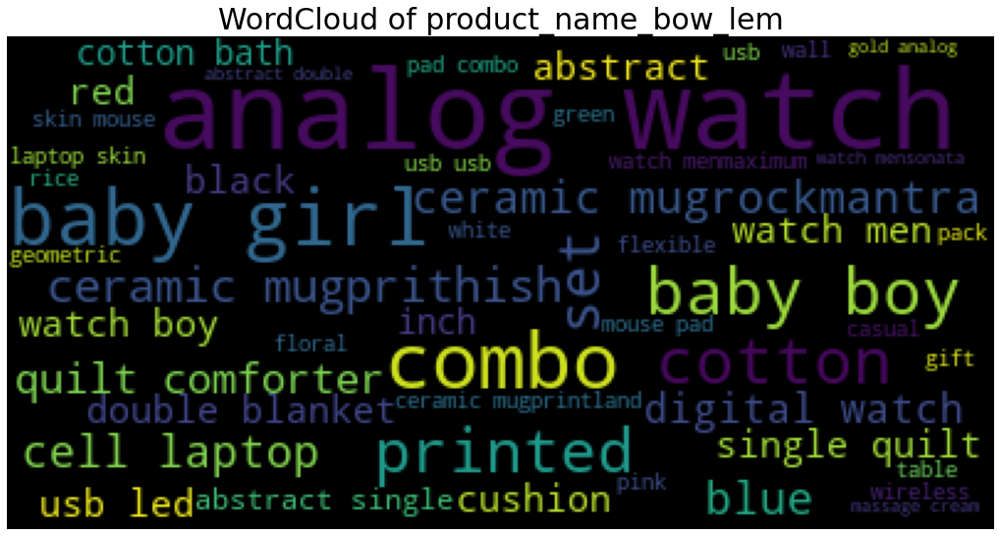

In [27]:
# Display wordcloud of 'product_name_bow_lem' feature
plt.figure(figsize = (18,10))
text = data['product_name_bow_lem'].sum()
wordcloud = WordCloud(background_color = 'black',
                      max_words = 50,
                      min_font_size = 6,
                      stopwords = None).generate(text)
plt.title('WordCloud of product_name_bow_lem', size = 30)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

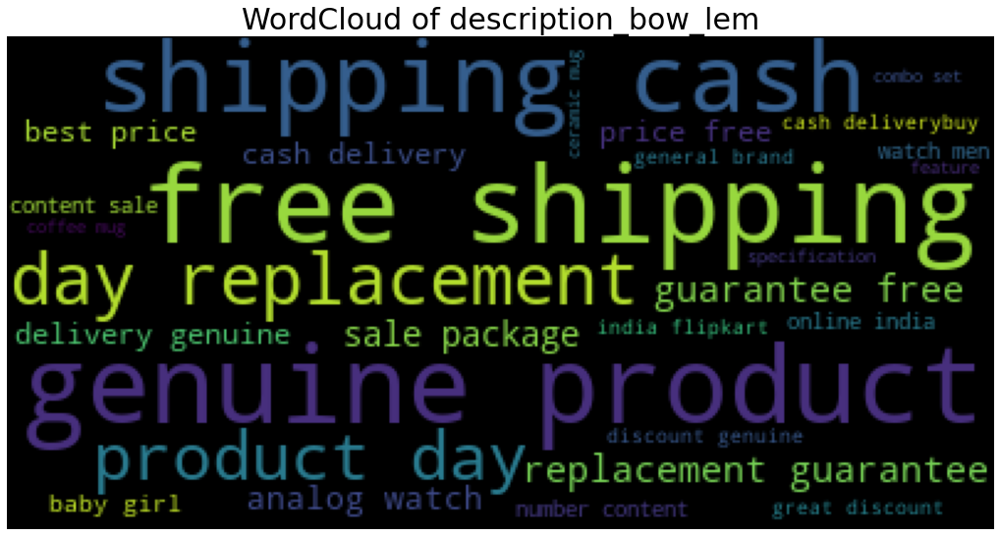

In [28]:
# Display wordcloud of 'description_bow_lem' feature
plt.figure(figsize = (18,10))
text = data['description_bow_lem'].sum()
wordcloud = WordCloud(background_color = 'black', 
                        max_words = 50, 
                        min_font_size = 6, 
                        stopwords = None).generate(text)
plt.title('WordCloud of description_bow_lem', size = 30)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

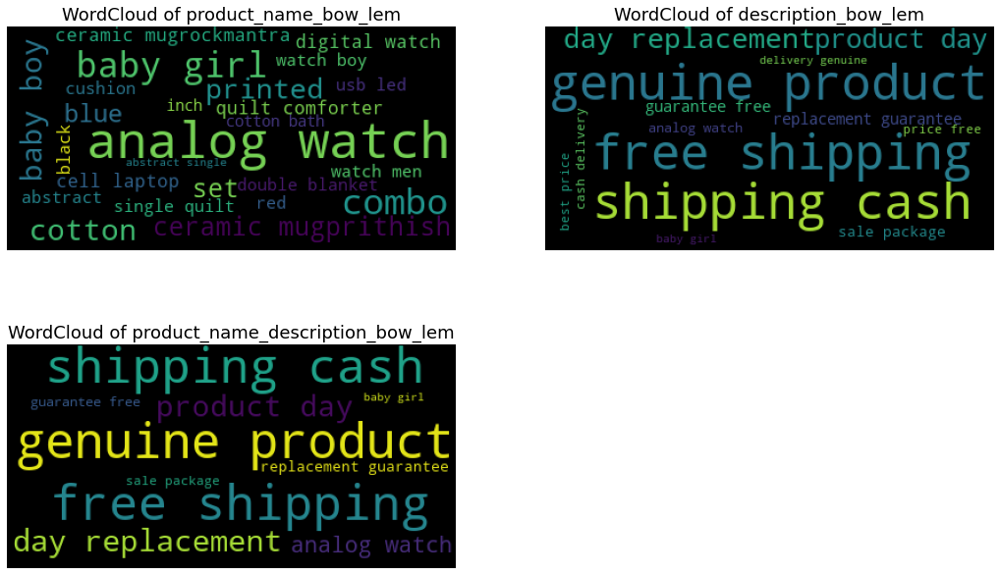

In [29]:
# Compare wordclouds of product_name_bow_lem, description_bow_lem & product_name_description_bow_lem

# Create list of features
list_feat_comp = ['product_name_bow_lem', 'description_bow_lem', 
                  'product_name_description_bow_lem']

# Apply function 'compare_wordclouds' to the above list of features
compare_wordclouds(list_feat_comp)

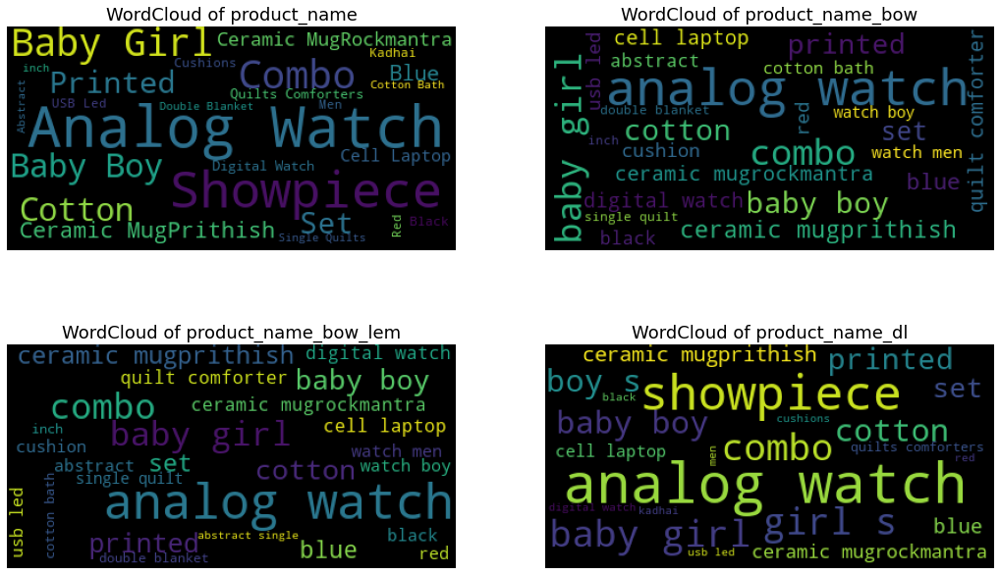

In [30]:
# Comparison of wordclouds of product_name, product_name_bow, product_name_bow_lem & product_name_dl

# Create list of features
list_feat_comp = ['product_name', 'product_name_bow', 
                  'product_name_bow_lem', 'product_name_dl']

# Apply function 'compare_wordclouds' to the above list of features
compare_wordclouds(list_feat_comp)

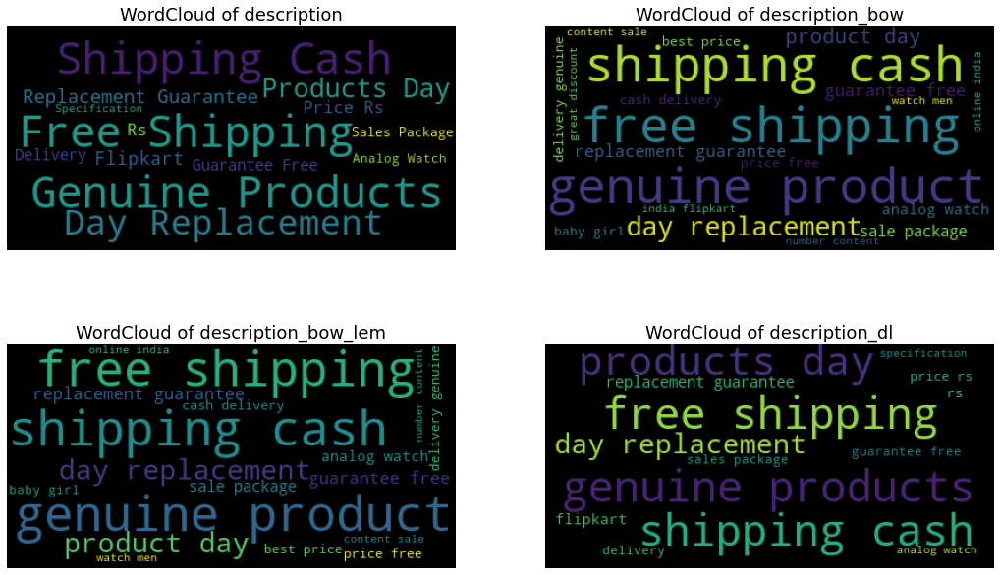

In [31]:
# Comparison of wordclouds of description, description_bow, description_bow_lem & description_dl

# Create list of features
list_feat_comp = ['description', 'description_bow', 
                  'description_bow_lem', 'description_dl']

# Apply function 'compare_wordclouds' to the above list of features
compare_wordclouds(list_feat_comp)

In [32]:
# Create a dataframe for each first_category
# in order to compare wordclouds of different categorie
data_home_furn = data.loc[data['first_category'] == 'Home Furnishing']
data_baby = data.loc[data['first_category'] == 'Baby Care']
data_watches = data.loc[data['first_category'] == 'Watches']
data_home_decor = data.loc[data['first_category'] == 'Home Decor & Festive Needs']
data_kitchen = data.loc[data['first_category'] == 'Kitchen & Dining']
data_beauty = data.loc[data['first_category'] == 'Beauty and Personal Care']
data_computers = data.loc[data['first_category'] == 'Computers']

In [33]:
# Create function to compare wordclouds from different categories (column 'product_name_bow_lem')
def compare_categories_product_name_wordclouds(list_feat, list_cat):
    plt.figure(figsize = (18,12))
    plt.subplots_adjust(top = 1.5)

    for index, data_cat, cat in zip(list(range(7)), list_data_comp, list_1st_cat):    
        text = data_cat['product_name_bow_lem'].sum()
        plt.subplot(4,2,index+1)
        wordcloud = WordCloud(background_color = 'black', 
                              max_words = 30,
                              min_font_size = 10, 
                              stopwords = None,
                              include_numbers = True).generate(text)
        plt.imshow(wordcloud)
        plt.title(f'WordCloud of product_name_bow_lem for {cat}', size = 15)
        plt.axis("off")

    plt.show()

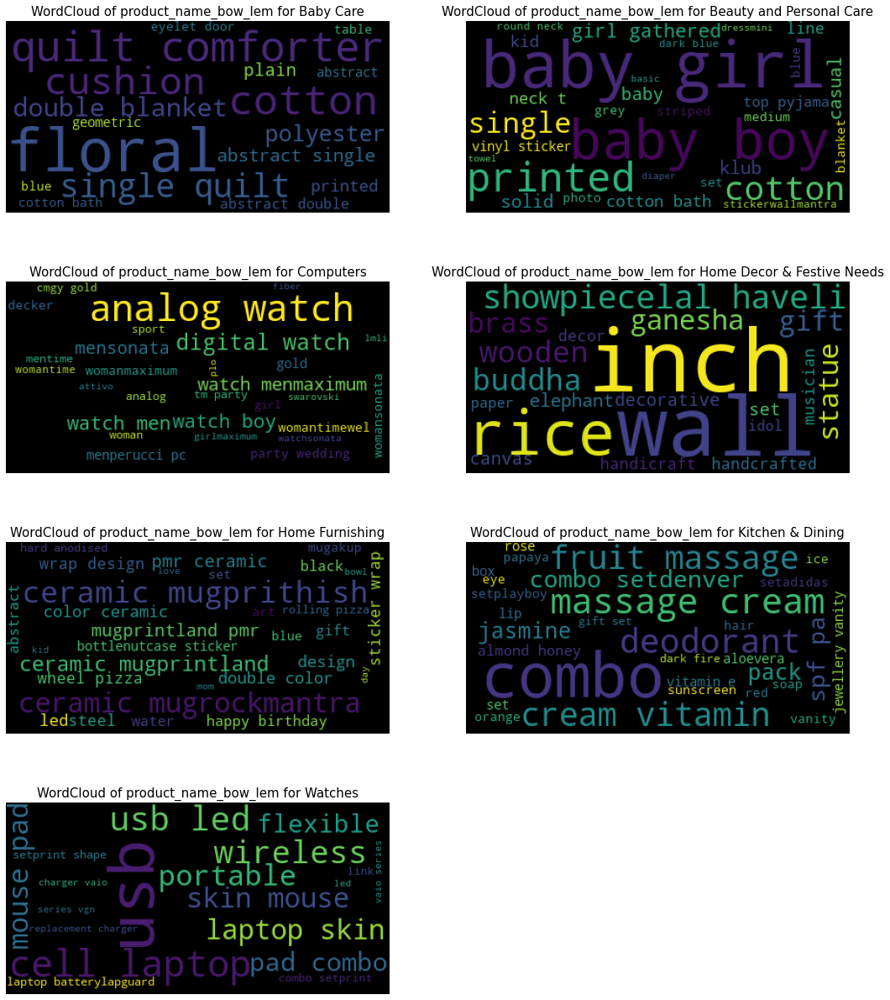

In [34]:
# Comparison of wordclouds of product_name_bow_lem for different categories

# Create list of dataframe
list_data_comp = [data_home_furn, data_baby, data_watches, data_home_decor,
                 data_kitchen, data_beauty, data_computers]

# Apply function 'compare_categories_product_name_wordclouds' to the above list of dataframes
compare_categories_product_name_wordclouds(list_data_comp, list_1st_cat)

In [35]:
# Create function to compare wordclouds from different categories (column 'description_bow_lem')
def compare_categories_description_wordclouds(list_feat, list_cat):
    plt.figure(figsize = (18,12))
    plt.subplots_adjust(top = 1.5)

    for index, data_cat, cat in zip(list(range(7)), list_data_comp, list_1st_cat):    
        text = data_cat['description_bow_lem'].sum()
        plt.subplot(4,2,index+1)
        wordcloud = WordCloud(background_color = 'black', 
                              max_words = 30,
                              min_font_size = 10, 
                              stopwords = None,
                              include_numbers = True).generate(text)
        plt.imshow(wordcloud)
        plt.title(f'WordCloud of description_bow_lem for {cat}', size = 15)
        plt.axis("off")

    plt.show()

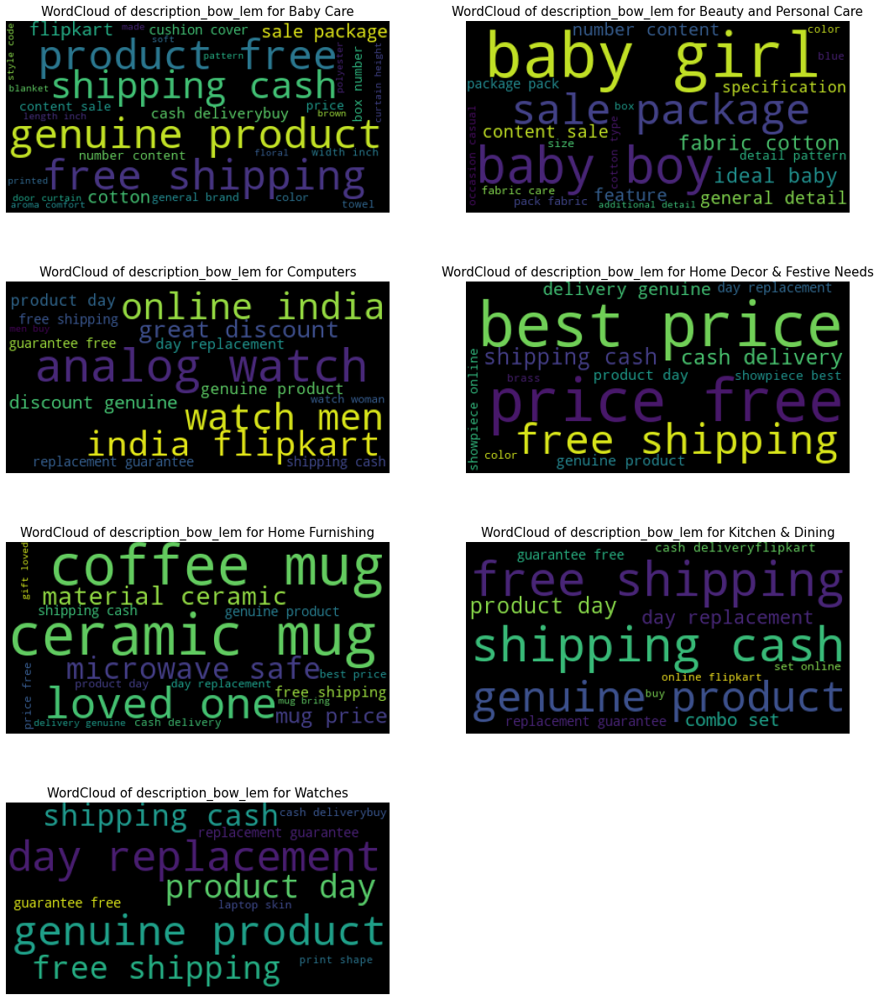

In [36]:
# Comparison of wordclouds of description_bow_lem for different categories

# Create list of dataframe
list_data_comp = [data_home_furn, data_baby, data_watches, data_home_decor,
                 data_kitchen, data_beauty, data_computers]

# Apply function 'compare_categories_description_wordclouds' to the above list of dataframes
compare_categories_description_wordclouds(list_data_comp, list_1st_cat)

### LDA + CountVectorizer on cleaned descriptions

In [37]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF

In [38]:
# Create model
tf_vectorizer = CountVectorizer(max_df = 0.95,
                                min_df = 5,
                                stop_words = 'english')

# Create features from model and 'description'
tf = tf_vectorizer.fit_transform(data['description_bow_lem'])

In [39]:
# Number of predicted topics for LDA model
n_topics = 10

# Create LDA model
lda = LatentDirichletAllocation(n_components = n_topics,
                                max_iter = 5,
                                learning_method = 'online',
                                learning_offset = 50,
                                random_state = 0)

# fit lda model on features (created with CountVectorizer model)
lda.fit(tf)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          max_iter=5, random_state=0)

In [40]:
# Create function to print topics predicted by CountVectorizer/lda model
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print ("Topic %d:" % (topic_idx))
        print (" ".join([feature_names[i]
                       for i in topic.argsort()[:-no_top_words -1:-1]]))

# Display topics
display_topics(lda, tf_vectorizer.get_feature_names(), 10)

Topic 0:
steel bottle water price stainless product pack pot eye shampoo
Topic 1:
polyester eyelet quality mug curtain aroma comfort door designed design
Topic 2:
skin print combo set shape inch warranty multicolor laptop pad
Topic 3:
product free buy delivery genuine cash shipping day replacement guarantee
Topic 4:
laptop usb light mouse pad led power easy model flexible
Topic 5:
baby cotton fabric girl color general specification feature package sale
Topic 6:
jewellery apple kid pyjama set vanity mom box wood case
Topic 7:
feature sticker material wall design specification pack color type box
Topic 8:
warranty adapter bowl product replacement vaio vgn power laptop charger
Topic 9:
mug coffee tea home ceramic perfect look printland add stylish


- Topic 0 : Beauty & Personnal Care
- Topic 1 : Kitchen & Dining / Home Decor & Festive Needs
- Topic 2 : Computers
- Topic 3 : not a category -> payment, delivery, guarantee
- Topic 4 : Computers
- Topic 5 : Baby Care
- Topic 6 : Baby Care
- Topic 7 : Home Furnishing / Home Decor & Festive Needs
- Topic 8 : Computers
- Topic 9 : Kitchen & Dining

### LDA + Tf-idf on cleaned descriptions

In [41]:
# create bag of words (Tf-idf) for 'description' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=5)
# Create features from model and 'description' feature
tfidf = ctf.fit_transform(data['description_bow_lem'])

In [42]:
# Number of predicted topics for LDA model
n_topics = 10

# Create lda model
lda = LatentDirichletAllocation(n_components = n_topics,
                                max_iter = 5,
                                learning_method = 'online',
                                learning_offset = 50,
                                random_state = 0)

# fit lda model on features (created with TfidfVectorizer model)
lda.fit(tfidf)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          max_iter=5, random_state=0)

In [43]:
display_topics(lda, ctf.get_feature_names(), 10)

Topic 0:
taste excellent assorted night beautifully crafted watch aluminium red metal
Topic 1:
adapter battery vgn vaio laptop warranty quality smartpro cre power
Topic 2:
cover cushion duvet sofa quilt velvet sapatos polish lipstick home
Topic 3:
com flipkart genuine cash shipping delivery buy free product guarantee
Topic 4:
pizza cutter wheel otg phone fan smart android usb steel
Topic 5:
oil rajasthani help carved stand elephant mobile traditional painting property
Topic 6:
nutcase bottle wrap sticker water quirky harness attitude reflect playful
Topic 7:
baby cotton girl fabric ideal dress pack specification boy general
Topic 8:
laptop skin warranty shape design eyelet polyester print feature inch
Topic 9:
mug ceramic coffee prithish tea perfect printland gift happy bring


- Topic 0 : Home Decor & Festive Needs
- Topic 1 : Computers
- Topic 2 : Home Furnishing
- Topic 3 : not a category -> payment, delivery, guarantee
- Topic 4 : Kitchen & Dining / Computers
- Topic 5 : Home Decor & Festive Needs
- Topic 6 : ?
- Topic 7 : Baby Care
- Topic 8 : Computers
- Topic 9 : Kitchen & Dining

### NMF + Tfidf on cleaned description

In [44]:
# Alternative : NMF (Negative Matrix Factorization)

# NMF is able to use tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95,
                                   min_df=5,
                                   stop_words='english')

# get tf_idf features from tfidf_vectorizer model
tfidf = tfidf_vectorizer.fit_transform(data['description_bow_lem'])
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

# Number of predicted topics for NMF model
no_topics = 10

# Run NMF
nmf = NMF(n_components = no_topics, 
          random_state = 1, 
          alpha = .1, 
          l1_ratio = .5, 
          init = 'nndsvd')
nmf.fit(tfidf)

# Display topics
no_top_words = 10
display_topics(nmf, tfidf_feature_names, no_top_words)

Topic 0:
com flipkart guarantee genuine cash shipping delivery replacement combo free
Topic 1:
watch analog men discount india great woman online dial sonata
Topic 2:
baby girl fabric dress cotton boy sleeve neck pattern ideal
Topic 3:
mug coffee ceramic prithish perfect tea printland gift bring happy
Topic 4:
showpiece best online guarantee replacement day price cash shipping genuine
Topic 5:
inch pack warranty color feature box model laptop type number
Topic 6:
abstract blanket single double com flipkart quilt comforter buy cash
Topic 7:
rockmantra mug ceramic porcelain thrilling permanent crafting ensuring stay start
Topic 8:
usb led light hub bulb flexible port power portable fan
Topic 9:
towel bath cotton soft hand set face free genuine cash


- Topic 0 : not a category -> payment, delivery, guarantee
- Topic 1 : Watches
- Topic 2 : Baby Care
- Topic 3 : Kitchen & Dining
- Topic 4 : not a category -> payment, delivery, guarantee
- Topic 5 : Computers
- Topic 6 : Home Furnishing / payment
- Topic 7 : Kitchen & Dining
- Topic 8 : Computers
- Topic 9 : Home Furnishing / payment

# Bag of word - CountVectorizer unigrams

In [38]:
# Create labels for first_category
print("catégories : ", list_1st_cat)
true_labels = true_label.tolist()
print("true_labels : ", true_labels)

catégories :  ['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']
true_labels :  [4, 0, 0, 4, 4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 4, 4, 3, 5, 5, 4, 0, 4, 0, 1, 5, 5, 5, 2, 5, 1, 5, 2, 5, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 5, 5, 0, 4, 5, 5, 5, 4, 5, 0, 0, 0, 1, 1, 4, 0, 3, 3, 0, 0, 3, 3, 5, 2, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 3, 3, 4, 4, 4, 0, 4, 4, 4, 0, 3, 0, 5, 0, 2, 3, 0, 3, 2, 4, 0, 2, 3, 1, 1, 1, 1, 3, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 3, 3, 3, 3, 5, 3, 5, 3, 3, 0, 3, 5, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 3, 5, 3, 0, 3, 3, 5, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 3, 3, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 3, 5, 3, 5, 5, 5, 3, 5, 3, 3, 3, 5, 3, 5, 3, 3, 3, 3, 5, 5, 5, 3, 3, 3, 3, 5, 5, 0, 6, 6, 6

### CountVectorizer with cleaned description column

In [39]:
# Create bag of words (CountVectorizer) for 'description_bow_lem' feature

# Create CountVectorizer model (min_df = 1)
cvect = CountVectorizer(stop_words = 'english', max_df = 0.95, min_df = 1)

# Fit CountVectorizer model on data['description_bow_lem']
feat = 'description_bow_lem'
cvect.fit(data[feat])

# Transform data['description_bow_lem'] with fit countvectorizer model
cvect_transform = cvect.transform(data[feat])
cvect_transform

<1050x4522 sparse matrix of type '<class 'numpy.int64'>'
	with 32145 stored elements in Compressed Sparse Row format>

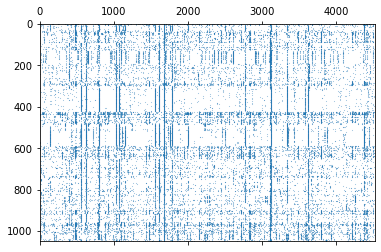

In [40]:
# Plot cvect_transform sparse matrix
plt.spy(cvect_transform, precision = 0.1, aspect = 'auto', markersize = 0.1)
plt.show()

In [41]:
# CREATE FUNCTIONS FOR DIMENSION REDUCTION, CLUSTERING AND ARI (Adjusted Rand Index) CALCULATION

# Calculate Tsne, predict clusters, calculate ARI score
def ARI_fct(features, perplexity) :
    time1 = time.time()
    # Number of labels
    num_labels = len(list_1st_cat)
    # Dimension reduction with tSNE (2 dimensions)
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    # Create features in 2 dimension
    X_tsne = tsne.fit_transform(features)
    
    # Predict clusters from tSNE-reduced features 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    # Calculate ARI score
    ARI = np.round(metrics.adjusted_rand_score(true_labels, cls.labels_),4)
    # Create new column 'cluster' in dataframe 'data'
    data['cluster'] = cls.labels_
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

# Vizualisation in 2D of true categories and clusters after tsne reduction
def TSNE_visu_fct(X_tsne, true_labels, labels, ARI) :
    fig = plt.figure(figsize=(18,7))
    
    # Display true categories in 2D
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], 
                         c=true_labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=list_1st_cat, 
              loc="best", title="Categorie", fontsize = 9)
    plt.title('Représentation des descriptions par catégories réelles')
    
    # Display clusters in 2D
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], 
                         c=labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), 
              loc="best", title="Clusters", fontsize = 10)
    plt.title('Représentation des descriptions par clusters')
    
    plt.show()
    print("ARI : ", ARI)

In [42]:
# Function to calculate ARI after tSNE with perplexity from 1 to 75
# and return maximum value and optimal perplexity
def ARI_calculation(features):
    # Calculate ARI for perplexity from 1 to 75
    ARI_list = []
    for perplexity in range(1, 76):
        ARI, X_tsne, labels = ARI_fct(features, perplexity)
        ARI_list.append(ARI)
    
    # Define maximum ARI value and optimal index and perplexity
    max_value = None
    max_idx = None

    for idx, num in enumerate(ARI_list):
        if (max_value is None or num > max_value):
            max_value = num
            max_idx = idx
            opt_perplexity = max_idx + 1

    print('Maximum value:', max_value, "At index: ", max_idx)
    print('Optimal perplexity = ', opt_perplexity)
    
    return ARI_list, opt_perplexity

In [43]:
# Function to display the confusion matrix after KMeans clustering
def conf_mat(true_labels, predicted_labels, model_name):
    conf_mat = confusion_matrix(true_labels, predicted_labels)
    data_cm = pd.DataFrame(conf_mat, 
                           index = [category for category in list_1st_cat],
                           columns = [i for i in "0123456"])
    plt.figure(figsize = (8,6))
    cmap = 'YlOrBr'
    colormap = sns.heatmap(data_cm, 
                           annot=True, 
                           annot_kws ={'size':14}, 
                           cmap=cmap, 
                           fmt='.3g')
    colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
    colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

    plt.title(f'Confusion Matrix of categories and cluster_labels \n Clustering after {model_name}',
              size = 18);

# Fonction to create confusion matrix and translate cluster_labels to categories
def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    corresp = np.argmax(conf_mat, axis = 0)
    labels = pd.Series(y_true, name = "y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']
    
# Create confusion matrix and translate cluster_labels to categories
# Then calculate accuracy and different metrics by categorie
def class_report(true_labels, predicted_labels):
    # Transform cluster_labels to categories
    labels_transform = conf_mat_transform(true_labels, predicted_labels)
    conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
    print(conf_mat)
    print()
    classification = metrics.classification_report(true_labels, 
                                                   labels_transform,
                                                   target_names = list_1st_cat, 
                                                   digits = 3)
    print(metrics.classification_report(true_labels, 
                                        labels_transform, 
                                        target_names=[category for category in list_1st_cat], 
                                        digits = 3))
    dict_class = metrics.classification_report(true_labels,
                                               labels_transform,
                                               target_names=[category for category in list_1st_cat],
                                               digits = 3,
                                               output_dict = True)
    # Create dataframe with categories and metrics
    data_metrics = round(pd.DataFrame.from_dict(dict_class, 
                                                orient='columns').T.iloc[0:7,0:3], 
                         3)
    
    return dict_class, data_metrics

# Display metrics as barplots
def display_metrics(dataframe, model_name):
    # set width of bar
    barWidth = 0.25
    fig = plt.subplots(figsize =(18, 8))
     # set height of bar
    precision = dataframe['precision'].values
    recall = dataframe['recall'].values
    f1_score = dataframe['f1-score'].values
     # Set position of bar on X axis
    br1 = np.arange(len(precision))
    br2 = [x + barWidth for x in br1]
    br3 = [x + barWidth for x in br2]
     # Make the plot
    rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
                     edgecolor ='grey', label ='precision')
    rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
                     edgecolor ='grey', label ='recall')
    rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
                     edgecolor ='grey', label ='f1_score')
     # Adding Xticks
    plt.xlabel('Category', fontweight ='bold', fontsize = 18)
    plt.ylabel('Metric scores', fontweight ='bold', fontsize = 18)
    plt.xticks([r + barWidth for r in range(len(precision))],
               list_1st_cat,
               size = 15,
               rotation = 45)
    plt.yticks(size = 15)
    plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
    plt.title(f'Comparison of metrics for different good categories after {model_name} and KMeans clustering',
             size = 20)
    plt.show()

In [1396]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'description_bow_lem' feature
ARI_description, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.102 time :  7.0
ARI :  0.2299 time :  7.0
ARI :  0.3026 time :  7.0
ARI :  0.3664 time :  8.0
ARI :  0.3425 time :  8.0
ARI :  0.3176 time :  8.0
ARI :  0.3663 time :  8.0
ARI :  0.3466 time :  8.0
ARI :  0.3776 time :  7.0
ARI :  0.3778 time :  8.0
ARI :  0.4077 time :  8.0
ARI :  0.4631 time :  8.0
ARI :  0.4052 time :  8.0
ARI :  0.3998 time :  8.0
ARI :  0.4112 time :  8.0
ARI :  0.4184 time :  8.0
ARI :  0.4239 time :  8.0
ARI :  0.4286 time :  8.0
ARI :  0.4194 time :  8.0
ARI :  0.4053 time :  9.0
ARI :  0.396 time :  8.0
ARI :  0.44 time :  10.0
ARI :  0.3839 time :  9.0
ARI :  0.388 time :  9.0
ARI :  0.387 time :  9.0
ARI :  0.4112 time :  9.0
ARI :  0.391 time :  10.0
ARI :  0.3998 time :  9.0
ARI :  0.3632 time :  10.0
ARI :  0.3492 time :  9.0
ARI :  0.3695 time :  9.0
ARI :  0.3901 time :  10.0
ARI :  0.349 time :  10.0
ARI :  0.3922 time :  11.0
ARI :  0.3765 time :  13.0
ARI :  0.3866 time :  11.0
ARI :  0.3747 time :  10.0
ARI :  0.3674 time :  10.0
ARI :  0.3

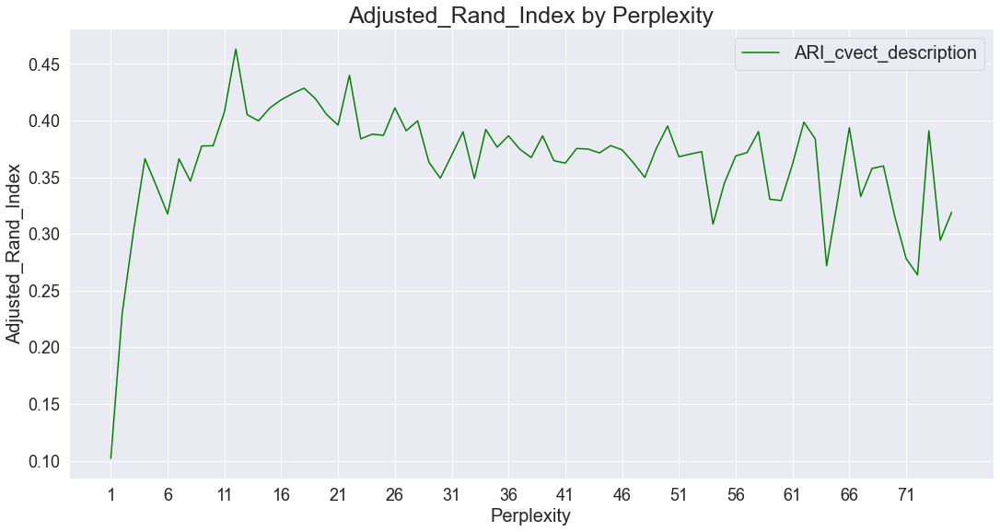

In [54]:
# Plot ARI by perplexity for CountVectorizer for 'description_bow_lem' feature
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_description

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_cvect_description')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 5.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4631 time :  8.0


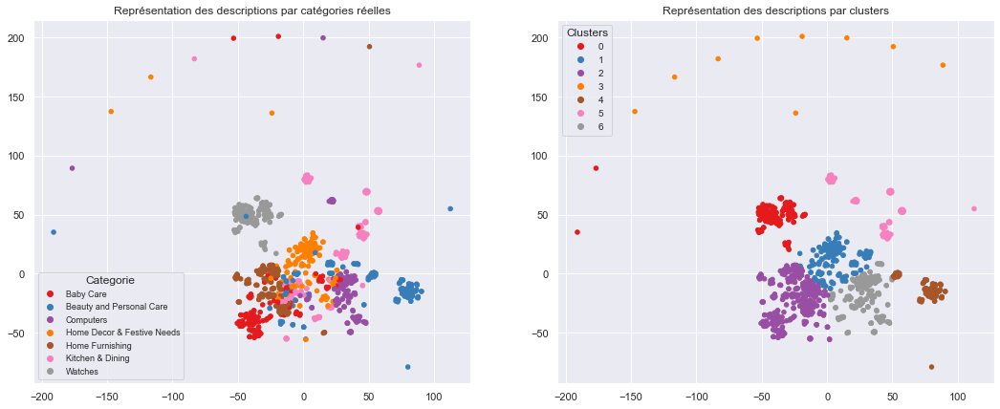

ARI :  0.4631


In [46]:
sns.set_theme()

# Execute CountVectorizer model with opt_perplexity for 'description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(cvect_transform, 12)

# tSNE vizualisation in 2D
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [47]:
# Count the number of products belonging to different categories in each cluster
data.groupby("cluster").count()['first_category']

cluster
0    152
1    173
2    346
3      9
4     84
5     87
6    199
Name: first_category, dtype: int64

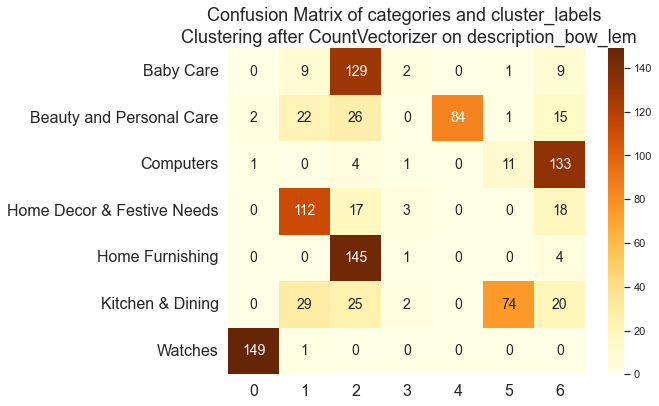

In [48]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'CountVectorizer on description_bow_lem')

In [49]:
# Calculate metrics by category and accuracy
dict_classification, metrics_cvect_des = class_report(true_labels, labels)

[[  0   0   9  11 129   1   0]
 [  0  84  15  22  26   1   2]
 [  0   0 133   1   4  11   1]
 [  0   0  18 115  17   0   0]
 [  0   0   4   1 145   0   0]
 [  0   0  20  31  25  74   0]
 [  0   0   0   1   0   0 149]]

                            precision    recall  f1-score   support

                 Baby Care      0.000     0.000     0.000       150
  Beauty and Personal Care      1.000     0.560     0.718       150
                 Computers      0.668     0.887     0.762       150
Home Decor & Festive Needs      0.632     0.767     0.693       150
           Home Furnishing      0.419     0.967     0.585       150
          Kitchen & Dining      0.851     0.493     0.624       150
                   Watches      0.980     0.993     0.987       150

                  accuracy                          0.667      1050
                 macro avg      0.650     0.667     0.624      1050
              weighted avg      0.650     0.667     0.624      1050



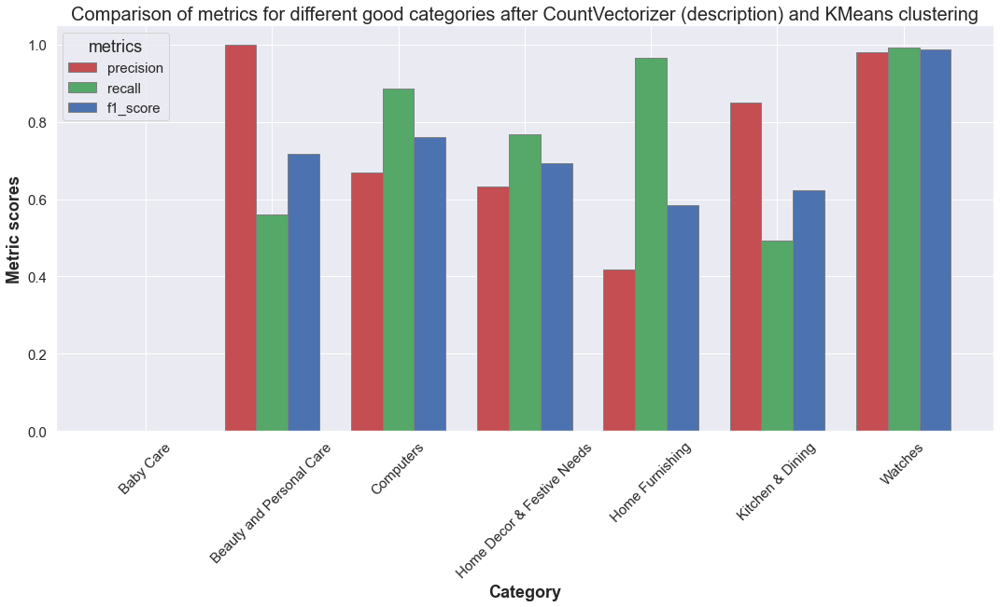

In [50]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_cvect_des, 
                model_name = 'CountVectorizer (description)')

### CountVectorizer on cleaned product name column

In [51]:
# create bag of words (CountVectorizer) for 'product_name_bow_lem' feature
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

# Fit on 'product_name_bow_lem' feature
feat = 'product_name_bow_lem'
cvect.fit(data[feat])

# Create features from 'product_name_bow_lem'
cvect_transform = cvect.transform(data[feat])
cvect_transform

<1050x1899 sparse matrix of type '<class 'numpy.int64'>'
	with 6097 stored elements in Compressed Sparse Row format>

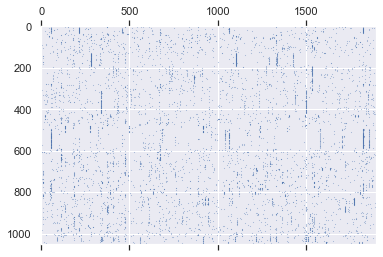

In [52]:
# Plot cvect_transform sparse matrix
plt.spy(cvect_transform, precision = 0.1, aspect = 'auto', markersize = 0.1)
plt.show()

In [78]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'product_name_bow_lem' feature
ARI_product_name, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.1179 time :  5.0
ARI :  0.2379 time :  6.0
ARI :  0.3113 time :  6.0
ARI :  0.3226 time :  6.0
ARI :  0.2749 time :  6.0
ARI :  0.2967 time :  5.0
ARI :  0.3257 time :  6.0
ARI :  0.3701 time :  6.0
ARI :  0.3304 time :  5.0
ARI :  0.3325 time :  6.0
ARI :  0.3845 time :  5.0
ARI :  0.3443 time :  5.0
ARI :  0.3919 time :  6.0
ARI :  0.3048 time :  5.0
ARI :  0.4123 time :  6.0
ARI :  0.3798 time :  6.0
ARI :  0.4024 time :  6.0
ARI :  0.3788 time :  6.0
ARI :  0.3561 time :  7.0
ARI :  0.3849 time :  7.0
ARI :  0.3536 time :  7.0
ARI :  0.3893 time :  7.0
ARI :  0.3937 time :  7.0
ARI :  0.3638 time :  6.0
ARI :  0.3246 time :  7.0
ARI :  0.3865 time :  8.0
ARI :  0.3886 time :  7.0
ARI :  0.3541 time :  7.0
ARI :  0.391 time :  7.0
ARI :  0.3885 time :  7.0
ARI :  0.3864 time :  7.0
ARI :  0.3931 time :  7.0
ARI :  0.4011 time :  7.0
ARI :  0.3453 time :  9.0
ARI :  0.3474 time :  8.0
ARI :  0.3619 time :  8.0
ARI :  0.3906 time :  7.0
ARI :  0.3766 time :  8.0
ARI :  0.3584

ARI :  0.4123 time :  7.0


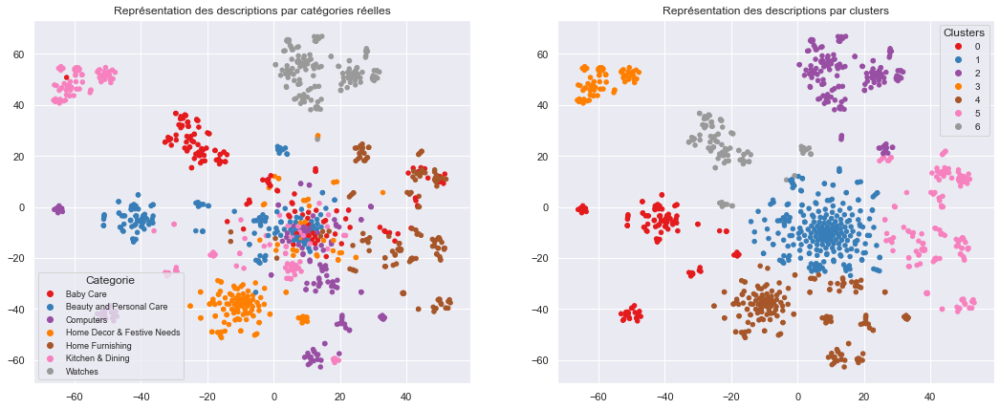

ARI :  0.4123


In [53]:
# Execute CountVectorizer model with opt_perplexity for 'description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(cvect_transform, 15)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 79  46   0   0  24   1   0]
 [ 19 130   0   1   0   0   0]
 [  0  81   0  64   5   0   0]
 [  0  33   0 113   1   0   3]
 [  0  16   0   0 122   0  12]
 [  0  63   0  14   0  73   0]
 [  0   0   0   0   0   0 150]]

                            precision    recall  f1-score   support

                 Baby Care      0.806     0.527     0.637       150
  Beauty and Personal Care      0.352     0.867     0.501       150
                 Computers      0.000     0.000     0.000       150
Home Decor & Festive Needs      0.589     0.753     0.661       150
           Home Furnishing      0.803     0.813     0.808       150
          Kitchen & Dining      0.986     0.487     0.652       150
                   Watches      0.909     1.000     0.952       150

                  accuracy                          0.635      1050
                 macro avg      0.635     0.635     0.602      1050
              weighted avg      0.635     0.635     0.602      1050



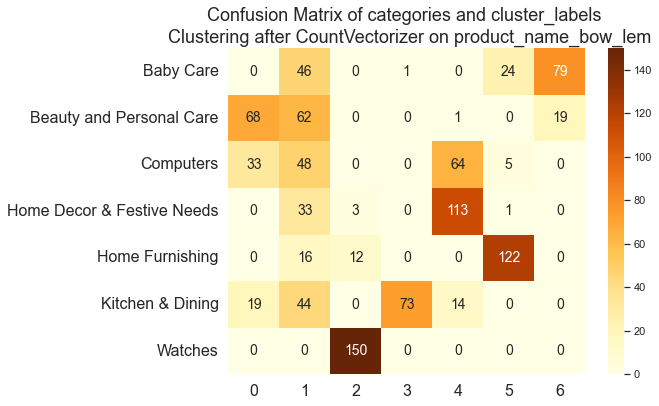

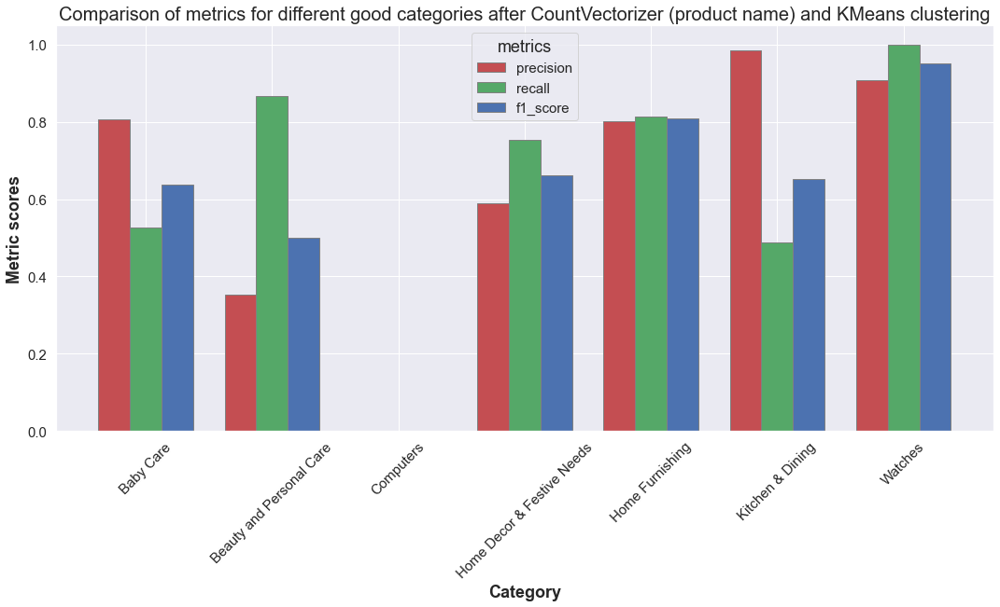

In [54]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'CountVectorizer on product_name_bow_lem')

# Calculate metrics by category and accuracy
dict_classification, metrics_cvect_prod = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_cvect_prod, 
                model_name = 'CountVectorizer (product name)')

### CountVectorizer on cleaned product name description column

In [55]:
# create bag of words (CountVectorizer) for 'product_name_bow_lem' feature
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

# Fit model on 'product_name_description_bow_lem' feature
feat = 'product_name_description_bow_lem'
cvect.fit(data[feat])

# Create features from 'product_name_description_bow_lem'
cvect_transform = cvect.transform(data[feat])
cvect_transform

<1050x4957 sparse matrix of type '<class 'numpy.int64'>'
	with 32565 stored elements in Compressed Sparse Row format>

In [95]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'product_name_description_bow_lem' feature
ARI_product_name_description, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.1003 time :  6.0
ARI :  0.24 time :  6.0
ARI :  0.3114 time :  6.0
ARI :  0.3041 time :  6.0
ARI :  0.3686 time :  6.0
ARI :  0.3522 time :  6.0
ARI :  0.365 time :  6.0
ARI :  0.4079 time :  6.0
ARI :  0.4723 time :  6.0
ARI :  0.4411 time :  6.0
ARI :  0.4265 time :  6.0
ARI :  0.3943 time :  6.0
ARI :  0.3912 time :  6.0
ARI :  0.4235 time :  6.0
ARI :  0.4458 time :  6.0
ARI :  0.4274 time :  6.0
ARI :  0.4377 time :  7.0
ARI :  0.4309 time :  6.0
ARI :  0.4238 time :  6.0
ARI :  0.4303 time :  6.0
ARI :  0.3866 time :  6.0
ARI :  0.3838 time :  7.0
ARI :  0.3819 time :  7.0
ARI :  0.3591 time :  8.0
ARI :  0.3774 time :  8.0
ARI :  0.4202 time :  8.0
ARI :  0.4143 time :  8.0
ARI :  0.4121 time :  8.0
ARI :  0.4326 time :  8.0
ARI :  0.3701 time :  8.0
ARI :  0.3853 time :  8.0
ARI :  0.365 time :  8.0
ARI :  0.3655 time :  9.0
ARI :  0.3893 time :  10.0
ARI :  0.4213 time :  10.0
ARI :  0.3516 time :  11.0
ARI :  0.3636 time :  10.0
ARI :  0.3754 time :  9.0
ARI :  0.393

ARI :  0.4723 time :  6.0


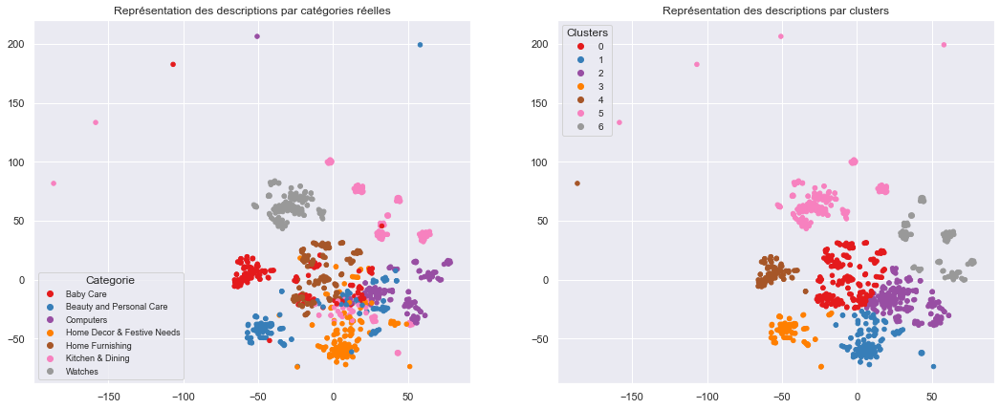

ARI :  0.4723


In [56]:
# Execute CountVectorizer model with opt_perplexity for 'produc_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(cvect_transform, 9)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 84   1  23   0  40   1   1]
 [  3  79  42  10  13   2   1]
 [  0   0  99   0   0  50   1]
 [  0   2  19 111  18   0   0]
 [  0   5   0   0 145   0   0]
 [  1   0  29  17   6  64  33]
 [  0   0   0   0   0   0 150]]

                            precision    recall  f1-score   support

                 Baby Care      0.955     0.560     0.706       150
  Beauty and Personal Care      0.908     0.527     0.667       150
                 Computers      0.467     0.660     0.547       150
Home Decor & Festive Needs      0.804     0.740     0.771       150
           Home Furnishing      0.653     0.967     0.780       150
          Kitchen & Dining      0.547     0.427     0.479       150
                   Watches      0.806     1.000     0.893       150

                  accuracy                          0.697      1050
                 macro avg      0.734     0.697     0.692      1050
              weighted avg      0.734     0.697     0.692      1050



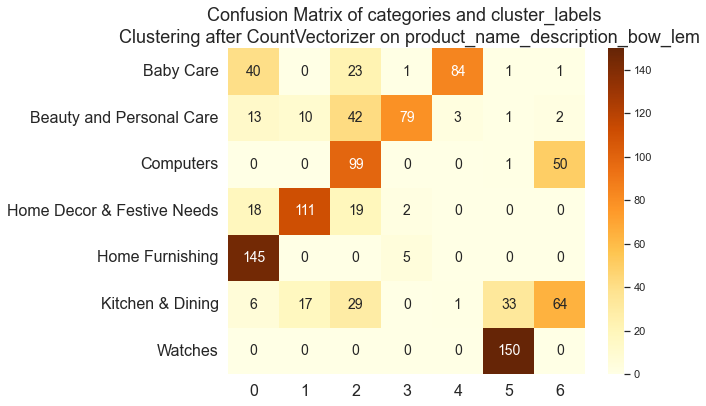

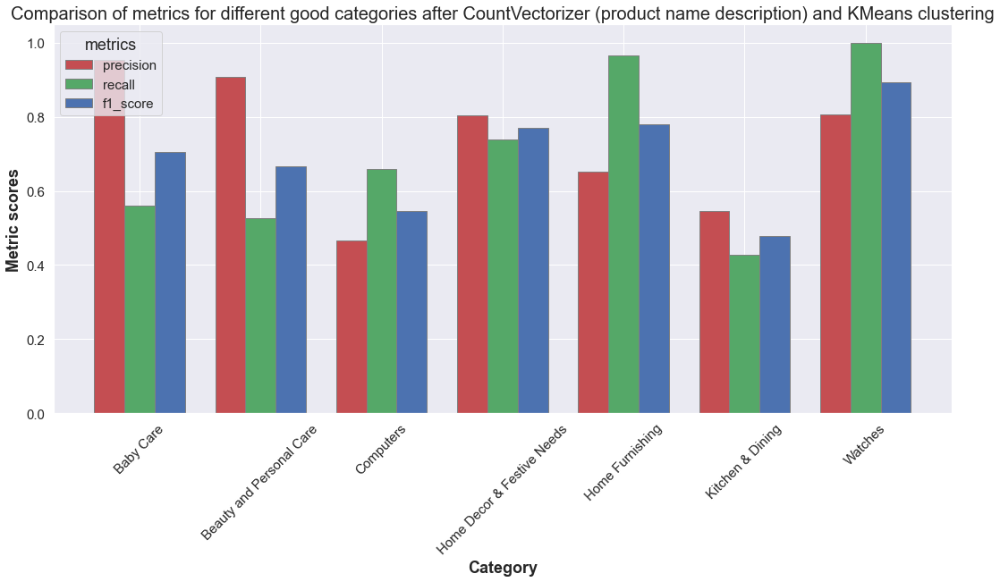

In [57]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'CountVectorizer on product_name_description_bow_lem')

# Calculate metrics by category and accuracy
dict_classification, metrics_cvect_prod_des = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_cvect_prod_des, 
                model_name = 'CountVectorizer (product name description)')

### CountVectorizer on cleaned product name description column fit on product name

In [58]:
# create bag of words (CountVectorizer) for 'product_name_description_bow_lem' feature
# fit on 'product_name_bow_lem'
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

# Fit model on 'product_name_bow_lem' feature
cvect.fit(data['product_name_bow_lem'])

# Create features from 'product_name_description_bow_lem'
cvect_transform = cvect.transform(data['product_name_description_bow_lem'])
cvect_transform

<1050x1899 sparse matrix of type '<class 'numpy.int64'>'
	with 15645 stored elements in Compressed Sparse Row format>

In [106]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'product_name_description_bow_lem' feature
# fit on product_name_bow_lem
ARI_product_name_description_fit_prod, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.0955 time :  6.0
ARI :  0.3074 time :  6.0
ARI :  0.3664 time :  5.0
ARI :  0.3489 time :  6.0
ARI :  0.3457 time :  6.0
ARI :  0.3891 time :  6.0
ARI :  0.3903 time :  6.0
ARI :  0.3651 time :  6.0
ARI :  0.4305 time :  6.0
ARI :  0.4818 time :  6.0
ARI :  0.4259 time :  6.0
ARI :  0.466 time :  6.0
ARI :  0.3801 time :  6.0
ARI :  0.3816 time :  6.0
ARI :  0.3673 time :  7.0
ARI :  0.4208 time :  7.0
ARI :  0.4179 time :  7.0
ARI :  0.408 time :  7.0
ARI :  0.4051 time :  7.0
ARI :  0.4052 time :  7.0
ARI :  0.4044 time :  8.0
ARI :  0.3908 time :  7.0
ARI :  0.4115 time :  8.0
ARI :  0.3886 time :  8.0
ARI :  0.3975 time :  8.0
ARI :  0.3759 time :  8.0
ARI :  0.4313 time :  9.0
ARI :  0.3888 time :  8.0
ARI :  0.3893 time :  9.0
ARI :  0.4061 time :  9.0
ARI :  0.396 time :  9.0
ARI :  0.3854 time :  8.0
ARI :  0.3993 time :  8.0
ARI :  0.4209 time :  9.0
ARI :  0.4247 time :  9.0
ARI :  0.4228 time :  9.0
ARI :  0.4225 time :  9.0
ARI :  0.4137 time :  9.0
ARI :  0.3442 t

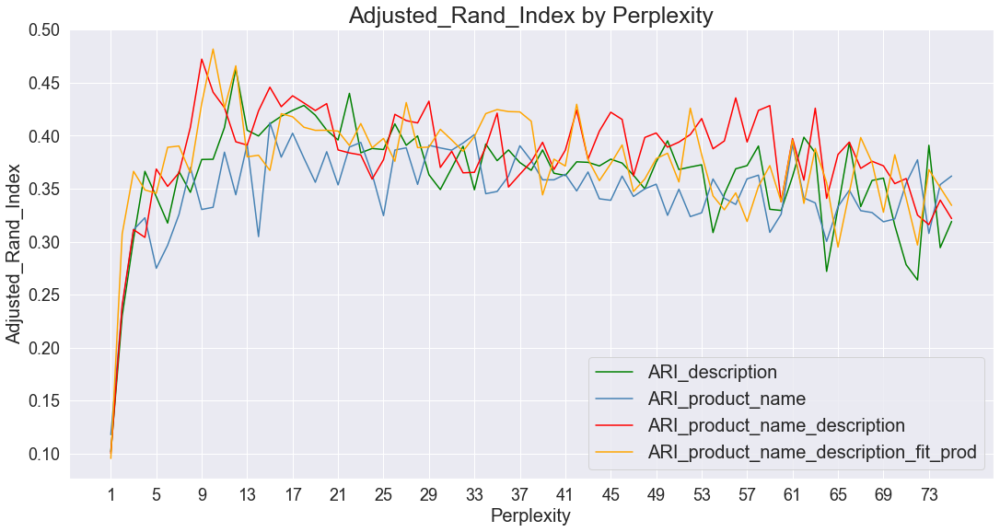

In [109]:
# Plot ARI by perplexity for CountVectorizer
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_description
y2 = ARI_product_name
y3 = ARI_product_name_description
y4 = ARI_product_name_description_fit_prod

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_description')
ax.plot(x, y2, color = 'steelblue', label = 'ARI_product_name')
ax.plot(x, y3, color = 'red', label = 'ARI_product_name_description')
ax.plot(x, y4, color = 'orange', label = 'ARI_product_name_description_fit_prod')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4818 time :  6.0


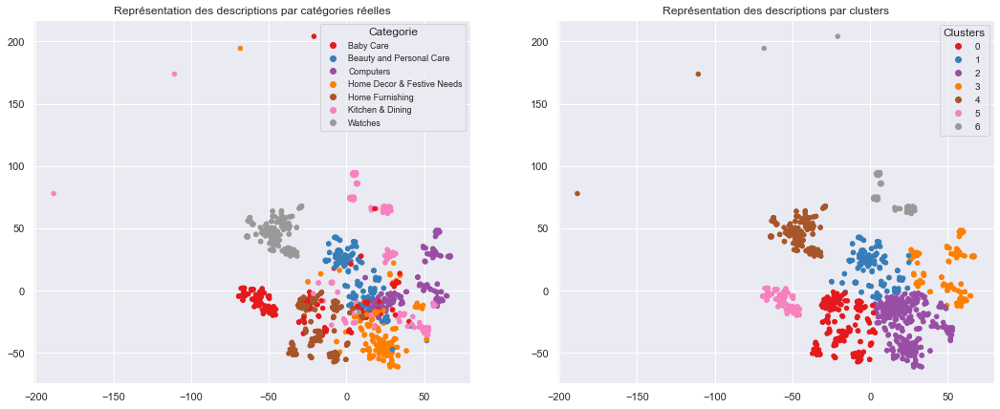

ARI :  0.4818


In [59]:
# Execute CountVectorizer model with opt_perplexity for 'product_name_description_bow_lem' feature
# fit on product name
ARI, X_tsne, labels = ARI_fct(cvect_transform, 10)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 80   3   8  18  39   2   0]
 [  0 122   0  27   1   0   0]
 [  0   2  84  64   0   0   0]
 [  0   4  10 130   5   1   0]
 [  0   2   0   9 139   0   0]
 [  0  12  24  49   9  54   2]
 [  0   0   0   1   0   0 149]]

                            precision    recall  f1-score   support

                 Baby Care      1.000     0.533     0.696       150
  Beauty and Personal Care      0.841     0.813     0.827       150
                 Computers      0.667     0.560     0.609       150
Home Decor & Festive Needs      0.436     0.867     0.580       150
           Home Furnishing      0.720     0.927     0.810       150
          Kitchen & Dining      0.947     0.360     0.522       150
                   Watches      0.987     0.993     0.990       150

                  accuracy                          0.722      1050
                 macro avg      0.800     0.722     0.719      1050
              weighted avg      0.800     0.722     0.719      1050



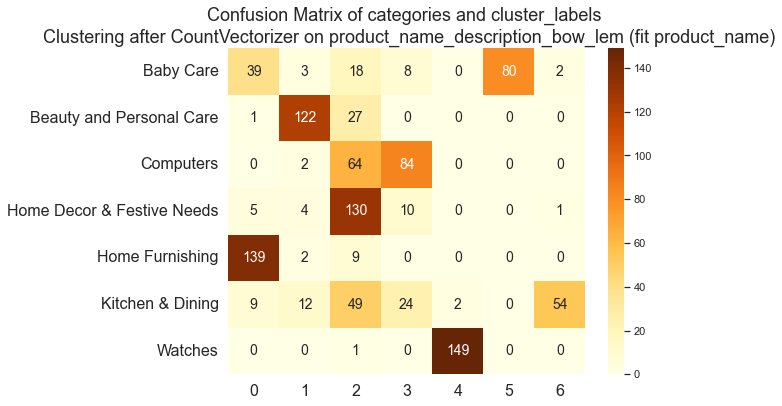

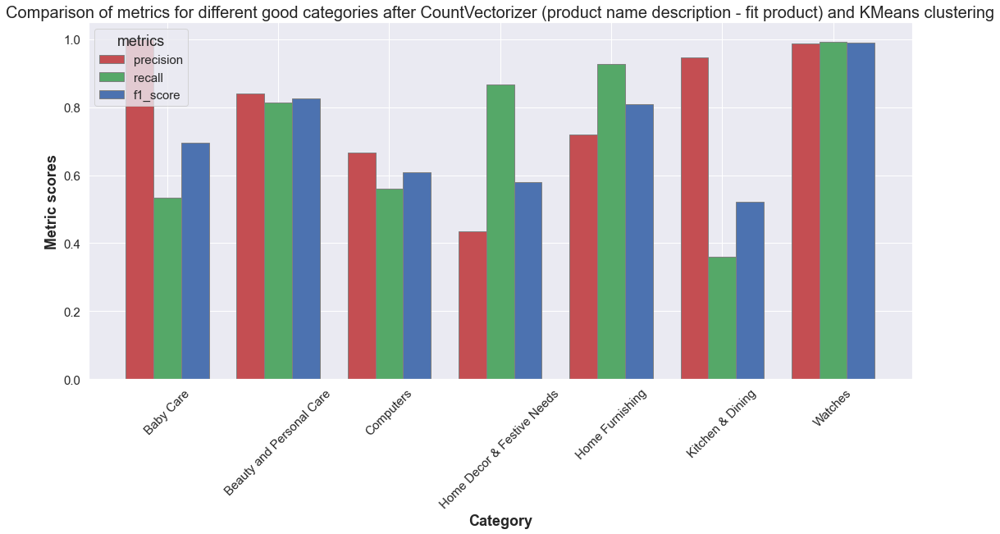

In [60]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'CountVectorizer on product_name_description_bow_lem (fit product_name)')

# Calculate metrics by category and accuracy
dict_classification, metrics_cvect_prod_des_fit_prod = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_cvect_prod_des_fit_prod, 
                model_name = 'CountVectorizer (product name description - fit product)')

### CountVectorizer on cleaned product name description column fit on product name (changing min_df)

In [61]:
# create bag of words (CountVectorizer) for 'product_name_description_bow_lem' feature
# fit on 'product_name_bow_lem'

# Changing min_df -> min_df = 2
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=2)

cvect.fit(data['product_name_bow_lem'])

cvect_transform = cvect.transform(data['product_name_description_bow_lem'])
cvect_transform

<1050x677 sparse matrix of type '<class 'numpy.int64'>'
	with 11903 stored elements in Compressed Sparse Row format>

In [62]:
len(cvect.stop_words_)

1222

-> There is 1222 additionnal stopwords that are ignored when min_df = 2

In [124]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'product_name_description_bow_lem' feature
# fit on product_name_bow_lem
ARI_product_name_description_fit_prod_mindf_2, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.093 time :  5.0
ARI :  0.2505 time :  6.0
ARI :  0.2888 time :  6.0
ARI :  0.3648 time :  7.0
ARI :  0.469 time :  5.0
ARI :  0.4859 time :  6.0
ARI :  0.4311 time :  6.0
ARI :  0.3969 time :  5.0
ARI :  0.4408 time :  6.0
ARI :  0.4528 time :  6.0
ARI :  0.4945 time :  6.0
ARI :  0.4594 time :  6.0
ARI :  0.4586 time :  6.0
ARI :  0.4997 time :  5.0
ARI :  0.4583 time :  6.0
ARI :  0.4429 time :  6.0
ARI :  0.4688 time :  6.0
ARI :  0.4818 time :  6.0
ARI :  0.4702 time :  6.0
ARI :  0.4457 time :  6.0
ARI :  0.4409 time :  7.0
ARI :  0.4547 time :  7.0
ARI :  0.4341 time :  8.0
ARI :  0.4541 time :  7.0
ARI :  0.4683 time :  8.0
ARI :  0.4358 time :  8.0
ARI :  0.4525 time :  8.0
ARI :  0.4674 time :  8.0
ARI :  0.4774 time :  8.0
ARI :  0.4544 time :  8.0
ARI :  0.4486 time :  8.0
ARI :  0.4441 time :  8.0
ARI :  0.433 time :  9.0
ARI :  0.4114 time :  9.0
ARI :  0.444 time :  9.0
ARI :  0.4244 time :  8.0
ARI :  0.4212 time :  9.0
ARI :  0.4224 time :  7.0
ARI :  0.4382 ti

ARI :  0.4997 time :  5.0


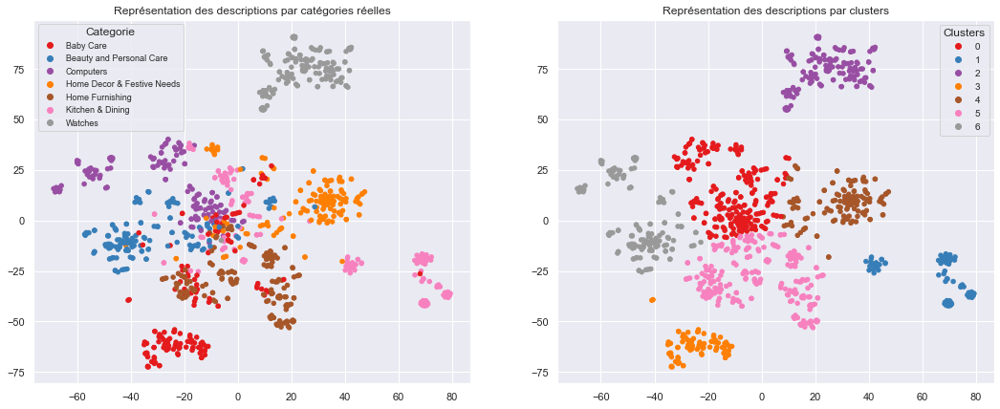

ARI :  0.4997


In [63]:
# Execute CountVectorizer model with opt_perplexity for 'product_name_description_bow_lem' feature
# fit on product name - min_df = 2
ARI, X_tsne, labels = ARI_fct(cvect_transform, 14)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 82   3  22   3  39   1   0]
 [  0  98  29  10  13   0   0]
 [  0  45 103   0   2   0   0]
 [  0   1  23 117   8   1   0]
 [  0   0   6   0 144   0   0]
 [  0   2  51   3  20  74   0]
 [  0   0   0   0   1   0 149]]

                            precision    recall  f1-score   support

                 Baby Care      1.000     0.547     0.707       150
  Beauty and Personal Care      0.658     0.653     0.656       150
                 Computers      0.440     0.687     0.536       150
Home Decor & Festive Needs      0.880     0.780     0.827       150
           Home Furnishing      0.634     0.960     0.764       150
          Kitchen & Dining      0.974     0.493     0.655       150
                   Watches      1.000     0.993     0.997       150

                  accuracy                          0.730      1050
                 macro avg      0.798     0.730     0.734      1050
              weighted avg      0.798     0.730     0.734      1050



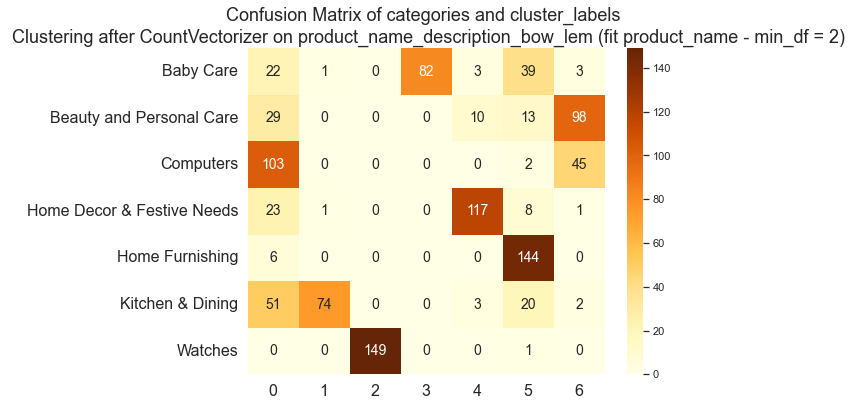

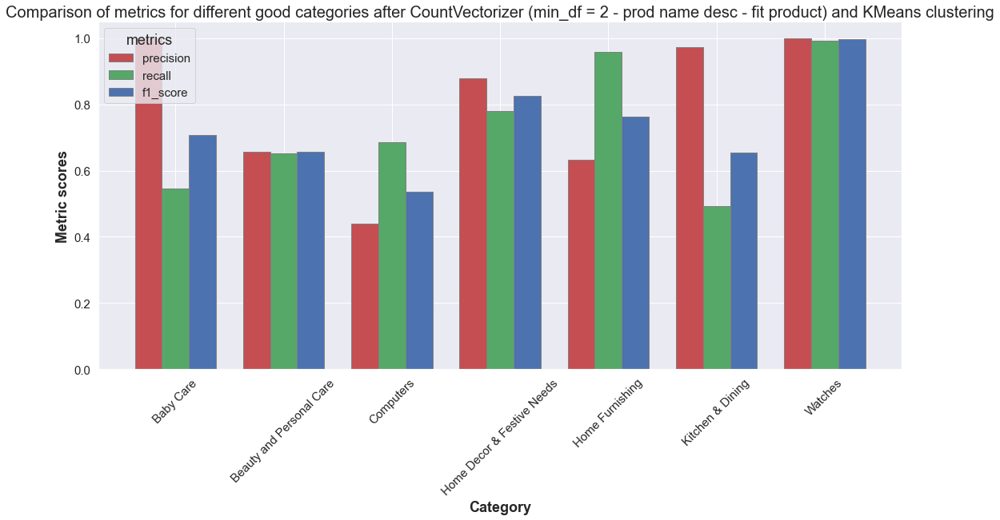

In [64]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'CountVectorizer on product_name_description_bow_lem (fit product_name - min_df = 2)')

# Calculate metrics by category and accuracy
dict_classification, metrics_cvect_prod_des_fit_prod_mindf_2 = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_cvect_prod_des_fit_prod_mindf_2, 
                model_name = 'CountVectorizer (min_df = 2 - prod name desc - fit product)')

In [65]:
# create bag of words (CountVectorizer) for 'product_name_description_bow_lem' feature
# fit on 'product_name_bow_lem'

# Changing min_df -> min_df = 3
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=3)

cvect.fit(data['product_name_bow_lem'])

cvect_transform = cvect.transform(data['product_name_description_bow_lem'])
cvect_transform

<1050x426 sparse matrix of type '<class 'numpy.int64'>'
	with 9790 stored elements in Compressed Sparse Row format>

In [66]:
len(cvect.stop_words_)

1473

There are 1473 additionnal words that are deleted compared to min_df = 1

In [137]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'product_name_description_bow_lem' feature
# fit on product_name_bow_lem
ARI_product_name_description_fit_prod_mindf_3, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.0862 time :  5.0
ARI :  0.2021 time :  5.0
ARI :  0.2022 time :  5.0
ARI :  0.3057 time :  6.0
ARI :  0.3637 time :  6.0
ARI :  0.4308 time :  6.0
ARI :  0.386 time :  5.0
ARI :  0.3799 time :  5.0
ARI :  0.3706 time :  6.0
ARI :  0.4081 time :  6.0
ARI :  0.368 time :  5.0
ARI :  0.4239 time :  5.0
ARI :  0.4539 time :  6.0
ARI :  0.3822 time :  6.0
ARI :  0.4328 time :  6.0
ARI :  0.4081 time :  6.0
ARI :  0.4357 time :  7.0
ARI :  0.4277 time :  7.0
ARI :  0.4227 time :  6.0
ARI :  0.4392 time :  7.0
ARI :  0.404 time :  7.0
ARI :  0.4205 time :  7.0
ARI :  0.4416 time :  7.0
ARI :  0.4338 time :  8.0
ARI :  0.4544 time :  8.0
ARI :  0.4377 time :  8.0
ARI :  0.4659 time :  8.0
ARI :  0.4442 time :  7.0
ARI :  0.4264 time :  7.0
ARI :  0.4287 time :  7.0
ARI :  0.4299 time :  7.0
ARI :  0.4543 time :  8.0
ARI :  0.428 time :  7.0
ARI :  0.4643 time :  9.0
ARI :  0.4559 time :  8.0
ARI :  0.4542 time :  9.0
ARI :  0.4362 time :  8.0
ARI :  0.4633 time :  9.0
ARI :  0.4541 ti

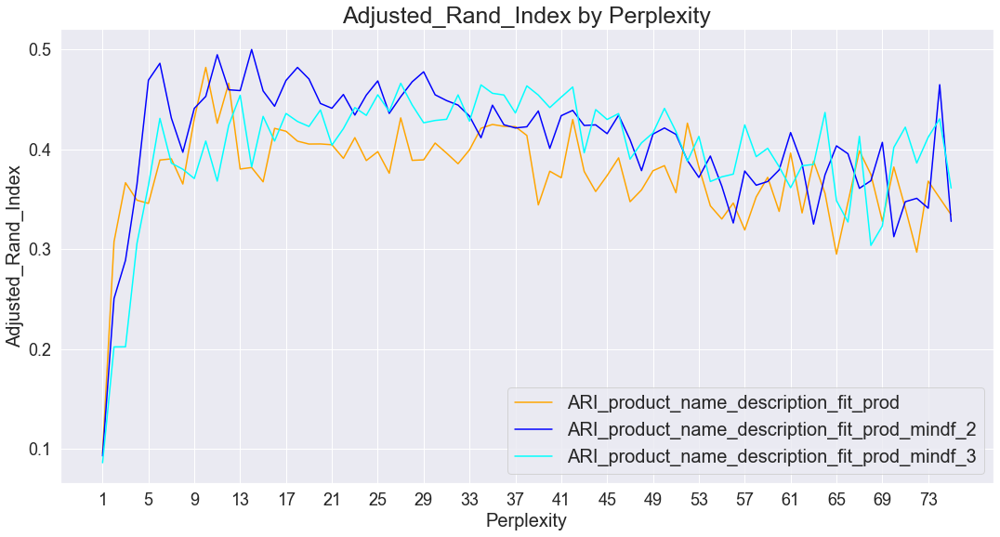

In [1013]:
# Plot ARI by perplexity for CountVectorizer
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_description
y2 = ARI_product_name
y3 = ARI_product_name_description
y4 = ARI_product_name_description_fit_prod
y5 = ARI_product_name_description_fit_prod_mindf_2
y6 = ARI_product_name_description_fit_prod_mindf_3

# Plot the different metrics
ax.plot(x, y4, color = 'orange', label = 'ARI_product_name_description_fit_prod')
ax.plot(x, y5, color = 'blue', label = 'ARI_product_name_description_fit_prod_mindf_2')
ax.plot(x, y6, color = 'cyan', label = 'ARI_product_name_description_fit_prod_mindf_3')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4659 time :  8.0


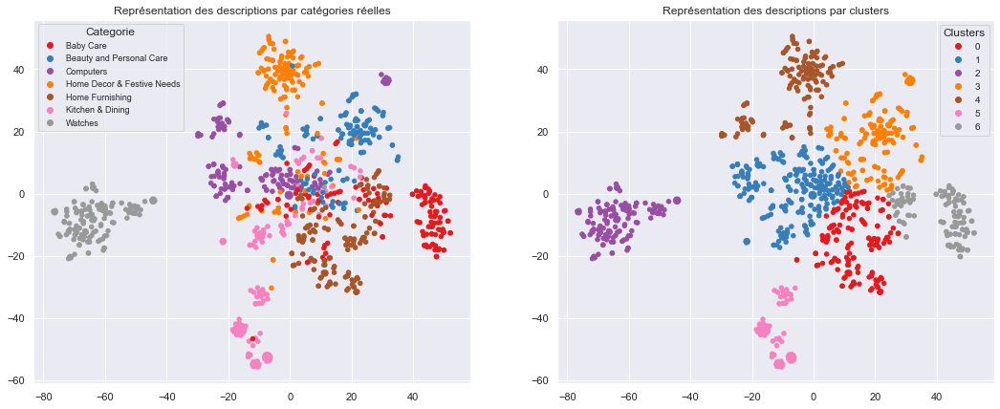

ARI :  0.4659


In [67]:
# Execute CountVectorizer model with opt_perplexity for 'product_name_description_bow_lem' feature
# fit on product name - min_df = 3
ARI, X_tsne, labels = ARI_fct(cvect_transform, 27)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 97   7  26   0  19   1   0]
 [  0 103  23  11  13   0   0]
 [  0  14 103  33   0   0   0]
 [  0  12  30 102   5   1   0]
 [ 19  10   4   0 117   0   0]
 [  0  13  58   1   4  74   0]
 [  0   0   1   0   0   0 149]]

                            precision    recall  f1-score   support

                 Baby Care      0.836     0.647     0.729       150
  Beauty and Personal Care      0.648     0.687     0.667       150
                 Computers      0.420     0.687     0.522       150
Home Decor & Festive Needs      0.694     0.680     0.687       150
           Home Furnishing      0.741     0.780     0.760       150
          Kitchen & Dining      0.974     0.493     0.655       150
                   Watches      1.000     0.993     0.997       150

                  accuracy                          0.710      1050
                 macro avg      0.759     0.710     0.717      1050
              weighted avg      0.759     0.710     0.717      1050



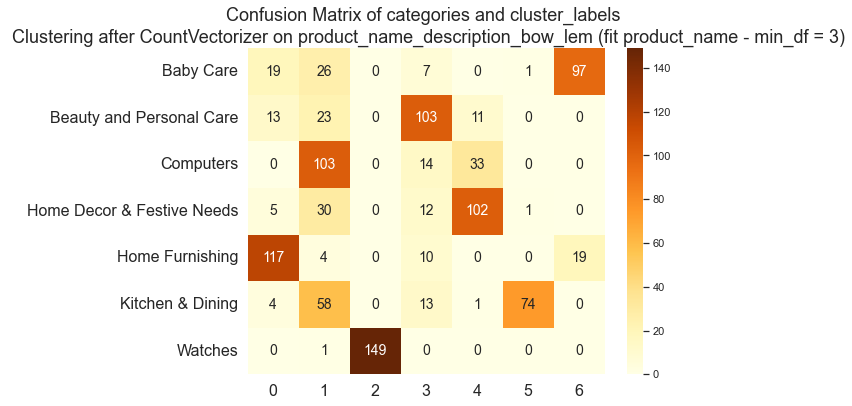

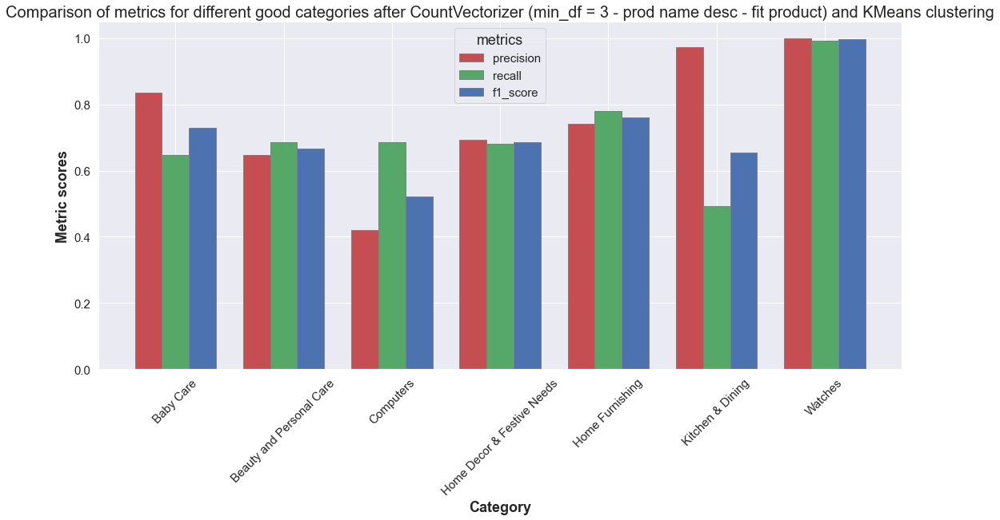

In [68]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'CountVectorizer on product_name_description_bow_lem (fit product_name - min_df = 3)')

# Calculate metrics by category and accuracy
dict_classification, metrics_cvect_prod_des_fit_prod_mindf_3 = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_cvect_prod_des_fit_prod_mindf_3, 
                model_name = 'CountVectorizer (min_df = 3 - prod name desc - fit product)')

# Bag of word - CountVectorizer bigrams

In [69]:
# create bag of words (CountVectorizer) for 'description_bow_lem' feature

# Create CountVectorizer model for bigrams only
cvect = CountVectorizer(ngram_range=(2, 2), stop_words='english', max_df=0.95, min_df=2)

# Fit CountVectorizer model on data['description_bow_lem']
feat = 'description_bow_lem'
cvect.fit(data[feat])

# Transform data['description_bow_lem'] with fit countvectorizer model
cvect_transform = cvect.transform(data[feat])
cvect_transform

<1050x3651 sparse matrix of type '<class 'numpy.int64'>'
	with 24811 stored elements in Compressed Sparse Row format>

In [634]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'description_bow_lem' bigrams and min_df = 2
ARI_description_bi, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.0427 time :  8.0
ARI :  0.1108 time :  8.0
ARI :  0.2034 time :  8.0
ARI :  0.214 time :  9.0
ARI :  0.1795 time :  9.0
ARI :  0.2463 time :  9.0
ARI :  0.262 time :  9.0
ARI :  0.2542 time :  9.0
ARI :  0.2933 time :  9.0
ARI :  0.2845 time :  9.0
ARI :  0.303 time :  10.0
ARI :  0.2826 time :  9.0
ARI :  0.2765 time :  10.0
ARI :  0.2704 time :  10.0
ARI :  0.3031 time :  10.0
ARI :  0.2931 time :  10.0
ARI :  0.2957 time :  11.0
ARI :  0.2918 time :  11.0
ARI :  0.2881 time :  12.0
ARI :  0.2833 time :  10.0
ARI :  0.2913 time :  11.0
ARI :  0.2789 time :  11.0
ARI :  0.3043 time :  12.0
ARI :  0.2935 time :  11.0
ARI :  0.2813 time :  10.0
ARI :  0.2895 time :  10.0
ARI :  0.2976 time :  10.0
ARI :  0.3038 time :  10.0
ARI :  0.2567 time :  11.0
ARI :  0.2814 time :  11.0
ARI :  0.2672 time :  12.0
ARI :  0.2724 time :  11.0
ARI :  0.3023 time :  12.0
ARI :  0.283 time :  11.0
ARI :  0.2803 time :  12.0
ARI :  0.2819 time :  12.0
ARI :  0.277 time :  11.0
ARI :  0.2811 tim

-> Clustering is less efficient when considering only bigrams compared to unigrams only

In [70]:
# create bag of words (CountVectorizer) for 'description_bow_lem' feature

# Create CountVectorizer model for unigrams and bigrams
cvect = CountVectorizer(ngram_range=(1, 2), stop_words='english', max_df=0.95, min_df=2)

# Fit CountVectorizer model on data['description_bow_lem']
feat = 'description_bow_lem'
cvect.fit(data[feat])

# Transform data['description_bow_lem'] with fit countvectorizer model
cvect_transform = cvect.transform(data[feat])
cvect_transform

<1050x5649 sparse matrix of type '<class 'numpy.int64'>'
	with 54432 stored elements in Compressed Sparse Row format>

In [636]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'description_bow_lem' bigrams and unigrams, min_df = 2
ARI_description_uni_and_bi, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.08 time :  7.0
ARI :  0.1538 time :  9.0
ARI :  0.2513 time :  8.0
ARI :  0.3204 time :  8.0
ARI :  0.2995 time :  8.0
ARI :  0.3076 time :  8.0
ARI :  0.3034 time :  9.0
ARI :  0.3498 time :  8.0
ARI :  0.3513 time :  9.0
ARI :  0.3399 time :  9.0
ARI :  0.3645 time :  8.0
ARI :  0.3651 time :  9.0
ARI :  0.3694 time :  9.0
ARI :  0.3263 time :  10.0
ARI :  0.3805 time :  10.0
ARI :  0.3501 time :  10.0
ARI :  0.3501 time :  10.0
ARI :  0.3769 time :  9.0
ARI :  0.3787 time :  9.0
ARI :  0.3876 time :  10.0
ARI :  0.3859 time :  10.0
ARI :  0.414 time :  10.0
ARI :  0.3631 time :  10.0
ARI :  0.3528 time :  10.0
ARI :  0.3911 time :  11.0
ARI :  0.3849 time :  10.0
ARI :  0.3759 time :  11.0
ARI :  0.4022 time :  12.0
ARI :  0.3763 time :  11.0
ARI :  0.3742 time :  11.0
ARI :  0.3673 time :  11.0
ARI :  0.3356 time :  11.0
ARI :  0.3991 time :  10.0
ARI :  0.3512 time :  11.0
ARI :  0.3894 time :  11.0
ARI :  0.3889 time :  11.0
ARI :  0.4013 time :  12.0
ARI :  0.4087 time 

-> Clustering is less efficient when considering unigrams and bigrams compared to unigrams only

In [71]:
# create bag of words (CountVectorizer) for 'product_name_description_bow_lem' feature

# Create CountVectorizer model for bigrams only
cvect = CountVectorizer(ngram_range=(2, 2), stop_words='english', max_df=0.95, min_df=2)

# Fit CountVectorizer model on data['product_name_bow_lem']
cvect.fit(data['product_name_bow_lem'])

# Transform data['product_name_description_bow_lem'] with fit countvectorizer model
cvect_transform = cvect.transform(data['product_name_description_bow_lem'])
cvect_transform

<1050x557 sparse matrix of type '<class 'numpy.int64'>'
	with 2701 stored elements in Compressed Sparse Row format>

In [638]:
# Execute countvectorizer model with perplexity from 1 to 75 for 'product_name_description_bow_lem' bigrams and min_df = 2
ARI_prod_name_desc_bi, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.0509 time :  8.0
ARI :  0.1408 time :  9.0
ARI :  0.1685 time :  9.0
ARI :  0.2144 time :  9.0
ARI :  0.2085 time :  9.0
ARI :  0.1688 time :  10.0
ARI :  0.2446 time :  11.0
ARI :  0.2286 time :  10.0
ARI :  0.2522 time :  10.0
ARI :  0.2154 time :  10.0
ARI :  0.2377 time :  10.0
ARI :  0.2465 time :  10.0
ARI :  0.235 time :  10.0
ARI :  0.2635 time :  10.0
ARI :  0.2369 time :  11.0
ARI :  0.2269 time :  10.0
ARI :  0.2404 time :  11.0
ARI :  0.2223 time :  11.0
ARI :  0.2363 time :  11.0
ARI :  0.2343 time :  11.0
ARI :  0.2294 time :  11.0
ARI :  0.2426 time :  11.0
ARI :  0.2321 time :  11.0
ARI :  0.226 time :  11.0
ARI :  0.2401 time :  11.0
ARI :  0.2359 time :  11.0
ARI :  0.2405 time :  12.0
ARI :  0.215 time :  11.0
ARI :  0.2335 time :  12.0
ARI :  0.2439 time :  12.0
ARI :  0.2234 time :  12.0
ARI :  0.2222 time :  13.0
ARI :  0.2383 time :  12.0
ARI :  0.2399 time :  12.0
ARI :  0.2228 time :  12.0
ARI :  0.2199 time :  12.0
ARI :  0.2357 time :  12.0
ARI :  0.

In [72]:
# create bag of words (CountVectorizer) for 'product_name_description_bow_lem' feature

# Create CountVectorizer model for bigrams and unigrams
cvect = CountVectorizer(ngram_range=(1, 2), stop_words='english', max_df=0.95, min_df=2)

# Fit CountVectorizer model on data['product_name_bow_lem']
cvect.fit(data['product_name_bow_lem'])

# Transform data['product_name_description_bow_lem'] with fit countvectorizer model
cvect_transform = cvect.transform(data['product_name_description_bow_lem'])
cvect_transform

<1050x1234 sparse matrix of type '<class 'numpy.int64'>'
	with 14604 stored elements in Compressed Sparse Row format>

In [640]:
# Execute countvectorizer model with perplexity from 1 to 75 
# for 'product_name_description_bow_lem' unigrams and bigrams, min_df = 2
ARI_prod_name_desc_bi_and_uni, opt_perplexity = ARI_calculation(cvect_transform)

ARI :  0.0611 time :  7.0
ARI :  0.192 time :  7.0
ARI :  0.3198 time :  7.0
ARI :  0.3544 time :  7.0
ARI :  0.3699 time :  8.0
ARI :  0.4534 time :  8.0
ARI :  0.4531 time :  8.0
ARI :  0.4335 time :  8.0
ARI :  0.3675 time :  8.0
ARI :  0.4479 time :  8.0
ARI :  0.4513 time :  8.0
ARI :  0.3549 time :  9.0
ARI :  0.3956 time :  8.0
ARI :  0.3609 time :  8.0
ARI :  0.4344 time :  9.0
ARI :  0.4102 time :  9.0
ARI :  0.3941 time :  9.0
ARI :  0.4049 time :  9.0
ARI :  0.3855 time :  9.0
ARI :  0.3736 time :  9.0
ARI :  0.3901 time :  10.0
ARI :  0.409 time :  10.0
ARI :  0.4361 time :  10.0
ARI :  0.3949 time :  10.0
ARI :  0.366 time :  10.0
ARI :  0.4352 time :  10.0
ARI :  0.4212 time :  10.0
ARI :  0.4357 time :  10.0
ARI :  0.4592 time :  10.0
ARI :  0.4798 time :  9.0
ARI :  0.4163 time :  12.0
ARI :  0.469 time :  11.0
ARI :  0.4064 time :  10.0
ARI :  0.4232 time :  10.0
ARI :  0.4508 time :  11.0
ARI :  0.442 time :  11.0
ARI :  0.4321 time :  12.0
ARI :  0.4122 time :  11.0


### Conclusions for CountVectorizer
- Best results for : CountVectorizer fit on 'product_name' and transform 'product_name_description'
- Best results for : min_df = 2
- Best results for : unigrams only

# Bag of word - Tf-idf

### Tfidf on product_name column

In [73]:
# create bag of words (Tf-idf) for 'product_name_bow_lem' feature
ctf = TfidfVectorizer(stop_words='english', max_df = 0.95, min_df = 1)

# Fit model on 'product_name_bow_lem' feature
feat = 'product_name_bow_lem'
ctf_fit = ctf.fit(data[feat])

# Create features from 'product_name_bow_lem'
ctf_transform = ctf.transform(data[feat])
ctf_transform

<1050x1899 sparse matrix of type '<class 'numpy.float64'>'
	with 6097 stored elements in Compressed Sparse Row format>

In [190]:
# Execute tfidfvectorizer model with perplexity from 1 to 75 for 'product_name_bow_lem' feature
# fit on product_name_bow_lem
ARI_tfidf_product_name, opt_perplexity = ARI_calculation(ctf_transform)

ARI :  0.067 time :  5.0
ARI :  0.1774 time :  5.0
ARI :  0.2464 time :  6.0
ARI :  0.3019 time :  5.0
ARI :  0.3478 time :  6.0
ARI :  0.4899 time :  6.0
ARI :  0.4026 time :  5.0
ARI :  0.4341 time :  5.0
ARI :  0.4676 time :  6.0
ARI :  0.466 time :  5.0
ARI :  0.4798 time :  6.0
ARI :  0.5115 time :  6.0
ARI :  0.5523 time :  6.0
ARI :  0.5169 time :  5.0
ARI :  0.4658 time :  6.0
ARI :  0.5257 time :  6.0
ARI :  0.4392 time :  6.0
ARI :  0.5396 time :  6.0
ARI :  0.4417 time :  6.0
ARI :  0.4785 time :  6.0
ARI :  0.4233 time :  6.0
ARI :  0.4494 time :  6.0
ARI :  0.486 time :  6.0
ARI :  0.5006 time :  7.0
ARI :  0.5107 time :  6.0
ARI :  0.4615 time :  6.0
ARI :  0.4572 time :  7.0
ARI :  0.4388 time :  7.0
ARI :  0.4552 time :  7.0
ARI :  0.3421 time :  7.0
ARI :  0.3732 time :  7.0
ARI :  0.3833 time :  7.0
ARI :  0.3905 time :  7.0
ARI :  0.4255 time :  8.0
ARI :  0.3886 time :  8.0
ARI :  0.4939 time :  8.0
ARI :  0.5152 time :  7.0
ARI :  0.4665 time :  9.0
ARI :  0.4311 t

ARI :  0.5523 time :  6.0


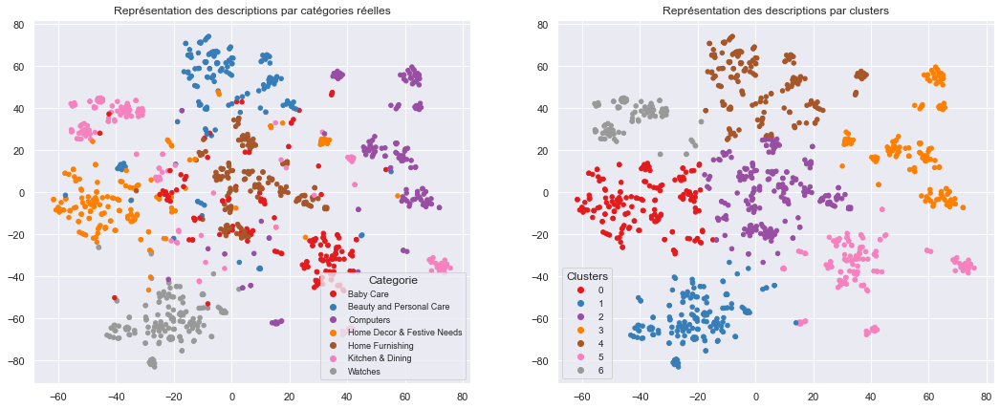

ARI :  0.5523


In [74]:
# Execute TfidfVectorizer model with opt_perplexity for 'product_name_bow_lem' feature
# fit on product name
ARI, X_tsne, labels = ARI_fct(ctf_transform, 13)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 83  10   2  13  38   2   2]
 [  5 124   1  13   6   1   0]
 [ 12  14 112   0   6   0   6]
 [  1   6  11 120   5   5   2]
 [  0  11   0   1 138   0   0]
 [ 31   2  10  17   8  78   4]
 [  0   0   0   3   0   0 147]]

                            precision    recall  f1-score   support

                 Baby Care      0.629     0.553     0.589       150
  Beauty and Personal Care      0.743     0.827     0.782       150
                 Computers      0.824     0.747     0.783       150
Home Decor & Festive Needs      0.719     0.800     0.757       150
           Home Furnishing      0.687     0.920     0.786       150
          Kitchen & Dining      0.907     0.520     0.661       150
                   Watches      0.913     0.980     0.945       150

                  accuracy                          0.764      1050
                 macro avg      0.774     0.764     0.758      1050
              weighted avg      0.774     0.764     0.758      1050



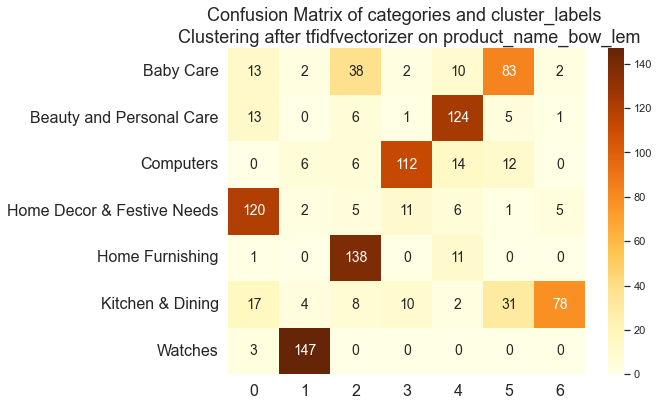

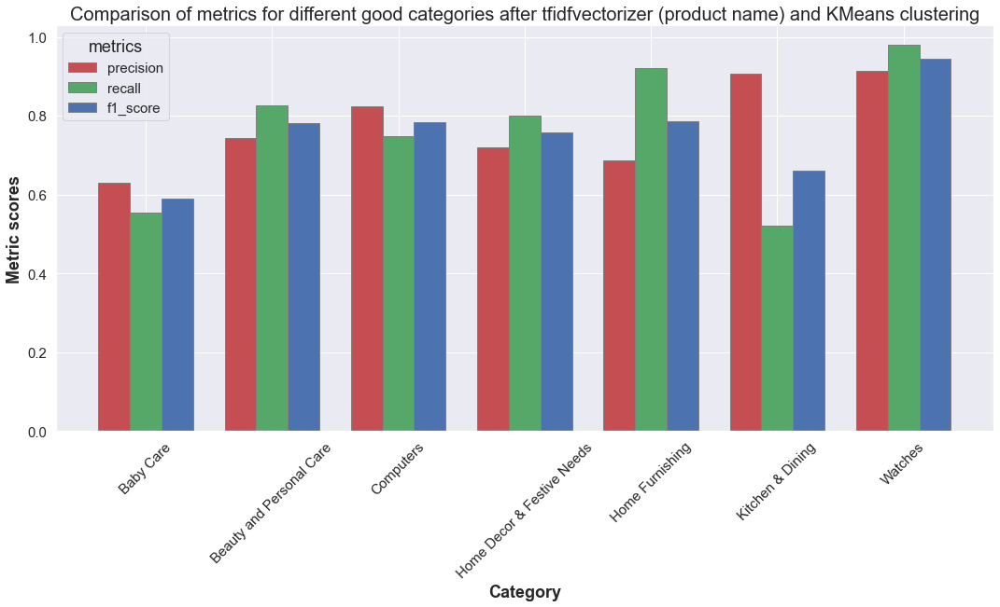

In [75]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'tfidfvectorizer on product_name_bow_lem')

# Calculate metrics by category and accuracy
dict_classification, metrics_tfidf_prod = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_tfidf_prod, 
                model_name = 'tfidfvectorizer (product name)')

### Tfidf on description column

In [76]:
# create bag of words (Tf-idf) for 'product_name_bow_lem' feature
ctf = TfidfVectorizer(stop_words='english', max_df = 0.95, min_df = 1)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])
ctf_transform

<1050x4522 sparse matrix of type '<class 'numpy.float64'>'
	with 32145 stored elements in Compressed Sparse Row format>

In [202]:
# Execute tfidfvectorizer model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem
ARI_tfidf_description, opt_perplexity = ARI_calculation(ctf_transform)

ARI :  0.0969 time :  6.0
ARI :  0.261 time :  6.0
ARI :  0.3543 time :  6.0
ARI :  0.3388 time :  6.0
ARI :  0.3947 time :  6.0
ARI :  0.3877 time :  6.0
ARI :  0.4296 time :  5.0
ARI :  0.3827 time :  6.0
ARI :  0.4894 time :  6.0
ARI :  0.5574 time :  6.0
ARI :  0.5067 time :  6.0
ARI :  0.564 time :  6.0
ARI :  0.5698 time :  6.0
ARI :  0.5727 time :  6.0
ARI :  0.5423 time :  6.0
ARI :  0.5535 time :  6.0
ARI :  0.5343 time :  7.0
ARI :  0.5761 time :  7.0
ARI :  0.5692 time :  7.0
ARI :  0.5833 time :  7.0
ARI :  0.5151 time :  7.0
ARI :  0.5245 time :  7.0
ARI :  0.5284 time :  6.0
ARI :  0.5579 time :  6.0
ARI :  0.5012 time :  6.0
ARI :  0.5346 time :  8.0
ARI :  0.4966 time :  8.0
ARI :  0.5202 time :  7.0
ARI :  0.5436 time :  7.0
ARI :  0.5035 time :  7.0
ARI :  0.4547 time :  7.0
ARI :  0.4442 time :  8.0
ARI :  0.4936 time :  8.0
ARI :  0.4951 time :  9.0
ARI :  0.4731 time :  7.0
ARI :  0.4462 time :  9.0
ARI :  0.4685 time :  8.0
ARI :  0.4876 time :  8.0
ARI :  0.4348 

ARI :  0.5833 time :  6.0


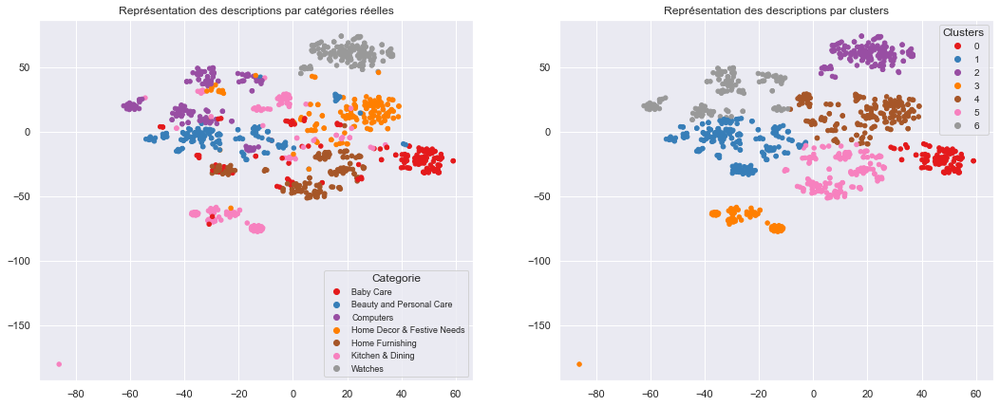

ARI :  0.5833


In [77]:
# Execute TfidfVectorizer model with opt_perplexity for 'description_bow_lem' feature
# fit on description_bow_lem
ARI, X_tsne, labels = ARI_fct(ctf_transform, 20)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 93  23   0  14  18   2   0]
 [  2 132   2  10   4   0   0]
 [  0  31 119   0   0   0   0]
 [  0   2  11 129   3   1   4]
 [  0  20   0   1 129   0   0]
 [  3   3  21  38  10  75   0]
 [  0   0   0   0   0   0 150]]

                            precision    recall  f1-score   support

                 Baby Care      0.949     0.620     0.750       150
  Beauty and Personal Care      0.626     0.880     0.731       150
                 Computers      0.778     0.793     0.785       150
Home Decor & Festive Needs      0.672     0.860     0.754       150
           Home Furnishing      0.787     0.860     0.822       150
          Kitchen & Dining      0.962     0.500     0.658       150
                   Watches      0.974     1.000     0.987       150

                  accuracy                          0.788      1050
                 macro avg      0.821     0.788     0.784      1050
              weighted avg      0.821     0.788     0.784      1050



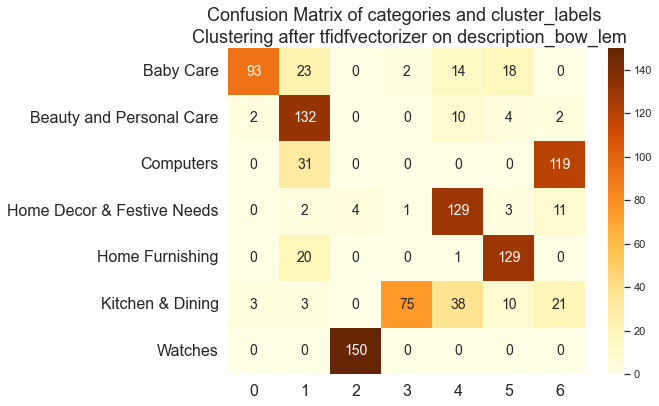

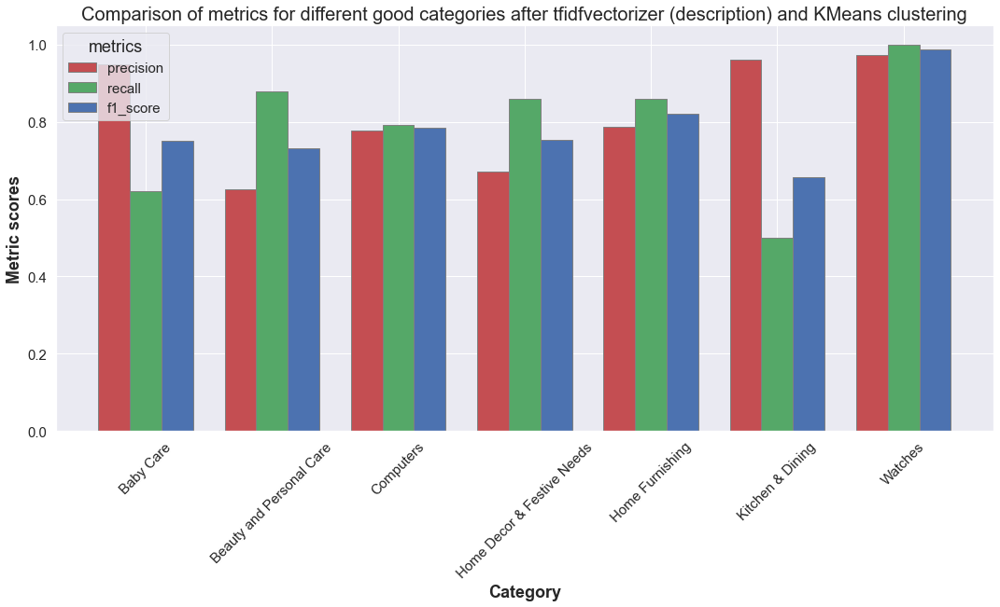

In [78]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'tfidfvectorizer on description_bow_lem')

# Calculate metrics by category and accuracy
dict_classification, metrics_tfidf_desc = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_tfidf_desc, 
                model_name = 'tfidfvectorizer (description)')

### Tfidf on product_name_description column

In [79]:
# create bag of words (Tf-idf) for 'product_name_description_bow_lem' feature
ctf = TfidfVectorizer(stop_words='english', max_df = 0.95, min_df = 1)

feat = 'product_name_description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])
ctf_transform

<1050x4957 sparse matrix of type '<class 'numpy.float64'>'
	with 32565 stored elements in Compressed Sparse Row format>

In [211]:
# Execute tfidfvectorizer model with perplexity from 1 to 75 for 'product_name_description_bow_lem' feature
# fit on product_name_description_bow_lem
ARI_tfidf_product_name_description, opt_perplexity = ARI_calculation(ctf_transform)

ARI :  0.0653 time :  6.0
ARI :  0.2071 time :  6.0
ARI :  0.2672 time :  6.0
ARI :  0.3653 time :  6.0
ARI :  0.382 time :  6.0
ARI :  0.4377 time :  6.0
ARI :  0.5013 time :  6.0
ARI :  0.5244 time :  6.0
ARI :  0.502 time :  6.0
ARI :  0.4473 time :  6.0
ARI :  0.5513 time :  6.0
ARI :  0.4829 time :  6.0
ARI :  0.4704 time :  6.0
ARI :  0.4818 time :  6.0
ARI :  0.5247 time :  6.0
ARI :  0.5104 time :  7.0
ARI :  0.5635 time :  6.0
ARI :  0.5303 time :  6.0
ARI :  0.5664 time :  6.0
ARI :  0.5391 time :  6.0
ARI :  0.5701 time :  6.0
ARI :  0.5016 time :  6.0
ARI :  0.5785 time :  6.0
ARI :  0.5533 time :  6.0
ARI :  0.4743 time :  6.0
ARI :  0.5677 time :  6.0
ARI :  0.4972 time :  6.0
ARI :  0.5751 time :  6.0
ARI :  0.4652 time :  6.0
ARI :  0.5428 time :  6.0
ARI :  0.5047 time :  7.0
ARI :  0.44 time :  7.0
ARI :  0.5341 time :  7.0
ARI :  0.49 time :  8.0
ARI :  0.5603 time :  7.0
ARI :  0.4823 time :  8.0
ARI :  0.5035 time :  9.0
ARI :  0.5001 time :  9.0
ARI :  0.4586 time

ARI :  0.5785 time :  6.0


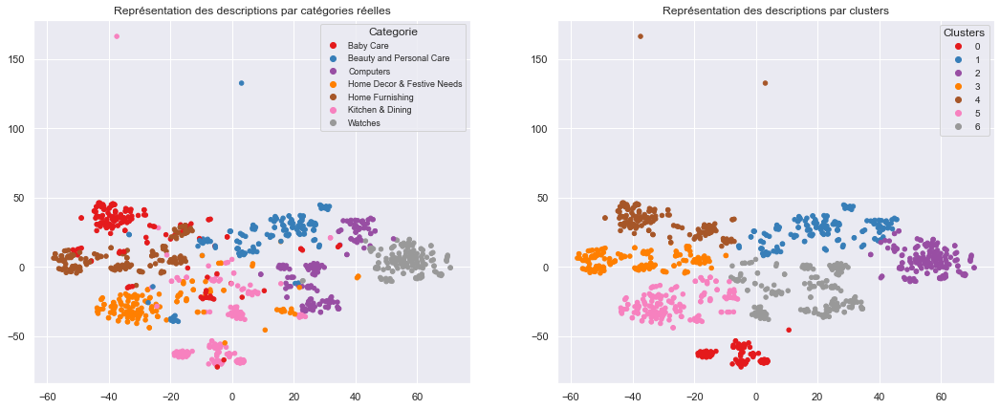

ARI :  0.5785


In [80]:
# Execute TfidfVectorizer model with opt_perplexity for 'product_name_description_bow_lem' feature
# fit on product_name_description_bow_lem
ARI, X_tsne, labels = ARI_fct(ctf_transform, 23)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[108   8   5  14  13   2   0]
 [ 13 123   2  11   1   0   0]
 [  0  39 100   0   0   0  11]
 [  0   1  18 125   1   2   3]
 [ 19   0   0   1 130   0   0]
 [  2   2  60  11   1  74   0]
 [  0   0   2   0   0   0 148]]

                            precision    recall  f1-score   support

                 Baby Care      0.761     0.720     0.740       150
  Beauty and Personal Care      0.711     0.820     0.762       150
                 Computers      0.535     0.667     0.593       150
Home Decor & Festive Needs      0.772     0.833     0.801       150
           Home Furnishing      0.890     0.867     0.878       150
          Kitchen & Dining      0.949     0.493     0.649       150
                   Watches      0.914     0.987     0.949       150

                  accuracy                          0.770      1050
                 macro avg      0.790     0.770     0.767      1050
              weighted avg      0.790     0.770     0.767      1050



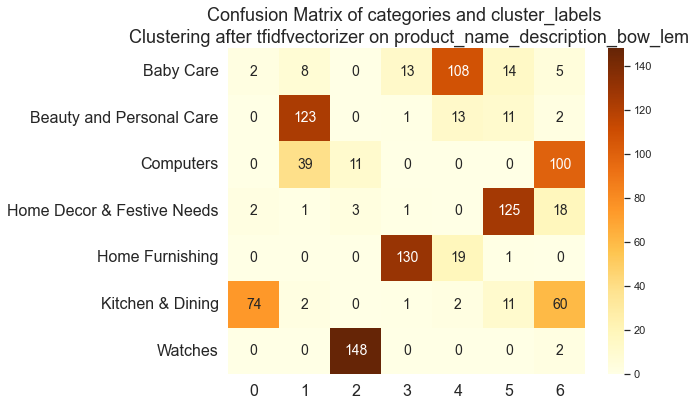

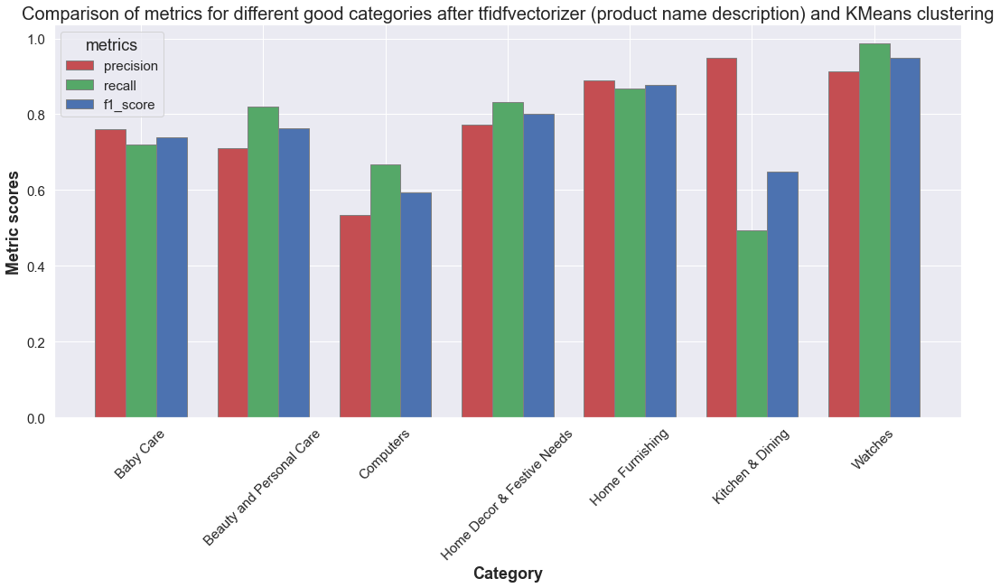

In [81]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'tfidfvectorizer on product_name_description_bow_lem')

# Calculate metrics by category and accuracy
dict_classification, metrics_tfidf_prod_desc = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_tfidf_prod_desc, 
                model_name = 'tfidfvectorizer (product name description)')

### Tfidf on product_name_description column fit on product name column

In [82]:
# create bag of words (Tf-idf) for 'product_name_description_bow_lem' feature
# fit on 'product_name_bow_lem'
ctf = TfidfVectorizer(stop_words='english', max_df = 0.95, min_df = 1)

ctf_fit = ctf.fit(data['product_name_bow_lem'])

ctf_transform = ctf.transform(data['product_name_description_bow_lem'])
ctf_transform

<1050x1899 sparse matrix of type '<class 'numpy.float64'>'
	with 15645 stored elements in Compressed Sparse Row format>

In [219]:
# Execute tfidfvectorizer model with perplexity from 1 to 75 for 'product_name_description_bow_lem' feature
# fit on product_name_bow_lem
ARI_tfidf_product_name_description_fit_prod, opt_perplexity = ARI_calculation(ctf_transform)

ARI :  0.0868 time :  6.0
ARI :  0.2601 time :  6.0
ARI :  0.3389 time :  6.0
ARI :  0.2797 time :  6.0
ARI :  0.3564 time :  6.0
ARI :  0.4269 time :  6.0
ARI :  0.4015 time :  6.0
ARI :  0.467 time :  6.0
ARI :  0.4283 time :  7.0
ARI :  0.4636 time :  7.0
ARI :  0.5155 time :  7.0
ARI :  0.4706 time :  6.0
ARI :  0.4989 time :  6.0
ARI :  0.4955 time :  6.0
ARI :  0.4665 time :  6.0
ARI :  0.5324 time :  5.0
ARI :  0.5119 time :  6.0
ARI :  0.5504 time :  6.0
ARI :  0.5085 time :  7.0
ARI :  0.4524 time :  7.0
ARI :  0.5334 time :  6.0
ARI :  0.4937 time :  6.0
ARI :  0.5388 time :  6.0
ARI :  0.4915 time :  6.0
ARI :  0.4807 time :  6.0
ARI :  0.4951 time :  6.0
ARI :  0.5337 time :  6.0
ARI :  0.511 time :  8.0
ARI :  0.4719 time :  7.0
ARI :  0.4716 time :  8.0
ARI :  0.489 time :  8.0
ARI :  0.4434 time :  8.0
ARI :  0.4882 time :  8.0
ARI :  0.446 time :  8.0
ARI :  0.4399 time :  8.0
ARI :  0.4892 time :  7.0
ARI :  0.4297 time :  9.0
ARI :  0.4241 time :  9.0
ARI :  0.4207 ti

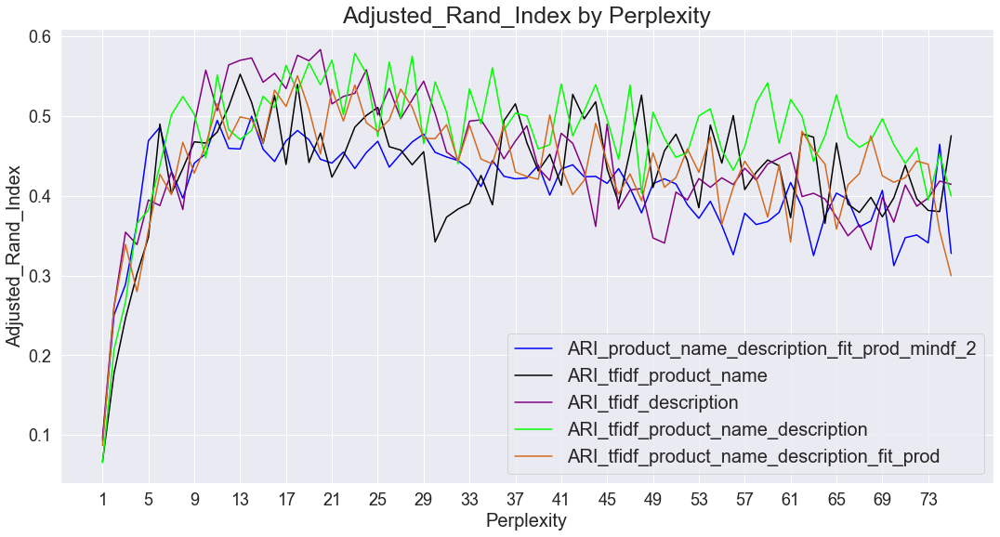

In [221]:
# Plot ARI by perplexity for tfidfVectorizer
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_description
y2 = ARI_product_name
y3 = ARI_product_name_description
y4 = ARI_product_name_description_fit_prod
y5 = ARI_product_name_description_fit_prod_mindf_2
y6 = ARI_product_name_description_fit_prod_mindf_3
y7 = ARI_tfidf_product_name
y8 = ARI_tfidf_description
y9 = ARI_tfidf_product_name_description
y10 = ARI_tfidf_product_name_description_fit_prod

# Plot the different metrics
ax.plot(x, y5, color = 'blue', label = 'ARI_product_name_description_fit_prod_mindf_2')
ax.plot(x, y7, color = 'black', label = 'ARI_tfidf_product_name')
ax.plot(x, y8, color = 'purple', label = 'ARI_tfidf_description')
ax.plot(x, y9, color = 'lime', label = 'ARI_tfidf_product_name_description')
ax.plot(x, y10, color = 'chocolate', label = 'ARI_tfidf_product_name_description_fit_prod')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.5504 time :  5.0


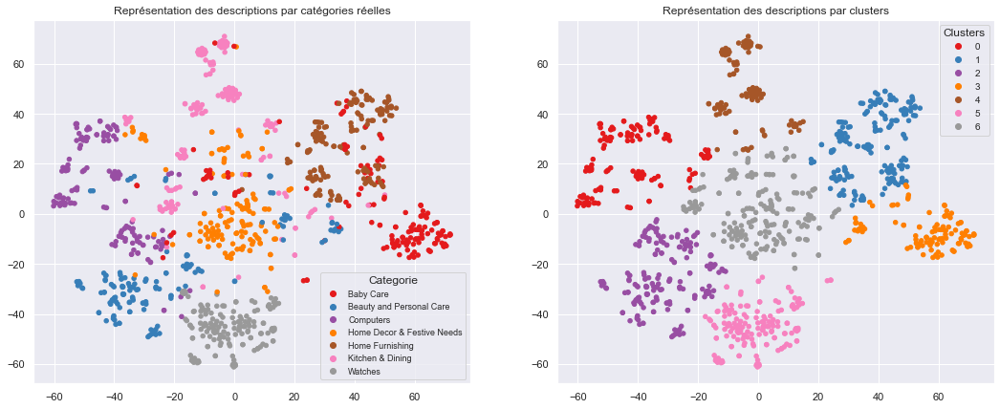

ARI :  0.5504


In [83]:
# Execute TfidfVectorizer model with opt_perplexity for 'product_name_description_bow_lem' feature
# fit on product_name_bow_lem
ARI, X_tsne, labels = ARI_fct(ctf_transform, 18)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 93   4   2  15  29   4   3]
 [ 11 109   8  19   1   0   2]
 [  0  51  95   3   0   0   1]
 [  0   3  11 120   0  12   4]
 [  2   0   0   1 147   0   0]
 [  3   2  18  40   0  84   3]
 [  0   6   0   0   0   0 144]]

                            precision    recall  f1-score   support

                 Baby Care      0.853     0.620     0.718       150
  Beauty and Personal Care      0.623     0.727     0.671       150
                 Computers      0.709     0.633     0.669       150
Home Decor & Festive Needs      0.606     0.800     0.690       150
           Home Furnishing      0.831     0.980     0.899       150
          Kitchen & Dining      0.840     0.560     0.672       150
                   Watches      0.917     0.960     0.938       150

                  accuracy                          0.754      1050
                 macro avg      0.768     0.754     0.751      1050
              weighted avg      0.768     0.754     0.751      1050



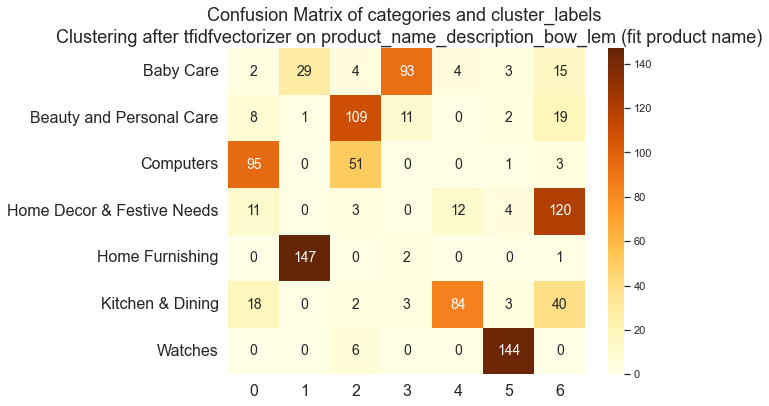

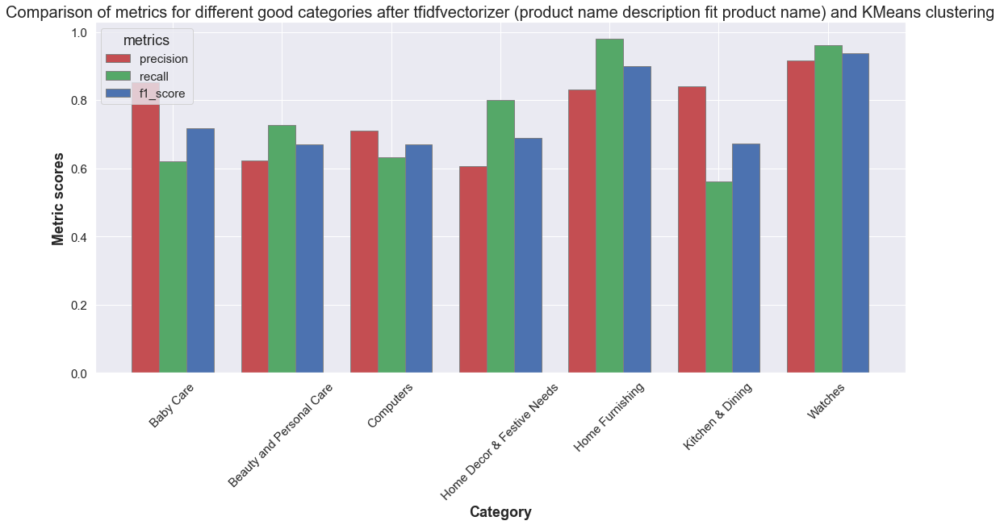

In [84]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'tfidfvectorizer on product_name_description_bow_lem (fit product name)')

# Calculate metrics by category and accuracy
dict_classification, metrics_tfidf_prod_desc_fit_prod = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_tfidf_prod_desc_fit_prod, 
                model_name = 'tfidfvectorizer (product name description fit product name)')

### Tfidf on description column changing min_df

In [85]:
# create bag of words (Tf-idf) for 'description_bow_lem' feature

# Create model changing min_df -> min_df = 2
ctf = TfidfVectorizer(stop_words='english', max_df = 0.95, min_df = 2)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])
ctf_transform

<1050x1998 sparse matrix of type '<class 'numpy.float64'>'
	with 29621 stored elements in Compressed Sparse Row format>

In [1447]:
# Execute tfidfvectorizer model with perplexity from 1 to 75 
# for 'description_bow_lem' feature - min_df = 2
# fit on description_bow_lem
ARI_tfidf_description_mindf2, opt_perplexity = ARI_calculation(ctf_transform)

ARI :  0.044 time :  8.0
ARI :  0.2838 time :  7.0
ARI :  0.2428 time :  8.0
ARI :  0.4581 time :  8.0
ARI :  0.4653 time :  8.0
ARI :  0.4076 time :  7.0
ARI :  0.4838 time :  7.0
ARI :  0.4396 time :  8.0
ARI :  0.5261 time :  7.0
ARI :  0.577 time :  8.0
ARI :  0.4857 time :  8.0
ARI :  0.5196 time :  8.0
ARI :  0.4811 time :  8.0
ARI :  0.5299 time :  8.0
ARI :  0.5768 time :  8.0
ARI :  0.5747 time :  8.0
ARI :  0.5753 time :  8.0
ARI :  0.5797 time :  8.0
ARI :  0.5593 time :  8.0
ARI :  0.5601 time :  9.0
ARI :  0.5666 time :  9.0
ARI :  0.5521 time :  9.0
ARI :  0.5674 time :  9.0
ARI :  0.5373 time :  9.0
ARI :  0.549 time :  9.0
ARI :  0.5403 time :  9.0
ARI :  0.5258 time :  9.0
ARI :  0.5281 time :  9.0
ARI :  0.5245 time :  9.0
ARI :  0.4932 time :  10.0
ARI :  0.3821 time :  9.0
ARI :  0.5061 time :  10.0
ARI :  0.4168 time :  10.0
ARI :  0.436 time :  10.0
ARI :  0.3861 time :  10.0
ARI :  0.4551 time :  10.0
ARI :  0.4043 time :  10.0
ARI :  0.4214 time :  10.0
ARI :  0

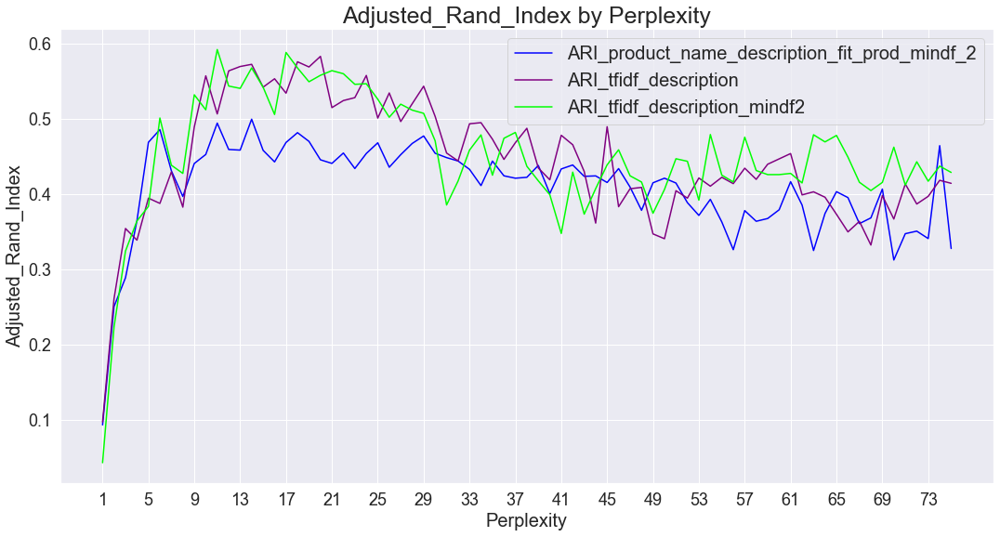

In [643]:
# Plot ARI by perplexity for tfidfVectorizer
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_description
y2 = ARI_product_name
y3 = ARI_product_name_description
y4 = ARI_product_name_description_fit_prod
y5 = ARI_product_name_description_fit_prod_mindf_2
y6 = ARI_product_name_description_fit_prod_mindf_3
y7 = ARI_tfidf_product_name
y8 = ARI_tfidf_description
y9 = ARI_tfidf_product_name_description
y10 = ARI_tfidf_product_name_description_fit_prod
y11 = ARI_tfidf_description_mindf2

# Plot the different metrics
ax.plot(x, y5, color = 'blue', label = 'ARI_product_name_description_fit_prod_mindf_2')
ax.plot(x, y8, color = 'purple', label = 'ARI_tfidf_description')
ax.plot(x, y11, color = 'lime', label = 'ARI_tfidf_description_mindf2')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.5797 time :  5.0


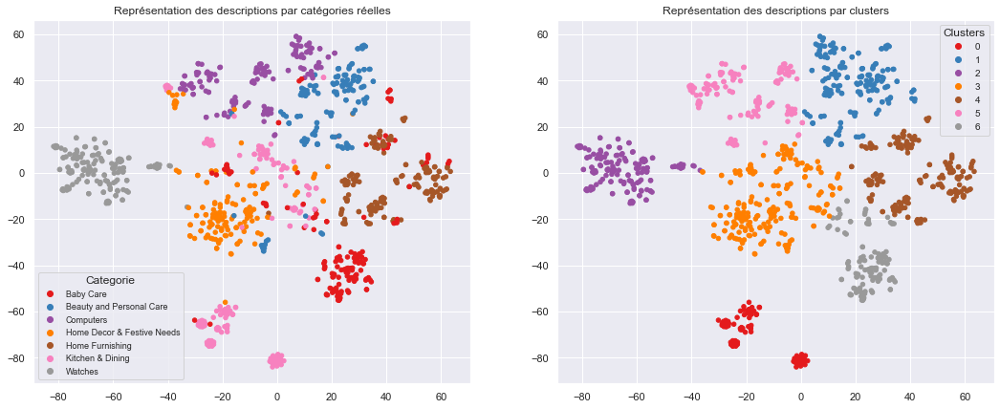

ARI :  0.5797


In [86]:
# Execute TfidfVectorizer model with opt_perplexity
# for 'description_bow_lem' feature - min_df = 2
# fit on description_bow_lem
ARI, X_tsne, labels = ARI_fct(ctf_transform, 18)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

[[ 96  10   2  17  23   2   0]
 [  2 125   2  11  10   0   0]
 [  0  50 100   0   0   0   0]
 [  2   1  12 132   1   1   1]
 [ 13   0   0   1 136   0   0]
 [  3   2  18  53   0  74   0]
 [  0   0   0   1   0   0 149]]

                            precision    recall  f1-score   support

                 Baby Care      0.828     0.640     0.722       150
  Beauty and Personal Care      0.665     0.833     0.740       150
                 Computers      0.746     0.667     0.704       150
Home Decor & Festive Needs      0.614     0.880     0.723       150
           Home Furnishing      0.800     0.907     0.850       150
          Kitchen & Dining      0.961     0.493     0.652       150
                   Watches      0.993     0.993     0.993       150

                  accuracy                          0.773      1050
                 macro avg      0.801     0.773     0.769      1050
              weighted avg      0.801     0.773     0.769      1050



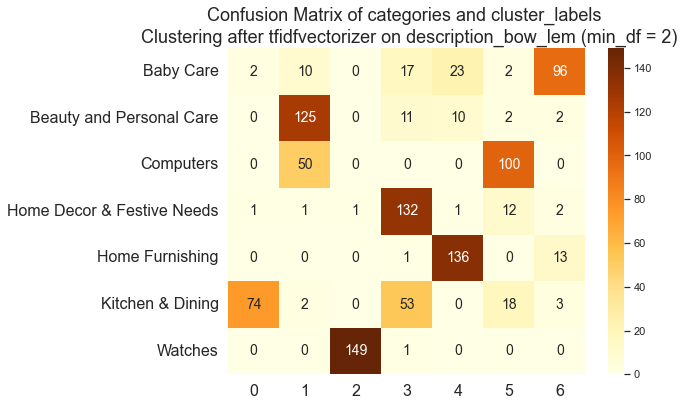

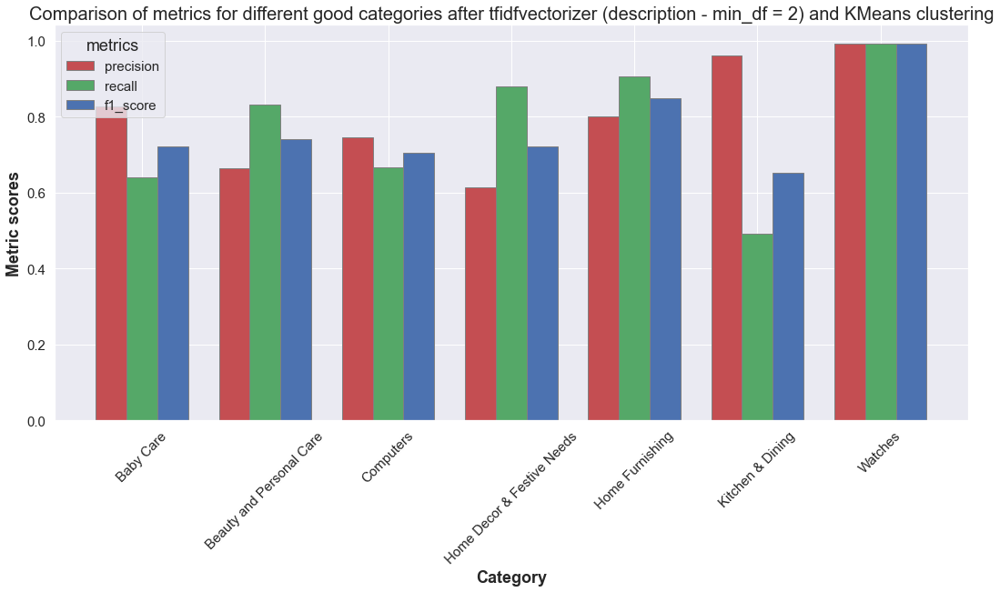

In [87]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'tfidfvectorizer on description_bow_lem (min_df = 2)')

# Calculate metrics by category and accuracy
dict_classification, metrics_tfidf_desc_mindf2 = class_report(true_labels, labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_tfidf_desc_mindf2, 
                model_name = 'tfidfvectorizer (description - min_df = 2)')

### Conclusion for tf-idf Vectorizer
- Best results for : Tf-idf fit_transform on 'description'
- Best results for : min_df = 2
- Better results than CountVectorizer

### Tf-idf with 62 clusters (second categories)

In [88]:
# LabelEncoder for second categories

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(data['second_category'])

# Transform categories to labels
data["category_label_2"] = le.transform(data['second_category'])
true_label_2 = data["category_label_2"]

In [89]:
# Create labels for first_category
print("catégories : ", list_2nd_cat)
true_labels_2 = true_label_2.tolist()
print("true_labels_2 : ", true_labels_2)

catégories :  ['Baby Care >> Baby & Kids Gifts', 'Baby Care >> Baby Bath & Skin', 'Baby Care >> Baby Bedding', 'Baby Care >> Baby Grooming', 'Baby Care >> Diapering & Potty Training', 'Baby Care >> Feeding & Nursing', 'Baby Care >> Furniture & Furnishings', 'Baby Care >> Infant Wear', 'Baby Care >> Strollers & Activity Gear', 'Beauty and Personal Care >> Bath and Spa', 'Beauty and Personal Care >> Beauty Accessories', 'Beauty and Personal Care >> Body and Skin Care', 'Beauty and Personal Care >> Combos and Kits', 'Beauty and Personal Care >> Eye Care', 'Beauty and Personal Care >> Fragrances', 'Beauty and Personal Care >> Hair Care', 'Beauty and Personal Care >> Health Care', 'Beauty and Personal Care >> Makeup', "Beauty and Personal Care >> Men's Grooming", "Beauty and Personal Care >> Women's Hygiene", 'Computers >> Computer Components', 'Computers >> Computer Peripherals', 'Computers >> Laptop Accessories', 'Computers >> Laptops', 'Computers >> Network Components', 'Computers >> Sof

In [90]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie (2nd_category) et n° de clusters
def ARI_2_fct(features, perplexity) :
    time1 = time.time()
    num_labels=len(list_2nd_cat)
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(true_labels_2, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_2_visu_fct(X_tsne, true_labels, labels, ARI) :
    fig = plt.figure(figsize=(18,7))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=true_labels_2, cmap='hsv')
    plt.title('Représentation des descriptions par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='hsv')
    plt.title('Représentation des descriptions par clusters')
    
    plt.show()
    
    print("ARI : ", ARI)

def ARI_2_calculation(features):
    ARI_list = []
    for perplexity in range(1, 76):
        ARI, X_tsne, labels = ARI_2_fct(features, perplexity)
        ARI_list.append(ARI)

    max_value = None
    max_idx = None

    for idx, num in enumerate(ARI_list):
        if (max_value is None or num > max_value):
            max_value = num
            max_idx = idx
            opt_perplexity = max_idx + 1

    print('Maximum value:', max_value, "At index: ", max_idx)
    print('Optimal perplexity = ', opt_perplexity)
    
    return ARI_list, opt_perplexity

In [91]:
# create bag of words (Tf-idf) for 'description_bow_lem' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

In [233]:
# Execute tfidfvectorizer model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem
# Clustering for 2nd categories
ARI_2nd_tfidf_description, opt_perplexity = ARI_2_calculation(ctf_transform)

ARI :  0.1796 time :  8.0
ARI :  0.2704 time :  7.0
ARI :  0.2962 time :  8.0
ARI :  0.3008 time :  8.0
ARI :  0.3071 time :  8.0
ARI :  0.304 time :  8.0
ARI :  0.3119 time :  8.0
ARI :  0.322 time :  7.0
ARI :  0.3236 time :  8.0
ARI :  0.3298 time :  8.0
ARI :  0.3322 time :  8.0
ARI :  0.3206 time :  8.0
ARI :  0.33 time :  9.0
ARI :  0.3269 time :  8.0
ARI :  0.3299 time :  9.0
ARI :  0.318 time :  8.0
ARI :  0.3187 time :  9.0
ARI :  0.3274 time :  9.0
ARI :  0.3322 time :  9.0
ARI :  0.3276 time :  8.0
ARI :  0.3185 time :  8.0
ARI :  0.3378 time :  8.0
ARI :  0.3254 time :  8.0
ARI :  0.3281 time :  8.0
ARI :  0.3418 time :  9.0
ARI :  0.324 time :  9.0
ARI :  0.3141 time :  9.0
ARI :  0.3446 time :  9.0
ARI :  0.3134 time :  9.0
ARI :  0.3266 time :  10.0
ARI :  0.314 time :  10.0
ARI :  0.3278 time :  9.0
ARI :  0.329 time :  10.0
ARI :  0.3232 time :  9.0
ARI :  0.329 time :  10.0
ARI :  0.3304 time :  10.0
ARI :  0.3122 time :  10.0
ARI :  0.3286 time :  10.0
ARI :  0.3434 

ARI :  0.3446 time :  8.0


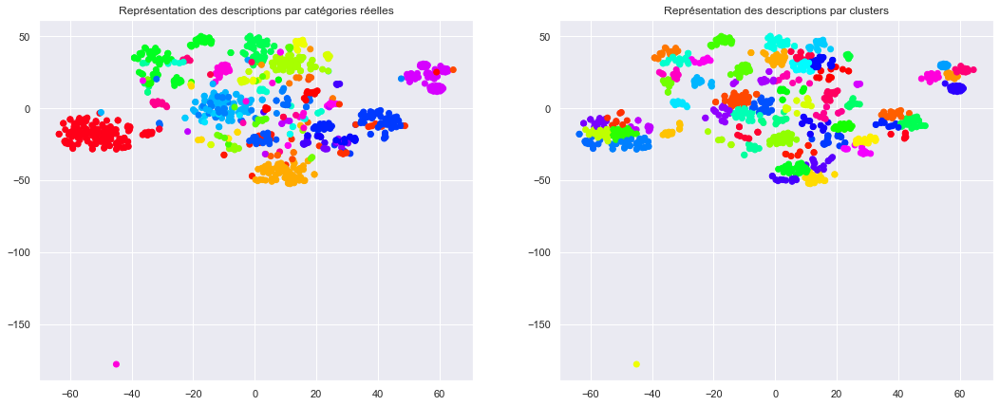

ARI :  0.3446


In [92]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute TfidfVectorizer model with opt_perplexity for 'description_bow_lem' feature
# fit on description_bow_lem
ARI, X_tsne, labels = ARI_2_fct(ctf_transform, 28)

# tSNE vizualisation
TSNE_2_visu_fct(X_tsne, true_labels, labels, ARI)

# Word2Vec

In [1450]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

### Create Word2Vec model

In [1451]:
# Create new column in 'data' with the number of tokens for each product
data['length_bow_lem'] = data['description_bow_lem'].apply(lambda x : len(word_tokenize(x)))
print("max length bow lem : ", data['length_bow_lem'].max())

max length bow lem :  354


In [1452]:
# Define hyperparameters of the w2vec model
w2v_size = 100 # vector_size
w2v_window = 5 # maximum distance between current and predicted word in sentence
w2v_min_count = 1 # ignores all words with total frequency lower than this
w2v_epochs = 10 # Number of iterations over the corpus
maxlen = 354 # adapt to length of sentences

In [1453]:
# Create text description for each product
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]
descriptions

[['key',
  'feature',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'floral',
  'curtain',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'height',
  'pack',
  'price',
  'curtain',
  'enhances',
  'look',
  'interior',
  'curtain',
  'made',
  'high',
  'quality',
  'polyester',
  'fabric',
  'feature',
  'eyelet',
  'style',
  'stitch',
  'metal',
  'ring',
  'make',
  'room',
  'environment',
  'romantic',
  'loving',
  'curtain',
  'ant',
  'wrinkle',
  'anti',
  'shrinkage',
  'elegant',
  'apparance',
  'give',
  'home',
  'bright',
  'modernistic',
  'appeal',
  'design',
  'surreal',
  'attention',
  'sure',
  'steal',
  'heart',
  'contemporary',
  'eyelet',
  'valance',
  'curtain',
  'slide',
  'smoothly',
  'draw',
  'apart',
  'first',
  'thing',
  'morning',
  'welcome',
  'bright',
  'sun',
  'ray',
  'want',
  'wish',
  'good',
  'morning',
  'whole',
  'world',
  'draw',


In [1454]:
# Create and train Word2Vec model

# Create Word2Vec model
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   epochs = w2v_epochs,
                                   seed = 42)
# Build vocabulary
w2v_model.build_vocab(descriptions)
# Train Word2Vec model on descriptions
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = 100)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4629
Word2Vec trained


In [1455]:
w2v_words.sort()
w2v_words

['aaa',
 'aapno',
 'aari',
 'aarika',
 'ability',
 'abkl_pl_pl_pnk',
 'abkl_pl_pnk_pnk',
 'able',
 'abode',
 'abrasion',
 'abroad',
 'absolute',
 'absorbency',
 'absorbent',
 'absorber',
 'absorbing',
 'absorbs',
 'abstract',
 'abstrcts',
 'ac',
 'accent',
 'access',
 'accessory',
 'accident',
 'accidental',
 'accommodate',
 'accomplishes',
 'according',
 'acer',
 'ache',
 'aching',
 'aci',
 'acid',
 'acl',
 'acne',
 'across',
 'acrylic',
 'act',
 'active',
 'actu',
 'actual',
 'actx',
 'acu',
 'ad',
 'adaa',
 'adapter',
 'adaptor',
 'add',
 'added',
 'addiction',
 'adding',
 'addition',
 'additional',
 'additionally',
 'adf',
 'adhesive',
 'adi',
 'adidas',
 'adino',
 'adjust',
 'adjustable',
 'adjusted',
 'adjusts',
 'admiration',
 'admired',
 'adorable',
 'adorn',
 'adorned',
 'adorning',
 'adsl',
 'advance',
 'advice',
 'advisable',
 'aero',
 'affect',
 'affordable',
 'afternoon',
 'agarwood',
 'age',
 'ageless',
 'aging',
 'agrasen',
 'agrees',
 'agromech',
 'aid',
 'aiding',
 'ai

In [1456]:
# Preparation of sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)

# Padding each sequence (adding 0 until maxlen)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4630


In [1457]:
# Observe x_descriptions
x_descriptions

array([[  41,   15,  719, ...,    0,    0,    0],
       [  17, 1789,   25, ...,    0,    0,    0],
       [  41,   15, 1106, ...,    0,    0,    0],
       ...,
       [   3, 1784,  699, ...,    0,    0,    0],
       [   3,  539,  343, ...,    0,    0,    0],
       [   3, 1784,  381, ...,    0,    0,    0]])

In [1458]:
len(x_descriptions)

1050

### Create embedding matrix

In [1460]:
# Create embedding matrix
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4630, 100)


In [1462]:
# Observe embedding matrix
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.63732713,  1.25635016,  1.06574273, ...,  0.40588444,
        -1.10899711, -1.06972384],
       [ 0.16616593,  0.88534373,  0.36506766, ..., -0.14352155,
        -0.3067199 , -0.11002126],
       ...,
       [ 0.17722952, -0.00854159,  0.08031078, ..., -0.00258693,
        -0.45325083, -0.11048102],
       [-0.0465965 ,  0.08231608, -0.07607736, ..., -0.30687189,
        -0.34835392, -0.48578662],
       [ 0.07675829,  0.02864742, -0.04218556, ...,  0.02675066,
        -0.14118932,  0.15620586]])

In [1463]:
len(embedding_matrix)

4630

### Create embedding model

In [1464]:
# Create embedding model
input = Input(shape = (len(x_descriptions),maxlen), dtype = 'float64')
word_input = Input(shape = (maxlen, ), dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                           output_dim = w2v_size,
                           weights = [embedding_matrix],
                           input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_69 (InputLayer)       [(None, 354)]             0         
                                                                 
 embedding_10 (Embedding)    (None, 354, 100)          463000    
                                                                 
 global_average_pooling1d_10  (None, 100)              0         
  (GlobalAveragePooling1D)                                       
                                                                 
Total params: 463,000
Trainable params: 463,000
Non-trainable params: 0
_________________________________________________________________


### Run model

In [1465]:
# Predict embeddings
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [276]:
# Execute Word2Vec embedding model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem
ARI_w2vec_description, opt_perplexity = ARI_calculation(embeddings)

ARI :  0.0334 time :  6.0
ARI :  0.1373 time :  5.0
ARI :  0.1846 time :  5.0
ARI :  0.2582 time :  5.0
ARI :  0.3081 time :  5.0
ARI :  0.255 time :  5.0
ARI :  0.3703 time :  5.0
ARI :  0.353 time :  5.0
ARI :  0.296 time :  5.0
ARI :  0.3564 time :  5.0
ARI :  0.3014 time :  5.0
ARI :  0.2759 time :  5.0
ARI :  0.3441 time :  5.0
ARI :  0.2828 time :  5.0
ARI :  0.3104 time :  5.0
ARI :  0.3225 time :  5.0
ARI :  0.3456 time :  5.0
ARI :  0.3148 time :  5.0
ARI :  0.3182 time :  5.0
ARI :  0.3836 time :  5.0
ARI :  0.3107 time :  5.0
ARI :  0.2975 time :  6.0
ARI :  0.3814 time :  5.0
ARI :  0.3664 time :  5.0
ARI :  0.3635 time :  6.0
ARI :  0.3972 time :  5.0
ARI :  0.3724 time :  6.0
ARI :  0.3749 time :  6.0
ARI :  0.2985 time :  6.0
ARI :  0.3651 time :  7.0
ARI :  0.367 time :  7.0
ARI :  0.3783 time :  7.0
ARI :  0.3421 time :  7.0
ARI :  0.358 time :  7.0
ARI :  0.3918 time :  7.0
ARI :  0.4025 time :  7.0
ARI :  0.4063 time :  7.0
ARI :  0.4207 time :  7.0
ARI :  0.3729 tim

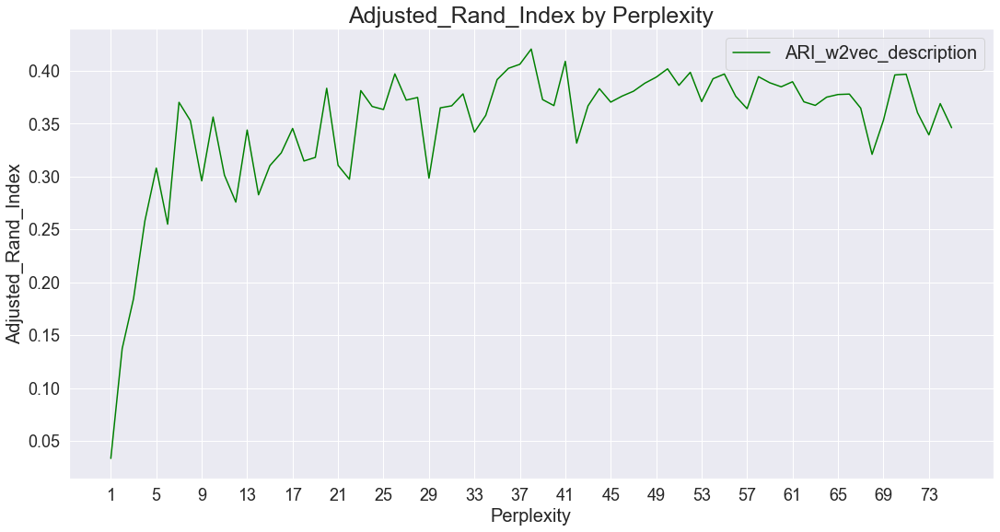

In [277]:
# Plot ARI by perplexity
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_w2vec_description

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_w2vec_description')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4207 time :  8.0


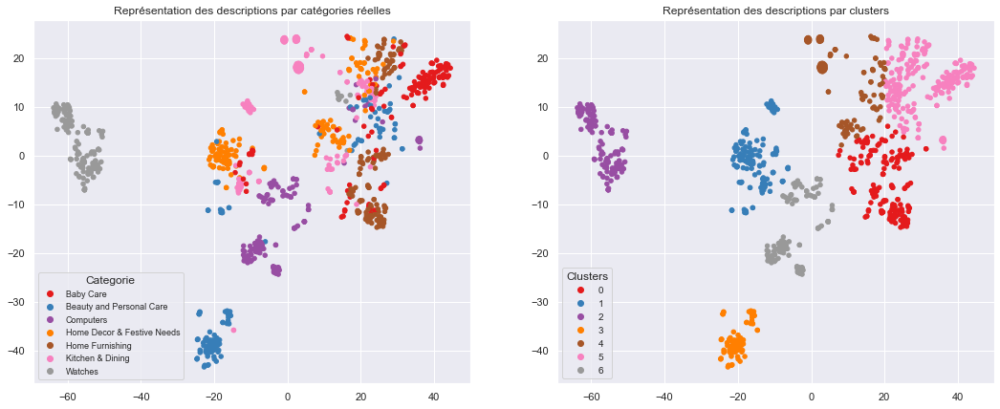

ARI :  0.4207


In [278]:
# Execute word2vec model with optimal perplexity for 'description_bow_lem' feature
# fit on description_bow_lem
ARI, X_tsne, labels = ARI_fct(embeddings, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

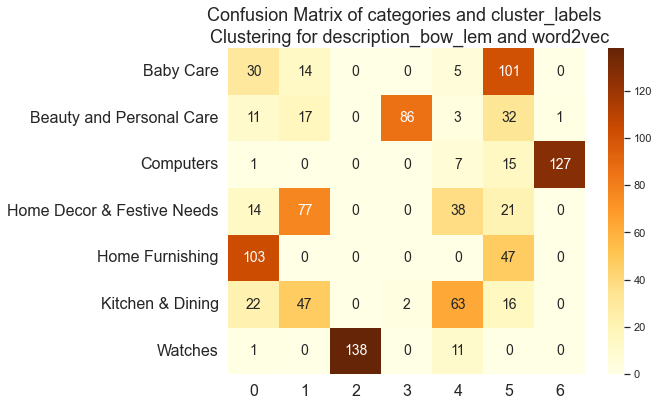

In [279]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'word2vec on description_bow_lem')

In [280]:
# Calculate metrics by category and accuracy
dict_classification, metrics_w2vec_description = class_report(true_labels, labels)

                            precision    recall  f1-score   support

                 Baby Care      0.435     0.673     0.529       150
  Beauty and Personal Care      0.977     0.573     0.723       150
                 Computers      0.992     0.847     0.914       150
Home Decor & Festive Needs      0.497     0.513     0.505       150
           Home Furnishing      0.566     0.687     0.620       150
          Kitchen & Dining      0.496     0.420     0.455       150
                   Watches      1.000     0.920     0.958       150

                  accuracy                          0.662      1050
                 macro avg      0.709     0.662     0.672      1050
              weighted avg      0.709     0.662     0.672      1050



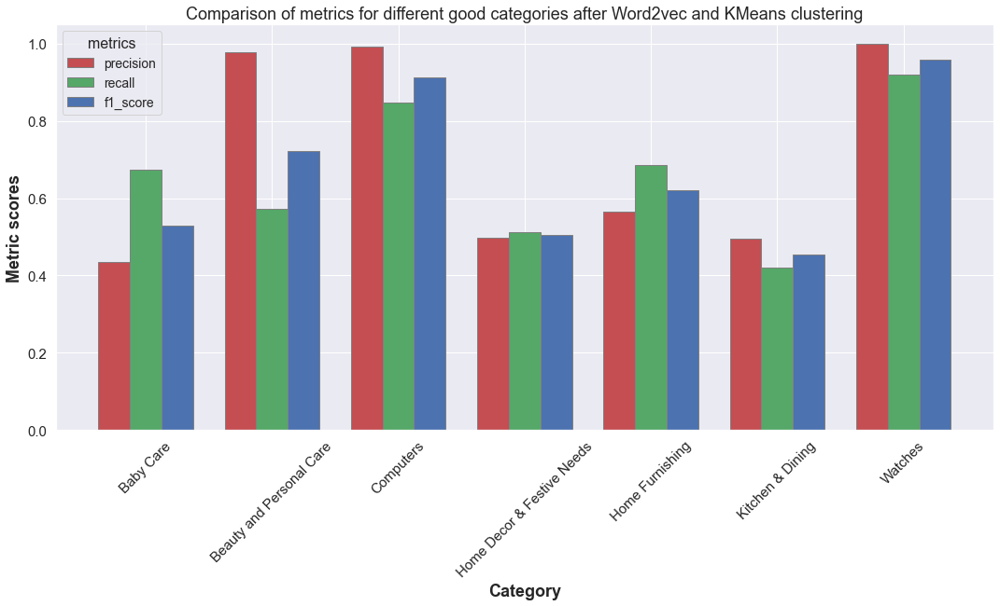

In [283]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_w2vec_description, 
                model_name = 'Word2Vec (description)')

## Create Word2Vec model with min_count = 2

In [1467]:
# Function to create embedding model
def Word2Vec_embedding(data_feature, w2v_size, w2v_window, 
                       w2v_min_count, w2v_epochs, maxlen):
    # Create text description for each product
    descriptions = data['description_bow_lem'].to_list()
    descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]
    
    # Create Word2Vec model
    print("Build & train Word2Vec model ...")
    w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                       window = w2v_window,
                                       vector_size = w2v_size,
                                       epochs = w2v_epochs,
                                       seed = 42)
    # Build vocabulary
    w2v_model.build_vocab(descriptions)
    # Train Word2Vec model on descriptions
    w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = 100)
    model_vectors = w2v_model.wv
    w2v_words = model_vectors.index_to_key
    print("Vocabulary size: %i" % len(w2v_words))
    print("Word2Vec trained")
    
    # Preparation of sentences (tokenization)
    print("Fit Tokenizer ...")
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(descriptions)
    # Padding each sequence (adding 0 until maxlen)
    x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                                   maxlen = maxlen,
                                   padding = 'post') 
                                                   
    num_words = len(tokenizer.word_index) + 1
    print("Number of unique words: %i" % num_words)
    
    # Create embedding matrix
    print("Create Embedding matrix ...")
    word_index = tokenizer.word_index
    vocab_size = len(word_index) + 1
    embedding_matrix = np.zeros((vocab_size, w2v_size))
    i=0
    j=0
    
    for word, idx in word_index.items():
        i +=1
        if word in w2v_words:
            j +=1
            embedding_vector = model_vectors[word]
            if embedding_vector is not None:
                embedding_matrix[idx] = model_vectors[word]
            
    word_rate = np.round(j/i,4)
    print("Word embedding rate : ", word_rate)
    print("Embedding matrix: %s" % str(embedding_matrix.shape))
    
    # Create embedding model
    input = Input(shape = (len(x_descriptions),maxlen), dtype = 'float64')
    word_input = Input(shape = (maxlen, ), dtype = 'float64')  
    word_embedding = Embedding(input_dim = vocab_size,
                               output_dim = w2v_size,
                               weights = [embedding_matrix],
                               input_length = maxlen)(word_input)
    word_vec = GlobalAveragePooling1D()(word_embedding)  
    embed_model = Model([word_input],word_vec)

    print(embed_model.summary())
    
    # Predict embeddings
    embeddings = embed_model.predict(x_descriptions)
    print("embeddings.shape: ", embeddings.shape)
    
    return embeddings

In [291]:
# Word2Vec embedding with min_count = 2
embeddings = Word2Vec_embedding(data_feature = data['description_bow_lem'], 
                                w2v_size = 100, 
                                w2v_window = 5,
                                w2v_min_count = 2, 
                                w2v_epochs = 10, 
                                maxlen = data['length_bow_lem'].max())

Build & train Word2Vec model ...
Vocabulary size: 3266
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4630
Create Embedding matrix ...
Word embedding rate :  0.7056
Embedding matrix: (4630, 100)
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 354)]             0         
                                                                 
 embedding_1 (Embedding)     (None, 354, 100)          463000    
                                                                 
 global_average_pooling1d_1   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,000
Trainable params: 463,000
Non-trainable params: 0
_________________________________________________________________
None
embeddings.shape:  (1050, 100)


In [292]:
# Execute Word2Vec embedding model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem - min_count = 2
ARI_w2vec_description_mincount2, opt_perplexity = ARI_calculation(embeddings)

ARI :  0.0579 time :  5.0
ARI :  0.117 time :  6.0
ARI :  0.1812 time :  6.0
ARI :  0.2612 time :  6.0
ARI :  0.2735 time :  6.0
ARI :  0.2249 time :  6.0
ARI :  0.2892 time :  6.0
ARI :  0.3125 time :  6.0
ARI :  0.3258 time :  5.0
ARI :  0.342 time :  6.0
ARI :  0.402 time :  6.0
ARI :  0.3608 time :  5.0
ARI :  0.3271 time :  5.0
ARI :  0.3254 time :  6.0
ARI :  0.304 time :  6.0
ARI :  0.3317 time :  6.0
ARI :  0.3276 time :  6.0
ARI :  0.3218 time :  6.0
ARI :  0.3594 time :  6.0
ARI :  0.3241 time :  6.0
ARI :  0.3284 time :  6.0
ARI :  0.367 time :  7.0
ARI :  0.3979 time :  6.0
ARI :  0.3561 time :  6.0
ARI :  0.382 time :  6.0
ARI :  0.3846 time :  6.0
ARI :  0.3961 time :  6.0
ARI :  0.4011 time :  7.0
ARI :  0.4128 time :  8.0
ARI :  0.3354 time :  7.0
ARI :  0.3288 time :  7.0
ARI :  0.4092 time :  7.0
ARI :  0.4157 time :  8.0
ARI :  0.4208 time :  8.0
ARI :  0.4012 time :  8.0
ARI :  0.4208 time :  8.0
ARI :  0.402 time :  8.0
ARI :  0.392 time :  8.0
ARI :  0.387 time : 

## Create Word2Vec model with min_count = 3

In [311]:
# Word2Vec embedding with min_count = 3
embeddings = Word2Vec_embedding(data_feature = data['description_bow_lem'], 
                                w2v_size = 100, 
                                w2v_window = 5,
                                w2v_min_count = 3, 
                                w2v_epochs = 10, 
                                maxlen = data['length_bow_lem'].max())

Build & train Word2Vec model ...
Vocabulary size: 2208
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4630
Create Embedding matrix ...
Word embedding rate :  0.477
Embedding matrix: (4630, 100)
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 354)]             0         
                                                                 
 embedding_9 (Embedding)     (None, 354, 100)          463000    
                                                                 
 global_average_pooling1d_9   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,000
Trainable params: 463,000
Non-trainable params: 0
_________________________________________________________________
None
embeddings.shape:  (1050, 100)


In [312]:
# Execute Word2Vec embedding model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem - min_count = 3
ARI_w2vec_description_mincount3, opt_perplexity = ARI_calculation(embeddings)

ARI :  0.0447 time :  5.0
ARI :  0.145 time :  5.0
ARI :  0.1677 time :  5.0
ARI :  0.2173 time :  5.0
ARI :  0.2731 time :  5.0
ARI :  0.2836 time :  5.0
ARI :  0.2683 time :  5.0
ARI :  0.2725 time :  5.0
ARI :  0.2992 time :  5.0
ARI :  0.3115 time :  5.0
ARI :  0.3219 time :  5.0
ARI :  0.2992 time :  5.0
ARI :  0.3462 time :  5.0
ARI :  0.3644 time :  5.0
ARI :  0.3716 time :  5.0
ARI :  0.3582 time :  5.0
ARI :  0.3474 time :  5.0
ARI :  0.352 time :  5.0
ARI :  0.3255 time :  5.0
ARI :  0.325 time :  5.0
ARI :  0.3426 time :  5.0
ARI :  0.4006 time :  5.0
ARI :  0.4137 time :  6.0
ARI :  0.4184 time :  5.0
ARI :  0.3945 time :  6.0
ARI :  0.3307 time :  6.0
ARI :  0.398 time :  6.0
ARI :  0.4267 time :  7.0
ARI :  0.393 time :  6.0
ARI :  0.3899 time :  7.0
ARI :  0.3398 time :  6.0
ARI :  0.3817 time :  6.0
ARI :  0.3989 time :  7.0
ARI :  0.344 time :  7.0
ARI :  0.4172 time :  7.0
ARI :  0.3936 time :  7.0
ARI :  0.371 time :  7.0
ARI :  0.3871 time :  7.0
ARI :  0.3812 time 

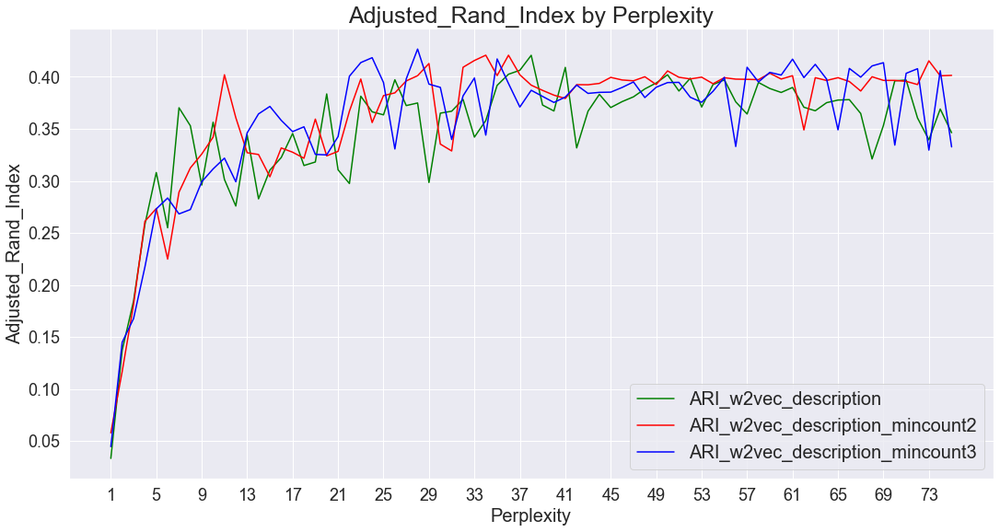

In [313]:
# Plot ARI by perplexity
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_w2vec_description
y2 = ARI_w2vec_description_mincount2
y3 = ARI_w2vec_description_mincount3

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_w2vec_description')
ax.plot(x, y2, color = 'red', label = 'ARI_w2vec_description_mincount2')
ax.plot(x, y3, color = 'blue', label = 'ARI_w2vec_description_mincount3')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5

In [297]:
# Word2Vec embedding with min_count = 5
embeddings = Word2Vec_embedding(data_feature = data['description_bow_lem'], 
                                w2v_size = 100, 
                                w2v_window = 5,
                                w2v_min_count = 5, 
                                w2v_epochs = 10, 
                                maxlen = data['length_bow_lem'].max())

Build & train Word2Vec model ...
Vocabulary size: 1456
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4630
Create Embedding matrix ...
Word embedding rate :  0.3145
Embedding matrix: (4630, 100)
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 354)]             0         
                                                                 
 embedding_3 (Embedding)     (None, 354, 100)          463000    
                                                                 
 global_average_pooling1d_3   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,000
Trainable params: 463,000
Non-trainable params: 0
_________________________________________________________________
None
embeddings.shape:  (1050, 100)


In [298]:
# Execute Word2Vec embedding model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem - min_count = 5
ARI_w2vec_description_mincount5, opt_perplexity = ARI_calculation(embeddings)

ARI :  0.0355 time :  5.0
ARI :  0.1621 time :  5.0
ARI :  0.1513 time :  5.0
ARI :  0.2411 time :  5.0
ARI :  0.2475 time :  5.0
ARI :  0.2499 time :  5.0
ARI :  0.2963 time :  5.0
ARI :  0.3223 time :  5.0
ARI :  0.3054 time :  5.0
ARI :  0.2613 time :  5.0
ARI :  0.3553 time :  5.0
ARI :  0.3556 time :  5.0
ARI :  0.3392 time :  5.0
ARI :  0.3293 time :  5.0
ARI :  0.369 time :  5.0
ARI :  0.3271 time :  6.0
ARI :  0.3689 time :  5.0
ARI :  0.3275 time :  5.0
ARI :  0.3715 time :  5.0
ARI :  0.3413 time :  5.0
ARI :  0.4122 time :  5.0
ARI :  0.3936 time :  6.0
ARI :  0.3876 time :  5.0
ARI :  0.3932 time :  5.0
ARI :  0.4126 time :  6.0
ARI :  0.3976 time :  5.0
ARI :  0.3531 time :  6.0
ARI :  0.3395 time :  7.0
ARI :  0.4139 time :  6.0
ARI :  0.4065 time :  7.0
ARI :  0.3461 time :  7.0
ARI :  0.3811 time :  7.0
ARI :  0.3547 time :  7.0
ARI :  0.3777 time :  7.0
ARI :  0.405 time :  8.0
ARI :  0.3475 time :  8.0
ARI :  0.3523 time :  8.0
ARI :  0.406 time :  8.0
ARI :  0.386 ti

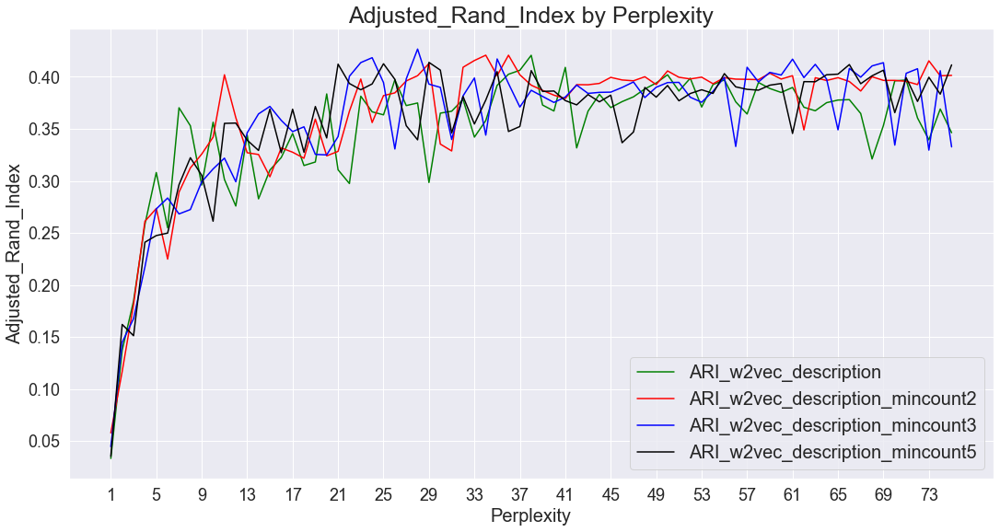

In [314]:
# Plot ARI by perplexity
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_w2vec_description
y2 = ARI_w2vec_description_mincount2
y3 = ARI_w2vec_description_mincount3
y4 = ARI_w2vec_description_mincount5

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_w2vec_description')
ax.plot(x, y2, color = 'red', label = 'ARI_w2vec_description_mincount2')
ax.plot(x, y3, color = 'blue', label = 'ARI_w2vec_description_mincount3')
ax.plot(x, y4, color = 'black', label = 'ARI_w2vec_description_mincount5')


plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 3 and window = 2

In [303]:
# Word2Vec embedding with min_count = 3 et window = 2
embeddings = Word2Vec_embedding(data_feature = data['description_bow_lem'], 
                                w2v_size = 100, 
                                w2v_window = 2,
                                w2v_min_count = 3, 
                                w2v_epochs = 10, 
                                maxlen = data['length_bow_lem'].max())

Build & train Word2Vec model ...
Vocabulary size: 2208
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4630
Create Embedding matrix ...
Word embedding rate :  0.477
Embedding matrix: (4630, 100)
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 354)]             0         
                                                                 
 embedding_5 (Embedding)     (None, 354, 100)          463000    
                                                                 
 global_average_pooling1d_5   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,000
Trainable params: 463,000
Non-trainable params: 0
_________________________________________________________________
None
embeddings.shape:  (1050, 100)


In [304]:
# Execute Word2Vec embedding model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem - min_count = 3 and window = 2
ARI_w2vec_description_mincount3_window2, opt_perplexity = ARI_calculation(embeddings)

ARI :  0.0486 time :  5.0
ARI :  0.1225 time :  5.0
ARI :  0.1518 time :  5.0
ARI :  0.2265 time :  5.0
ARI :  0.2711 time :  5.0
ARI :  0.3168 time :  6.0
ARI :  0.289 time :  7.0
ARI :  0.3259 time :  6.0
ARI :  0.308 time :  7.0
ARI :  0.32 time :  6.0
ARI :  0.3597 time :  6.0
ARI :  0.3189 time :  5.0
ARI :  0.3238 time :  5.0
ARI :  0.3332 time :  5.0
ARI :  0.3377 time :  5.0
ARI :  0.343 time :  5.0
ARI :  0.3285 time :  5.0
ARI :  0.3518 time :  5.0
ARI :  0.3603 time :  5.0
ARI :  0.3578 time :  5.0
ARI :  0.3502 time :  5.0
ARI :  0.3253 time :  5.0
ARI :  0.3505 time :  5.0
ARI :  0.3521 time :  5.0
ARI :  0.3532 time :  5.0
ARI :  0.3225 time :  6.0
ARI :  0.355 time :  6.0
ARI :  0.3571 time :  6.0
ARI :  0.3536 time :  7.0
ARI :  0.3512 time :  7.0
ARI :  0.3128 time :  7.0
ARI :  0.3622 time :  6.0
ARI :  0.3564 time :  7.0
ARI :  0.3539 time :  7.0
ARI :  0.3576 time :  7.0
ARI :  0.3494 time :  7.0
ARI :  0.3543 time :  7.0
ARI :  0.3545 time :  7.0
ARI :  0.3616 time

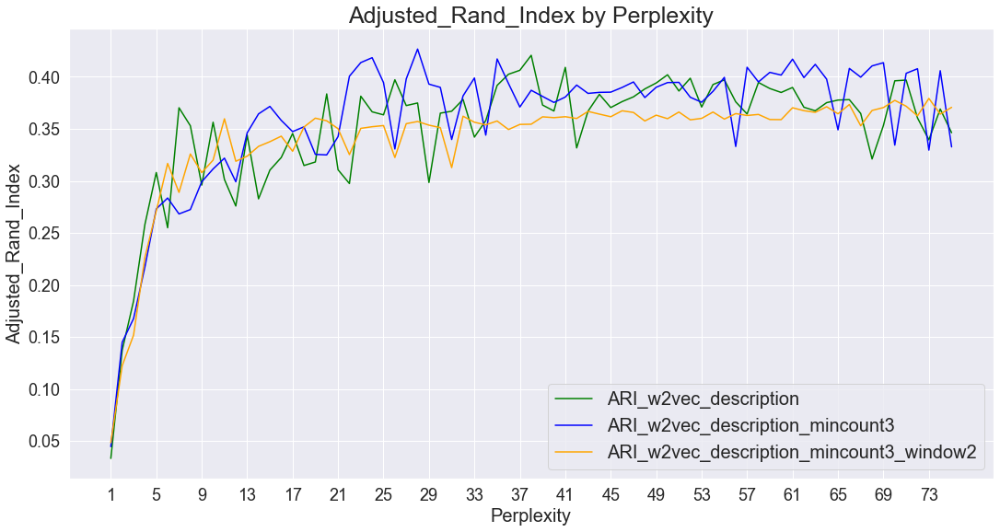

In [315]:
# Plot ARI by perplexity
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_w2vec_description
y2 = ARI_w2vec_description_mincount2
y3 = ARI_w2vec_description_mincount3
y4 = ARI_w2vec_description_mincount5
y5 = ARI_w2vec_description_mincount3_window2

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_w2vec_description')
ax.plot(x, y3, color = 'blue', label = 'ARI_w2vec_description_mincount3')
ax.plot(x, y5, color = 'orange', label = 'ARI_w2vec_description_mincount3_window2')


plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 3 and window = 10

In [306]:
# Word2Vec embedding with min_count = 3 et window = 10
embeddings = Word2Vec_embedding(data_feature = data['description_bow_lem'], 
                                w2v_size = 100, 
                                w2v_window = 10,
                                w2v_min_count = 3, 
                                w2v_epochs = 10, 
                                maxlen = data['length_bow_lem'].max())

Build & train Word2Vec model ...
Vocabulary size: 2208
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4630
Create Embedding matrix ...
Word embedding rate :  0.477
Embedding matrix: (4630, 100)
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 354)]             0         
                                                                 
 embedding_6 (Embedding)     (None, 354, 100)          463000    
                                                                 
 global_average_pooling1d_6   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,000
Trainable params: 463,000
Non-trainable params: 0
_________________________________________________________________
None
embeddings.shape:  (1050, 100)


In [307]:
# Execute Word2Vec embedding model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem - min_count = 3 and window = 10
ARI_w2vec_description_mincount3_window10, opt_perplexity = ARI_calculation(embeddings)

ARI :  0.0353 time :  5.0
ARI :  0.1194 time :  6.0
ARI :  0.2359 time :  5.0
ARI :  0.2881 time :  5.0
ARI :  0.2733 time :  5.0
ARI :  0.2398 time :  6.0
ARI :  0.3049 time :  5.0
ARI :  0.2564 time :  5.0
ARI :  0.3296 time :  5.0
ARI :  0.3654 time :  5.0
ARI :  0.3536 time :  6.0
ARI :  0.3399 time :  6.0
ARI :  0.3094 time :  5.0
ARI :  0.3247 time :  5.0
ARI :  0.2648 time :  5.0
ARI :  0.329 time :  5.0
ARI :  0.394 time :  5.0
ARI :  0.3246 time :  5.0
ARI :  0.3155 time :  5.0
ARI :  0.332 time :  5.0
ARI :  0.3979 time :  5.0
ARI :  0.3384 time :  5.0
ARI :  0.3832 time :  5.0
ARI :  0.3378 time :  6.0
ARI :  0.3756 time :  5.0
ARI :  0.3878 time :  5.0
ARI :  0.3965 time :  6.0
ARI :  0.3851 time :  6.0
ARI :  0.385 time :  6.0
ARI :  0.4065 time :  7.0
ARI :  0.4122 time :  6.0
ARI :  0.4162 time :  7.0
ARI :  0.4051 time :  7.0
ARI :  0.4099 time :  7.0
ARI :  0.4074 time :  7.0
ARI :  0.409 time :  7.0
ARI :  0.3941 time :  8.0
ARI :  0.3972 time :  8.0
ARI :  0.4029 tim

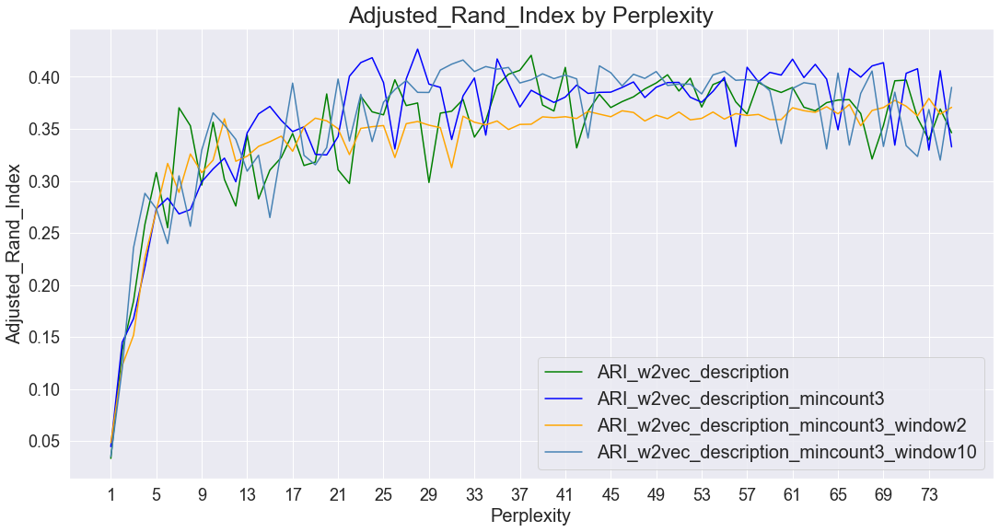

In [316]:
# Plot ARI by perplexity
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_w2vec_description
y2 = ARI_w2vec_description_mincount2
y3 = ARI_w2vec_description_mincount3
y4 = ARI_w2vec_description_mincount5
y5 = ARI_w2vec_description_mincount3_window2
y6 = ARI_w2vec_description_mincount3_window10

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_w2vec_description')
ax.plot(x, y3, color = 'blue', label = 'ARI_w2vec_description_mincount3')
ax.plot(x, y5, color = 'orange', label = 'ARI_w2vec_description_mincount3_window2')
ax.plot(x, y6, color = 'steelblue', label = 'ARI_w2vec_description_mincount3_window10')


plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4267 time :  6.0


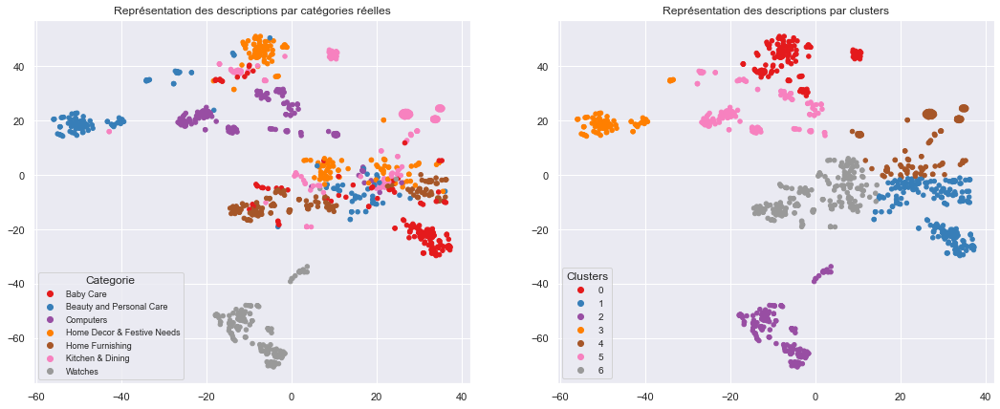

ARI :  0.4267


In [317]:
# DISPLAY BEST RESULTS CLUSTERING (min_count = 3)

# Execute word2vec model with optimal perplexity (28) for 'description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(embeddings, 28)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

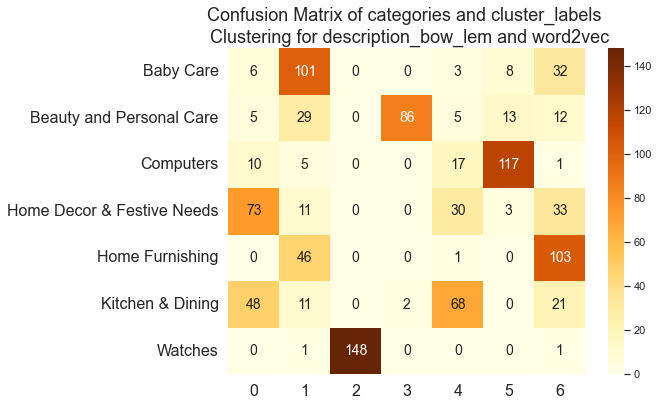

In [318]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'word2vec on description_bow_lem (min_df = 3)')

In [319]:
# Calculate metrics by category and accuracy
dict_classification, metrics_w2vec_description_mindf3 = class_report(true_labels, labels)

                            precision    recall  f1-score   support

                 Baby Care      0.495     0.673     0.571       150
  Beauty and Personal Care      0.977     0.573     0.723       150
                 Computers      0.830     0.780     0.804       150
Home Decor & Festive Needs      0.514     0.487     0.500       150
           Home Furnishing      0.507     0.687     0.584       150
          Kitchen & Dining      0.548     0.453     0.496       150
                   Watches      1.000     0.987     0.993       150

                  accuracy                          0.663      1050
                 macro avg      0.696     0.663     0.667      1050
              weighted avg      0.696     0.663     0.667      1050



,precision,recall,f1-score
Baby Care,0.495,0.673,0.571
Beauty and Personal Care,0.977,0.573,0.723
Computers,0.830,0.780,0.804
Home Decor & Festive Needs,0.514,0.487,0.500
Home Furnishing,0.507,0.687,0.584
Kitchen & Dining,0.548,0.453,0.496
Watches,1.000,0.987,0.993


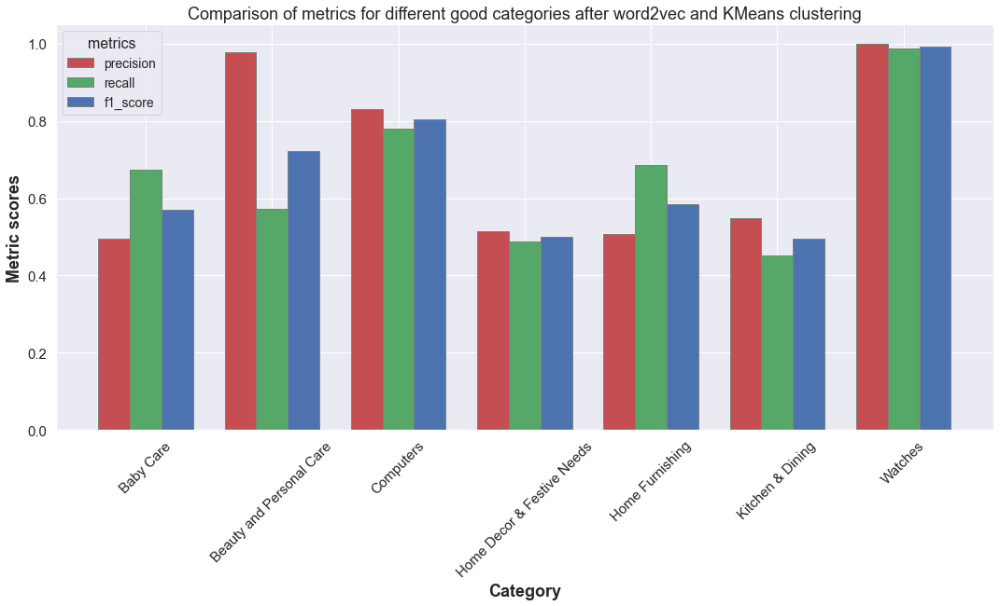

In [321]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_w2vec_description_mindf3, 
                model_name = 'Word2vec (description - min_df = 3)')

# Tfidf weighted Word2Vec

In [992]:
# create bag of words (Tf-idf) for 'description_bow_lem' feature - min_df = 2
ctf = TfidfVectorizer(stop_words='english', max_df = 0.95, min_df = 2)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])
ctf_transform

<1050x1998 sparse matrix of type '<class 'numpy.float64'>'
	with 29621 stored elements in Compressed Sparse Row format>

In [993]:
# Train Word2Vec model using your own text corpus
i=0
list_of_sentence=[]
for sentence in data['description_bow_lem']:
    list_of_sentence.append(sentence.split())

In [707]:
# Create Word2Vec model (min_count = 3)
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = 3, 
                                   window = 5,
                                   vector_size = 100,
                                   epochs = 10,
                                   seed = 42)

Build & train Word2Vec model ...


In [708]:
# Build vocabulary
w2v_model.build_vocab(list_of_sentence)
# Train Word2Vec model on list_of_sentence
w2v_model.train(list_of_sentence, total_examples = w2v_model.corpus_count, epochs = 100)

(4057920, 5319700)

In [711]:
w2v_words = list(w2v_model.wv.key_to_index.keys())
len(w2v_words)

2196

In [716]:
# TF-IDF weighted Word2Vec
tfidf_feat = ctf.get_feature_names() # tfidf words/col-names
tfidf_sent_vectors = []; # the tfidf-w2v for each sentence is stored in this list
row = 0;

for sent in list_of_sentence: # for each sentence 
    sent_vec = np.zeros(100) # as word vectors are of zero length
    weight_sum = 0; # numner of words with a valid vector in the sentence
    for word in sent: # for each word in a sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            # tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)] 
            # dictionary[word] = idf value of word in whole corpus
            # sent.count(word) = tf values of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

In [719]:
# Execute tfidf weighted Word2Vec model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem - min_count = 3 and window = 5
ARI_tfidf_w2vec, opt_perplexity = ARI_calculation(tfidf_sent_vectors)

ARI :  0.0548 time :  7.0
ARI :  0.1067 time :  7.0
ARI :  0.183 time :  7.0
ARI :  0.2196 time :  8.0
ARI :  0.3671 time :  8.0
ARI :  0.4022 time :  7.0
ARI :  0.4316 time :  9.0
ARI :  0.3741 time :  8.0
ARI :  0.4269 time :  7.0
ARI :  0.4497 time :  8.0
ARI :  0.3947 time :  8.0
ARI :  0.4713 time :  8.0
ARI :  0.5209 time :  8.0
ARI :  0.4285 time :  8.0
ARI :  0.5241 time :  9.0
ARI :  0.4729 time :  9.0
ARI :  0.4969 time :  10.0
ARI :  0.5424 time :  9.0
ARI :  0.4961 time :  9.0
ARI :  0.457 time :  8.0
ARI :  0.5433 time :  9.0
ARI :  0.5461 time :  8.0
ARI :  0.5136 time :  9.0
ARI :  0.5374 time :  9.0
ARI :  0.514 time :  9.0
ARI :  0.5681 time :  9.0
ARI :  0.5228 time :  9.0
ARI :  0.534 time :  9.0
ARI :  0.4992 time :  9.0
ARI :  0.5336 time :  9.0
ARI :  0.5137 time :  9.0
ARI :  0.5021 time :  10.0
ARI :  0.5116 time :  9.0
ARI :  0.5061 time :  9.0
ARI :  0.494 time :  10.0
ARI :  0.5131 time :  10.0
ARI :  0.4756 time :  10.0
ARI :  0.4667 time :  7.0
ARI :  0.448

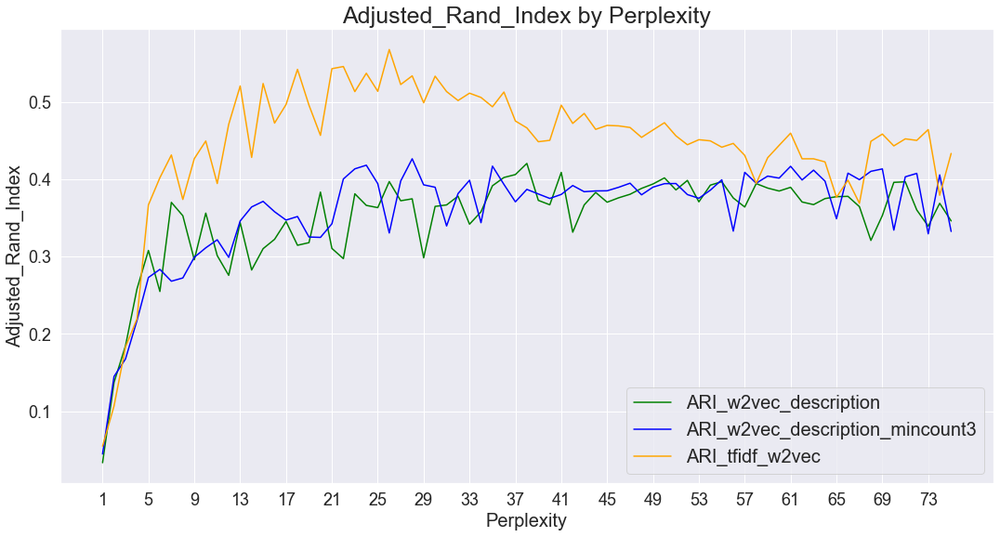

In [720]:
# Plot ARI by perplexity
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_w2vec_description
y2 = ARI_w2vec_description_mincount2
y3 = ARI_w2vec_description_mincount3
y4 = ARI_w2vec_description_mincount5
y5 = ARI_w2vec_description_mincount3_window2
y6 = ARI_w2vec_description_mincount3_window10
y7 = ARI_tfidf_w2vec

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_w2vec_description')
ax.plot(x, y3, color = 'blue', label = 'ARI_w2vec_description_mincount3')
ax.plot(x, y7, color = 'orange', label = 'ARI_tfidf_w2vec')


plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.5681 time :  9.0


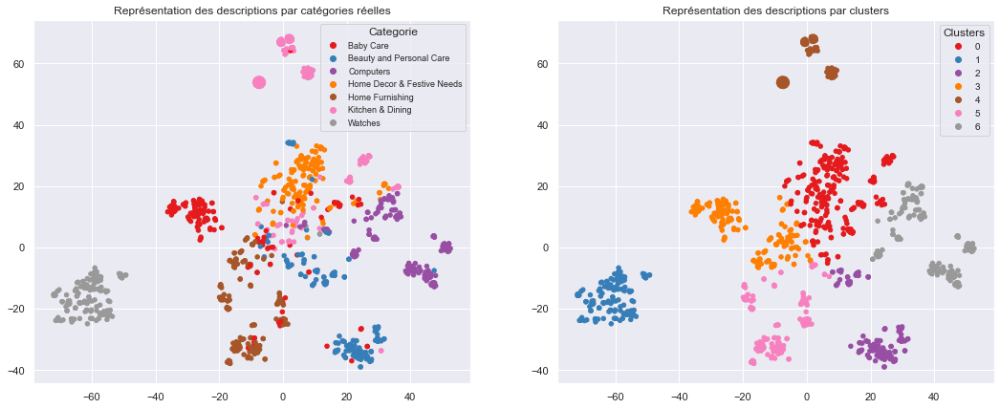

ARI :  0.5681


In [721]:
# DISPLAY BEST RESULTS CLUSTERING
# Execute tfidf weigthed word2vec model with optimal perplexity (26) for 'description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(tfidf_sent_vectors, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

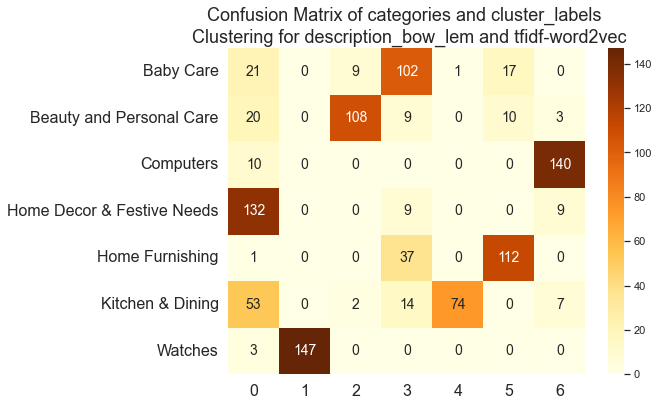

In [722]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'tfidf-word2vec on description_bow_lem')

In [723]:
# Calculate metrics by category and accuracy
dict_classification, metrics_tfidf_w2vec_description = class_report(true_labels, labels)

                            precision    recall  f1-score   support

                 Baby Care      0.596     0.680     0.636       150
  Beauty and Personal Care      0.908     0.720     0.803       150
                 Computers      0.881     0.933     0.906       150
Home Decor & Festive Needs      0.550     0.880     0.677       150
           Home Furnishing      0.806     0.747     0.775       150
          Kitchen & Dining      0.987     0.493     0.658       150
                   Watches      1.000     0.980     0.990       150

                  accuracy                          0.776      1050
                 macro avg      0.818     0.776     0.778      1050
              weighted avg      0.818     0.776     0.778      1050



,precision,recall,f1-score
Baby Care,0.596,0.680,0.636
Beauty and Personal Care,0.908,0.720,0.803
Computers,0.881,0.933,0.906
Home Decor & Festive Needs,0.550,0.880,0.677
Home Furnishing,0.806,0.747,0.775
Kitchen & Dining,0.987,0.493,0.658
Watches,1.000,0.980,0.990


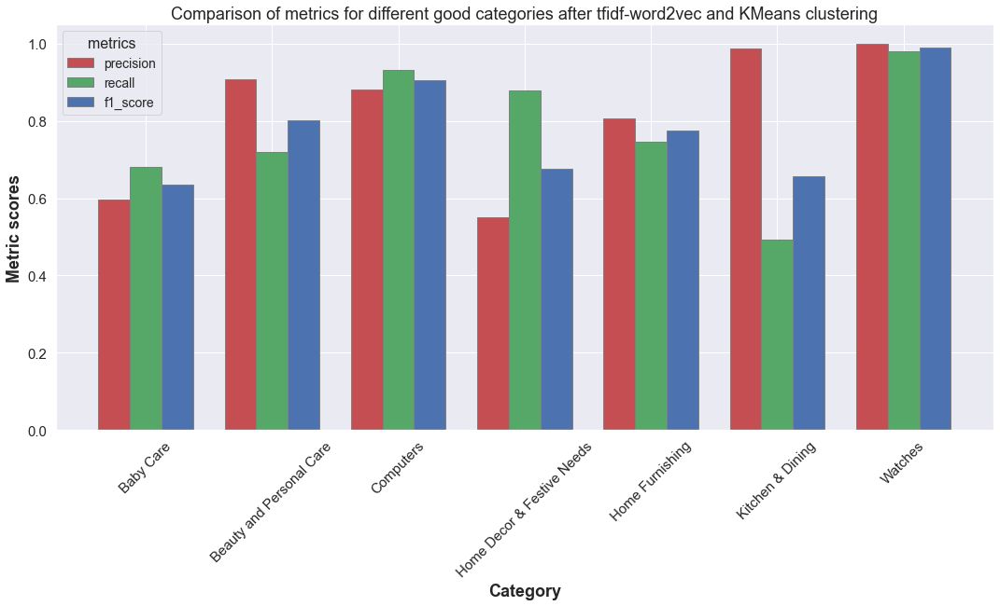

In [725]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_tfidf_w2vec_description, 
                model_name = 'tfidf-Word2vec (description)')

## Tfidf weighted Word2Vec #2

In [726]:
# Create Word2Vec model (min_count = 2)
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = 2, 
                                   window = 5,
                                   vector_size = 100,
                                   epochs = 10,
                                   seed = 42)

# Build vocabulary
w2v_model.build_vocab(list_of_sentence)
# Train Word2Vec model on list_of_sentence
w2v_model.train(list_of_sentence, total_examples = w2v_model.corpus_count, epochs = 100)

w2v_words = list(w2v_model.wv.key_to_index.keys())
len(w2v_words)

Build & train Word2Vec model ...


3320

In [727]:
# TF-IDF weighted Word2Vec
tfidf_feat = ctf.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row = 0;

for sent in list_of_sentence: # for each review/sentence 
    sent_vec = np.zeros(100) # as word vectors are of zero length
    weight_sum = 0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            # tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf values of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

In [728]:
# Execute tfidf weighted Word2Vec model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem - min_count = 2 and window = 5
ARI_tfidf_w2vec_mincount2, opt_perplexity = ARI_calculation(tfidf_sent_vectors)

ARI :  0.0171 time :  8.0
ARI :  0.1845 time :  8.0
ARI :  0.2955 time :  8.0
ARI :  0.2738 time :  8.0
ARI :  0.3074 time :  7.0
ARI :  0.3771 time :  7.0
ARI :  0.3592 time :  8.0
ARI :  0.4122 time :  8.0
ARI :  0.5083 time :  8.0
ARI :  0.4874 time :  8.0
ARI :  0.4987 time :  9.0
ARI :  0.4653 time :  8.0
ARI :  0.4839 time :  8.0
ARI :  0.5508 time :  9.0
ARI :  0.5133 time :  9.0
ARI :  0.4714 time :  9.0
ARI :  0.4912 time :  9.0
ARI :  0.4836 time :  8.0
ARI :  0.5048 time :  8.0
ARI :  0.4872 time :  8.0
ARI :  0.4936 time :  8.0
ARI :  0.5489 time :  9.0
ARI :  0.5199 time :  9.0
ARI :  0.5163 time :  9.0
ARI :  0.5215 time :  9.0
ARI :  0.524 time :  8.0
ARI :  0.508 time :  9.0
ARI :  0.5183 time :  10.0
ARI :  0.5503 time :  9.0
ARI :  0.5349 time :  9.0
ARI :  0.507 time :  9.0
ARI :  0.522 time :  9.0
ARI :  0.5541 time :  10.0
ARI :  0.508 time :  10.0
ARI :  0.5051 time :  10.0
ARI :  0.5553 time :  10.0
ARI :  0.5032 time :  9.0
ARI :  0.5072 time :  10.0
ARI :  0.48

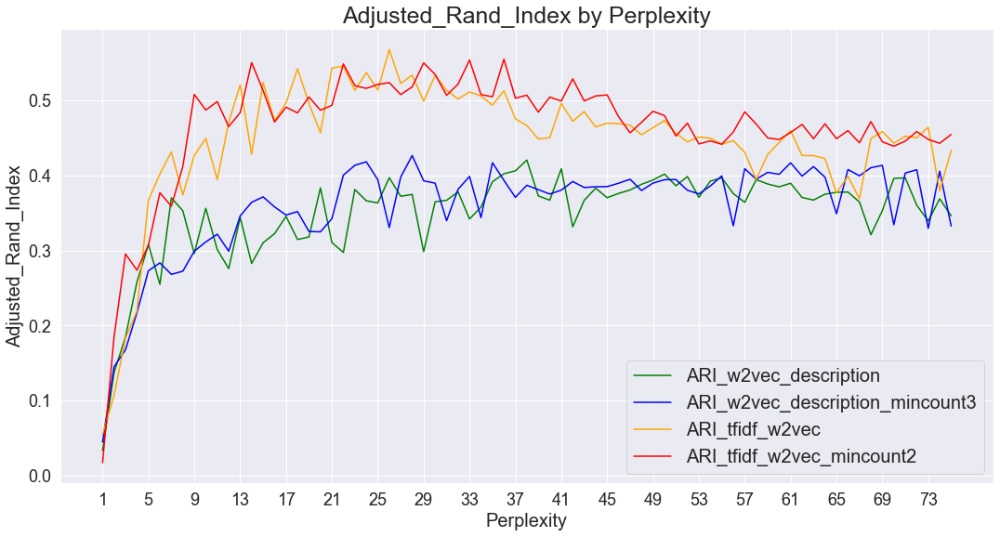

In [729]:
# Plot ARI by perplexity
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_w2vec_description
y2 = ARI_w2vec_description_mincount2
y3 = ARI_w2vec_description_mincount3
y4 = ARI_w2vec_description_mincount5
y5 = ARI_w2vec_description_mincount3_window2
y6 = ARI_w2vec_description_mincount3_window10
y7 = ARI_tfidf_w2vec
y8 = ARI_tfidf_w2vec_mincount2

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_w2vec_description')
ax.plot(x, y3, color = 'blue', label = 'ARI_w2vec_description_mincount3')
ax.plot(x, y7, color = 'orange', label = 'ARI_tfidf_w2vec')
ax.plot(x, y8, color = 'red', label = 'ARI_tfidf_w2vec_mincount2')


plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

### Conclusion for Word2Vec
- Best results with tf_idf weighted word2vec compared to average weighted word2vec
- Best results remain to tf-idf vectorizer

# Tf-idf classification using best model : tf-idf vectorizer (min_df = 2) and classifiers

In [1468]:
# create bag of words (Tf-idf) for 'description_bow_lem' feature - min_df = 2
ctf = TfidfVectorizer(stop_words='english', max_df = 0.95, min_df = 2)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])
ctf_transform

<1050x1998 sparse matrix of type '<class 'numpy.float64'>'
	with 29621 stored elements in Compressed Sparse Row format>

In [1469]:
# Execute tfidf model with perplexity from 1 to 75 for 'description_bow_lem' feature
# fit on description_bow_lem
ARI_tfidf, opt_perplexity = ARI_calculation(ctf_transform)

ARI :  0.044 time :  8.0
ARI :  0.2838 time :  9.0
ARI :  0.2428 time :  9.0
ARI :  0.4581 time :  10.0
ARI :  0.4653 time :  10.0
ARI :  0.4076 time :  10.0
ARI :  0.4838 time :  10.0
ARI :  0.4396 time :  10.0
ARI :  0.5261 time :  10.0
ARI :  0.577 time :  10.0
ARI :  0.4857 time :  9.0
ARI :  0.5196 time :  10.0
ARI :  0.4811 time :  9.0
ARI :  0.5299 time :  9.0
ARI :  0.5768 time :  10.0
ARI :  0.5747 time :  9.0
ARI :  0.5753 time :  9.0
ARI :  0.5797 time :  10.0
ARI :  0.5593 time :  9.0
ARI :  0.5601 time :  11.0
ARI :  0.5666 time :  9.0
ARI :  0.5521 time :  10.0
ARI :  0.5674 time :  12.0
ARI :  0.5373 time :  12.0
ARI :  0.549 time :  12.0
ARI :  0.5403 time :  12.0
ARI :  0.5258 time :  12.0
ARI :  0.5281 time :  12.0
ARI :  0.5245 time :  12.0
ARI :  0.4932 time :  12.0
ARI :  0.3821 time :  12.0
ARI :  0.5061 time :  11.0
ARI :  0.4168 time :  11.0
ARI :  0.436 time :  11.0
ARI :  0.3861 time :  11.0
ARI :  0.4551 time :  11.0
ARI :  0.4043 time :  11.0
ARI :  0.4214 t

In [1470]:
# Create two new features by dimension reduction (tSNE) -> 2 dimensions/features
tsne = manifold.TSNE(n_components=2, 
                     perplexity=opt_perplexity, 
                     n_iter=2000,
                     init='random', 
                     learning_rate=200, 
                     random_state=42)

X_tsne = tsne.fit_transform(ctf_transform)
X_tsne

array([[ 28.42127  ,  -3.6406987],
       [ 35.732365 ,  12.566121 ],
       [ 37.409874 ,  15.339784 ],
       ...,
       [-18.401724 ,   3.6064222],
       [-18.031858 ,   1.0235229],
       [-18.536058 ,   3.0991812]], dtype=float32)

In [1471]:
# Create new dataframe containing the 2 new features
df_class = pd.DataFrame(X_tsne, columns = ['X_tsne_1', 'X_tsne_2'])

#Adding '1st_cat' feature as true label
df_class['1st_cat'] = data['first_category']
df_class

,X_tsne_1,X_tsne_2,1st_cat
0,28.421270,-3.640699,Home Furnishing
1,35.732365,12.566121,Baby Care
2,37.409874,15.339784,Baby Care
3,42.367996,-20.849634,Home Furnishing
4,42.631596,-20.205454,Home Furnishing
...,...,...,...
1045,-23.827841,-0.075196,Baby Care
1046,-22.218140,-0.823526,Baby Care
1047,-18.401724,3.606422,Baby Care
1048,-18.031858,1.023523,Baby Care


### Test different classifiers

In [1472]:
# Create features dataframe and labels
X = df_class[['X_tsne_1', 'X_tsne_2']]
y = df_class['1st_cat'].values

In [1523]:
from sklearn.model_selection import RepeatedKFold, cross_validate

In [1483]:
# SVM classifier with cross-validation
from sklearn.svm import SVC

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create SVM classifier model
svc = SVC(C = 1.0, kernel = 'rbf')

# Calculate accuracy scores with cross_validate
svc_scores = cross_validate(svc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_svc = pd.DataFrame(svc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('svc mean accuracy test =', cv_results_svc['test_score'].mean())
print('svc mean accuracy train =', cv_results_svc['train_score'].mean())
print('------------------------------------')
print('svc moyenne fit time =', cv_results_svc['fit_time'].mean())
print('svc moyenne score time =', cv_results_svc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_svc)

svc mean accuracy test = 0.8718095238095239
svc mean accuracy train = 0.8763333333333335
------------------------------------
svc moyenne fit time = 0.012207069396972657
svc moyenne score time = 0.00829512596130371
------------------------------------
time :  1.3
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.011969    0.008008    0.852381     0.886905
1   0.011966    0.007948    0.900000     0.869048
2   0.010974    0.007942    0.861905     0.883333
3   0.013964    0.011998    0.909524     0.873810
4   0.015989    0.010940    0.833333     0.877381
5   0.018950    0.007978    0.866667     0.879762
6   0.012966    0.013962    0.857143     0.873810
7   0.016955    0.007980    0.861905     0.877381
8   0.010987    0.007989    0.866667     0.883333
9   0.010970    0.007979    0.890476     0.873810
10  0.011967    0.007980    0.861905     0.889286
11  0.011967    0.008976    0.885714     0.875000
12  0.010972    0.006981    0.852381     0.882143

In [1518]:
# RandomForest classifier with cross-validation
from sklearn.ensemble import RandomForestClassifier

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create RandomForest classifier model
rfc = RandomForestClassifier()

# Calculate accuracy scores with cross_validate
rfc_scores = cross_validate(rfc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_rfc = pd.DataFrame(rfc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('rfc mean accuracy test =', cv_results_rfc['test_score'].mean())
print('rfc mean accuracy train =', cv_results_rfc['train_score'].mean())
print('------------------------------------')
print('rfc moyenne fit time =', cv_results_rfc['fit_time'].mean())
print('rfc moyenne score time =', cv_results_rfc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_rfc)

rfc mean accuracy test = 0.9339047619047618
rfc mean accuracy train = 0.9999047619047619
------------------------------------
rfc moyenne fit time = 0.1208012866973877
rfc moyenne score time = 0.009855623245239259
------------------------------------
time :  3.7
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.124665    0.009974    0.942857      1.00000
1   0.130650    0.009971    0.966667      1.00000
2   0.118717    0.009971    0.928571      1.00000
3   0.112730    0.009973    0.938095      0.99881
4   0.115721    0.009975    0.919048      1.00000
5   0.115692    0.008942    0.914286      0.99881
6   0.116656    0.009973    0.914286      1.00000
7   0.119711    0.009976    0.957143      1.00000
8   0.115660    0.009973    0.928571      1.00000
9   0.121675    0.009974    0.971429      1.00000
10  0.120677    0.010009    0.942857      1.00000
11  0.119648    0.008976    0.938095      1.00000
12  0.118715    0.011969    0.938095      1.00000


In [1489]:
# GradientBoosting classifier with cross-validation
from sklearn.ensemble import GradientBoostingClassifier

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create GradientBoosting classifier model
gbc = GradientBoostingClassifier()

# Calculate accuracy scores with cross_validate
gbc_scores = cross_validate(gbc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_gbc = pd.DataFrame(gbc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('gbc mean accuracy test =', cv_results_gbc['test_score'].mean())
print('gbc mean accuracy train =', cv_results_gbc['train_score'].mean())
print('------------------------------------')
print('gbc moyenne fit time =', cv_results_gbc['fit_time'].mean())
print('gbc moyenne score time =', cv_results_gbc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_gbc)

gbc mean accuracy test = 0.9156190476190476
gbc mean accuracy train = 1.0
------------------------------------
gbc moyenne fit time = 0.6536909008026123
gbc moyenne score time = 0.003190107345581055
------------------------------------
time :  16.6
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.672234    0.002992    0.928571          1.0
1   0.643249    0.002991    0.942857          1.0
2   0.660203    0.004987    0.895238          1.0
3   0.701157    0.003959    0.928571          1.0
4   0.646272    0.002991    0.885714          1.0
5   0.649235    0.002991    0.928571          1.0
6   0.645305    0.002992    0.928571          1.0
7   0.648232    0.002994    0.923810          1.0
8   0.644278    0.002992    0.876190          1.0
9   0.656215    0.003989    0.923810          1.0
10  0.699162    0.002995    0.914286          1.0
11  0.643281    0.002991    0.966667          1.0
12  0.706082    0.002992    0.919048          1.0
13  0.667185  

In [1520]:
# KNeighborsClassifier classifier with cross-validation
from sklearn.neighbors import KNeighborsClassifier

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create KNeighbors classifier model
knc = KNeighborsClassifier()

# Calculate accuracy scores with cross_validate
knc_scores = cross_validate(knc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_knc = pd.DataFrame(knc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('knc mean accuracy test =', cv_results_knc['test_score'].mean())
print('knc mean accuracy train =', cv_results_knc['train_score'].mean())
print('------------------------------------')
print('knc moyenne fit time =', cv_results_knc['fit_time'].mean())
print('knc moyenne score time =', cv_results_knc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_knc)

knc mean accuracy test = 0.9140952380952382
knc mean accuracy train = 0.9403809523809524
------------------------------------
knc moyenne fit time = 0.0021556472778320314
knc moyenne score time = 0.006301259994506836
------------------------------------
time :  0.7
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.001995    0.006982    0.923810     0.950000
1   0.001995    0.006014    0.895238     0.941667
2   0.002001    0.005977    0.914286     0.941667
3   0.002992    0.007978    0.933333     0.935714
4   0.001994    0.006948    0.923810     0.934524
5   0.001994    0.010004    0.923810     0.936905
6   0.001997    0.007973    0.919048     0.941667
7   0.001995    0.005984    0.909524     0.945238
8   0.002992    0.005950    0.900000     0.939286
9   0.001997    0.006979    0.895238     0.944048
10  0.001994    0.005984    0.919048     0.934524
11  0.001994    0.005984    0.890476     0.944048
12  0.001995    0.006983    0.928571     0.9464

In [1521]:
# GaussianProcessClassifier classifier with cross-validation
from sklearn.gaussian_process import GaussianProcessClassifier

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create GaussianProcess classifier model
gpc = GaussianProcessClassifier()

# Calculate accuracy scores with cross_validate
gpc_scores = cross_validate(gpc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_gpc = pd.DataFrame(gpc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('gpc mean accuracy test =', cv_results_gpc['test_score'].mean())
print('gpc mean accuracy train =', cv_results_gpc['train_score'].mean())
print('------------------------------------')
print('gpc moyenne fit time =', cv_results_gpc['fit_time'].mean())
print('gpc moyenne score time =', cv_results_gpc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_gpc)

gpc mean accuracy test = 0.9297142857142856
gpc mean accuracy train = 0.9900952380952381
------------------------------------
gpc moyenne fit time = 3.528384189605713
gpc moyenne score time = 0.28639607429504393
------------------------------------
time :  117.7
------------------------------------
    fit_time  score_time  test_score  train_score
0   3.398911    0.269314    0.904762     0.994048
1   3.492692    0.280220    0.890476     0.992857
2   3.713071    0.316155    0.923810     0.992857
3   3.622287    0.292219    0.952381     0.985714
4   3.465733    0.353056    0.957143     0.985714
5   3.575439    0.291222    0.938095     0.990476
6   3.653812    0.289227    0.914286     0.986905
7   3.375982    0.251292    0.909524     0.995238
8   3.551472    0.281248    0.952381     0.988095
9   3.568458    0.276261    0.933333     0.989286
10  3.392928    0.294212    0.928571     0.990476
11  3.578433    0.282277    0.933333     0.986905
12  3.467729    0.273268    0.928571     0.991667


In [1507]:
# DecisionTreeClassifier classifier with cross-validation
from sklearn.tree import DecisionTreeClassifier

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create DecisionTreeClassifier model
dtc = DecisionTreeClassifier()

# Calculate accuracy scores with cross_validate
dtc_scores = cross_validate(dtc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_dtc = pd.DataFrame(dtc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('dtc mean accuracy test =', cv_results_dtc['test_score'].mean())
print('dtc mean accuracy train =', cv_results_dtc['train_score'].mean())
print('------------------------------------')
print('dtc moyenne fit time =', cv_results_dtc['fit_time'].mean())
print('dtc moyenne score time =', cv_results_dtc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_dtc)

dtc mean accuracy test = 0.9140952380952378
dtc mean accuracy train = 1.0
------------------------------------
dtc moyenne fit time = 0.0027941036224365234
dtc moyenne score time = 0.0010772609710693359
------------------------------------
time :  0.1
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.003990    0.001995    0.885714          1.0
1   0.002994    0.000997    0.923810          1.0
2   0.002992    0.000998    0.928571          1.0
3   0.002959    0.000997    0.914286          1.0
4   0.002992    0.000997    0.904762          1.0
5   0.002992    0.000997    0.895238          1.0
6   0.001993    0.000999    0.914286          1.0
7   0.001994    0.001000    0.909524          1.0
8   0.001996    0.001004    0.871429          1.0
9   0.003022    0.001998    0.938095          1.0
10  0.002958    0.000000    0.923810          1.0
11  0.001995    0.000997    0.914286          1.0
12  0.002992    0.000995    0.933333          1.0
13  0.00299

In [1510]:
# AdaBoostClassifier with cross-validation
from sklearn.ensemble import AdaBoostClassifier

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create AdaBoostClassifier model
abc = AdaBoostClassifier()

# Calculate accuracy scores with cross_validate
abc_scores = cross_validate(abc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_abc = pd.DataFrame(abc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('abc mean accuracy test =', cv_results_abc['test_score'].mean())
print('abc mean accuracy train =', cv_results_abc['train_score'].mean())
print('------------------------------------')
print('abc moyenne fit time =', cv_results_abc['fit_time'].mean())
print('abc moyenne score time =', cv_results_abc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_abc)

abc mean accuracy test = 0.5651428571428571
abc mean accuracy train = 0.5731904761904763
------------------------------------
abc moyenne fit time = 0.08948628425598144
abc moyenne score time = 0.006943387985229492
------------------------------------
time :  2.8
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.096742    0.006981    0.619048     0.622619
1   0.099700    0.006981    0.614286     0.583333
2   0.092752    0.006982    0.666667     0.609524
3   0.096742    0.006981    0.457143     0.507143
4   0.087766    0.006981    0.561905     0.578571
5   0.087764    0.006981    0.457143     0.503571
6   0.085769    0.006984    0.704762     0.686905
7   0.089760    0.006984    0.638095     0.652381
8   0.087800    0.006981    0.400000     0.372619
9   0.091808    0.006981    0.366667     0.361905
10  0.087797    0.006980    0.471429     0.465476
11  0.085767    0.006984    0.700000     0.672619
12  0.087764    0.007017    0.623810     0.642857

In [1513]:
# GaussianNB with cross-validation
from sklearn.naive_bayes import GaussianNB

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create GaussianNB model
gnb = GaussianNB()

# Calculate accuracy scores with cross_validate
gnb_scores = cross_validate(gnb, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_gnb = pd.DataFrame(gnb_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('gnb mean accuracy test =', cv_results_gnb['test_score'].mean())
print('gnb mean accuracy train =', cv_results_gnb['train_score'].mean())
print('------------------------------------')
print('gnb moyenne fit time =', cv_results_gnb['fit_time'].mean())
print('gnb moyenne score time =', cv_results_gnb['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_gnb)

gnb mean accuracy test = 0.788761904761905
gnb mean accuracy train = 0.7935238095238095
------------------------------------
gnb moyenne fit time = 0.0027512264251708983
gnb moyenne score time = 0.0013974571228027343
------------------------------------
time :  0.2
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.003988    0.002028    0.780952     0.790476
1   0.002959    0.001994    0.780952     0.798810
2   0.002992    0.000997    0.771429     0.800000
3   0.002991    0.002031    0.780952     0.794048
4   0.002994    0.000998    0.819048     0.782143
5   0.002991    0.000995    0.785714     0.786905
6   0.002992    0.000997    0.838095     0.780952
7   0.002992    0.000997    0.776190     0.795238
8   0.001994    0.000998    0.757143     0.794048
9   0.001995    0.000997    0.804762     0.810714
10  0.002991    0.000997    0.776190     0.814286
11  0.002027    0.001995    0.800000     0.789286
12  0.002990    0.000995    0.771429     0.7892

In [1515]:
# QuadraticDiscriminantAnalysis with cross-validation
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create QuadraticDiscriminantAnalysis model
qda = QuadraticDiscriminantAnalysis()

# Calculate accuracy scores with cross_validate
qda_scores = cross_validate(qda, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_qda = pd.DataFrame(qda_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('qda mean accuracy test =', cv_results_qda['test_score'].mean())
print('qda mean accuracy train =', cv_results_qda['train_score'].mean())
print('------------------------------------')
print('qda moyenne fit time =', cv_results_qda['fit_time'].mean())
print('qda moyenne score time =', cv_results_qda['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_qda)

qda mean accuracy test = 0.8161904761904764
qda mean accuracy train = 0.8207619047619046
------------------------------------
qda moyenne fit time = 0.002436647415161133
qda moyenne score time = 0.0012343883514404296
------------------------------------
time :  0.1
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.002993    0.000997    0.847619     0.805952
1   0.002991    0.000997    0.804762     0.832143
2   0.002992    0.001994    0.747619     0.829762
3   0.002992    0.001995    0.823810     0.819048
4   0.003017    0.000997    0.828571     0.814286
5   0.002990    0.000998    0.814286     0.829762
6   0.001994    0.000998    0.833333     0.816667
7   0.001995    0.000997    0.804762     0.821429
8   0.001995    0.000998    0.809524     0.815476
9   0.001995    0.001995    0.819048     0.822619
10  0.001995    0.000999    0.790476     0.815476
11  0.002992    0.000998    0.828571     0.821429
12  0.001991    0.000971    0.804762     0.8369

In [1517]:
# MLPClassifier with cross-validation
from sklearn.neural_network import MLPClassifier

time1 = time.time()
# Use RepeatedKFold to get mean accuracy
cv = RepeatedKFold(n_splits = 5, n_repeats = 5)

# Create MLPClassifier model
mlpc = MLPClassifier()

# Calculate accuracy scores with cross_validate
mlpc_scores = cross_validate(mlpc, X, y,
                            groups = df_class[['1st_cat']],
                            cv = cv,
                            scoring = ('accuracy'),
                            return_train_score = True)

# Create dataframe with scores
cv_results_mlpc = pd.DataFrame(mlpc_scores)

time2 = np.round(time.time() - time1,1)

# Print results
print('mlpc mean accuracy test =', cv_results_mlpc['test_score'].mean())
print('mlpc mean accuracy train =', cv_results_mlpc['train_score'].mean())
print('------------------------------------')
print('mlpc moyenne fit time =', cv_results_mlpc['fit_time'].mean())
print('mlpc moyenne score time =', cv_results_mlpc['score_time'].mean())
print('------------------------------------')
print("time : ", time2)
print('------------------------------------')
print(cv_results_mlpc)

mlpc mean accuracy test = 0.8443809523809525
mlpc mean accuracy train = 0.8589523809523811
------------------------------------
mlpc moyenne fit time = 0.8964034080505371
mlpc moyenne score time = 0.0017549610137939453
------------------------------------
time :  22.5
------------------------------------
    fit_time  score_time  test_score  train_score
0   0.915543    0.001994    0.842857     0.869048
1   0.879688    0.001987    0.814286     0.851190
2   0.891590    0.001994    0.857143     0.857143
3   0.901621    0.001996    0.885714     0.855952
4   0.875626    0.001995    0.838095     0.854762
5   0.867678    0.000997    0.857143     0.858333
6   0.899594    0.001996    0.842857     0.869048
7   0.883638    0.000995    0.823810     0.880952
8   0.882640    0.001994    0.828571     0.861905
9   0.877686    0.001992    0.895238     0.852381
10  0.896570    0.000998    0.871429     0.854762
11  0.898596    0.001995    0.842857     0.838095
12  0.871702    0.001994    0.852381     0.8

### Conclusion for classification after tf-idf vectorizer
- Best results for RandomForestClassifier : mean accuracy test = 0.9339047619047618

-> Trying to improve these results with GridSearchCV

### GridSearchCV for RandomForestClassifier

In [1532]:
# Create function RandomForestClassifier with GridSearchCV and cross_validation
from sklearn.model_selection import RepeatedStratifiedKFold, GridSearchCV

def RFC_gs_cv(X, y, n_splits, n_repeats_1, 
              n_estimators, max_depth, min_samples_split,
              n_repeats_2, ):
 
    """[summary]

    Args:
        n_splits (int) : nombre de folds pour la cross-validation
        n_repeats (int) : nombre de répétitions de cross-validations
    """
    
    cv_1 = RepeatedStratifiedKFold(n_splits = n_splits, 
                                   n_repeats = n_repeats_1,
                                   random_state = 5)

    param_grid = {
        "n_estimators": n_estimators,
        "max_depth": max_depth,
        'min_samples_split': min_samples_split
    }

    rfc = RandomForestClassifier()
    
    gs_rfc = GridSearchCV(estimator = rfc,
                          param_grid = param_grid,
                          cv = cv_1,
                          scoring = 'accuracy')

    gs_rfc.fit(X, y)
    
    results_gs_rfc = pd.DataFrame(gs_rfc.cv_results_)
    results_gs_rfc = results_gs_rfc.sort_values(by=["rank_test_score"])
    
    # Affichage des meilleurs paramètres
    print("RandomForestClassifier with cross validation :")
    print("best_params :", gs_rfc.best_params_)
    rfc_best_n_estimators = list(gs_rfc.best_params_.values())[2]
    rfc_best_max_depth = list(gs_rfc.best_params_.values())[0]
    rfc_best_min_samples_split = list(gs_rfc.best_params_.values())[1]
    
    cv_2 = RepeatedStratifiedKFold(n_splits = n_splits, 
                                   n_repeats = n_repeats_2,
                                   random_state = 9)
    
    rfc_opt = RandomForestClassifier(n_estimators = rfc_best_n_estimators,
                                     max_depth = rfc_best_max_depth,
                                     min_samples_split = rfc_best_min_samples_split)

    rfc_opt_scores = cross_validate(rfc_opt, X, y, 
                                    cv = cv_2,
                                    scoring = ('accuracy'),
                                    return_train_score = True)

    cv_results = pd.DataFrame(rfc_opt_scores)

    print('rfc mean accuracy test =', cv_results['test_score'].mean())
    print('rfc mean accuracy train =', cv_results['train_score'].mean())
    print('------------------------------------')
    print('rfc moyenne fit time =', cv_results['fit_time'].mean())
    print('rfc moyenne score time =', cv_results['score_time'].mean())
    print('------------------------------------')
    return results_gs_rfc[["params", "rank_test_score", "mean_test_score"]]

In [1533]:
# Run GridSearchCV for RandomForestClassifier then cross-validation with best params
RFC_gs_cv(X = df_class[['X_tsne_1', 'X_tsne_2']],
          y = df_class['1st_cat'].values,
          n_splits = 5,
          n_repeats_1 = 5,
          n_repeats_2 = 5,
          n_estimators = [50, 100, 150, 200, 300],
          max_depth = [3, 5, 10, 15, 20],
          min_samples_split = [2])

RandomForestClassifier with cross validation :
best_params : {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 150}
rfc mean accuracy test = 0.9354285714285715
rfc mean accuracy train = 0.9999523809523809
------------------------------------
rfc moyenne fit time = 0.1766967487335205
rfc moyenne score time = 0.013684415817260742
------------------------------------


,params,rank_test_score,mean_test_score
22,"{'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 150}",1,0.936190
24,"{'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 300}",2,0.935619
11,"{'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}",2,0.935619
19,"{'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}",4,0.935238
15,"{'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 50}",4,0.935238
18,"{'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 200}",6,0.934857
17,"{'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 150}",6,0.934857
10,"{'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 50}",6,0.934857
23,"{'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 200}",9,0.934667
13,"{'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}",10,0.934476


### Conclusion for GridSearchCV on RandomForestClassifier
-> No significative improvement compared to default hyperpameters

### 2D classification vizualisation with RandomForestClassifier

In [1534]:
# Execute train_test_split 80/20 with stratify
from sklearn.model_selection import train_test_split
train, test = train_test_split(df_class, test_size = 0.2, stratify = df_class[['1st_cat']])

In [1535]:
# Check if the number of product is the same in each category after train_test_split
train.groupby('1st_cat')['1st_cat'].count()

1st_cat
Baby Care                     120
Beauty and Personal Care      120
Computers                     120
Home Decor & Festive Needs    120
Home Furnishing               120
Kitchen & Dining              120
Watches                       120
Name: 1st_cat, dtype: int64

In [1536]:
# Create X_train, X_test, y_train, y_test
X_train = train[['X_tsne_1', 'X_tsne_2']]
X_test = test[['X_tsne_1', 'X_tsne_2']]
y_train = train['1st_cat'].values
y_test = test['1st_cat'].values

In [1537]:
# Create and train RandomForestClassifier model
time1 = time.time()

rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

# predict and evaluate predictions
predictions_rfc = rfc.predict(X_test)

time2 = np.round(time.time() - time1,1)

print("time : ", time2)

time :  0.1


In [1562]:
# LabelEncoder for predicted first categories in test set

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(predictions_rfc)

# Transform categories to labels
predictions_rfc_labels = le.transform(predictions_rfc)
predictions_rfc_labels = predictions_rfc_labels.tolist()

In [1557]:
# LabelEncoder for true first categories in test set

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(y_test)

# Transform categories to labels
y_test_labels = le.transform(y_test)
y_test_labels = y_test_labels.tolist()

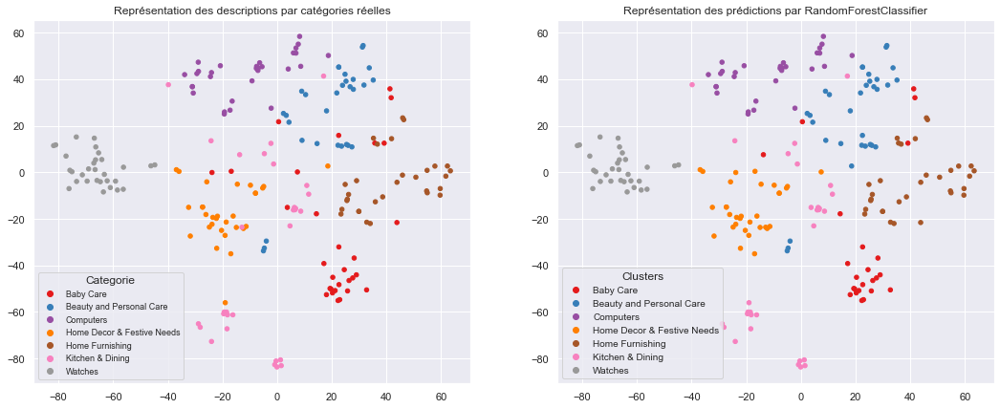

In [1563]:
# Display X_test products in 2D with true labels and predicted labels
fig = plt.figure(figsize=(18,7))

# Display products with true labels
ax = fig.add_subplot(121)
scatter = ax.scatter(test.iloc[:,0],test.iloc[:,1], c=y_test_labels, cmap='Set1', s = 20)
ax.legend(handles=scatter.legend_elements()[0], labels=list_1st_cat, loc="best", title="Categorie", fontsize = 9)
plt.title('Représentation des descriptions par catégories réelles')

# Display products with predicted labels
ax = fig.add_subplot(122)
scatter = ax.scatter(test.iloc[:,0],test.iloc[:,1], c=predictions_rfc_labels, cmap='Set1', s = 20)
ax.legend(handles=scatter.legend_elements()[0], labels=list_1st_cat, loc="best", title="Clusters", fontsize = 10)
plt.title('Représentation des prédictions par RandomForestClassifier')
    
plt.show()

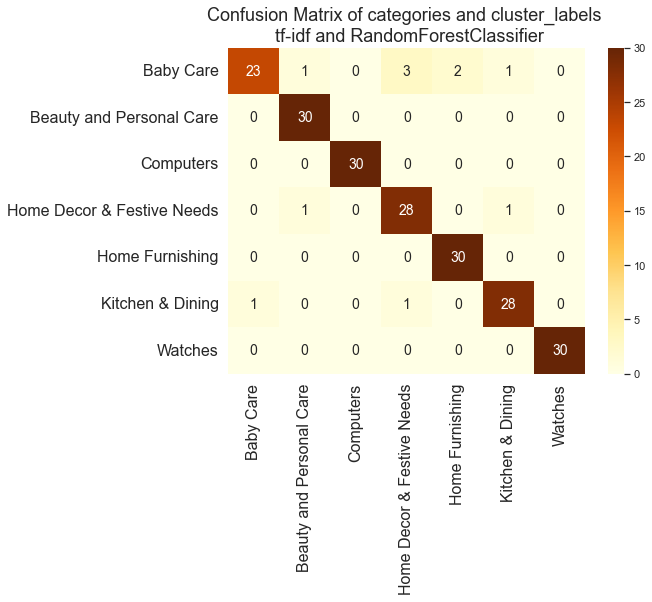

In [1569]:
# Confusion Matrix with category names
conf_mat_class(true_labels = y_test_labels,
               predicted_labels = predictions_rfc_labels,
               model_name = 'RandomForestClassifier')

In [1568]:
# Function to display the confusion matrix after Classification
def conf_mat_class(true_labels, predicted_labels, model_name):
    conf_mat = confusion_matrix(true_labels, predicted_labels)
    data_cm = pd.DataFrame(conf_mat, 
                           index = [category for category in list_1st_cat],
                           columns = [category for category in list_1st_cat])
    plt.figure(figsize = (8,6))
    cmap = 'YlOrBr'
    colormap = sns.heatmap(data_cm, 
                           annot=True, 
                           annot_kws ={'size':14}, 
                           cmap=cmap, 
                           fmt='.3g')
    colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
    colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

    plt.title(f'Confusion Matrix of categories and cluster_labels \n tf-idf and {model_name}',
              size = 18);

In [1573]:
# Create confusion matrix and
# Calculate accuracy and different metrics by categorie
def class_report_class(true_labels, predicted_labels):
    classification = metrics.classification_report(true_labels, 
                                                   predicted_labels,
                                                   target_names = list_1st_cat, 
                                                   digits = 3)
    print(metrics.classification_report(true_labels, 
                                        predicted_labels, 
                                        target_names=[category for category in list_1st_cat], 
                                        digits = 3))
    dict_class = metrics.classification_report(true_labels,
                                               predicted_labels,
                                               target_names=[category for category in list_1st_cat],
                                               digits = 3,
                                               output_dict = True)
    # Create dataframe with categories and metrics
    data_metrics = round(pd.DataFrame.from_dict(dict_class, 
                                                orient='columns').T.iloc[0:7,0:3], 
                         3)
    
    return dict_class, data_metrics

In [1574]:
# Transform cluster_labels to categories and
# calculate metrics by category
dict_classification, metrics_class_tfidf_rfc = class_report_class(y_test_labels, predictions_rfc_labels)

                            precision    recall  f1-score   support

                 Baby Care      0.958     0.767     0.852        30
  Beauty and Personal Care      0.938     1.000     0.968        30
                 Computers      1.000     1.000     1.000        30
Home Decor & Festive Needs      0.875     0.933     0.903        30
           Home Furnishing      0.938     1.000     0.968        30
          Kitchen & Dining      0.933     0.933     0.933        30
                   Watches      1.000     1.000     1.000        30

                  accuracy                          0.948       210
                 macro avg      0.949     0.948     0.946       210
              weighted avg      0.949     0.948     0.946       210



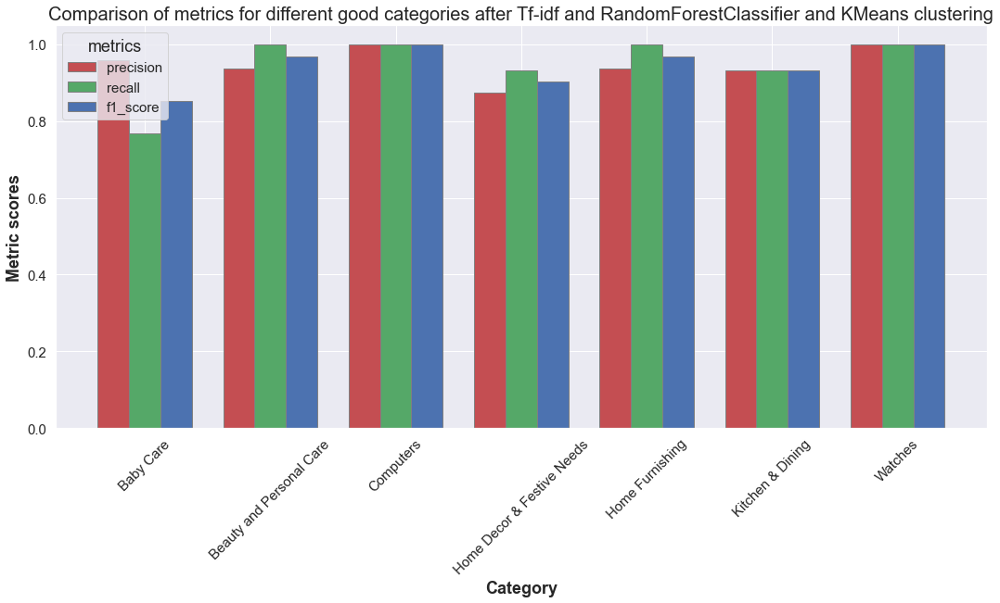

In [1575]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_class_tfidf_rfc, 
                model_name = 'Tf-idf and RandomForestClassifier')

### GridSearchCV for GaussianProcessClassifier

In [1580]:
# Create function GaussianProcessClassifier with GridSearchCV and cross_validation
def GPC_gs_cv(X, y, n_splits, n_repeats_1, 
              multi_class, n_repeats_2):
 
    """[summary]

    Args:
        n_splits (int) : nombre de folds pour la cross-validation
        n_repeats (int) : nombre de répétitions de cross-validations
    """
    
    cv_1 = RepeatedStratifiedKFold(n_splits = n_splits, 
                                   n_repeats = n_repeats_1,
                                   random_state = 17)

    param_grid = {
        "multi_class": multi_class
    }

    gpc = GaussianProcessClassifier()
    
    gs_gpc = GridSearchCV(estimator = gpc,
                          param_grid = param_grid,
                          cv = cv_1,
                          scoring = 'accuracy')

    gs_gpc.fit(X, y)
    
    results_gs_gpc = pd.DataFrame(gs_gpc.cv_results_)
    results_gs_gpc = results_gs_gpc.sort_values(by=["rank_test_score"])
    
    # Affichage des meilleurs paramètres
    print("GaussianProcessClassifier with cross validation :")
    print("best_params :", gs_gpc.best_params_)
    gpc_best_multi_class = list(gs_gpc.best_params_.values())[0]
    
    cv_2 = RepeatedStratifiedKFold(n_splits = n_splits, 
                                   n_repeats = n_repeats_2,
                                   random_state = 35)
    
    gpc_opt = GaussianProcessClassifier(multi_class = gpc_best_multi_class)

    gpc_opt_scores = cross_validate(gpc_opt, X, y, cv = cv_2,
                                    scoring = ('accuracy'),
                                    return_train_score = True)

    cv_results = pd.DataFrame(gpc_opt_scores)

    print('mean accuracy test =', cv_results['test_score'].mean())
    print('mean accuracy train =', cv_results['train_score'].mean())
    print('------------------------------------')
    print('moyenne fit time =', cv_results['fit_time'].mean())
    print('moyenne score time =', cv_results['score_time'].mean())
    return results_gs_gpc[["params", "rank_test_score", "mean_test_score"]]

In [1581]:
GPC_gs_cv(X = df_class[['X_tsne_1', 'X_tsne_2']], 
          y = df_class['1st_cat'].values, 
          n_splits = 5, 
          n_repeats_1 = 5,
          multi_class = ['one_vs_one', 'one_vs_rest'],
          n_repeats_2 = 5)

GaussianProcessClassifier with cross validation :
best_params : {'multi_class': 'one_vs_one'}
mean accuracy test = 0.9276190476190476
mean accuracy train = 0.9900952380952381
------------------------------------
moyenne fit time = 1.315922441482544
moyenne score time = 0.31715274810791017


,params,rank_test_score,mean_test_score
0,{'multi_class': 'one_vs_one'},1,0.931048
1,{'multi_class': 'one_vs_rest'},1,0.931048


### Conclusion for GridSearchCV on RandomForestClassifier
-> using 'one_vs_one' or 'one_vs_rest' do not change the mean_test_score

### 2D classification vizualisation with GaussianProcessClassifier

In [1583]:
# Create and train GaussianProcessClassifier model
time1 = time.time()

gpc = GaussianProcessClassifier()
gpc.fit(X_train, y_train)

# predict and evaluate predictions
predictions_gpc = gpc.predict(X_test)

time2 = np.round(time.time() - time1,1)

print("time : ", time2)

time :  3.8


In [1584]:
# LabelEncoder for predicted first categories in test set

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(predictions_gpc)

# Transform categories to labels
predictions_gpc_labels = le.transform(predictions_gpc)
predictions_gpc_labels = predictions_gpc_labels.tolist()

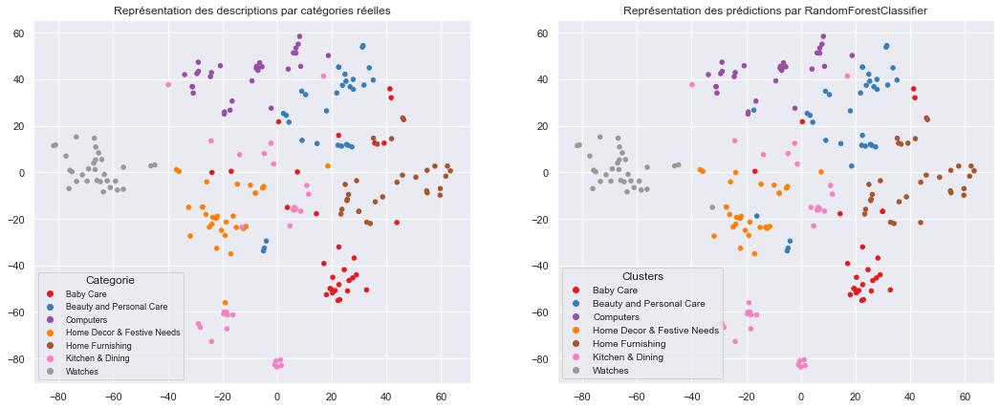

In [1585]:
# Display X_test products in 2D with true labels and predicted labels
fig = plt.figure(figsize=(18,7))

# Display products with true labels
ax = fig.add_subplot(121)
scatter = ax.scatter(test.iloc[:,0],test.iloc[:,1], c=y_test_labels, cmap='Set1', s = 20)
ax.legend(handles=scatter.legend_elements()[0], labels=list_1st_cat, loc="best", title="Categorie", fontsize = 9)
plt.title('Représentation des descriptions par catégories réelles')

# Display products with predicted labels
ax = fig.add_subplot(122)
scatter = ax.scatter(test.iloc[:,0],test.iloc[:,1], c=predictions_gpc_labels, cmap='Set1', s = 20)
ax.legend(handles=scatter.legend_elements()[0], labels=list_1st_cat, loc="best", title="Clusters", fontsize = 10)
plt.title('Représentation des prédictions par RandomForestClassifier')
    
plt.show()

                            precision    recall  f1-score   support

                 Baby Care      0.920     0.767     0.836        30
  Beauty and Personal Care      0.882     1.000     0.938        30
                 Computers      1.000     0.967     0.983        30
Home Decor & Festive Needs      0.897     0.867     0.881        30
           Home Furnishing      0.903     0.933     0.918        30
          Kitchen & Dining      0.935     0.967     0.951        30
                   Watches      0.968     1.000     0.984        30

                  accuracy                          0.929       210
                 macro avg      0.929     0.929     0.927       210
              weighted avg      0.929     0.929     0.927       210



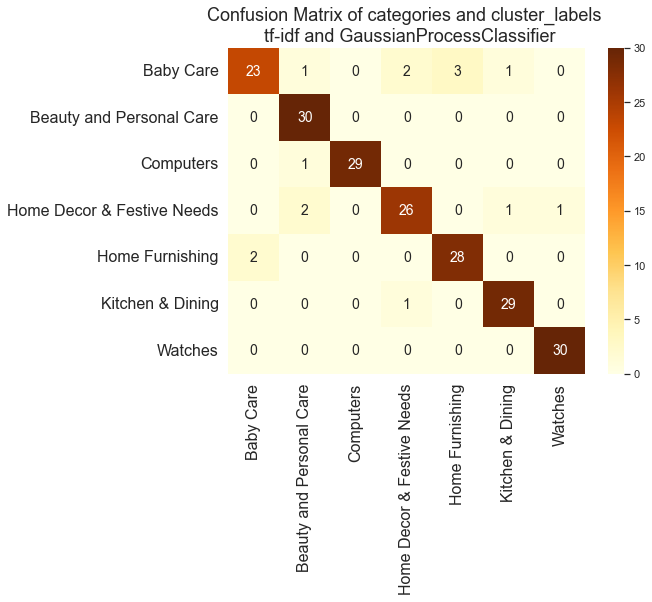

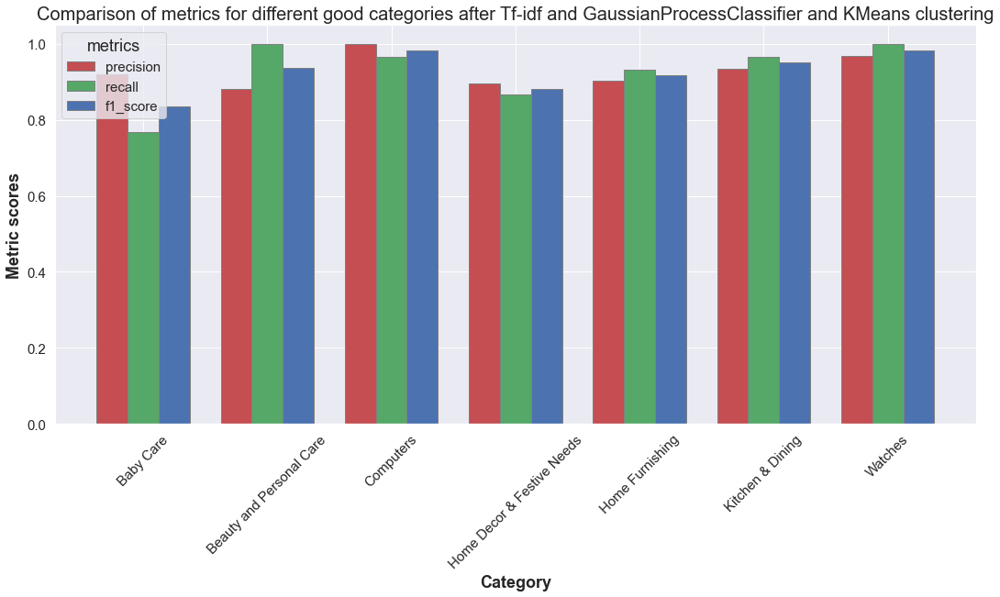

In [1586]:
# Confusion Matrix with category names
conf_mat_class(true_labels = y_test_labels,
               predicted_labels = predictions_gpc_labels,
               model_name = 'GaussianProcessClassifier')

# Transform cluster_labels to categories and
# calculate metrics by category
dict_classification, metrics_class_tfidf_gpc = class_report_class(y_test_labels, predictions_gpc_labels)

# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_class_tfidf_gpc, 
                model_name = 'Tf-idf and GaussianProcessClassifier')

# BERT

In [322]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
from transformers import TFAutoModel, AutoTokenizer

os.environ["TF_KERAS"]='1'

In [323]:
# Function to prepare sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    
# Function to create features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step == 0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

## BERT HuggingFace

In [324]:
# Create new feature 'length_dl' to define 'max length dl'
data['length_dl'] = data['description_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", data['length_dl'].max())

max length dl :  632


In [326]:
# Count words in column 'description_dl' without any cleaning
data['description_dl'] = data['description_dl'].astype(str)
pd.Series([y for x in data['description_dl'].values.flatten() for y in x.split()]).value_counts().to_dict()

{'.': 5885,
 ',': 3269,
 'of': 1754,
 'for': 1436,
 'the': 1369,
 'and': 1332,
 'to': 1053,
 'in': 1050,
 ':': 1029,
 '-': 955,
 'rs': 911,
 'only': 890,
 'with': 843,
 'on': 832,
 'at': 714,
 ')': 682,
 'a': 681,
 '(': 669,
 'your': 656,
 'is': 635,
 'products': 630,
 'free': 614,
 '!': 606,
 'buy': 581,
 'delivery': 567,
 'cash': 564,
 'shipping': 564,
 'genuine': 564,
 'replacement': 559,
 'cm': 552,
 'day': 539,
 '&': 513,
 'flipkart': 481,
 'com': 473,
 'guarantee': 471,
 'this': 442,
 'it': 438,
 'online': 396,
 'features': 395,
 'from': 382,
 'specifications': 371,
 'you': 359,
 'price': 352,
 'watch': 330,
 'mug': 327,
 'baby': 320,
 'color': 319,
 "'s": 317,
 'pack': 317,
 'material': 310,
 'set': 309,
 'type': 303,
 'cotton': 297,
 'box': 292,
 'general': 288,
 'package': 269,
 'sales': 261,
 'analog': 255,
 'number': 253,
 'warranty': 250,
 'quality': 243,
 'details': 235,
 'product': 233,
 'brand': 232,
 'best': 230,
 '``': 230,
 'design': 223,
 'model': 222,
 'key': 219,
 

### 'bert-base-uncased'

- 12 layer  

- 768 hidden dimension  

- 12 attention heads  

- 110M parameters

In [335]:
# Define max_length for the padding
max_length = 64
# Define the batch_size
batch_size = 10
# Define the pre-trained model : model pretrained on a large corpus of English data
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
# Create a list of descriptions
descriptions = data['description_dl'].to_list()

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [336]:
# Create features 'features_bert'
features_bert, last_hidden_states_tot = feature_BERT_fct(model, 
                                                         model_type, 
                                                         descriptions, 
                                                         max_length, 
                                                         batch_size, 
                                                         mode='HF')

temps traitement :  71.0


In [342]:
# Execute bert-base-uncased embedding model with perplexity from 1 to 75 for 'description_dl' feature
ARI_bert_base_uncased, opt_perplexity = ARI_calculation(features_bert)

ARI :  0.0409 time :  5.0
ARI :  0.2336 time :  6.0
ARI :  0.2367 time :  5.0
ARI :  0.2898 time :  5.0
ARI :  0.3028 time :  5.0
ARI :  0.3475 time :  5.0
ARI :  0.3865 time :  5.0
ARI :  0.3441 time :  5.0
ARI :  0.3172 time :  5.0
ARI :  0.3082 time :  6.0
ARI :  0.304 time :  5.0
ARI :  0.3243 time :  5.0
ARI :  0.321 time :  5.0
ARI :  0.32 time :  5.0
ARI :  0.3389 time :  5.0
ARI :  0.3073 time :  5.0
ARI :  0.3154 time :  5.0
ARI :  0.3151 time :  5.0
ARI :  0.3351 time :  5.0
ARI :  0.3261 time :  5.0
ARI :  0.3299 time :  6.0
ARI :  0.3385 time :  5.0
ARI :  0.337 time :  5.0
ARI :  0.3416 time :  5.0
ARI :  0.3235 time :  6.0
ARI :  0.3246 time :  5.0
ARI :  0.3265 time :  5.0
ARI :  0.3182 time :  5.0
ARI :  0.3253 time :  6.0
ARI :  0.3238 time :  5.0
ARI :  0.3162 time :  6.0
ARI :  0.318 time :  7.0
ARI :  0.3168 time :  6.0
ARI :  0.3204 time :  7.0
ARI :  0.3199 time :  7.0
ARI :  0.3213 time :  7.0
ARI :  0.3185 time :  7.0
ARI :  0.3161 time :  7.0
ARI :  0.3211 time

ARI :  0.3865 time :  5.0


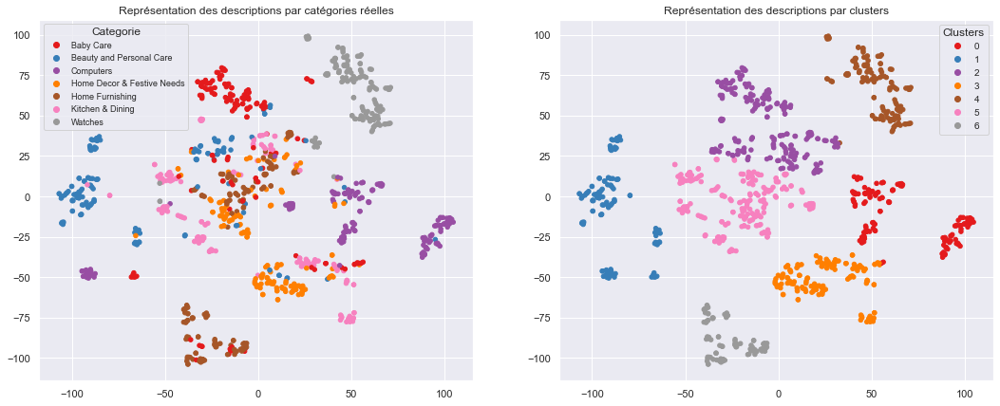

ARI :  0.3865


In [344]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute bert_uncased model with optimal perplexity (7) for 'description_dl' feature
ARI, X_tsne, labels = ARI_fct(features_bert, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

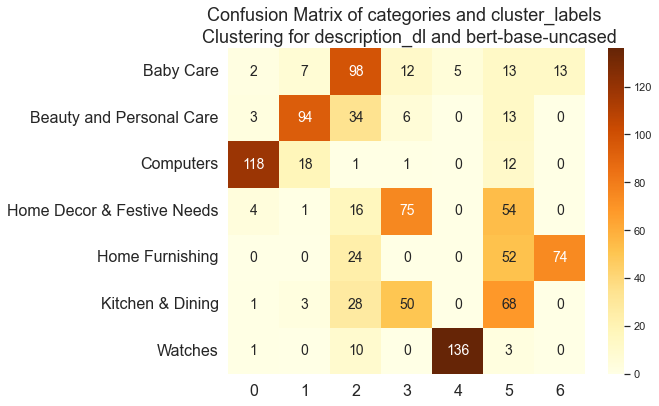

In [345]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'bert-base-uncased on description_dl')

In [346]:
# Calculate metrics by category and accuracy
dict_classification, metrics_bert_base_uncased = class_report(true_labels, labels)

                            precision    recall  f1-score   support

                 Baby Care      0.464     0.653     0.543       150
  Beauty and Personal Care      0.764     0.627     0.689       150
                 Computers      0.915     0.787     0.846       150
Home Decor & Festive Needs      0.521     0.500     0.510       150
           Home Furnishing      0.851     0.493     0.624       150
          Kitchen & Dining      0.316     0.453     0.373       150
                   Watches      0.965     0.907     0.935       150

                  accuracy                          0.631      1050
                 macro avg      0.685     0.631     0.646      1050
              weighted avg      0.685     0.631     0.646      1050



,precision,recall,f1-score
Baby Care,0.464,0.653,0.543
Beauty and Personal Care,0.764,0.627,0.689
Computers,0.915,0.787,0.846
Home Decor & Festive Needs,0.521,0.500,0.510
Home Furnishing,0.851,0.493,0.624
Kitchen & Dining,0.316,0.453,0.373
Watches,0.965,0.907,0.935


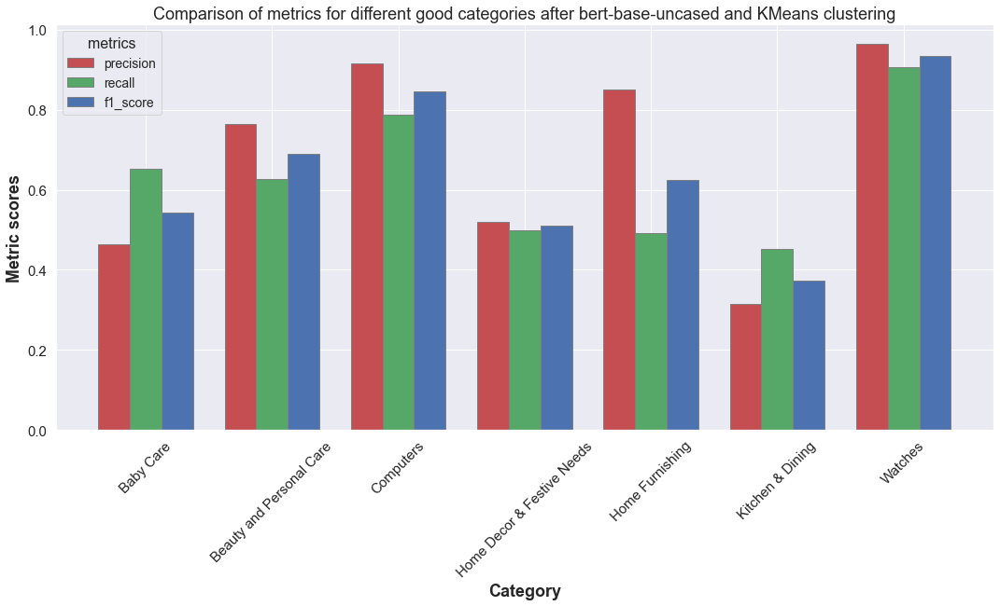

In [361]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_bert_base_uncased, 
                model_name = 'Bert_base_uncased (description dl)')

### 'bert-large-uncased'

- 24 layer  

- 1024 hidden dimension  

- 16 attention heads  

- 336M parameters

In [348]:
# Define max_length for the padding
max_length = 64
# Define the batch_size
batch_size = 10
# Define the pre-trained model : model pretrained on a large corpus of English data
model_type = 'bert-large-uncased'
model = TFAutoModel.from_pretrained(model_type)
# Create a list of descriptions
descriptions = data['description_dl'].to_list()

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.37G [00:00<?, ?B/s]

Some layers from the model checkpoint at bert-large-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-large-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [349]:
# Création des features 'features_bert'
features_bert, last_hidden_states_tot = feature_BERT_fct(model, 
                                                         model_type, 
                                                         descriptions, 
                                                         max_length, 
                                                         batch_size, 
                                                         mode='HF')

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

temps traitement :  217.0


In [350]:
# Execute bert-large-uncased embedding model with perplexity from 1 to 75 for 'description_dl' feature
ARI_bert_large_uncased, opt_perplexity = ARI_calculation(features_bert)

ARI :  0.05 time :  5.0
ARI :  0.1534 time :  5.0
ARI :  0.2554 time :  5.0
ARI :  0.2935 time :  5.0
ARI :  0.3064 time :  5.0
ARI :  0.3716 time :  5.0
ARI :  0.3858 time :  5.0
ARI :  0.3638 time :  5.0
ARI :  0.3277 time :  5.0
ARI :  0.351 time :  5.0
ARI :  0.354 time :  5.0
ARI :  0.3927 time :  6.0
ARI :  0.377 time :  6.0
ARI :  0.3327 time :  6.0
ARI :  0.3373 time :  6.0
ARI :  0.3299 time :  6.0
ARI :  0.344 time :  6.0
ARI :  0.3286 time :  7.0
ARI :  0.3497 time :  7.0
ARI :  0.326 time :  5.0
ARI :  0.3285 time :  6.0
ARI :  0.2949 time :  5.0
ARI :  0.3266 time :  5.0
ARI :  0.2978 time :  6.0
ARI :  0.2949 time :  5.0
ARI :  0.2941 time :  6.0
ARI :  0.2949 time :  6.0
ARI :  0.2782 time :  6.0
ARI :  0.2969 time :  7.0
ARI :  0.2873 time :  6.0
ARI :  0.2739 time :  6.0
ARI :  0.2807 time :  7.0
ARI :  0.2886 time :  7.0
ARI :  0.2902 time :  7.0
ARI :  0.2874 time :  6.0
ARI :  0.2821 time :  7.0
ARI :  0.2875 time :  7.0
ARI :  0.2877 time :  7.0
ARI :  0.2888 time 

ARI :  0.3927 time :  5.0


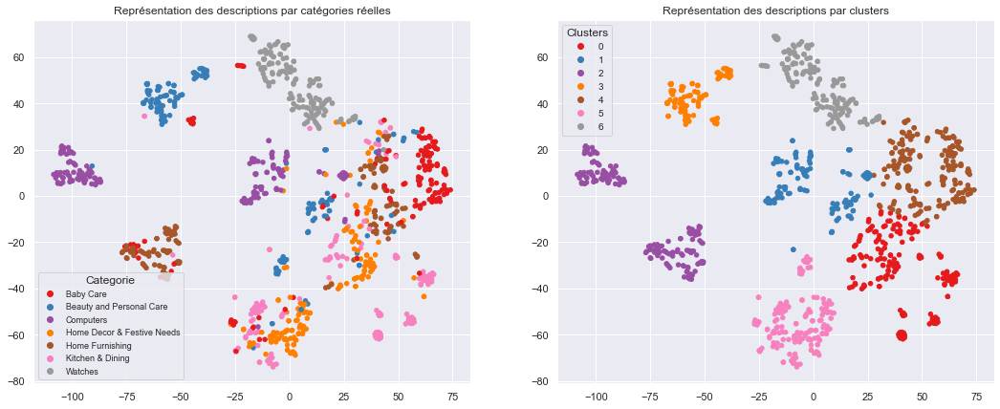

ARI :  0.3927


In [353]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute bert_uncased model with optimal perplexity (12) for 'description_dl' feature
ARI, X_tsne, labels = ARI_fct(features_bert, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

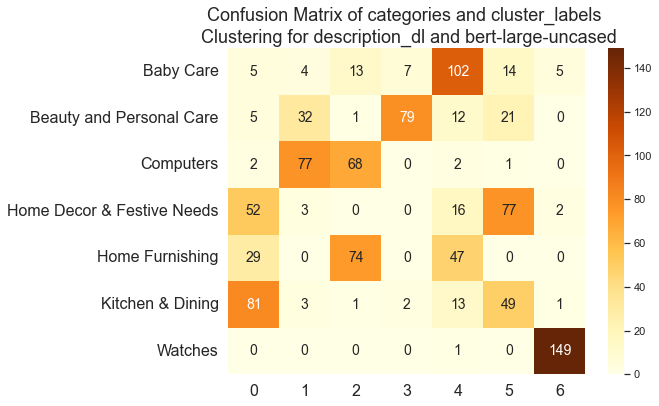

In [355]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'bert-large-uncased on description_dl')

In [356]:
# Calculate metrics by category and accuracy
dict_classification, metrics_bert_large_uncased = class_report(true_labels, labels)

                            precision    recall  f1-score   support

                 Baby Care      0.528     0.680     0.595       150
  Beauty and Personal Care      0.898     0.527     0.664       150
                 Computers      0.647     0.513     0.572       150
Home Decor & Festive Needs      0.475     0.513     0.494       150
           Home Furnishing      0.471     0.493     0.482       150
          Kitchen & Dining      0.466     0.540     0.500       150
                   Watches      0.949     0.993     0.971       150

                  accuracy                          0.609      1050
                 macro avg      0.633     0.609     0.611      1050
              weighted avg      0.633     0.609     0.611      1050



,precision,recall,f1-score
Baby Care,0.528,0.680,0.595
Beauty and Personal Care,0.898,0.527,0.664
Computers,0.647,0.513,0.572
Home Decor & Festive Needs,0.475,0.513,0.494
Home Furnishing,0.471,0.493,0.482
Kitchen & Dining,0.466,0.540,0.500
Watches,0.949,0.993,0.971


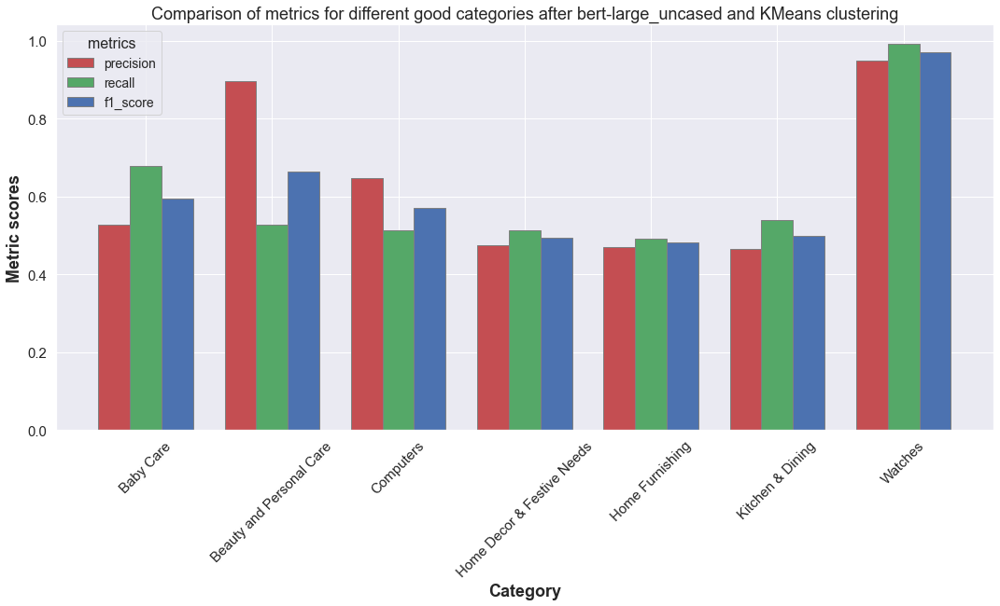

In [360]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_bert_large_uncased, 
                model_name = 'Bert_large_uncased (description dl)')

### 'cardiffnlp/twitter-roberta-base-sentiment'
* Pre-trained model on sentiment analysis tweets

In [358]:
# Define max_length for the padding
max_length = 64
# Define the batch_size
batch_size = 10
# Define the pre-trained model : model pretrained on sentiment analysis tweets
model_type = 'cardiffnlp/twitter-roberta-base-sentiment'
model = TFAutoModel.from_pretrained(model_type)
# Create a list of descriptions
descriptions = data['description_dl'].to_list()

Downloading:   0%|          | 0.00/747 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some layers from the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment were not used when initializing TFRobertaModel: ['classifier']
- This IS expected if you are initializing TFRobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFRobertaModel were initialized from the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaModel for predictions without further training.


In [359]:
# Create features from the above loaded model
features_bert, last_hidden_states_tot = feature_BERT_fct(model, 
                                                         model_type, 
                                                         descriptions, 
                                                         max_length, 
                                                         batch_size, 
                                                         mode='HF')

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/150 [00:00<?, ?B/s]

temps traitement :  78.0


In [362]:
# Execute roberta embedding model with perplexity from 1 to 75 for 'description_dl' feature
ARI_roberta, opt_perplexity = ARI_calculation(features_bert)

ARI :  0.0286 time :  5.0
ARI :  0.1751 time :  6.0
ARI :  0.1831 time :  5.0
ARI :  0.2001 time :  5.0
ARI :  0.216 time :  6.0
ARI :  0.2035 time :  6.0
ARI :  0.2197 time :  6.0
ARI :  0.2246 time :  6.0
ARI :  0.1849 time :  6.0
ARI :  0.2325 time :  5.0
ARI :  0.1825 time :  6.0
ARI :  0.1844 time :  6.0
ARI :  0.1842 time :  6.0
ARI :  0.23 time :  6.0
ARI :  0.2243 time :  5.0
ARI :  0.1842 time :  5.0
ARI :  0.184 time :  6.0
ARI :  0.2214 time :  6.0
ARI :  0.2245 time :  6.0
ARI :  0.1846 time :  7.0
ARI :  0.2226 time :  6.0
ARI :  0.2226 time :  6.0
ARI :  0.222 time :  7.0
ARI :  0.2232 time :  6.0
ARI :  0.2232 time :  6.0
ARI :  0.2215 time :  6.0
ARI :  0.221 time :  6.0
ARI :  0.2205 time :  7.0
ARI :  0.2215 time :  6.0
ARI :  0.2329 time :  7.0
ARI :  0.2342 time :  7.0
ARI :  0.2311 time :  7.0
ARI :  0.2151 time :  7.0
ARI :  0.2289 time :  7.0
ARI :  0.2309 time :  7.0
ARI :  0.2302 time :  6.0
ARI :  0.2303 time :  7.0
ARI :  0.2301 time :  7.0
ARI :  0.228 time 

### Tensorflow bert model

In [368]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
# Load the tensorflow model
model_url = 'https://tfhub.dev/tensorflow/bert_en_wwm_uncased_L-24_H-1024_A-16/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

# Define max_length for the padding
max_length = 64
# Define the batch_size
batch_size = 10
# Define model type : model pretrained on a large corpus of English data
model_type = 'bert-base-uncased'
model = bert_layer
# Create a list of descriptions
descriptions = data['description_dl'].to_list()

# Create features for the above loaded model
features_bert, last_hidden_states_tot = feature_BERT_fct(model, 
                                                         model_type, 
                                                         descriptions, 
                                                         max_length, 
                                                         batch_size, 
                                                         mode='TFhub')

temps traitement :  234.0


In [369]:
# Execute tensorflow_bert_en_wwm_uncased embedding model with perplexity from 1 to 75 for 'description_dl' feature
ARI_tensorflow_bert_en_wwm_uncased, opt_perplexity = ARI_calculation(features_bert)

ARI :  0.0633 time :  5.0
ARI :  0.2035 time :  6.0
ARI :  0.4011 time :  6.0
ARI :  0.3321 time :  6.0
ARI :  0.2786 time :  5.0
ARI :  0.3557 time :  5.0
ARI :  0.3705 time :  5.0
ARI :  0.3439 time :  6.0
ARI :  0.3917 time :  5.0
ARI :  0.394 time :  5.0
ARI :  0.4197 time :  6.0
ARI :  0.3627 time :  6.0
ARI :  0.4132 time :  5.0
ARI :  0.4112 time :  5.0
ARI :  0.3675 time :  6.0
ARI :  0.3686 time :  6.0
ARI :  0.4135 time :  6.0
ARI :  0.4232 time :  6.0
ARI :  0.4181 time :  6.0
ARI :  0.433 time :  6.0
ARI :  0.3703 time :  7.0
ARI :  0.4229 time :  7.0
ARI :  0.4214 time :  6.0
ARI :  0.4297 time :  7.0
ARI :  0.424 time :  7.0
ARI :  0.435 time :  7.0
ARI :  0.3921 time :  7.0
ARI :  0.4233 time :  7.0
ARI :  0.3941 time :  7.0
ARI :  0.3832 time :  7.0
ARI :  0.3843 time :  8.0
ARI :  0.3714 time :  7.0
ARI :  0.3851 time :  7.0
ARI :  0.3889 time :  8.0
ARI :  0.3701 time :  8.0
ARI :  0.3507 time :  8.0
ARI :  0.3546 time :  8.0
ARI :  0.387 time :  8.0
ARI :  0.3984 tim

ARI :  0.435 time :  5.0


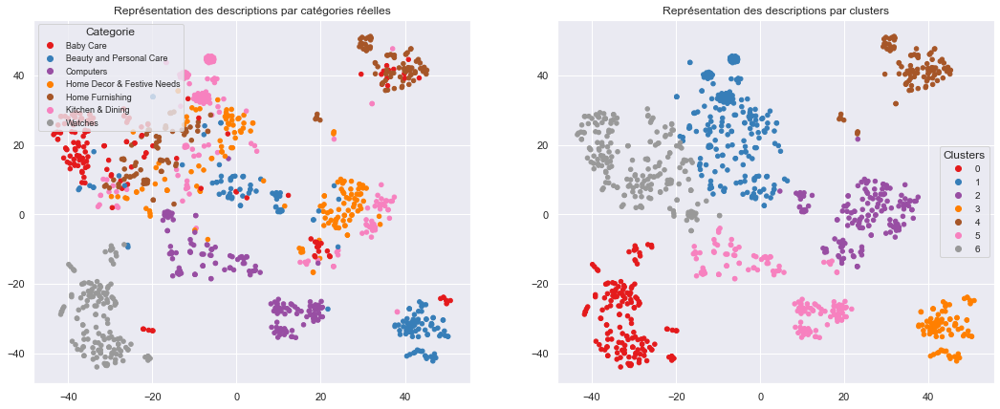

ARI :  0.435


In [370]:
# DISPLAY BEST RESULTS CLUSTERING
# Execute tensorflow_bert_en_wwm_uncased model with optimal perplexity (12) for 'description_dl' feature
ARI, X_tsne, labels = ARI_fct(features_bert, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

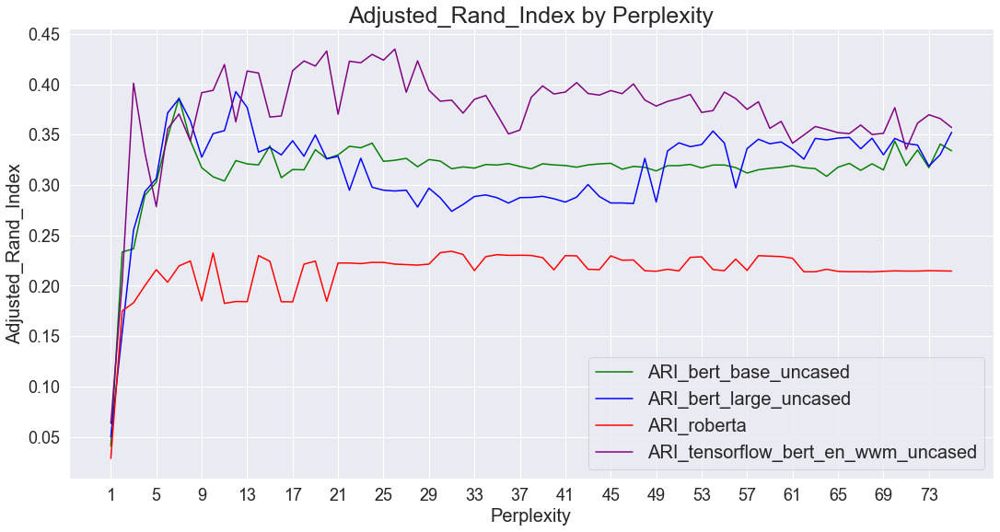

In [371]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_bert_base_uncased
y2 = ARI_bert_large_uncased
y3 = ARI_roberta
y4 = ARI_tensorflow_bert_en_wwm_uncased

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_bert_base_uncased')
ax.plot(x, y2, color = 'blue', label = 'ARI_bert_large_uncased')
ax.plot(x, y3, color = 'red', label = 'ARI_roberta')
ax.plot(x, y4, color = 'purple', label = 'ARI_tensorflow_bert_en_wwm_uncased')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

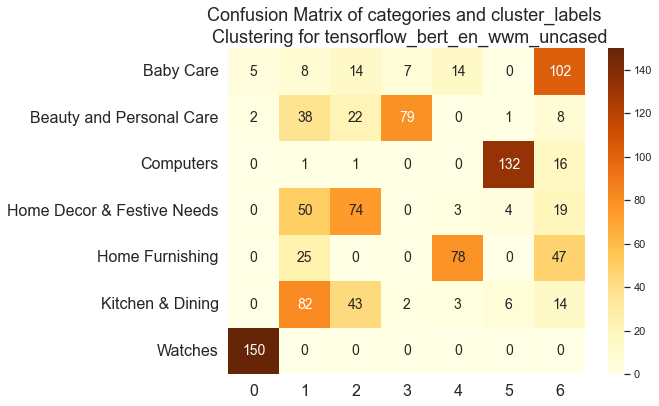

In [372]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'tensorflow_bert_en_wwm_uncased on description_dl')

In [373]:
# Calculate metrics by category and accuracy
dict_classification, metrics_tensorflow_bert_en_wwm_uncased = class_report(true_labels, labels)

                            precision    recall  f1-score   support

                 Baby Care      0.495     0.680     0.573       150
  Beauty and Personal Care      0.898     0.527     0.664       150
                 Computers      0.923     0.880     0.901       150
Home Decor & Festive Needs      0.481     0.493     0.487       150
           Home Furnishing      0.796     0.520     0.629       150
          Kitchen & Dining      0.402     0.547     0.463       150
                   Watches      0.955     1.000     0.977       150

                  accuracy                          0.664      1050
                 macro avg      0.707     0.664     0.671      1050
              weighted avg      0.707     0.664     0.671      1050



,precision,recall,f1-score
Baby Care,0.495,0.680,0.573
Beauty and Personal Care,0.898,0.527,0.664
Computers,0.923,0.880,0.901
Home Decor & Festive Needs,0.481,0.493,0.487
Home Furnishing,0.796,0.520,0.629
Kitchen & Dining,0.402,0.547,0.463
Watches,0.955,1.000,0.977


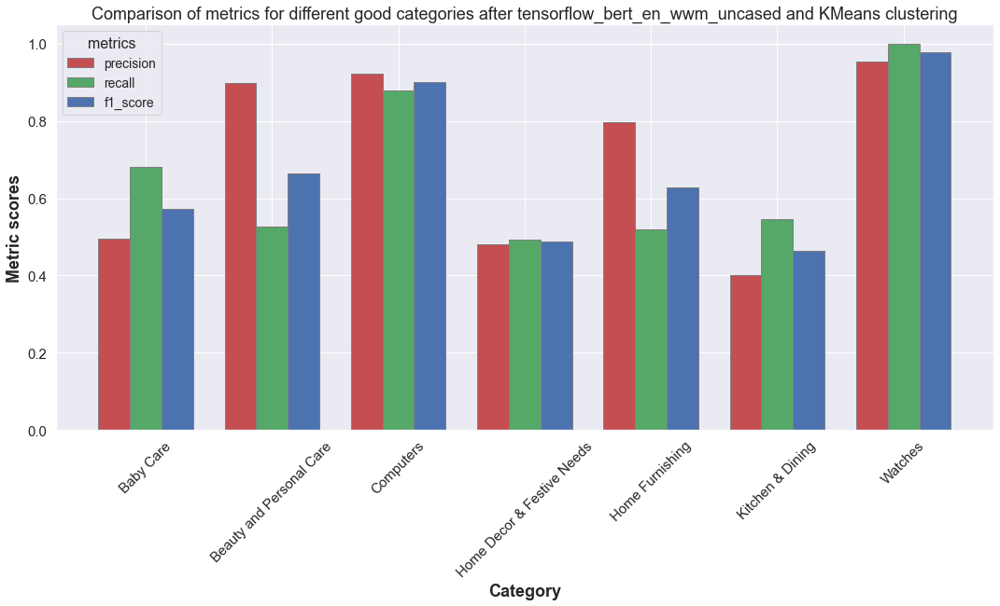

In [375]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_tensorflow_bert_en_wwm_uncased, 
                model_name = 'Tensorflow_bert_em_wwm_uncased (description dl)')

# USE - Universal Sentence Encoder

In [1306]:
import tensorflow_hub as hub

# Create USE embeddings
embeddings = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [1321]:
# Function to create features using Universal Sentence Encoder
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embeddings(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [1322]:
# Create list of descriptions and features 'features_USE'
descriptions = data['description_dl'].to_list()
features_USE = feature_USE_fct(descriptions, b_size = 10)

In [1325]:
# Execute USE embedding model with perplexity from 1 to 75 for 'description_dl' feature
ARI_USE, opt_perplexity = ARI_calculation(features_USE)

ARI :  0.0825 time :  7.0
ARI :  0.1864 time :  7.0
ARI :  0.3303 time :  7.0
ARI :  0.3493 time :  8.0
ARI :  0.3537 time :  7.0
ARI :  0.3906 time :  7.0
ARI :  0.3554 time :  8.0
ARI :  0.4932 time :  7.0
ARI :  0.5294 time :  8.0
ARI :  0.3692 time :  8.0
ARI :  0.3829 time :  8.0
ARI :  0.413 time :  8.0
ARI :  0.4352 time :  8.0
ARI :  0.4526 time :  8.0
ARI :  0.4452 time :  8.0
ARI :  0.4547 time :  8.0
ARI :  0.4379 time :  8.0
ARI :  0.4365 time :  8.0
ARI :  0.4679 time :  8.0
ARI :  0.4486 time :  8.0
ARI :  0.4515 time :  8.0
ARI :  0.4528 time :  8.0
ARI :  0.4562 time :  8.0
ARI :  0.4576 time :  8.0
ARI :  0.4495 time :  8.0
ARI :  0.4506 time :  8.0
ARI :  0.452 time :  9.0
ARI :  0.4533 time :  8.0
ARI :  0.4482 time :  9.0
ARI :  0.4464 time :  9.0
ARI :  0.4366 time :  9.0
ARI :  0.4285 time :  9.0
ARI :  0.4449 time :  9.0
ARI :  0.4509 time :  9.0
ARI :  0.4405 time :  9.0
ARI :  0.4548 time :  9.0
ARI :  0.4311 time :  9.0
ARI :  0.4323 time :  9.0
ARI :  0.4293 

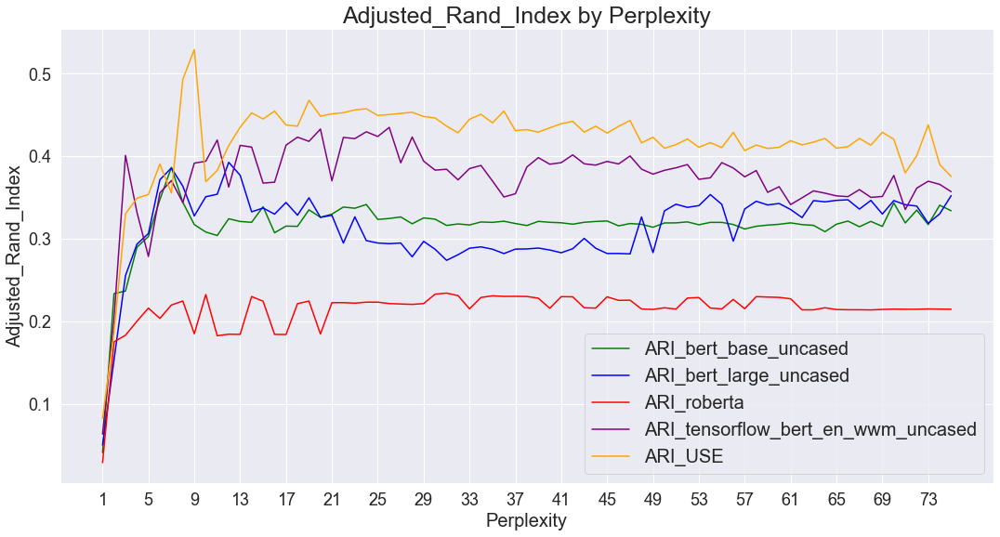

In [387]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_bert_base_uncased
y2 = ARI_bert_large_uncased
y3 = ARI_roberta
y4 = ARI_tensorflow_bert_en_wwm_uncased
y5 = ARI_USE

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_bert_base_uncased')
ax.plot(x, y2, color = 'blue', label = 'ARI_bert_large_uncased')
ax.plot(x, y3, color = 'red', label = 'ARI_roberta')
ax.plot(x, y4, color = 'purple', label = 'ARI_tensorflow_bert_en_wwm_uncased')
ax.plot(x, y5, color = 'orange', label = 'ARI_USE')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.5294 time :  7.0


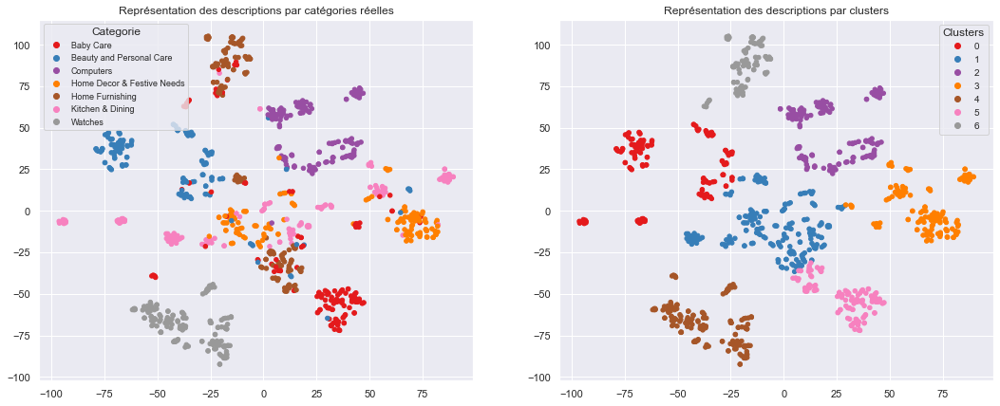

ARI :  0.5294


In [1326]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute USE model with optimal perplexity (9) for 'description_dl' feature
ARI, X_tsne, labels = ARI_fct(features_USE, 9)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

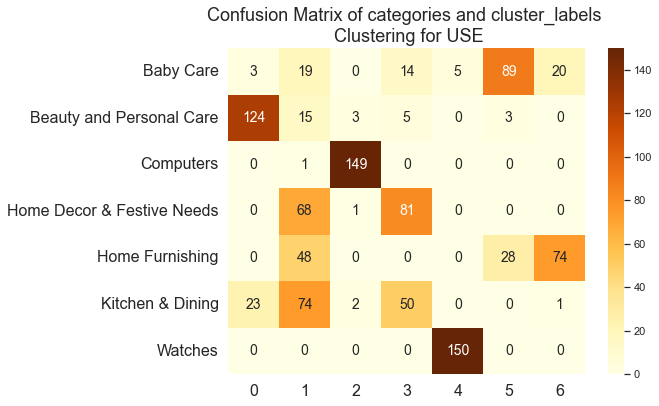

In [1327]:
# Confusion Matrix with category names
conf_mat(true_labels = true_labels, 
         predicted_labels = labels, 
         model_name = 'Universal Sentence Encoder on description_dl')

In [1328]:
# Calculate metrics by category and accuracy
dict_classification, metrics_USE = class_report(true_labels, labels)

                            precision    recall  f1-score   support

                 Baby Care      0.742     0.593     0.659       150
  Beauty and Personal Care      0.827     0.827     0.827       150
                 Computers      0.961     0.993     0.977       150
Home Decor & Festive Needs      0.540     0.540     0.540       150
           Home Furnishing      0.779     0.493     0.604       150
          Kitchen & Dining      0.329     0.493     0.395       150
                   Watches      0.968     1.000     0.984       150

                  accuracy                          0.706      1050
                 macro avg      0.735     0.706     0.712      1050
              weighted avg      0.735     0.706     0.712      1050



,precision,recall,f1-score
Baby Care,0.742,0.593,0.659
Beauty and Personal Care,0.827,0.827,0.827
Computers,0.961,0.993,0.977
Home Decor & Festive Needs,0.540,0.540,0.540
Home Furnishing,0.779,0.493,0.604
Kitchen & Dining,0.329,0.493,0.395
Watches,0.968,1.000,0.984


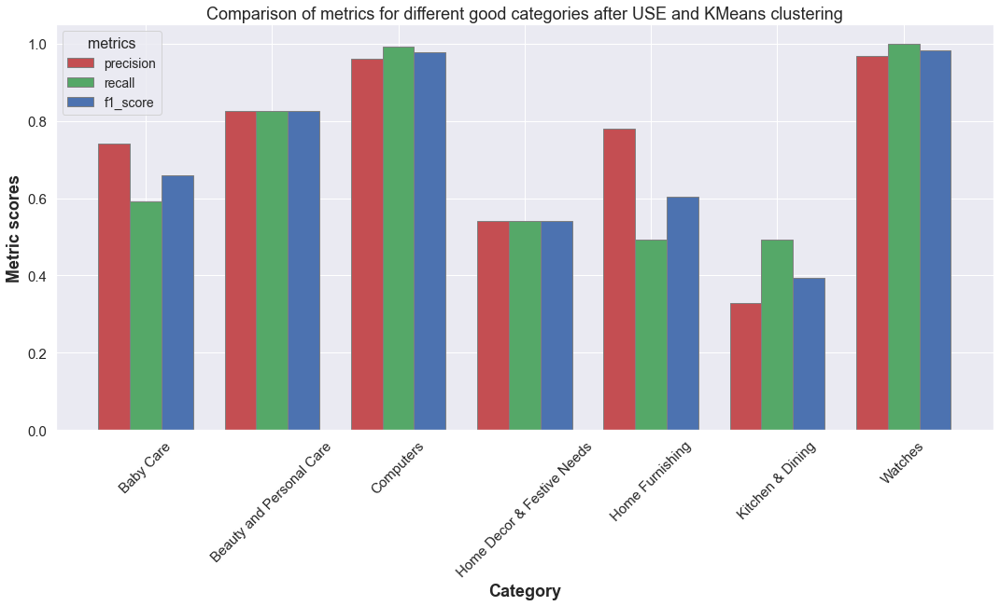

In [1329]:
# Display barplot for precision, recall and f1 score for categories
display_metrics(metrics_USE, 
                model_name = 'Universal Sentence Encoder (description dl)')

## RESUME 'TEXT' CLUSTERING

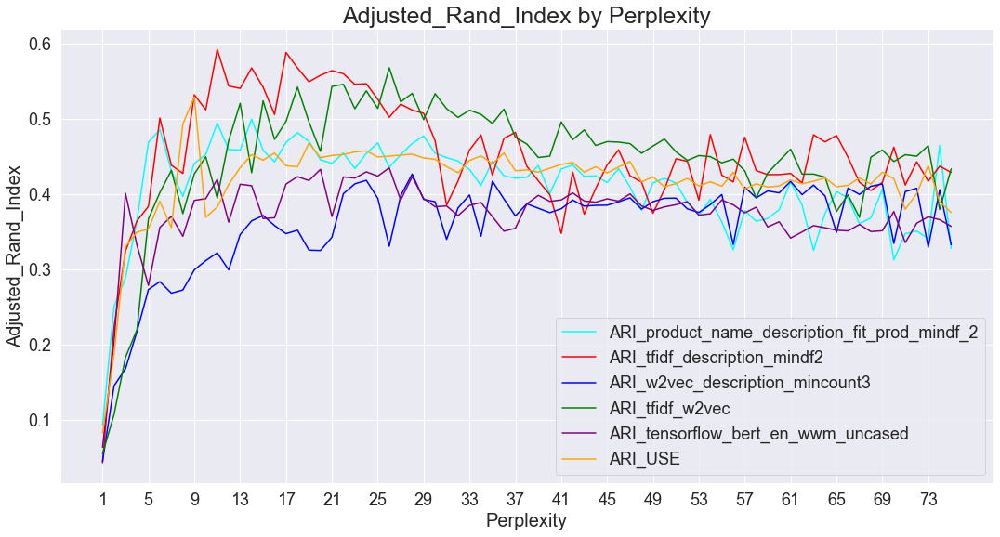

In [1012]:
# Plotting best clustering results for each vectorizer and deep learning approach
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_bert_base_uncased
y2 = ARI_bert_large_uncased
y3 = ARI_roberta
y4 = ARI_tensorflow_bert_en_wwm_uncased
y5 = ARI_USE
y6 = ARI_tfidf_w2vec
y7 = ARI_tfidf_w2vec_mincount2
y8 = ARI_w2vec_description_mincount3
y9 = ARI_tfidf_description_mindf2
y10 = ARI_product_name_description_fit_prod_mindf_2

# Plot the different metrics
ax.plot(x, y10, color = 'cyan', label = 'ARI_product_name_description_fit_prod_mindf_2')
ax.plot(x, y9, color = 'red', label = 'ARI_tfidf_description_mindf2')
ax.plot(x, y8, color = 'blue', label = 'ARI_w2vec_description_mincount3')
ax.plot(x, y6, color = 'green', label = 'ARI_tfidf_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_tensorflow_bert_en_wwm_uncased')
ax.plot(x, y5, color = 'orange', label = 'ARI_USE')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 18)

plt.show()

### Conclusion for 'Text' clustering
- 1) tfidf

- 2) tfidf weighted word2vec

- 3) Universal Sentence Encoder

- 4) countvectorizer

- 5) tensorflow bert

- 6) word2vec

# SIFT

In [93]:
from os import listdir

# Save path of the folder containing images
path = "C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/Images/"

# Create the list of photos names
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1051


## Create labels by using image names

In [94]:
# Sort dataframe 'data' by 'image' alphabetical order
data = data.sort_values('image')
data = data.reset_index()

In [95]:
# LabelEncoder for first categories
from sklearn import preprocessing

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(data['first_category'])

# Transform categories to labels
data["category_label"] = le.transform(data['first_category'])
true_label = data["category_label"]

In [96]:
# Create labels for first_category
print("catégories : ", list_1st_cat)
true_labels = true_label.tolist()
print("true_labels : ", true_labels)

catégories :  ['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']
true_labels :  [6, 5, 4, 1, 2, 2, 2, 5, 1, 5, 5, 1, 2, 2, 3, 3, 4, 3, 4, 4, 6, 0, 1, 6, 5, 4, 5, 2, 3, 1, 1, 6, 6, 6, 3, 4, 0, 5, 0, 0, 3, 3, 4, 1, 3, 1, 5, 5, 3, 0, 5, 5, 5, 2, 5, 6, 5, 1, 5, 4, 5, 3, 0, 5, 4, 6, 4, 6, 6, 5, 0, 3, 5, 4, 2, 1, 1, 0, 1, 6, 2, 6, 4, 5, 6, 4, 6, 1, 3, 4, 6, 3, 1, 3, 1, 0, 6, 3, 1, 3, 6, 2, 5, 1, 1, 1, 1, 1, 6, 6, 2, 1, 6, 5, 2, 3, 5, 2, 3, 5, 6, 3, 4, 0, 0, 5, 6, 1, 0, 3, 4, 1, 6, 2, 5, 0, 0, 4, 1, 2, 2, 3, 3, 5, 0, 2, 3, 4, 4, 4, 2, 2, 6, 5, 6, 0, 3, 2, 3, 1, 6, 5, 4, 0, 2, 0, 6, 1, 1, 1, 3, 6, 5, 4, 3, 3, 5, 3, 3, 6, 0, 2, 3, 0, 0, 0, 6, 5, 0, 0, 2, 4, 5, 6, 3, 2, 3, 3, 6, 6, 4, 6, 1, 3, 5, 2, 5, 5, 6, 0, 1, 0, 4, 1, 2, 6, 0, 1, 5, 0, 5, 3, 3, 0, 3, 1, 5, 6, 2, 0, 5, 4, 0, 0, 0, 1, 5, 4, 4, 4, 6, 3, 6, 3, 3, 6, 3, 6, 4, 1, 6, 2, 5, 0, 3, 1, 1, 2, 4, 4, 0, 3, 6, 2, 3, 1, 3, 2, 3, 4, 3, 1, 6, 0, 3, 2, 2, 2, 4

## Display image examples for each label

Baby Care


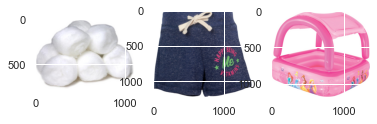

Beauty and Personal Care


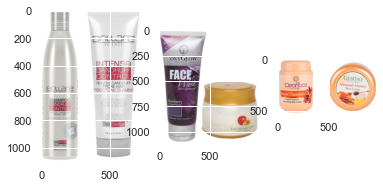

Computers


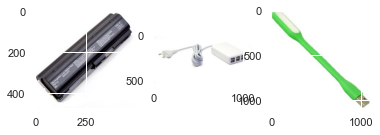

Home Decor & Festive Needs


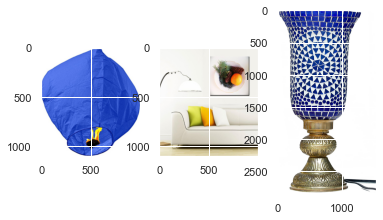

Home Furnishing


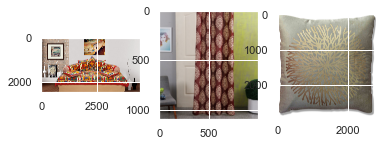

Kitchen & Dining


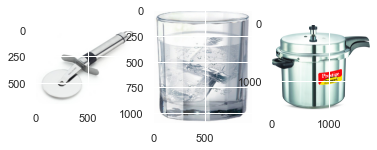

Watches


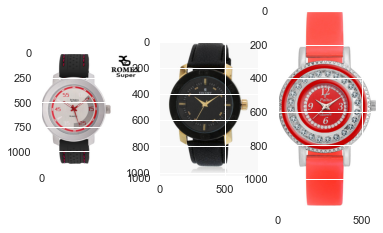

In [1043]:
from matplotlib.image import imread

# Function to define image list for each category
def list_fct(name) :
    list_image_name = [list_photos[i] for i in range(len(data)) if data["first_category"][i]==name]
    return list_image_name

# Create image list for each category
list_baby=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Baby Care"]
list_beauty=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Beauty and Personal Care"]
list_computers=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Computers"]
list_home_decor=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Home Decor & Festive Needs"]
list_home_furnishing=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Home Furnishing"]
list_kitchen=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Kitchen & Dining"]
list_watches=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Watches"]

# Show 3 images for each category
for category in list_1st_cat :
    print(category)
    # print("-------")
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + list_fct(category)[i+6]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

## Define and display SIFT descriptors for 1 random image

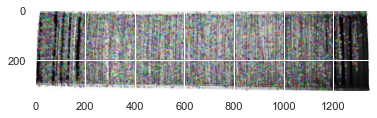

Descripteurs :  (13181, 128)

[[31.  2.  0. ...  0.  0.  0.]
 [ 1.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  5.]
 ...
 [ 5.  1.  1. ...  0.  0.  3.]
 [ 1.  1.  1. ...  0.  0.  4.]
 [ 1.  1.  1. ...  0.  0.  0.]]


In [1044]:
import cv2

# Create sift features
sift = cv2.xfeatures2d.SIFT_create()

# For 1 image :
image = cv2.imread(path+list_photos[2])

# convert in gray
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# # Equalize image histogram
image = cv2.equalizeHist(image)

# Save keypoints and descriptors
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)

plt.imshow(img)
plt.show()
print("Descriptors : ", des.shape)
print()
print(des)

## Define and display SIFT descriptors for all images

In [1057]:
# Split list_photos into 4 list for further treatment
splits = np.array_split(list_photos, 4)

list1 = splits[0]
list2 = splits[1]
list3 = splits[2]
list4 = splits[3]

In [1058]:
# Check length of each list
print(len(list1))
print(len(list2))
print(len(list3))
print(len(list4))

263
263
262
262


In [1059]:
# identification of key points and associated descriptors in list_photos
import time, cv2

temps1=time.time()
# Limit the number of descriptors for each image : 1000
sift = cv2.xfeatures2d.SIFT_create(1000)

# Apply pre processing and descriptors creation for list1
sift_keypoints1 = []
for image_num in range(len(list1)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num])
    # convert in gray
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(image, None)
    sift_keypoints1.append(des)

# Apply pre processing and descriptors creation for list2
sift_keypoints2 = []
for image_num in range(len(list2)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num])
    # convert in gray
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(image, None)
    sift_keypoints2.append(des)

# Apply pre processing and descriptors creation for list3
sift_keypoints3 = []
for image_num in range(len(list3)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num])
    # convert in gray
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(image, None)
    sift_keypoints3.append(des)

# Apply pre processing and descriptors creation for list4
sift_keypoints4 = []
for image_num in range(len(list4)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num])
    # convert in gray
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(image, None)
    sift_keypoints4.append(des)

# Concatenate sift_keypoints in one list
sift_keypoints = (sift_keypoints1 + sift_keypoints2 + sift_keypoints3 + sift_keypoints4)

# Create a list of descriptors for each image 
# (to produce each histogramm)
sift_keypoints_by_img = np.asarray(sift_keypoints)

# Create a list of descriptors of all images 
# (to create clusters of descriptors)
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
0
100
200
0
100
200
0
100
200


C:\Users\33624\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)



Nombre de descripteurs :  (989512, 128)
temps de traitement SIFT descriptor :           993.53 secondes


## Create clusters of descriptors
* Using MiniBatchKMeans to have reasonable time of processing

In [1060]:
from sklearn import cluster, metrics

temps1=time.time()

# Determination number of clusters (using square root of the number of descriptors)
k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size = 3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  995
Création de 995 clusters de descripteurs ...


C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:887: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=1
  warnings.warn(


temps de traitement kmeans :           125.84 secondes


## Create features of images
* For each image : 
   - predict the cluster label of every descriptor
   - Create histogramm = for each cluster label, counting the number of descriptors of the image

In [1061]:
# Creation of histograms (features)
temps1=time.time()

# Function to build histogram of 1 image
def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist

# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

# define the matrix of histograms
im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :            14.66 secondes


## Dimension Reduction

### First reduction using PCA

In [1062]:
from sklearn import manifold, decomposition

print("Dimensions dataset avant réduction PCA : ", im_features.shape)
# Reduce dimensions with PCA keeping 99% of the variance
pca = decomposition.PCA(n_components=0.99)
# Create features after the first dimension reduction
feat_pca = pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 995)
Dimensions dataset après réduction PCA :  (1050, 219)


### 2nd reduction using T-SNE

In [1067]:
# Execute SIFT model with perplexity from 1 to 75
ARI_SIFT, opt_perplexity = ARI_calculation(feat_pca)

ARI :  0.0015 time :  9.0
ARI :  0.002 time :  9.0
ARI :  0.0015 time :  9.0
ARI :  0.0053 time :  10.0
ARI :  0.0042 time :  10.0
ARI :  -0.0001 time :  10.0
ARI :  0.0013 time :  9.0
ARI :  0.0041 time :  8.0
ARI :  0.0022 time :  8.0
ARI :  0.0055 time :  10.0
ARI :  0.0042 time :  6.0
ARI :  0.0033 time :  5.0
ARI :  0.0033 time :  4.0
ARI :  0.0057 time :  5.0
ARI :  0.0052 time :  5.0
ARI :  0.0053 time :  5.0
ARI :  0.0042 time :  5.0
ARI :  0.004 time :  5.0
ARI :  0.0034 time :  5.0
ARI :  0.005 time :  5.0
ARI :  0.0029 time :  5.0
ARI :  0.0045 time :  5.0
ARI :  0.0025 time :  5.0
ARI :  0.0035 time :  5.0
ARI :  0.0023 time :  5.0
ARI :  0.0045 time :  12.0
ARI :  0.0006 time :  5.0
ARI :  0.0022 time :  11.0
ARI :  0.0034 time :  12.0
ARI :  0.0023 time :  12.0
ARI :  0.0038 time :  11.0
ARI :  0.0018 time :  12.0
ARI :  0.0026 time :  12.0
ARI :  0.0016 time :  12.0
ARI :  0.0021 time :  12.0
ARI :  0.0027 time :  13.0
ARI :  0.0023 time :  12.0
ARI :  0.0028 time :  12.

ARI :  0.0057 time :  5.0


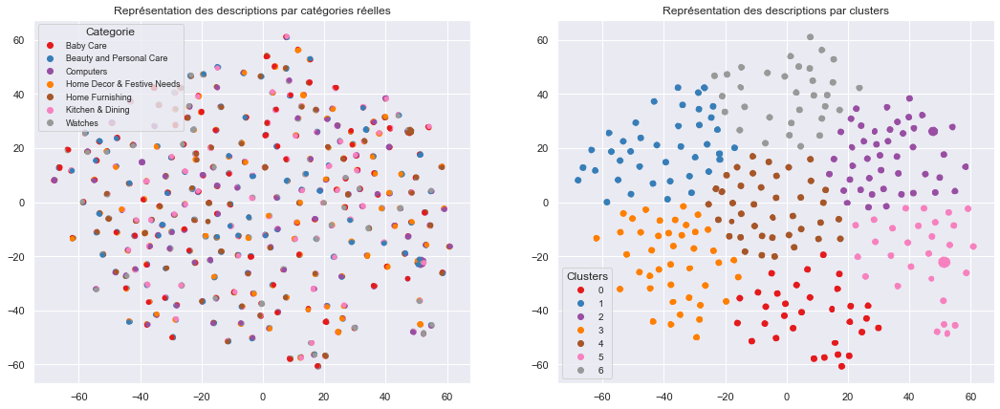

ARI :  0.0057


In [1068]:
# Execute clustering with opt_perplexity (14) for SIFT
ARI, X_tsne, labels = ARI_fct(feat_pca, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

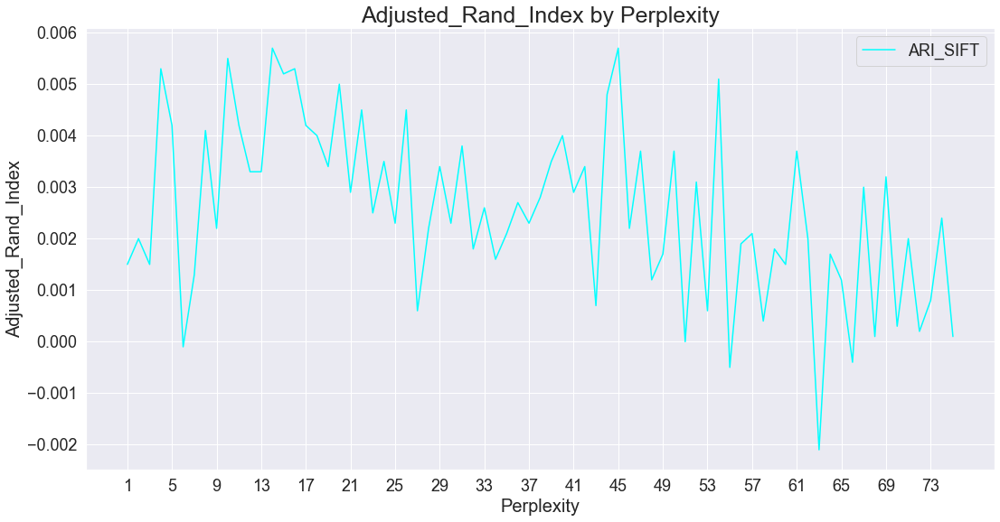

In [1069]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 76)
y1 = ARI_SIFT

# Plot the different metrics
ax.plot(x, y1, color = 'cyan', label = 'ARI_SIFT')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 76)), max(range(1, 76)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 18)

plt.show()

### Conclusion for SIFT
- This method is not adapted for our problematic

# Transfer Learning

In [97]:
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import pickle

In [98]:
path = "C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/Images/"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
photos = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.jpg'):
          # adds only the image files to the photos list
            photos.append(file.name)

### Functions

In [99]:
# Redefine ARI_calculation function with perplexity range from 1 to 50
def ARI_calculation(features):
    ARI_list = []
    for perplexity in range(1, 51):
        ARI, X_tsne, labels = ARI_fct(features, perplexity)
        ARI_list.append(ARI)

    max_value = None
    max_idx = None

    for idx, num in enumerate(ARI_list):
        if (max_value is None or num > max_value):
            max_value = num
            max_idx = idx
            opt_perplexity = max_idx + 1

    print('Maximum value:', max_value, "At index: ", max_idx)
    print('Optimal perplexity = ', opt_perplexity)
    
    return ARI_list, opt_perplexity

In [100]:
# Function to extract features from photo and previously loaded CNN model
def extract_features(file, model, target_size):
    # load the image as a target_size x target_size array
    img = load_img(file, target_size=(target_size,target_size))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,target_size,target_size,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    
    return features

In [101]:
# Function to extract features from photos and reshape it
def extract_feature_reshape(file, model, target_size, final_vectors):
    data_photos = {}
    # lop through each image in the dataset
    for file in photos:
        # Extract the features and update the dictionary
        feat = extract_features(file, model, target_size)
        data_photos[file] = feat
    # get a list of just the features
    feat = np.array(list(data_photos.values()))
    # reshape so that there are 1050 samples of x vectors
    feat = feat.reshape(-1, final_vectors)
    print('feat_shape: ', feat.shape)
        
    return feat

In [102]:
# PCA reduction and print shape of reduced features
def pca_reduction(n_components, random_state, feat):
    pca = PCA(n_components, random_state)
    pca.fit(feat)
    feat_pca = pca.transform(feat)
    print(f"Components before PCA: {feat.shape}")
    print(f"Components after PCA: {feat_pca.shape}")
    
    return feat_pca

In [103]:
# Function to display the confusion matrix after KMeans clustering
def conf_mat_CNN(true_labels, predicted_labels, model_name):
    conf_mat = confusion_matrix(true_labels, predicted_labels)
    data_cm = pd.DataFrame(conf_mat, 
                           index = [category for category in list_1st_cat],
                           columns = [i for i in "0123456"])
    plt.figure(figsize = (8,6))
    cmap = 'YlOrBr'
    colormap = sns.heatmap(data_cm, 
                           annot=True, 
                           annot_kws ={'size':14}, 
                           cmap=cmap, 
                           fmt='.3g')
    colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
    colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

    plt.title(f'Confusion Matrix of categories and cluster_labels \n Clustering after {model_name} Features extraction',
              size = 18);

In [104]:
# Create confusion matrix and translate cluster_labels to categories
# Then calculate accuracy and different metrics by categorie
def class_report(true_labels, predicted_labels):
    # Transform cluster_labels to categories
    labels_transform = conf_mat_transform(true_labels, predicted_labels)
    conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
    print(conf_mat)
    print()
    classification = metrics.classification_report(true_labels, 
                                                   labels_transform,
                                                   target_names = list_1st_cat, 
                                                   digits = 3)
    print(metrics.classification_report(true_labels, 
                                        labels_transform, 
                                        target_names=[category for category in list_1st_cat], 
                                        digits = 3))
    dict_class = metrics.classification_report(true_labels,
                                               labels_transform,
                                               target_names=[category for category in list_1st_cat],
                                               digits = 3,
                                               output_dict = True)
    # Create dataframe with categories and metrics
    data_metrics = round(pd.DataFrame.from_dict(dict_class, 
                                                orient='columns').T.iloc[0:7,0:3], 
                         3)
    
    return dict_class, data_metrics

In [105]:
# Display metrics as barplots
def display_metrics_CNN(dataframe, model_name):
    # set width of bar
    barWidth = 0.25
    fig = plt.subplots(figsize =(18, 8))
     # set height of bar
    precision = dataframe['precision'].values
    recall = dataframe['recall'].values
    f1_score = dataframe['f1-score'].values
     # Set position of bar on X axis
    br1 = np.arange(len(precision))
    br2 = [x + barWidth for x in br1]
    br3 = [x + barWidth for x in br2]
     # Make the plot
    rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
                     edgecolor ='grey', label ='precision')
    rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
                     edgecolor ='grey', label ='recall')
    rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
                     edgecolor ='grey', label ='f1_score')
     # Adding Xticks
    plt.xlabel('Category', fontweight ='bold', fontsize = 18)
    plt.ylabel('Metric scores', fontweight ='bold', fontsize = 18)
    plt.xticks([r + barWidth for r in range(len(precision))],
               list_1st_cat,
               size = 15,
               rotation = 45)
    plt.yticks(size = 15)
    plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
    plt.title(f'Comparison of metrics for different good categories after {model_name} feature extraction and KMeans clustering',
             size = 20)
    plt.show()

### Transfer Learning with VGG16

In [1233]:
# load model
model_VGG16 = VGG16()
# remove the output layer
model_VGG16 = Model(inputs = model_VGG16.inputs,
                    outputs = model_VGG16.layers[-2].output)
# summarize the model
model_VGG16.summary()

Model: "model_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_59 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0  

In [1236]:
# Extract features with VGG16 model
feat_VGG16 = extract_feature_reshape(file = photo,
                                     model = model_VGG16, 
                                     target_size = 224, 
                                     final_vectors = 4096)

feat_shape:  (1050, 4096)


In [1240]:
# Reduce dimensions of the features (keeping 99% of variance) before tSNE reduction
feat_pca_VGG16 = pca_reduction(n_components = 0.99,
                               random_state = 22,
                               feat = feat_VGG16)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass copy=22 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


Components before PCA: (1050, 4096)
Components after PCA: (1050, 803)


In [1185]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca_VGG16' feature
ARI_VGG16, opt_perplexity = ARI_calculation(feat_pca_VGG16)

ARI :  0.1167 time :  7.0
ARI :  0.3281 time :  7.0
ARI :  0.3511 time :  8.0
ARI :  0.4811 time :  8.0
ARI :  0.4587 time :  8.0
ARI :  0.4381 time :  9.0
ARI :  0.4744 time :  9.0
ARI :  0.4953 time :  9.0
ARI :  0.4669 time :  9.0
ARI :  0.4432 time :  9.0
ARI :  0.4597 time :  10.0
ARI :  0.4415 time :  10.0
ARI :  0.4324 time :  9.0
ARI :  0.4431 time :  10.0
ARI :  0.4737 time :  9.0
ARI :  0.4529 time :  10.0
ARI :  0.4633 time :  10.0
ARI :  0.4596 time :  9.0
ARI :  0.4677 time :  10.0
ARI :  0.4785 time :  10.0
ARI :  0.4862 time :  11.0
ARI :  0.452 time :  10.0
ARI :  0.4756 time :  10.0
ARI :  0.4641 time :  10.0
ARI :  0.4379 time :  10.0
ARI :  0.4729 time :  10.0
ARI :  0.4585 time :  11.0
ARI :  0.4662 time :  11.0
ARI :  0.5017 time :  11.0
ARI :  0.4462 time :  10.0
ARI :  0.489 time :  10.0
ARI :  0.4852 time :  10.0
ARI :  0.437 time :  11.0
ARI :  0.4756 time :  10.0
ARI :  0.4299 time :  11.0
ARI :  0.4653 time :  10.0
ARI :  0.4939 time :  10.0
ARI :  0.4704 tim

ARI :  0.5347 time :  12.0


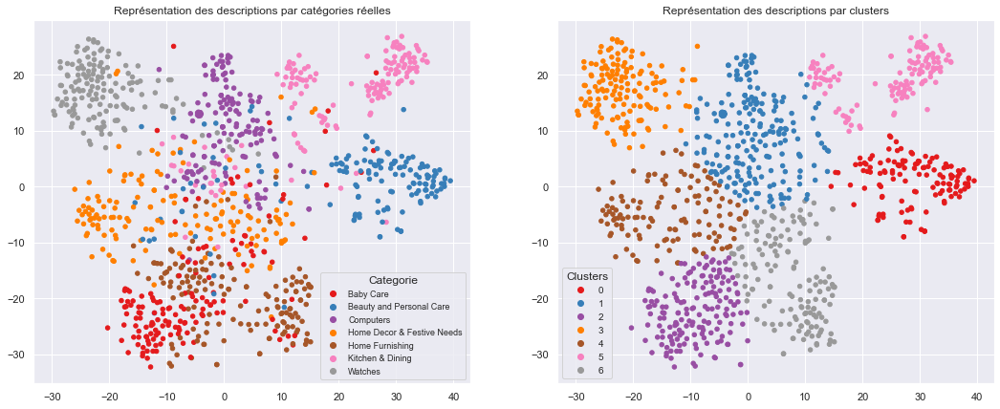

ARI :  0.5347


In [1244]:
# Execute clustering with opt_perplexity (47) for 'feat_pca_VGG16' feature
ARI, X_tsne, labels_VGG16 = ARI_fct(feat_pca_VGG16, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels_VGG16, ARI)

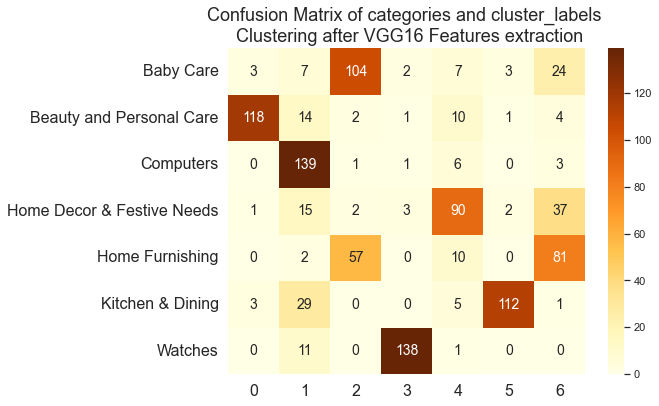

In [1245]:
# Display confusion matrix of VGG16 clustering
conf_mat_CNN(true_labels = true_labels, 
             predicted_labels = labels_VGG16, 
             model_name = 'VGG16')

In [1247]:
# Calculate metrics and accuracy after VGG16 clustering
dict_classification_VGG16, data_metrics_VGG16 = class_report(true_labels = true_labels, 
                                                             predicted_labels = labels_VGG16)

[[104   3   7   7  24   3   2]
 [  2 118  14  10   4   1   1]
 [  1   0 139   6   3   0   1]
 [  2   1  15  90  37   2   3]
 [ 57   0   2  10  81   0   0]
 [  0   3  29   5   1 112   0]
 [  0   0  11   1   0   0 138]]

                            precision    recall  f1-score   support

                 Baby Care      0.627     0.693     0.658       150
  Beauty and Personal Care      0.944     0.787     0.858       150
                 Computers      0.641     0.927     0.757       150
Home Decor & Festive Needs      0.698     0.600     0.645       150
           Home Furnishing      0.540     0.540     0.540       150
          Kitchen & Dining      0.949     0.747     0.836       150
                   Watches      0.952     0.920     0.936       150

                  accuracy                          0.745      1050
                 macro avg      0.764     0.745     0.747      1050
              weighted avg      0.764     0.745     0.747      1050



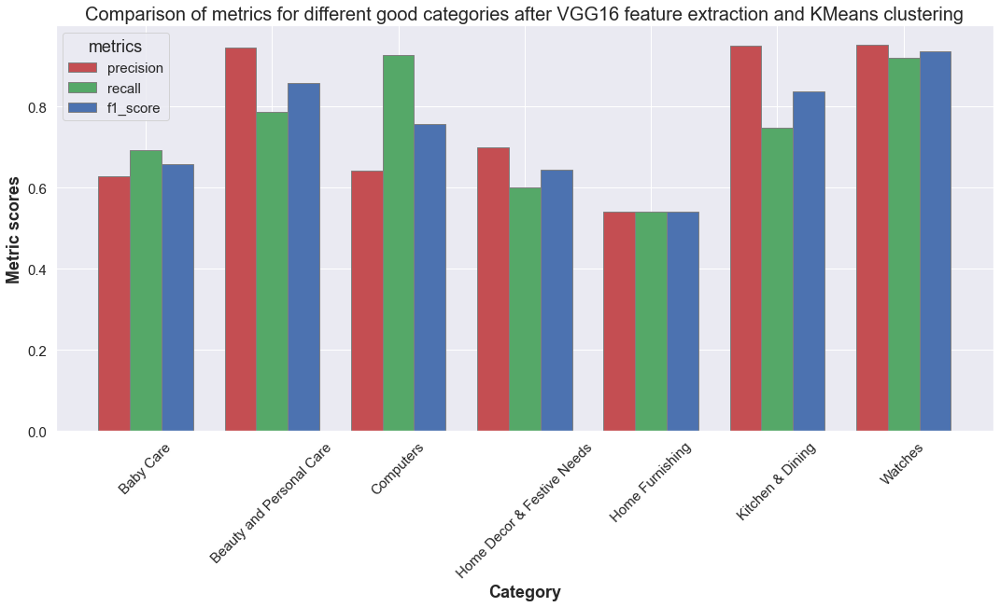

In [1199]:
# Display metrics as barplots
display_metrics_CNN(data_metrics_VGG16, 'VGG16')

### Transfer Learning with ResNet50

In [1222]:
from tensorflow.keras.applications.resnet50 import ResNet50

In [1251]:
# load model
model_ResNet50 = ResNet50()
# remove the output layer
model_ResNet50 = Model(inputs = model_ResNet50.inputs, 
                       outputs = model_ResNet50.layers[-2].output)
# summarize the model
model_ResNet50.summary()

Model: "model_43"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_61 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_61[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [1252]:
# Extract features with ResNet50 model
feat_ResNet50 = extract_feature_reshape(file = photo, 
                                        model = model_ResNet50, 
                                        target_size = 224, 
                                        final_vectors = 2048)

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


feat_shape:  (1050, 2048)


In [1254]:
# Reduce dimensions of the features before tSNE reduction
feat_pca_ResNet50 = pca_reduction(n_components = 0.99,
                                  random_state = 22,
                                  feat = feat_ResNet50)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass copy=22 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


Components before PCA: (1050, 2048)
Components after PCA: (1050, 722)


In [1093]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca_ResNet50' feature
ARI_ResNet50, opt_perplexity = ARI_calculation(feat_pca_ResNet50)

ARI :  0.0948 time :  7.0
ARI :  0.2774 time :  7.0
ARI :  0.3357 time :  9.0
ARI :  0.3891 time :  9.0
ARI :  0.4187 time :  9.0
ARI :  0.4796 time :  9.0
ARI :  0.5024 time :  10.0
ARI :  0.4969 time :  10.0
ARI :  0.5116 time :  9.0
ARI :  0.5436 time :  10.0
ARI :  0.5451 time :  10.0
ARI :  0.5446 time :  10.0
ARI :  0.5606 time :  11.0
ARI :  0.5585 time :  11.0
ARI :  0.5598 time :  11.0
ARI :  0.5531 time :  11.0
ARI :  0.5354 time :  11.0
ARI :  0.5352 time :  11.0
ARI :  0.5521 time :  12.0
ARI :  0.5126 time :  12.0
ARI :  0.5226 time :  12.0
ARI :  0.5067 time :  11.0
ARI :  0.501 time :  11.0
ARI :  0.5146 time :  11.0
ARI :  0.5094 time :  12.0
ARI :  0.5453 time :  12.0
ARI :  0.5035 time :  12.0
ARI :  0.508 time :  12.0
ARI :  0.5159 time :  11.0
ARI :  0.5007 time :  11.0
ARI :  0.5116 time :  11.0
ARI :  0.4986 time :  12.0
ARI :  0.5436 time :  11.0
ARI :  0.5315 time :  12.0
ARI :  0.5647 time :  13.0
ARI :  0.5474 time :  12.0
ARI :  0.5671 time :  13.0
ARI :  0.5

ARI :  0.585 time :  12.0


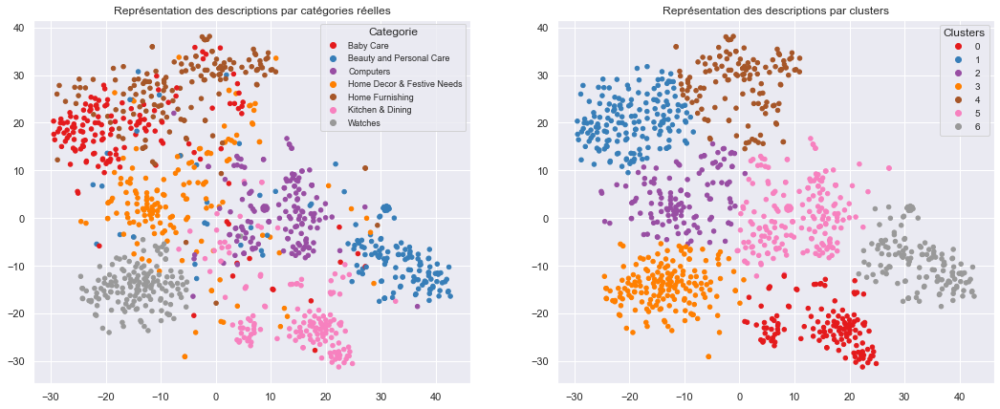

ARI :  0.585


In [1256]:
# Execute clustering with optimal perplexity (48) for 'feat_pca_ResNet50' feature
ARI, X_tsne, labels_ResNet50 = ARI_fct(feat_pca_ResNet50, 48)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels_ResNet50, ARI)

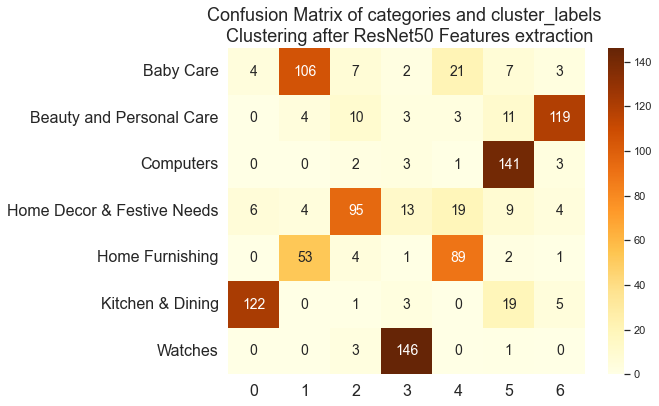

In [1257]:
# Display confusion matrix of ResNet50 clustering
conf_mat_CNN(true_labels = true_labels, 
             predicted_labels = labels_ResNet50, 
             model_name = 'ResNet50')

In [1258]:
# Calculate metrics and accuracy after ResNet50 clustering
dict_classification_ResNet50, data_metrics_ResNet50 = class_report(true_labels = true_labels,
                                                                   predicted_labels = labels_ResNet50)

[[106   3   7   7  21   4   2]
 [  4 119  11  10   3   0   3]
 [  0   3 141   2   1   0   3]
 [  4   4   9  95  19   6  13]
 [ 53   1   2   4  89   0   1]
 [  0   5  19   1   0 122   3]
 [  0   0   1   3   0   0 146]]

                            precision    recall  f1-score   support

                 Baby Care      0.635     0.707     0.669       150
  Beauty and Personal Care      0.881     0.793     0.835       150
                 Computers      0.742     0.940     0.829       150
Home Decor & Festive Needs      0.779     0.633     0.699       150
           Home Furnishing      0.669     0.593     0.629       150
          Kitchen & Dining      0.924     0.813     0.865       150
                   Watches      0.854     0.973     0.910       150

                  accuracy                          0.779      1050
                 macro avg      0.783     0.779     0.777      1050
              weighted avg      0.783     0.779     0.777      1050



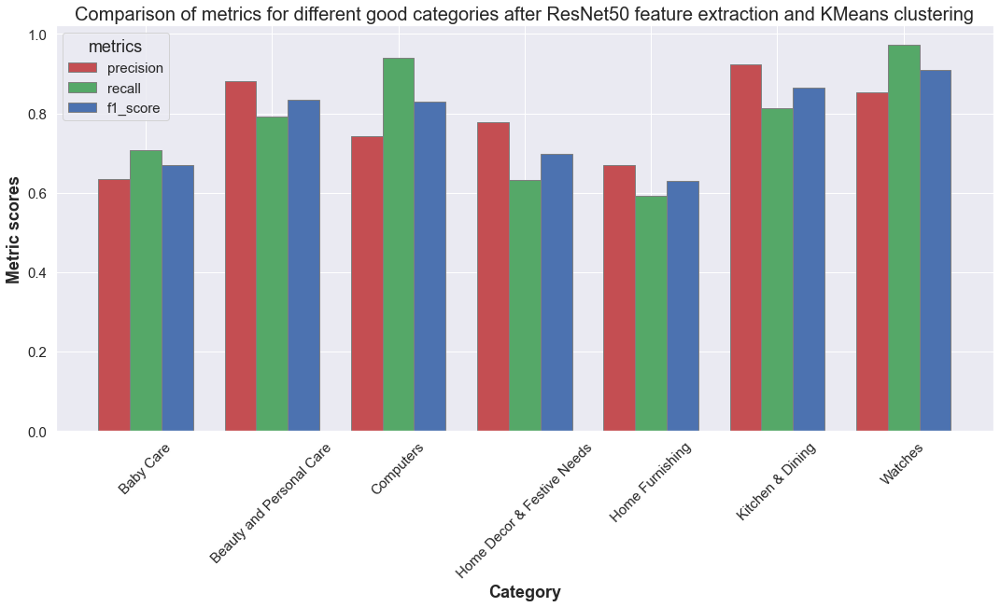

In [1259]:
# Display metrics as barplots
display_metrics_CNN(data_metrics_ResNet50, 'ResNet50')

### Transfer Learning with VGG19

In [1110]:
from keras.applications.vgg19 import preprocess_input 
# models 
from keras.applications.vgg19 import VGG19

In [1111]:
# load model
model_VGG19 = VGG19()
# remove the output layer
model_VGG19 = Model(inputs = model_VGG19.inputs, 
                    outputs = model_VGG19.layers[-2].output)
# summarize the model
model_VGG19.summary()

Model: "model_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_46 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0  

In [1121]:
# Extract features with VGG19 model
feat_VGG19 = extract_feature_reshape(file = photo,
                                     model = model_VGG19,
                                     target_size = 224,
                                     final_vectors = 4096)

(1050, 4096)

In [1122]:
# Reduce dimensions of the features before tSNE reduction
feat_pca_VGG19 = pca_reduction(n_components = 0.99,
                               random_state = 22,
                               feat = feat_VGG19)

Components before PCA: (1050, 4096)
Components after PCA: (1050, 797)


In [1123]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca_VGG19' feature
ARI_VGG19, opt_perplexity = ARI_calculation(feat_pca_VGG19)

ARI :  0.1347 time :  7.0
ARI :  0.288 time :  7.0
ARI :  0.4053 time :  8.0
ARI :  0.4379 time :  8.0
ARI :  0.4654 time :  8.0
ARI :  0.4803 time :  9.0
ARI :  0.43 time :  10.0
ARI :  0.473 time :  9.0
ARI :  0.4973 time :  10.0
ARI :  0.4872 time :  10.0
ARI :  0.5301 time :  11.0
ARI :  0.422 time :  10.0
ARI :  0.4355 time :  10.0
ARI :  0.4529 time :  11.0
ARI :  0.4591 time :  10.0
ARI :  0.4249 time :  10.0
ARI :  0.5143 time :  9.0
ARI :  0.4602 time :  11.0
ARI :  0.4303 time :  11.0
ARI :  0.5307 time :  10.0
ARI :  0.5176 time :  10.0
ARI :  0.5026 time :  11.0
ARI :  0.5421 time :  11.0
ARI :  0.5122 time :  11.0
ARI :  0.5225 time :  11.0
ARI :  0.5203 time :  11.0
ARI :  0.5436 time :  12.0
ARI :  0.5366 time :  12.0
ARI :  0.5083 time :  11.0
ARI :  0.5306 time :  10.0
ARI :  0.5373 time :  10.0
ARI :  0.5083 time :  10.0
ARI :  0.5267 time :  11.0
ARI :  0.5404 time :  11.0
ARI :  0.5199 time :  10.0
ARI :  0.5199 time :  10.0
ARI :  0.5365 time :  10.0
ARI :  0.5344 

ARI :  0.5606 time :  11.0


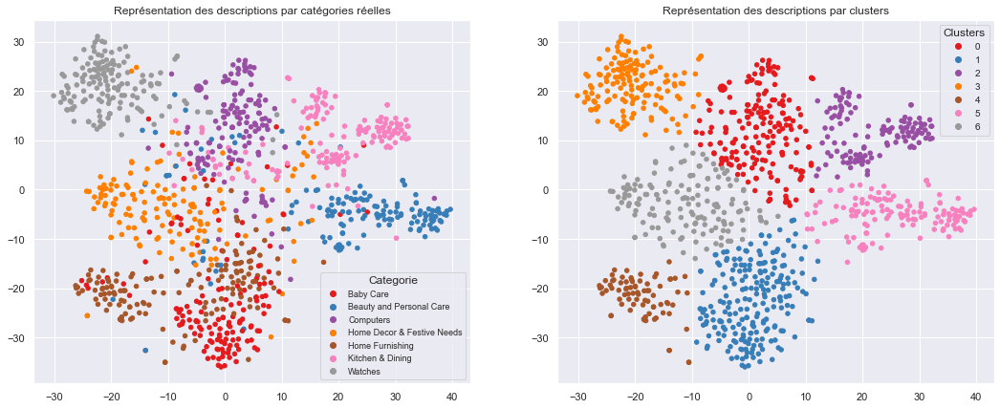

ARI :  0.5606


In [1124]:
# Execute clustering with optimal perplexity (48) for 'feat_pca_VGG19' feature
ARI, X_tsne, labels_VGG19 = ARI_fct(feat_pca_VGG19, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels_VGG19, ARI)

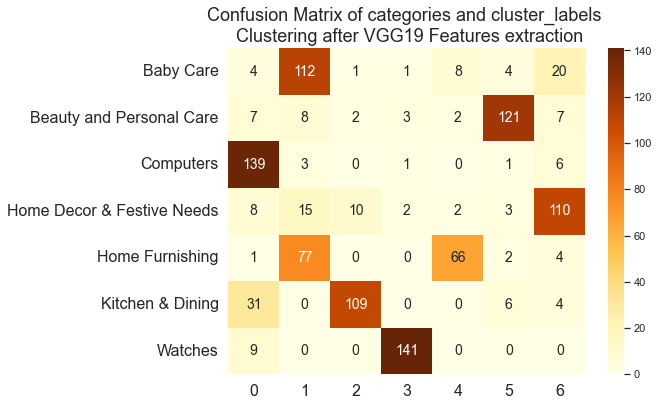

In [1125]:
# Display confusion matrix of VGG19 clustering
conf_mat_CNN(true_labels = true_labels, 
             predicted_labels = labels_VGG19, 
             model_name = 'VGG19')

In [1126]:
# Calculate metrics and accuracy after VGG19 clustering
dict_classification_VGG19, data_metrics_VGG19 = class_report(true_labels = true_labels,
                                                             predicted_labels = labels_VGG19)

[[112   4   4  20   8   1   1]
 [  8 121   7   7   2   2   3]
 [  3   1 139   6   0   0   1]
 [ 15   3   8 110   2  10   2]
 [ 77   2   1   4  66   0   0]
 [  0   6  31   4   0 109   0]
 [  0   0   9   0   0   0 141]]

                            precision    recall  f1-score   support

                 Baby Care      0.521     0.747     0.614       150
  Beauty and Personal Care      0.883     0.807     0.843       150
                 Computers      0.698     0.927     0.797       150
Home Decor & Festive Needs      0.728     0.733     0.731       150
           Home Furnishing      0.846     0.440     0.579       150
          Kitchen & Dining      0.893     0.727     0.801       150
                   Watches      0.953     0.940     0.946       150

                  accuracy                          0.760      1050
                 macro avg      0.789     0.760     0.759      1050
              weighted avg      0.789     0.760     0.759      1050



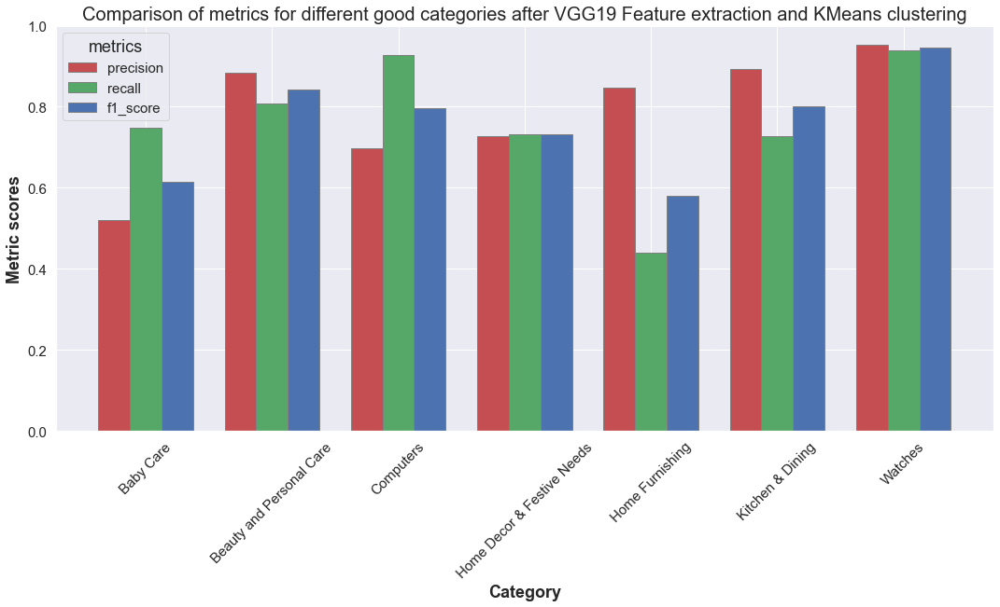

In [1128]:
# Display metrics as barplots
display_metrics_CNN(data_metrics_VGG19, 'VGG19')

### Transfer Learning with InceptionV3

In [1130]:
from keras.applications.inception_v3 import preprocess_input 
# models 
from keras.applications.inception_v3 import InceptionV3

In [1131]:
# load model
model_InceptionV3 = InceptionV3()
# remove the output layer
model_InceptionV3 = Model(inputs = model_InceptionV3.inputs, 
                          outputs = model_InceptionV3.layers[-2].output)
# summarize the model
model_InceptionV3.summary()

Model: "model_29"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_47 (InputLayer)          [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_836 (Conv2D)            (None, 149, 149, 32  864         ['input_47[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_840 (Batch  (None, 149, 149, 32  96         ['conv2d_836[0][0]']             
 Normalization)                 )                                                          

 conv2d_847 (Conv2D)            (None, 35, 35, 32)   6144        ['average_pooling2d_4[0][0]']    
                                                                                                  
 batch_normalization_845 (Batch  (None, 35, 35, 64)  192         ['conv2d_841[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_847 (Batch  (None, 35, 35, 64)  192         ['conv2d_843[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_850 (Batch  (None, 35, 35, 96)  288         ['conv2d_846[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_858 (Conv2D)            (None, 35, 35, 64)   18432       ['mixed1[0][0]']                 
                                                                                                  
 batch_normalization_862 (Batch  (None, 35, 35, 64)  192         ['conv2d_858[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_834 (Activation)    (None, 35, 35, 64)   0           ['batch_normalization_862[0][0]']
                                                                                                  
 conv2d_856 (Conv2D)            (None, 35, 35, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_85

                                                                                                  
 activation_841 (Activation)    (None, 17, 17, 96)   0           ['batch_normalization_869[0][0]']
                                                                                                  
 max_pooling2d_18 (MaxPooling2D  (None, 17, 17, 288)  0          ['mixed2[0][0]']                 
 )                                                                                                
                                                                                                  
 mixed3 (Concatenate)           (None, 17, 17, 768)  0           ['activation_838[0][0]',         
                                                                  'activation_841[0][0]',         
                                                                  'max_pooling2d_18[0][0]']       
                                                                                                  
 conv2d_87

 mixed4 (Concatenate)           (None, 17, 17, 768)  0           ['activation_842[0][0]',         
                                                                  'activation_845[0][0]',         
                                                                  'activation_850[0][0]',         
                                                                  'activation_851[0][0]']         
                                                                                                  
 conv2d_880 (Conv2D)            (None, 17, 17, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_884 (Batch  (None, 17, 17, 160)  480        ['conv2d_880[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

 conv2d_890 (Conv2D)            (None, 17, 17, 160)  122880      ['mixed5[0][0]']                 
                                                                                                  
 batch_normalization_894 (Batch  (None, 17, 17, 160)  480        ['conv2d_890[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_866 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_894[0][0]']
                                                                                                  
 conv2d_891 (Conv2D)            (None, 17, 17, 160)  179200      ['activation_866[0][0]']         
                                                                                                  
 batch_normalization_895 (Batch  (None, 17, 17, 160)  480        ['conv2d_891[0][0]']             
 Normaliza

 activation_876 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_904[0][0]']
                                                                                                  
 conv2d_901 (Conv2D)            (None, 17, 17, 192)  258048      ['activation_876[0][0]']         
                                                                                                  
 batch_normalization_905 (Batch  (None, 17, 17, 192)  576        ['conv2d_901[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_877 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_905[0][0]']
                                                                                                  
 conv2d_897 (Conv2D)            (None, 17, 17, 192)  147456      ['mixed6[0][0]']                 
          

 Normalization)                                                                                   
                                                                                                  
 activation_885 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_913[0][0]']
                                                                                                  
 conv2d_906 (Conv2D)            (None, 17, 17, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_910 (Conv2D)            (None, 17, 17, 192)  258048      ['activation_885[0][0]']         
                                                                                                  
 batch_normalization_910 (Batch  (None, 17, 17, 192)  576        ['conv2d_906[0][0]']             
 Normalization)                                                                                   
          

 Normalization)                                                                                   
                                                                                                  
 conv2d_920 (Conv2D)            (None, 8, 8, 192)    245760      ['average_pooling2d_11[0][0]']   
                                                                                                  
 batch_normalization_916 (Batch  (None, 8, 8, 320)   960         ['conv2d_912[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_890 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_918[0][0]']
                                                                                                  
 activation_891 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_919[0][0]']
          

                                                                                                  
 activation_899 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_927[0][0]']
                                                                                                  
 activation_900 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_928[0][0]']
                                                                                                  
 activation_903 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_931[0][0]']
                                                                                                  
 activation_904 (Activation)    (None, 8, 8, 384)    0           ['batch_normalization_932[0][0]']
                                                                                                  
 batch_normalization_933 (Batch  (None, 8, 8, 192)   576         ['conv2d_929[0][0]']             
 Normaliza

In [1133]:
# Extract features with InceptionV3 model
feat_InceptionV3 = extract_feature_reshape(file = photo,
                                           model = model_InceptionV3,
                                           target_size = 299,
                                           final_vectors = 2048)

# Reduce dimensions of the features before tSNE reduction
feat_pca_InceptionV3 = pca_reduction(n_components = 0.99,
                                     random_state = 22,
                                     feat = feat_InceptionV3)

Components before PCA: (1050, 2048)
Components after PCA: (1050, 696)


In [1134]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca_InceptionV3' feature
ARI_InceptionV3, opt_perplexity = ARI_calculation(feat_pca_InceptionV3)

ARI :  0.0894 time :  8.0
ARI :  0.3403 time :  7.0
ARI :  0.4071 time :  8.0
ARI :  0.5238 time :  10.0
ARI :  0.5462 time :  10.0
ARI :  0.485 time :  9.0
ARI :  0.4959 time :  9.0
ARI :  0.5458 time :  9.0
ARI :  0.576 time :  10.0
ARI :  0.5394 time :  10.0
ARI :  0.552 time :  10.0
ARI :  0.5458 time :  9.0
ARI :  0.5558 time :  9.0
ARI :  0.5534 time :  9.0
ARI :  0.5383 time :  9.0
ARI :  0.5375 time :  9.0
ARI :  0.556 time :  10.0
ARI :  0.5719 time :  9.0
ARI :  0.5306 time :  10.0
ARI :  0.5426 time :  10.0
ARI :  0.5492 time :  10.0
ARI :  0.5582 time :  10.0
ARI :  0.558 time :  11.0
ARI :  0.5428 time :  10.0
ARI :  0.5396 time :  10.0
ARI :  0.5411 time :  10.0
ARI :  0.5587 time :  10.0
ARI :  0.5333 time :  10.0
ARI :  0.5802 time :  10.0
ARI :  0.5482 time :  10.0
ARI :  0.5545 time :  10.0
ARI :  0.5696 time :  8.0
ARI :  0.5731 time :  11.0
ARI :  0.5547 time :  10.0
ARI :  0.5429 time :  11.0
ARI :  0.5668 time :  11.0
ARI :  0.5688 time :  11.0
ARI :  0.5763 time 

ARI :  0.5802 time :  10.0


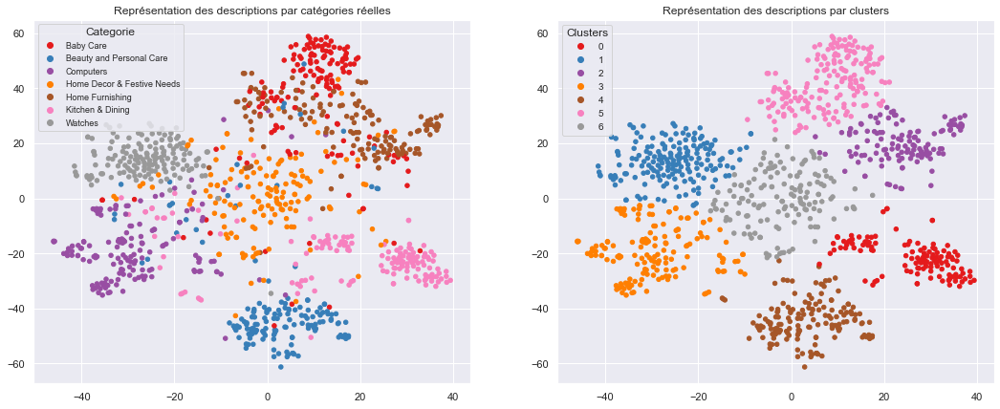

ARI :  0.5802


In [1137]:
# Execute clustering with optimal perplexity for 'feat_pca_InceptionV3' feature
ARI, X_tsne, labels_InceptionV3 = ARI_fct(feat_pca_InceptionV3, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels_InceptionV3, ARI)

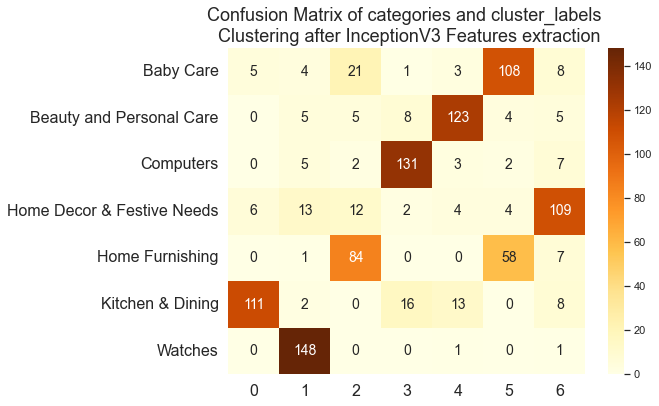

In [1138]:
# Display confusion matrix of InceptionV3 clustering
conf_mat_CNN(true_labels = true_labels, 
             predicted_labels = labels_InceptionV3, 
             model_name = 'InceptionV3')

In [1139]:
# Calculate metrics and accuracy after InceptionV3 clustering
dict_classification_InceptionV3, data_metrics_InceptionV3 = class_report(true_labels = true_labels,
                                                                         predicted_labels = labels_InceptionV3)

[[108   3   1   8  21   5   4]
 [  4 123   8   5   5   0   5]
 [  2   3 131   7   2   0   5]
 [  4   4   2 109  12   6  13]
 [ 58   0   0   7  84   0   1]
 [  0  13  16   8   0 111   2]
 [  0   1   0   1   0   0 148]]

                            precision    recall  f1-score   support

                 Baby Care      0.614     0.720     0.663       150
  Beauty and Personal Care      0.837     0.820     0.828       150
                 Computers      0.829     0.873     0.851       150
Home Decor & Festive Needs      0.752     0.727     0.739       150
           Home Furnishing      0.677     0.560     0.613       150
          Kitchen & Dining      0.910     0.740     0.816       150
                   Watches      0.831     0.987     0.902       150

                  accuracy                          0.775      1050
                 macro avg      0.779     0.775     0.773      1050
              weighted avg      0.779     0.775     0.773      1050



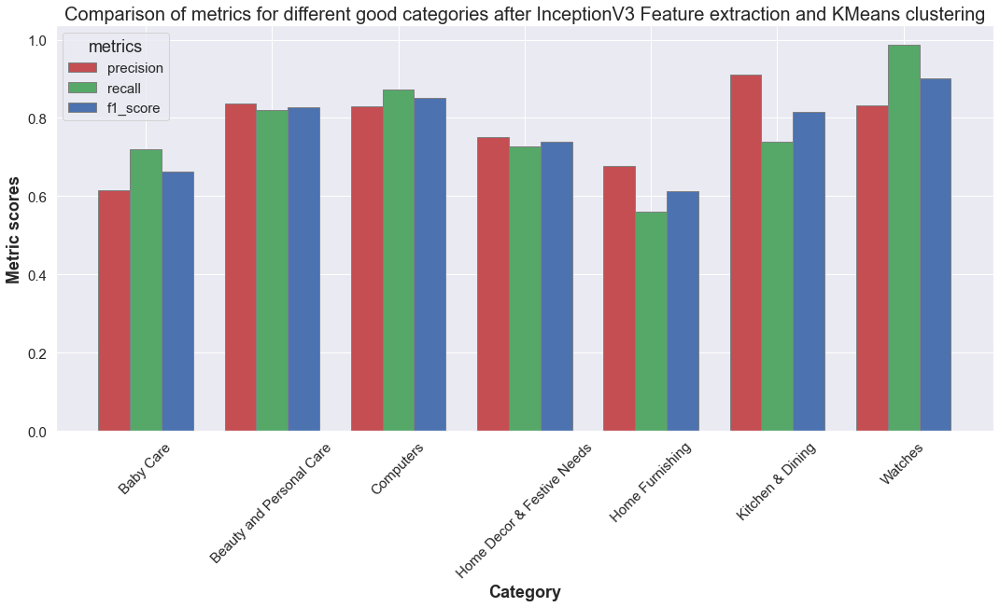

In [1141]:
# Display metrics as barplots
display_metrics_CNN(data_metrics_InceptionV3, 'InceptionV3')

### Transfer Learning with InceptionResNetV2

In [1260]:
from keras.applications.inception_resnet_v2 import preprocess_input 
# models 
from keras.applications.inception_resnet_v2 import InceptionResNetV2

In [1261]:
# load model
model_InceptionResNetV2 = InceptionResNetV2()
# remove the output layer
model_InceptionResNetV2 = Model(inputs = model_InceptionResNetV2.inputs, 
                                outputs = model_InceptionResNetV2.layers[-2].output)
# summarize the model
model_InceptionResNetV2.summary()

Model: "model_44"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_62 (InputLayer)          [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1133 (Conv2D)           (None, 149, 149, 32  864         ['input_62[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_1137 (Batc  (None, 149, 149, 32  96         ['conv2d_1133[0][0]']            
 hNormalization)                )                                                          

                                                                                                  
 conv2d_1140 (Conv2D)           (None, 35, 35, 64)   76800       ['activation_1115[0][0]']        
                                                                                                  
 conv2d_1143 (Conv2D)           (None, 35, 35, 96)   82944       ['activation_1118[0][0]']        
                                                                                                  
 conv2d_1144 (Conv2D)           (None, 35, 35, 64)   12288       ['average_pooling2d_14[0][0]']   
                                                                                                  
 batch_normalization_1142 (Batc  (None, 35, 35, 96)  288         ['conv2d_1138[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 batch_nor

                                                                                                  
 block35_1_mixed (Concatenate)  (None, 35, 35, 128)  0           ['activation_1121[0][0]',        
                                                                  'activation_1123[0][0]',        
                                                                  'activation_1126[0][0]']        
                                                                                                  
 block35_1_conv (Conv2D)        (None, 35, 35, 320)  41280       ['block35_1_mixed[0][0]']        
                                                                                                  
 block35_1 (Lambda)             (None, 35, 35, 320)  0           ['mixed_5b[0][0]',               
                                                                  'block35_1_conv[0][0]']         
                                                                                                  
 block35_1

 batch_normalization_1162 (Batc  (None, 35, 35, 32)  96          ['conv2d_1158[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 batch_normalization_1165 (Batc  (None, 35, 35, 48)  144         ['conv2d_1161[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1134 (Activation)   (None, 35, 35, 32)   0           ['batch_normalization_1162[0][0]'
                                                                 ]                                
                                                                                                  
 activation_1137 (Activation)   (None, 35, 35, 48)   0           ['batch_normalization_1165[0][0]'
          

 batch_normalization_1172 (Batc  (None, 35, 35, 64)  192         ['conv2d_1168[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1139 (Activation)   (None, 35, 35, 32)   0           ['batch_normalization_1167[0][0]'
                                                                 ]                                
                                                                                                  
 activation_1141 (Activation)   (None, 35, 35, 32)   0           ['batch_normalization_1169[0][0]'
                                                                 ]                                
                                                                                                  
 activation_1144 (Activation)   (None, 35, 35, 64)   0           ['batch_normalization_1172[0][0]'
          

                                                                                                  
 batch_normalization_1182 (Batc  (None, 35, 35, 32)  96          ['conv2d_1178[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1154 (Activation)   (None, 35, 35, 32)   0           ['batch_normalization_1182[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1176 (Conv2D)           (None, 35, 35, 32)   10240       ['block35_5_ac[0][0]']           
                                                                                                  
 conv2d_1179 (Conv2D)           (None, 35, 35, 48)   13824       ['activation_1154[0][0]']        
          

                                                                                                  
 conv2d_1183 (Conv2D)           (None, 35, 35, 32)   9216        ['activation_1158[0][0]']        
                                                                                                  
 conv2d_1186 (Conv2D)           (None, 35, 35, 64)   27648       ['activation_1161[0][0]']        
                                                                                                  
 batch_normalization_1185 (Batc  (None, 35, 35, 32)  96          ['conv2d_1181[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 batch_normalization_1187 (Batc  (None, 35, 35, 32)  96          ['conv2d_1183[0][0]']            
 hNormalization)                                                                                  
          

                                                                  'activation_1165[0][0]',        
                                                                  'activation_1168[0][0]']        
                                                                                                  
 block35_8_conv (Conv2D)        (None, 35, 35, 320)  41280       ['block35_8_mixed[0][0]']        
                                                                                                  
 block35_8 (Lambda)             (None, 35, 35, 320)  0           ['block35_7_ac[0][0]',           
                                                                  'block35_8_conv[0][0]']         
                                                                                                  
 block35_8_ac (Activation)      (None, 35, 35, 320)  0           ['block35_8[0][0]']              
                                                                                                  
 conv2d_11

                                                                                                  
 batch_normalization_1207 (Batc  (None, 35, 35, 48)  144         ['conv2d_1203[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1176 (Activation)   (None, 35, 35, 32)   0           ['batch_normalization_1204[0][0]'
                                                                 ]                                
                                                                                                  
 activation_1179 (Activation)   (None, 35, 35, 48)   0           ['batch_normalization_1207[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_11

                                                                                                  
 conv2d_1210 (Conv2D)           (None, 17, 17, 128)  139264      ['mixed_6a[0][0]']               
                                                                                                  
 batch_normalization_1214 (Batc  (None, 17, 17, 128)  384        ['conv2d_1210[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1186 (Activation)   (None, 17, 17, 128)  0           ['batch_normalization_1214[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1211 (Conv2D)           (None, 17, 17, 160)  143360      ['activation_1186[0][0]']        
          

 block17_2 (Lambda)             (None, 17, 17, 1088  0           ['block17_1_ac[0][0]',           
                                )                                 'block17_2_conv[0][0]']         
                                                                                                  
 block17_2_ac (Activation)      (None, 17, 17, 1088  0           ['block17_2[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_1218 (Conv2D)           (None, 17, 17, 128)  139264      ['block17_2_ac[0][0]']           
                                                                                                  
 batch_normalization_1222 (Batc  (None, 17, 17, 128)  384        ['conv2d_1218[0][0]']            
 hNormalization)                                                                                  
          

                                                                  'activation_1200[0][0]']        
                                                                                                  
 block17_4_conv (Conv2D)        (None, 17, 17, 1088  418880      ['block17_4_mixed[0][0]']        
                                )                                                                 
                                                                                                  
 block17_4 (Lambda)             (None, 17, 17, 1088  0           ['block17_3_ac[0][0]',           
                                )                                 'block17_4_conv[0][0]']         
                                                                                                  
 block17_4_ac (Activation)      (None, 17, 17, 1088  0           ['block17_4[0][0]']              
                                )                                                                 
          

                                                                                                  
 activation_1208 (Activation)   (None, 17, 17, 192)  0           ['batch_normalization_1236[0][0]'
                                                                 ]                                
                                                                                                  
 block17_6_mixed (Concatenate)  (None, 17, 17, 384)  0           ['activation_1205[0][0]',        
                                                                  'activation_1208[0][0]']        
                                                                                                  
 block17_6_conv (Conv2D)        (None, 17, 17, 1088  418880      ['block17_6_mixed[0][0]']        
                                )                                                                 
                                                                                                  
 block17_6

 batch_normalization_1244 (Batc  (None, 17, 17, 192)  576        ['conv2d_1240[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1213 (Activation)   (None, 17, 17, 192)  0           ['batch_normalization_1241[0][0]'
                                                                 ]                                
                                                                                                  
 activation_1216 (Activation)   (None, 17, 17, 192)  0           ['batch_normalization_1244[0][0]'
                                                                 ]                                
                                                                                                  
 block17_8_mixed (Concatenate)  (None, 17, 17, 384)  0           ['activation_1213[0][0]',        
          

 conv2d_1248 (Conv2D)           (None, 17, 17, 192)  215040      ['activation_1223[0][0]']        
                                                                                                  
 batch_normalization_1249 (Batc  (None, 17, 17, 192)  576        ['conv2d_1245[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 batch_normalization_1252 (Batc  (None, 17, 17, 192)  576        ['conv2d_1248[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1221 (Activation)   (None, 17, 17, 192)  0           ['batch_normalization_1249[0][0]'
                                                                 ]                                
          

 activation_1231 (Activation)   (None, 17, 17, 160)  0           ['batch_normalization_1259[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1253 (Conv2D)           (None, 17, 17, 192)  208896      ['block17_11_ac[0][0]']          
                                                                                                  
 conv2d_1256 (Conv2D)           (None, 17, 17, 192)  215040      ['activation_1231[0][0]']        
                                                                                                  
 batch_normalization_1257 (Batc  (None, 17, 17, 192)  576        ['conv2d_1253[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 batch_nor

 conv2d_1263 (Conv2D)           (None, 17, 17, 160)  143360      ['activation_1238[0][0]']        
                                                                                                  
 batch_normalization_1267 (Batc  (None, 17, 17, 160)  480        ['conv2d_1263[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1239 (Activation)   (None, 17, 17, 160)  0           ['batch_normalization_1267[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1261 (Conv2D)           (None, 17, 17, 192)  208896      ['block17_13_ac[0][0]']          
                                                                                                  
 conv2d_12

 hNormalization)                                                                                  
                                                                                                  
 activation_1246 (Activation)   (None, 17, 17, 128)  0           ['batch_normalization_1274[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1271 (Conv2D)           (None, 17, 17, 160)  143360      ['activation_1246[0][0]']        
                                                                                                  
 batch_normalization_1275 (Batc  (None, 17, 17, 160)  480        ['conv2d_1271[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activatio

                                )                                                                 
                                                                                                  
 conv2d_1278 (Conv2D)           (None, 17, 17, 128)  139264      ['block17_17_ac[0][0]']          
                                                                                                  
 batch_normalization_1282 (Batc  (None, 17, 17, 128)  384        ['conv2d_1278[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1254 (Activation)   (None, 17, 17, 128)  0           ['batch_normalization_1282[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_12

                                                                                                  
 block17_19 (Lambda)            (None, 17, 17, 1088  0           ['block17_18_ac[0][0]',          
                                )                                 'block17_19_conv[0][0]']        
                                                                                                  
 block17_19_ac (Activation)     (None, 17, 17, 1088  0           ['block17_19[0][0]']             
                                )                                                                 
                                                                                                  
 conv2d_1286 (Conv2D)           (None, 17, 17, 128)  139264      ['block17_19_ac[0][0]']          
                                                                                                  
 batch_normalization_1290 (Batc  (None, 17, 17, 128)  384        ['conv2d_1286[0][0]']            
 hNormaliz

 conv2d_1290 (Conv2D)           (None, 8, 8, 384)    884736      ['activation_1265[0][0]']        
                                                                                                  
 conv2d_1292 (Conv2D)           (None, 8, 8, 288)    663552      ['activation_1267[0][0]']        
                                                                                                  
 conv2d_1295 (Conv2D)           (None, 8, 8, 320)    829440      ['activation_1270[0][0]']        
                                                                                                  
 batch_normalization_1294 (Batc  (None, 8, 8, 384)   1152        ['conv2d_1290[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 batch_normalization_1296 (Batc  (None, 8, 8, 288)   864         ['conv2d_1292[0][0]']            
 hNormaliz

                                                                                                  
 batch_normalization_1306 (Batc  (None, 8, 8, 224)   672         ['conv2d_1302[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1278 (Activation)   (None, 8, 8, 224)    0           ['batch_normalization_1306[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1300 (Conv2D)           (None, 8, 8, 192)    399360      ['block8_1_ac[0][0]']            
                                                                                                  
 conv2d_1303 (Conv2D)           (None, 8, 8, 256)    172032      ['activation_1278[0][0]']        
          

 conv2d_1310 (Conv2D)           (None, 8, 8, 224)    129024      ['activation_1285[0][0]']        
                                                                                                  
 batch_normalization_1314 (Batc  (None, 8, 8, 224)   672         ['conv2d_1310[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1286 (Activation)   (None, 8, 8, 224)    0           ['batch_normalization_1314[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1308 (Conv2D)           (None, 8, 8, 192)    399360      ['block8_3_ac[0][0]']            
                                                                                                  
 conv2d_13

                                                                                                  
 conv2d_1318 (Conv2D)           (None, 8, 8, 224)    129024      ['activation_1293[0][0]']        
                                                                                                  
 batch_normalization_1322 (Batc  (None, 8, 8, 224)   672         ['conv2d_1318[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1294 (Activation)   (None, 8, 8, 224)    0           ['batch_normalization_1322[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1316 (Conv2D)           (None, 8, 8, 192)    399360      ['block8_5_ac[0][0]']            
          

                                                                 ]                                
                                                                                                  
 conv2d_1326 (Conv2D)           (None, 8, 8, 224)    129024      ['activation_1301[0][0]']        
                                                                                                  
 batch_normalization_1330 (Batc  (None, 8, 8, 224)   672         ['conv2d_1326[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1302 (Activation)   (None, 8, 8, 224)    0           ['batch_normalization_1330[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_13

 activation_1309 (Activation)   (None, 8, 8, 192)    0           ['batch_normalization_1337[0][0]'
                                                                 ]                                
                                                                                                  
 conv2d_1334 (Conv2D)           (None, 8, 8, 224)    129024      ['activation_1309[0][0]']        
                                                                                                  
 batch_normalization_1338 (Batc  (None, 8, 8, 224)   672         ['conv2d_1334[0][0]']            
 hNormalization)                                                                                  
                                                                                                  
 activation_1310 (Activation)   (None, 8, 8, 224)    0           ['batch_normalization_1338[0][0]'
                                                                 ]                                
          

In [1262]:
# Extract features with feat_InceptionResNetV2 model
feat_InceptionResNetV2 = extract_feature_reshape(file = photo,
                                                 model = model_InceptionResNetV2,
                                                 target_size = 299,
                                                 final_vectors = 1536)

# Reduce dimensions of the features before tSNE reduction
feat_pca_InceptionResNetV2 = pca_reduction(n_components = 0.99,
                                           random_state = 22,
                                           feat = feat_InceptionResNetV2)

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


feat_shape:  (1050, 1536)
Components before PCA: (1050, 1536)
Components after PCA: (1050, 508)


C:\Users\33624\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass copy=22 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


In [1146]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca_InceptionResNetV2' feature
ARI_InceptionResNetV2, opt_perplexity = ARI_calculation(feat_pca_InceptionResNetV2)

ARI :  0.0684 time :  7.0
ARI :  0.3322 time :  7.0
ARI :  0.4142 time :  7.0
ARI :  0.4943 time :  8.0
ARI :  0.51 time :  8.0
ARI :  0.598 time :  8.0
ARI :  0.5234 time :  8.0
ARI :  0.5738 time :  8.0
ARI :  0.6007 time :  8.0
ARI :  0.5838 time :  8.0
ARI :  0.541 time :  9.0
ARI :  0.5739 time :  8.0
ARI :  0.5763 time :  9.0
ARI :  0.5712 time :  9.0
ARI :  0.6202 time :  9.0
ARI :  0.5338 time :  9.0
ARI :  0.5829 time :  9.0
ARI :  0.5984 time :  9.0
ARI :  0.59 time :  9.0
ARI :  0.5716 time :  9.0
ARI :  0.5528 time :  9.0
ARI :  0.5426 time :  9.0
ARI :  0.5843 time :  9.0
ARI :  0.5814 time :  10.0
ARI :  0.558 time :  10.0
ARI :  0.5624 time :  9.0
ARI :  0.6244 time :  10.0
ARI :  0.5812 time :  9.0
ARI :  0.5655 time :  10.0
ARI :  0.5919 time :  10.0
ARI :  0.553 time :  10.0
ARI :  0.617 time :  10.0
ARI :  0.5714 time :  10.0
ARI :  0.6005 time :  10.0
ARI :  0.531 time :  10.0
ARI :  0.5618 time :  10.0
ARI :  0.5858 time :  10.0
ARI :  0.5896 time :  10.0
ARI :  0.

ARI :  0.6244 time :  10.0


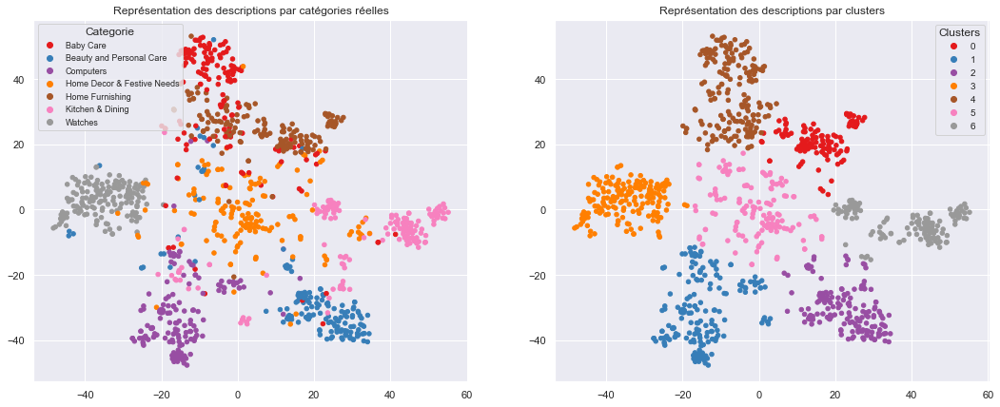

ARI :  0.6244


In [1263]:
# Execute clustering with optimal perplexity (27) for 'feat_pca_InceptionResNetV2' feature
ARI, X_tsne, labels_InceptionResNetV2 = ARI_fct(feat_pca_InceptionResNetV2, 27)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels_InceptionResNetV2, ARI)

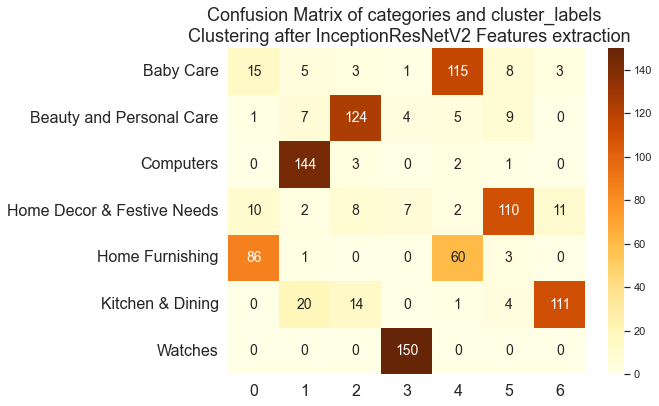

In [1264]:
# Display confusion matrix of InceptionResNetV2 clustering
conf_mat_CNN(true_labels = true_labels, 
             predicted_labels = labels_InceptionResNetV2, 
             model_name = 'InceptionResNetV2')

In [1265]:
# Calculate metrics and accuracy after InceptionResNetV2 clustering
dict_classification_InceptionResNetV2, data_metrics_InceptionResNetV2 = class_report(true_labels = true_labels,
                                                                                     predicted_labels = labels_InceptionResNetV2)

[[115   3   5   8  15   3   1]
 [  5 124   7   9   1   0   4]
 [  2   3 144   1   0   0   0]
 [  2   8   2 110  10  11   7]
 [ 60   0   1   3  86   0   0]
 [  1  14  20   4   0 111   0]
 [  0   0   0   0   0   0 150]]

                            precision    recall  f1-score   support

                 Baby Care      0.622     0.767     0.687       150
  Beauty and Personal Care      0.816     0.827     0.821       150
                 Computers      0.804     0.960     0.875       150
Home Decor & Festive Needs      0.815     0.733     0.772       150
           Home Furnishing      0.768     0.573     0.656       150
          Kitchen & Dining      0.888     0.740     0.807       150
                   Watches      0.926     1.000     0.962       150

                  accuracy                          0.800      1050
                 macro avg      0.805     0.800     0.797      1050
              weighted avg      0.805     0.800     0.797      1050



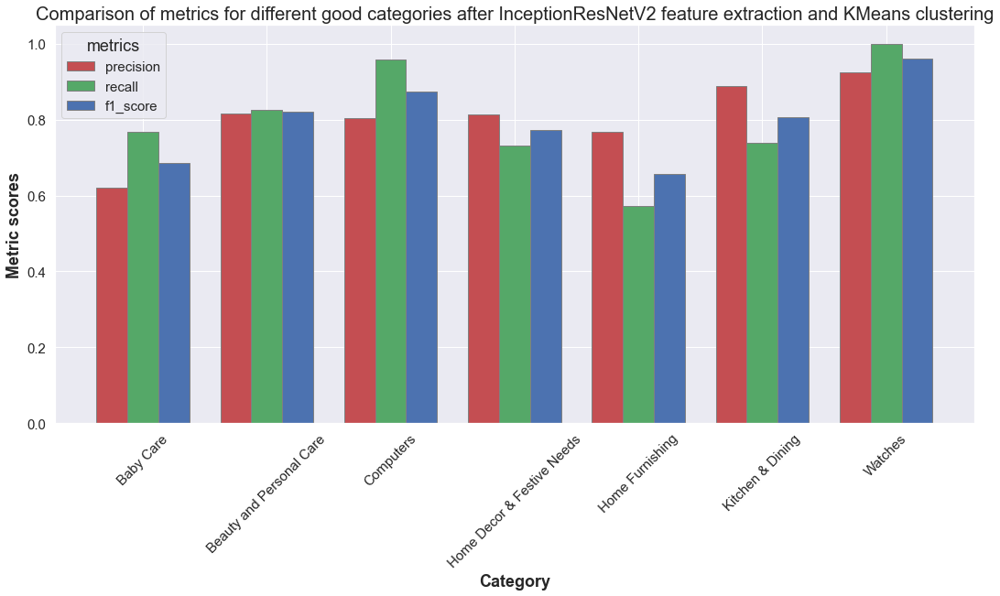

In [1266]:
# Display metrics as barplots
display_metrics_CNN(data_metrics_InceptionResNetV2, 'InceptionResNetV2')

### Transfer Learning with NASNetLarge

In [1274]:
from tensorflow.keras.applications import NASNetLarge
# load model
model_NASNetLarge = NASNetLarge()
# remove the output layer
model_NASNetLarge = Model(inputs = model_NASNetLarge.inputs, 
                          outputs = model_NASNetLarge.layers[-2].output)
# summarize the model
model_NASNetLarge.summary()

Model: "model_48"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_66 (InputLayer)          [(None, 331, 331, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 165, 165, 96  2592        ['input_66[0][0]']               
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 165, 165, 96  384         ['stem_conv1[0][0]']             
                                )                                                          

                                                                                                  
 separable_conv_1_pad_reduction  (None, 169, 169, 96  0          ['activation_1319[0][0]']        
 _right3_stem_1 (ZeroPadding2D)  )                                                                
                                                                                                  
 activation_1321 (Activation)   (None, 83, 83, 42)   0           ['reduction_add_1_stem_1[0][0]'] 
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 83, 83, 42)  168         ['separable_conv_1_reduction_righ
 right2_stem_1 (BatchNormalizat                                  t2_stem_1[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable

 add_72 (Add)                   (None, 83, 83, 42)   0           ['reduction_add_2_stem_1[0][0]', 
                                                                  'reduction_left4_stem_1[0][0]'] 
                                                                                                  
 reduction_add4_stem_1 (Add)    (None, 83, 83, 42)   0           ['separable_conv_2_bn_reduction_l
                                                                 eft4_stem_1[0][0]',              
                                                                  'reduction_right5_stem_1[0][0]']
                                                                                                  
 cropping2d (Cropping2D)        (None, 165, 165, 96  0           ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                                  
 reduction

 separable_conv_2_bn_reduction_  (None, 42, 42, 84)  336         ['separable_conv_2_reduction_righ
 right1_stem_2 (BatchNormalizat                                  t1_stem_2[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable_conv_1_pad_reduction  (None, 89, 89, 84)  0           ['activation_1328[0][0]']        
 _right2_stem_2 (ZeroPadding2D)                                                                   
                                                                                                  
 activation_1330 (Activation)   (None, 83, 83, 84)   0           ['adjust_bn_stem_2[0][0]']       
                                                                                                  
 reduction_add_1_stem_2 (Add)   (None, 42, 42, 84)   0           ['separable_conv_2_bn_reduction_l
          

                                                                                                  
 separable_conv_2_bn_reduction_  (None, 42, 42, 84)  336         ['separable_conv_2_reduction_left
 left4_stem_2 (BatchNormalizati                                  4_stem_2[0][0]']                 
 on)                                                                                              
                                                                                                  
 reduction_right5_stem_2 (MaxPo  (None, 42, 42, 84)  0           ['reduction_pad_1_stem_2[0][0]'] 
 oling2D)                                                                                         
                                                                                                  
 zero_padding2d_1 (ZeroPadding2  (None, 84, 84, 168)  0          ['adjust_relu_1_0[0][0]']        
 D)                                                                                               
          

 separable_conv_1_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_1_normal_left2_0
 t2_0 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 42, 42, 168)  672        ['separable_conv_1_normal_right2_
 ht2_0 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_1_normal_left5_0
 t5_0 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_1336 (Activation)   (None, 42, 42, 168)  0           ['separable_conv_1_bn_normal_left
          

 normal_concat_0 (Concatenate)  (None, 42, 42, 1008  0           ['adjust_bn_0[0][0]',            
                                )                                 'normal_add_1_0[0][0]',         
                                                                  'normal_add_2_0[0][0]',         
                                                                  'normal_add_3_0[0][0]',         
                                                                  'normal_add_4_0[0][0]',         
                                                                  'normal_add_5_0[0][0]']         
                                                                                                  
 activation_1345 (Activation)   (None, 42, 42, 336)  0           ['reduction_concat_stem_2[0][0]']
                                                                                                  
 activation_1346 (Activation)   (None, 42, 42, 1008  0           ['normal_concat_0[0][0]']        
          

                                                                                                  
 separable_conv_2_normal_left2_  (None, 42, 42, 168)  32424      ['activation_1352[0][0]']        
 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 42, 42, 168)  29736      ['activation_1354[0][0]']        
 _1 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 42, 42, 168)  29736      ['activation_1356[0][0]']        
 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable

                                                                                                  
 activation_1365 (Activation)   (None, 42, 42, 168)  0           ['adjust_bn_2[0][0]']            
                                                                                                  
 activation_1367 (Activation)   (None, 42, 42, 168)  0           ['normal_bn_1_2[0][0]']          
                                                                                                  
 separable_conv_1_normal_left1_  (None, 42, 42, 168)  32424      ['activation_1359[0][0]']        
 2 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right1  (None, 42, 42, 168)  29736      ['activation_1361[0][0]']        
 _2 (SeparableConv2D)                                                                             
          

 normal_right4_2 (AveragePoolin  (None, 42, 42, 168)  0          ['adjust_bn_2[0][0]']            
 g2D)                                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_2_normal_left5_2
 t5_2 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 normal_add_1_2 (Add)           (None, 42, 42, 168)  0           ['separable_conv_2_bn_normal_left
                                                                 1_2[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_2[0][0]']                     
          

                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 42, 42, 168)  672        ['separable_conv_1_normal_right2_
 ht2_3 (BatchNormalization)                                      3[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_1_normal_left5_3
 t5_3 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_1372 (Activation)   (None, 42, 42, 168)  0           ['separable_conv_1_bn_normal_left
                                                                 1_3[0][0]']                      
                                                                                                  
 activatio

                                                                  'normal_add_2_3[0][0]',         
                                                                  'normal_add_3_3[0][0]',         
                                                                  'normal_add_4_3[0][0]',         
                                                                  'normal_add_5_3[0][0]']         
                                                                                                  
 activation_1381 (Activation)   (None, 42, 42, 1008  0           ['normal_concat_2[0][0]']        
                                )                                                                 
                                                                                                  
 activation_1382 (Activation)   (None, 42, 42, 1008  0           ['normal_concat_3[0][0]']        
                                )                                                                 
          

 separable_conv_2_normal_left2_  (None, 42, 42, 168)  32424      ['activation_1388[0][0]']        
 4 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 42, 42, 168)  29736      ['activation_1390[0][0]']        
 _4 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 42, 42, 168)  29736      ['activation_1392[0][0]']        
 4 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_2_normal_left1_4
 t1_4 (Bat

 activation_1401 (Activation)   (None, 42, 42, 168)  0           ['adjust_bn_5[0][0]']            
                                                                                                  
 activation_1403 (Activation)   (None, 42, 42, 168)  0           ['normal_bn_1_5[0][0]']          
                                                                                                  
 separable_conv_1_normal_left1_  (None, 42, 42, 168)  32424      ['activation_1395[0][0]']        
 5 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right1  (None, 42, 42, 168)  29736      ['activation_1397[0][0]']        
 _5 (SeparableConv2D)                                                                             
                                                                                                  
 separable

 g2D)                                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_2_normal_left5_5
 t5_5 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 normal_add_1_5 (Add)           (None, 42, 42, 168)  0           ['separable_conv_2_bn_normal_left
                                                                 1_5[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_5[0][0]']                     
                                                                                                  
 normal_ad

 t1_reduce_6 (SeparableConv2D)                                                                    
                                                                                                  
 separable_conv_2_reduction_rig  (None, 21, 21, 336)  129360     ['activation_1410[0][0]']        
 ht1_reduce_6 (SeparableConv2D)                                                                   
                                                                                                  
 activation_1411 (Activation)   (None, 42, 42, 336)  0           ['adjust_bn_reduce_6[0][0]']     
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 21, 21, 336)  1344       ['separable_conv_2_reduction_left
 left1_reduce_6 (BatchNormaliza                                  1_reduce_6[0][0]']               
 tion)                                                                                            
          

                                )                                                                 
                                                                                                  
 reduction_add_2_reduce_6 (Add)  (None, 21, 21, 336)  0          ['reduction_left2_reduce_6[0][0]'
                                                                 , 'separable_conv_2_bn_reduction_
                                                                 right2_reduce_6[0][0]']          
                                                                                                  
 reduction_left3_reduce_6 (Aver  (None, 21, 21, 336)  0          ['reduction_pad_1_reduce_6[0][0]'
 agePooling2D)                                                   ]                                
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 21, 21, 336)  1344       ['separable_conv_2_reduction_righ
 right3_re

                                                                                                  
 separable_conv_1_normal_right1  (None, 21, 21, 336)  115920     ['activation_1420[0][0]']        
 _7 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left2_  (None, 21, 21, 336)  121296     ['activation_1422[0][0]']        
 7 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right2  (None, 21, 21, 336)  115920     ['activation_1424[0][0]']        
 _7 (SeparableConv2D)                                                                             
                                                                                                  
 separable

                                                                 1_7[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_7[0][0]']                     
                                                                                                  
 normal_add_2_7 (Add)           (None, 21, 21, 336)  0           ['separable_conv_2_bn_normal_left
                                                                 2_7[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_7[0][0]']                     
                                                                                                  
 normal_add_3_7 (Add)           (None, 21, 21, 336)  0           ['normal_left3_7[0][0]',         
          

 activation_1431 (Activation)   (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 1_8[0][0]']                      
                                                                                                  
 activation_1433 (Activation)   (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_8[0][0]']                     
                                                                                                  
 activation_1435 (Activation)   (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 2_8[0][0]']                      
                                                                                                  
 activation_1437 (Activation)   (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
          

                                                                                                  
 activation_1441 (Activation)   (None, 21, 21, 2016  0           ['normal_concat_8[0][0]']        
                                )                                                                 
                                                                                                  
 adjust_conv_projection_9 (Conv  (None, 21, 21, 336)  677376     ['activation_1440[0][0]']        
 2D)                                                                                              
                                                                                                  
 normal_conv_1_9 (Conv2D)       (None, 21, 21, 336)  677376      ['activation_1441[0][0]']        
                                                                                                  
 adjust_bn_9 (BatchNormalizatio  (None, 21, 21, 336)  1344       ['adjust_conv_projection_9[0][0]'
 n)       

 9 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left1_9
 t1_9 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_right1_
 ht1_9 (BatchNormalization)                                      9[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left2_9
 t2_9 (BatchNormalization)                                       [0][0]']                         
          

 separable_conv_1_normal_right1  (None, 21, 21, 336)  115920     ['activation_1456[0][0]']        
 _10 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 21, 21, 336)  121296     ['activation_1458[0][0]']        
 10 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right2  (None, 21, 21, 336)  115920     ['activation_1460[0][0]']        
 _10 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left5_  (None, 21, 21, 336)  115920     ['activation_1462[0][0]']        
 10 (Separ

                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_10[0][0]']                    
                                                                                                  
 normal_add_2_10 (Add)          (None, 21, 21, 336)  0           ['separable_conv_2_bn_normal_left
                                                                 2_10[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_10[0][0]']                    
                                                                                                  
 normal_add_3_10 (Add)          (None, 21, 21, 336)  0           ['normal_left3_10[0][0]',        
                                                                  'adjust_bn_10[0][0]']           
          

                                                                 1_11[0][0]']                     
                                                                                                  
 activation_1469 (Activation)   (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_11[0][0]']                    
                                                                                                  
 activation_1471 (Activation)   (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 2_11[0][0]']                     
                                                                                                  
 activation_1473 (Activation)   (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t2_11[0][0]']                    
          

 activation_1477 (Activation)   (None, 21, 21, 2016  0           ['normal_concat_11[0][0]']       
                                )                                                                 
                                                                                                  
 adjust_conv_projection_12 (Con  (None, 21, 21, 336)  677376     ['activation_1476[0][0]']        
 v2D)                                                                                             
                                                                                                  
 normal_conv_1_12 (Conv2D)      (None, 21, 21, 336)  677376      ['activation_1477[0][0]']        
                                                                                                  
 adjust_bn_12 (BatchNormalizati  (None, 21, 21, 336)  1344       ['adjust_conv_projection_12[0][0]
 on)                                                             ']                               
          

                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left1_1
 t1_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_right1_
 ht1_12 (BatchNormalization)                                     12[0][0]']                       
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left2_1
 t2_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable

 separable_conv_1_reduction_lef  (None, 11, 11, 672)  468384     ['separable_conv_1_pad_reduction_
 t1_reduce_12 (SeparableConv2D)                                  left1_reduce_12[0][0]']          
                                                                                                  
 separable_conv_1_reduction_rig  (None, 11, 11, 672)  484512     ['separable_conv_1_pad_reduction_
 ht1_reduce_12 (SeparableConv2D                                  right1_reduce_12[0][0]']         
 )                                                                                                
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 11, 11, 672)  2688       ['separable_conv_1_reduction_left
 left1_reduce_12 (BatchNormaliz                                  1_reduce_12[0][0]']              
 ation)                                                                                           
          

 oPadding2D)                                                     ]                                
                                                                                                  
 separable_conv_2_reduction_rig  (None, 11, 11, 672)  484512     ['activation_1495[0][0]']        
 ht2_reduce_12 (SeparableConv2D                                                                   
 )                                                                                                
                                                                                                  
 activation_1497 (Activation)   (None, 11, 11, 672)  0           ['separable_conv_1_bn_reduction_r
                                                                 ight3_reduce_12[0][0]']          
                                                                                                  
 activation_1499 (Activation)   (None, 11, 11, 672)  0           ['separable_conv_1_bn_reduction_l
          

 ooling2D)                      )                                                                 
                                                                                                  
 adjust_conv_1_13 (Conv2D)      (None, 11, 11, 336)  677376      ['adjust_avg_pool_1_13[0][0]']   
                                                                                                  
 adjust_conv_2_13 (Conv2D)      (None, 11, 11, 336)  677376      ['adjust_avg_pool_2_13[0][0]']   
                                                                                                  
 activation_1500 (Activation)   (None, 11, 11, 2688  0           ['reduction_concat_reduce_12[0][0
                                )                                ]']                              
                                                                                                  
 concatenate_5 (Concatenate)    (None, 11, 11, 672)  0           ['adjust_conv_1_13[0][0]',       
          

                                                                                                  
 separable_conv_2_normal_right2  (None, 11, 11, 672)  457632     ['activation_1508[0][0]']        
 _13 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_2_normal_left5_  (None, 11, 11, 672)  457632     ['activation_1510[0][0]']        
 13 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_left1_1
 t1_13 (BatchNormalization)                                      3[0][0]']                        
                                                                                                  
 separable

 activation_1521 (Activation)   (None, 11, 11, 672)  0           ['normal_bn_1_14[0][0]']         
                                                                                                  
 separable_conv_1_normal_left1_  (None, 11, 11, 672)  468384     ['activation_1513[0][0]']        
 14 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right1  (None, 11, 11, 672)  457632     ['activation_1515[0][0]']        
 _14 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 11, 11, 672)  468384     ['activation_1517[0][0]']        
 14 (SeparableConv2D)                                                                             
          

 separable_conv_2_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_left5_1
 t5_14 (BatchNormalization)                                      4[0][0]']                        
                                                                                                  
 normal_add_1_14 (Add)          (None, 11, 11, 672)  0           ['separable_conv_2_bn_normal_left
                                                                 1_14[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_14[0][0]']                    
                                                                                                  
 normal_add_2_14 (Add)          (None, 11, 11, 672)  0           ['separable_conv_2_bn_normal_left
                                                                 2_14[0][0]',                     
          

                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_1_normal_left5_1
 t5_15 (BatchNormalization)                                      5[0][0]']                        
                                                                                                  
 activation_1526 (Activation)   (None, 11, 11, 672)  0           ['separable_conv_1_bn_normal_left
                                                                 1_15[0][0]']                     
                                                                                                  
 activation_1528 (Activation)   (None, 11, 11, 672)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_15[0][0]']                    
                                                                                                  
 activatio

                                                                  'normal_add_5_15[0][0]']        
                                                                                                  
 activation_1535 (Activation)   (None, 11, 11, 4032  0           ['normal_concat_14[0][0]']       
                                )                                                                 
                                                                                                  
 activation_1536 (Activation)   (None, 11, 11, 4032  0           ['normal_concat_15[0][0]']       
                                )                                                                 
                                                                                                  
 adjust_conv_projection_16 (Con  (None, 11, 11, 672)  2709504    ['activation_1535[0][0]']        
 v2D)                                                                                             
          

 separable_conv_2_normal_right2  (None, 11, 11, 672)  457632     ['activation_1544[0][0]']        
 _16 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_2_normal_left5_  (None, 11, 11, 672)  457632     ['activation_1546[0][0]']        
 16 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_left1_1
 t1_16 (BatchNormalization)                                      6[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_right1_
 ht1_16 (B

                                                                                                  
 separable_conv_1_normal_left1_  (None, 11, 11, 672)  468384     ['activation_1549[0][0]']        
 17 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right1  (None, 11, 11, 672)  457632     ['activation_1551[0][0]']        
 _17 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 11, 11, 672)  468384     ['activation_1553[0][0]']        
 17 (SeparableConv2D)                                                                             
                                                                                                  
 separable

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [1275]:
# Extract features with NASNetLarge model
feat_NASNetLarge = extract_feature_reshape(file = photo,
                                           model = model_NASNetLarge,
                                           target_size = 331,
                                           final_vectors = 4032)

# Reduce dimensions of the features before tSNE reduction
feat_pca_NASNetLarge = pca_reduction(n_components = 0.99,
                                     random_state = 22,
                                     feat = feat_NASNetLarge)

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


feat_shape:  (1050, 4032)


C:\Users\33624\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass copy=22 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


Components before PCA: (1050, 4032)
Components after PCA: (1050, 712)


In [1276]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca_NASNetLarge' feature
ARI_NASNetLarge, opt_perplexity = ARI_calculation(feat_pca_NASNetLarge)

ARI :  0.1192 time :  9.0
ARI :  0.2577 time :  9.0
ARI :  0.3463 time :  9.0
ARI :  0.3958 time :  11.0
ARI :  0.4495 time :  9.0
ARI :  0.5308 time :  11.0
ARI :  0.5127 time :  10.0
ARI :  0.5061 time :  10.0
ARI :  0.522 time :  9.0
ARI :  0.5287 time :  9.0
ARI :  0.5171 time :  9.0
ARI :  0.5599 time :  10.0
ARI :  0.5413 time :  10.0
ARI :  0.5112 time :  10.0
ARI :  0.5268 time :  9.0
ARI :  0.524 time :  9.0
ARI :  0.5153 time :  10.0
ARI :  0.5293 time :  9.0
ARI :  0.4936 time :  10.0
ARI :  0.5788 time :  9.0
ARI :  0.5506 time :  9.0
ARI :  0.5117 time :  10.0
ARI :  0.5481 time :  10.0
ARI :  0.5414 time :  10.0
ARI :  0.5825 time :  10.0
ARI :  0.5404 time :  10.0
ARI :  0.4964 time :  10.0
ARI :  0.6055 time :  10.0
ARI :  0.5132 time :  10.0
ARI :  0.5433 time :  10.0
ARI :  0.5865 time :  10.0
ARI :  0.4902 time :  10.0
ARI :  0.5889 time :  11.0
ARI :  0.586 time :  11.0
ARI :  0.5595 time :  11.0
ARI :  0.5654 time :  11.0
ARI :  0.6012 time :  11.0
ARI :  0.6087 ti

ARI :  0.6087 time :  11.0


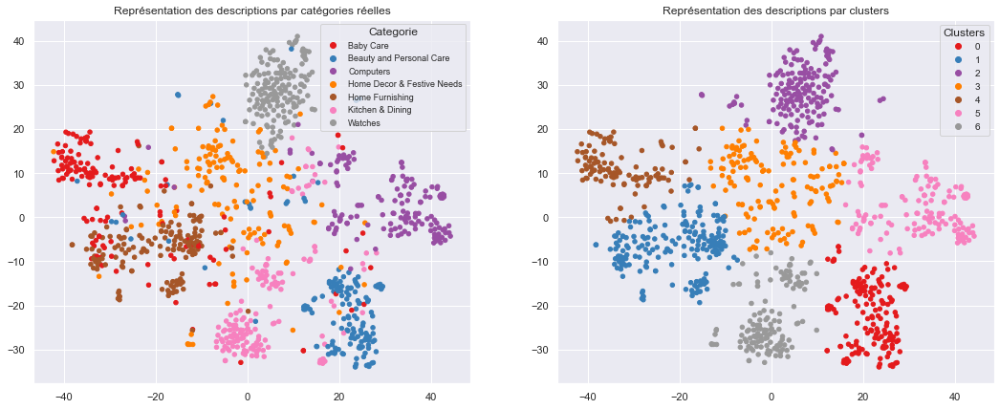

ARI :  0.6087


In [1278]:
# Execute clustering with optimal perplexity (38) for 'feat_pca_NASNetLarge' feature
ARI, X_tsne, labels_NASNetLarge = ARI_fct(feat_pca_NASNetLarge, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels_NASNetLarge, ARI)

[[ 93   6   3   7  34   5   2]
 [  1 123   0  10   7   1   8]
 [  1   1 137   7   3   0   1]
 [  9   3   2 100  11  16   9]
 [  3   0   0   6 138   3   0]
 [  0  21   4  13   0 109   3]
 [  0   0   0   8   0   0 142]]

                            precision    recall  f1-score   support

                 Baby Care      0.869     0.620     0.724       150
  Beauty and Personal Care      0.799     0.820     0.809       150
                 Computers      0.938     0.913     0.926       150
Home Decor & Festive Needs      0.662     0.667     0.664       150
           Home Furnishing      0.715     0.920     0.805       150
          Kitchen & Dining      0.813     0.727     0.768       150
                   Watches      0.861     0.947     0.902       150

                  accuracy                          0.802      1050
                 macro avg      0.808     0.802     0.800      1050
              weighted avg      0.808     0.802     0.800      1050



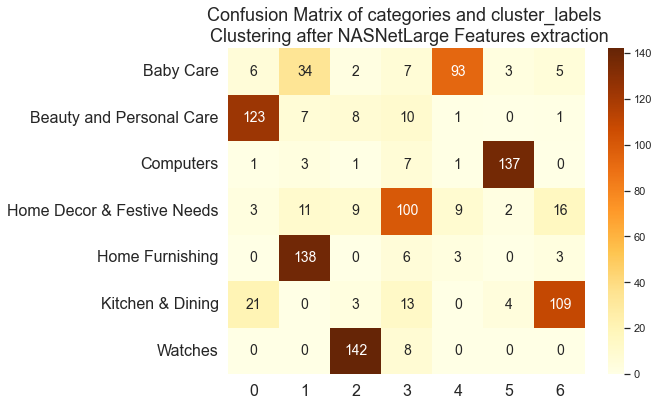

In [1279]:
# Display confusion matrix of NASNetLarge clustering
conf_mat_CNN(true_labels = true_labels, 
             predicted_labels = labels_NASNetLarge, 
             model_name = 'NASNetLarge')

# Calculate metrics and accuracy after NASNetLarge clustering
dict_classification_NASNetLarge, data_metrics_NASNetLarge = class_report(true_labels = true_labels,
                                                                         predicted_labels = labels_NASNetLarge)

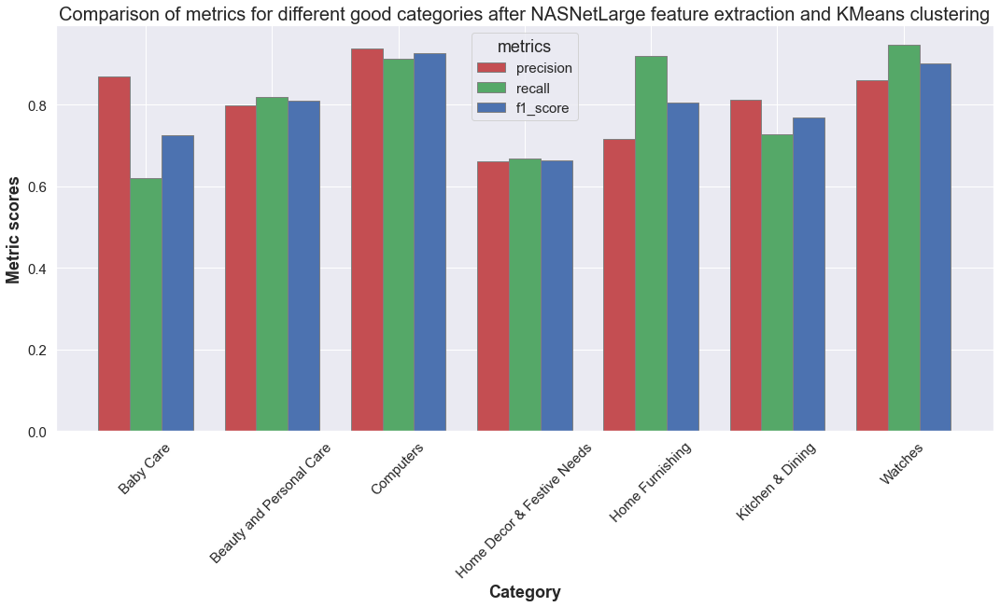

In [1280]:
# Display metrics as barplots
display_metrics_CNN(data_metrics_NASNetLarge, 'NASNetLarge')

### Transfer Learning with NASNetMobile

In [1281]:
from tensorflow.keras.applications import NASNetMobile
# load model
model_NASNetMobile = NASNetMobile()
# remove the output layer
model_NASNetMobile = Model(inputs = model_NASNetMobile.inputs, 
                           outputs = model_NASNetMobile.layers[-2].output)
# summarize the model
model_NASNetMobile.summary()

Model: "model_49"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_67 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 111, 111, 32  864         ['input_67[0][0]']               
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 111, 111, 32  128         ['stem_conv1[0][0]']             
                                )                                                          

                                                                                                  
 separable_conv_1_pad_reduction  (None, 115, 115, 32  0          ['activation_1579[0][0]']        
 _right3_stem_1 (ZeroPadding2D)  )                                                                
                                                                                                  
 activation_1581 (Activation)   (None, 56, 56, 11)   0           ['reduction_add_1_stem_1[0][0]'] 
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 56, 56, 11)  44          ['separable_conv_1_reduction_righ
 right2_stem_1 (BatchNormalizat                                  t2_stem_1[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable

 add_76 (Add)                   (None, 56, 56, 11)   0           ['reduction_add_2_stem_1[0][0]', 
                                                                  'reduction_left4_stem_1[0][0]'] 
                                                                                                  
 reduction_add4_stem_1 (Add)    (None, 56, 56, 11)   0           ['separable_conv_2_bn_reduction_l
                                                                 eft4_stem_1[0][0]',              
                                                                  'reduction_right5_stem_1[0][0]']
                                                                                                  
 cropping2d_4 (Cropping2D)      (None, 111, 111, 32  0           ['zero_padding2d_4[0][0]']       
                                )                                                                 
                                                                                                  
 reduction

 separable_conv_2_bn_reduction_  (None, 28, 28, 22)  88          ['separable_conv_2_reduction_righ
 right1_stem_2 (BatchNormalizat                                  t1_stem_2[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable_conv_1_pad_reduction  (None, 61, 61, 22)  0           ['activation_1588[0][0]']        
 _right2_stem_2 (ZeroPadding2D)                                                                   
                                                                                                  
 activation_1590 (Activation)   (None, 56, 56, 22)   0           ['adjust_bn_stem_2[0][0]']       
                                                                                                  
 reduction_add_1_stem_2 (Add)   (None, 28, 28, 22)   0           ['separable_conv_2_bn_reduction_l
          

                                                                                                  
 separable_conv_2_bn_reduction_  (None, 28, 28, 22)  88          ['separable_conv_2_reduction_left
 left4_stem_2 (BatchNormalizati                                  4_stem_2[0][0]']                 
 on)                                                                                              
                                                                                                  
 reduction_right5_stem_2 (MaxPo  (None, 28, 28, 22)  0           ['reduction_pad_1_stem_2[0][0]'] 
 oling2D)                                                                                         
                                                                                                  
 zero_padding2d_5 (ZeroPadding2  (None, 57, 57, 44)  0           ['adjust_relu_1_0[0][0]']        
 D)                                                                                               
          

 separable_conv_1_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_1_normal_left2_0
 t2_0 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 28, 28, 44)  176         ['separable_conv_1_normal_right2_
 ht2_0 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_1_normal_left5_0
 t5_0 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_1596 (Activation)   (None, 28, 28, 44)   0           ['separable_conv_1_bn_normal_left
          

 normal_concat_0 (Concatenate)  (None, 28, 28, 264)  0           ['adjust_bn_0[0][0]',            
                                                                  'normal_add_1_0[0][0]',         
                                                                  'normal_add_2_0[0][0]',         
                                                                  'normal_add_3_0[0][0]',         
                                                                  'normal_add_4_0[0][0]',         
                                                                  'normal_add_5_0[0][0]']         
                                                                                                  
 activation_1605 (Activation)   (None, 28, 28, 88)   0           ['reduction_concat_stem_2[0][0]']
                                                                                                  
 activation_1606 (Activation)   (None, 28, 28, 264)  0           ['normal_concat_0[0][0]']        
          

 separable_conv_2_normal_left2_  (None, 28, 28, 44)  3036        ['activation_1612[0][0]']        
 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 28, 28, 44)  2332        ['activation_1614[0][0]']        
 _1 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 28, 28, 44)  2332        ['activation_1616[0][0]']        
 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_2_normal_left1_1
 t1_1 (Bat

 activation_1627 (Activation)   (None, 28, 28, 44)   0           ['normal_bn_1_2[0][0]']          
                                                                                                  
 separable_conv_1_normal_left1_  (None, 28, 28, 44)  3036        ['activation_1619[0][0]']        
 2 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right1  (None, 28, 28, 44)  2332        ['activation_1621[0][0]']        
 _2 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left2_  (None, 28, 28, 44)  3036        ['activation_1623[0][0]']        
 2 (SeparableConv2D)                                                                              
          

 separable_conv_2_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_2_normal_left5_2
 t5_2 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 normal_add_1_2 (Add)           (None, 28, 28, 44)   0           ['separable_conv_2_bn_normal_left
                                                                 1_2[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_2[0][0]']                     
                                                                                                  
 normal_add_2_2 (Add)           (None, 28, 28, 44)   0           ['separable_conv_2_bn_normal_left
                                                                 2_2[0][0]',                      
          

 t5_3 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_1632 (Activation)   (None, 28, 28, 44)   0           ['separable_conv_1_bn_normal_left
                                                                 1_3[0][0]']                      
                                                                                                  
 activation_1634 (Activation)   (None, 28, 28, 44)   0           ['separable_conv_1_bn_normal_righ
                                                                 t1_3[0][0]']                     
                                                                                                  
 activation_1636 (Activation)   (None, 28, 28, 44)   0           ['separable_conv_1_bn_normal_left
                                                                 2_3[0][0]']                      
          

 activation_1642 (Activation)   (None, 28, 28, 264)  0           ['normal_concat_3[0][0]']        
                                                                                                  
 activation_1641 (Activation)   (None, 28, 28, 264)  0           ['normal_concat_2[0][0]']        
                                                                                                  
 reduction_conv_1_reduce_4 (Con  (None, 28, 28, 88)  23232       ['activation_1642[0][0]']        
 v2D)                                                                                             
                                                                                                  
 adjust_conv_projection_reduce_  (None, 28, 28, 88)  23232       ['activation_1641[0][0]']        
 4 (Conv2D)                                                                                       
                                                                                                  
 reduction

                                                                 ]                                
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 14, 14, 88)  352         ['separable_conv_1_reduction_righ
 right2_reduce_4 (BatchNormaliz                                  t2_reduce_4[0][0]']              
 ation)                                                                                           
                                                                                                  
 separable_conv_1_reduction_rig  (None, 14, 14, 88)  9944        ['separable_conv_1_pad_reduction_
 ht3_reduce_4 (SeparableConv2D)                                  right3_reduce_4[0][0]']          
                                                                                                  
 separable_conv_1_reduction_lef  (None, 14, 14, 88)  8536        ['activation_1651[0][0]']        
 t4_reduce

                                                                 eft4_reduce_4[0][0]',            
                                                                  'reduction_right5_reduce_4[0][0]
                                                                 ']                               
                                                                                                  
 cropping2d_6 (Cropping2D)      (None, 28, 28, 264)  0           ['zero_padding2d_6[0][0]']       
                                                                                                  
 reduction_concat_reduce_4 (Con  (None, 14, 14, 352)  0          ['reduction_add_2_reduce_4[0][0]'
 catenate)                                                       , 'reduction_add3_reduce_4[0][0]'
                                                                 , 'add_78[0][0]',                
                                                                  'reduction_add4_reduce_4[0][0]']
          

                                                                                                  
 activation_1661 (Activation)   (None, 14, 14, 88)   0           ['separable_conv_1_bn_normal_righ
                                                                 t2_5[0][0]']                     
                                                                                                  
 activation_1663 (Activation)   (None, 14, 14, 88)   0           ['separable_conv_1_bn_normal_left
                                                                 5_5[0][0]']                      
                                                                                                  
 separable_conv_2_normal_left1_  (None, 14, 14, 88)  9944        ['activation_1655[0][0]']        
 5 (SeparableConv2D)                                                                              
                                                                                                  
 separable

 adjust_bn_6 (BatchNormalizatio  (None, 14, 14, 88)  352         ['adjust_conv_projection_6[0][0]'
 n)                                                              ]                                
                                                                                                  
 normal_bn_1_6 (BatchNormalizat  (None, 14, 14, 88)  352         ['normal_conv_1_6[0][0]']        
 ion)                                                                                             
                                                                                                  
 activation_1666 (Activation)   (None, 14, 14, 88)   0           ['normal_bn_1_6[0][0]']          
                                                                                                  
 activation_1668 (Activation)   (None, 14, 14, 88)   0           ['adjust_bn_6[0][0]']            
                                                                                                  
 activatio

 t2_6 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 14, 14, 88)  352         ['separable_conv_2_normal_right2_
 ht2_6 (BatchNormalization)                                      6[0][0]']                        
                                                                                                  
 normal_left3_6 (AveragePooling  (None, 14, 14, 88)  0           ['normal_bn_1_6[0][0]']          
 2D)                                                                                              
                                                                                                  
 normal_left4_6 (AveragePooling  (None, 14, 14, 88)  0           ['adjust_bn_6[0][0]']            
 2D)                                                                                              
          

                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 14, 14, 88)  352         ['separable_conv_1_normal_left1_7
 t1_7 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 14, 14, 88)  352         ['separable_conv_1_normal_right1_
 ht1_7 (BatchNormalization)                                      7[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 14, 14, 88)  352         ['separable_conv_1_normal_left2_7
 t2_7 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable

 normal_add_4_7 (Add)           (None, 14, 14, 88)   0           ['normal_left4_7[0][0]',         
                                                                  'normal_right4_7[0][0]']        
                                                                                                  
 normal_add_5_7 (Add)           (None, 14, 14, 88)   0           ['separable_conv_2_bn_normal_left
                                                                 5_7[0][0]',                      
                                                                  'normal_bn_1_7[0][0]']          
                                                                                                  
 normal_concat_7 (Concatenate)  (None, 14, 14, 528)  0           ['adjust_bn_7[0][0]',            
                                                                  'normal_add_1_7[0][0]',         
                                                                  'normal_add_2_7[0][0]',         
          

                                                                                                  
 separable_conv_2_normal_left1_  (None, 14, 14, 88)  9944        ['activation_1691[0][0]']        
 8 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right1  (None, 14, 14, 88)  8536        ['activation_1693[0][0]']        
 _8 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left2_  (None, 14, 14, 88)  9944        ['activation_1695[0][0]']        
 8 (SeparableConv2D)                                                                              
                                                                                                  
 separable

 activation_1702 (Activation)   (None, 14, 14, 176)  0           ['reduction_bn_1_reduce_8[0][0]']
                                                                                                  
 activation_1704 (Activation)   (None, 14, 14, 176)  0           ['adjust_bn_reduce_8[0][0]']     
                                                                                                  
 separable_conv_1_pad_reduction  (None, 17, 17, 176)  0          ['activation_1702[0][0]']        
 _left1_reduce_8 (ZeroPadding2D                                                                   
 )                                                                                                
                                                                                                  
 separable_conv_1_pad_reduction  (None, 19, 19, 176)  0          ['activation_1704[0][0]']        
 _right1_reduce_8 (ZeroPadding2                                                                   
 D)       

 right3_reduce_8 (BatchNormaliz                                  t3_reduce_8[0][0]']              
 ation)                                                                                           
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 7, 7, 176)   704         ['separable_conv_1_reduction_left
 left4_reduce_8 (BatchNormaliza                                  4_reduce_8[0][0]']               
 tion)                                                                                            
                                                                                                  
 reduction_pad_1_reduce_8 (Zero  (None, 15, 15, 176)  0          ['reduction_bn_1_reduce_8[0][0]']
 Padding2D)                                                                                       
                                                                                                  
 separable

                                                                                                  
 adjust_conv_1_9 (Conv2D)       (None, 7, 7, 88)     46464       ['adjust_avg_pool_1_9[0][0]']    
                                                                                                  
 adjust_conv_2_9 (Conv2D)       (None, 7, 7, 88)     46464       ['adjust_avg_pool_2_9[0][0]']    
                                                                                                  
 activation_1712 (Activation)   (None, 7, 7, 704)    0           ['reduction_concat_reduce_8[0][0]
                                                                 ']                               
                                                                                                  
 concatenate_9 (Concatenate)    (None, 7, 7, 176)    0           ['adjust_conv_1_9[0][0]',        
                                                                  'adjust_conv_2_9[0][0]']        
          

 separable_conv_2_normal_right2  (None, 7, 7, 176)   32560       ['activation_1720[0][0]']        
 _9 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 7, 7, 176)   32560       ['activation_1722[0][0]']        
 9 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 7, 7, 176)   704         ['separable_conv_2_normal_left1_9
 t1_9 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 7, 7, 176)   704         ['separable_conv_2_normal_right1_
 ht1_9 (Ba

 separable_conv_1_normal_left1_  (None, 7, 7, 176)   35376       ['activation_1725[0][0]']        
 10 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right1  (None, 7, 7, 176)   32560       ['activation_1727[0][0]']        
 _10 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 7, 7, 176)   35376       ['activation_1729[0][0]']        
 10 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right2  (None, 7, 7, 176)   32560       ['activation_1731[0][0]']        
 _10 (Sepa

                                                                                                  
 normal_add_1_10 (Add)          (None, 7, 7, 176)    0           ['separable_conv_2_bn_normal_left
                                                                 1_10[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_10[0][0]']                    
                                                                                                  
 normal_add_2_10 (Add)          (None, 7, 7, 176)    0           ['separable_conv_2_bn_normal_left
                                                                 2_10[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_10[0][0]']                    
          

 activation_1738 (Activation)   (None, 7, 7, 176)    0           ['separable_conv_1_bn_normal_left
                                                                 1_11[0][0]']                     
                                                                                                  
 activation_1740 (Activation)   (None, 7, 7, 176)    0           ['separable_conv_1_bn_normal_righ
                                                                 t1_11[0][0]']                    
                                                                                                  
 activation_1742 (Activation)   (None, 7, 7, 176)    0           ['separable_conv_1_bn_normal_left
                                                                 2_11[0][0]']                     
                                                                                                  
 activation_1744 (Activation)   (None, 7, 7, 176)    0           ['separable_conv_1_bn_normal_righ
          

 activation_1748 (Activation)   (None, 7, 7, 1056)   0           ['normal_concat_11[0][0]']       
                                                                                                  
 adjust_conv_projection_12 (Con  (None, 7, 7, 176)   185856      ['activation_1747[0][0]']        
 v2D)                                                                                             
                                                                                                  
 normal_conv_1_12 (Conv2D)      (None, 7, 7, 176)    185856      ['activation_1748[0][0]']        
                                                                                                  
 adjust_bn_12 (BatchNormalizati  (None, 7, 7, 176)   704         ['adjust_conv_projection_12[0][0]
 on)                                                             ']                               
                                                                                                  
 normal_bn

 separable_conv_2_bn_normal_lef  (None, 7, 7, 176)   704         ['separable_conv_2_normal_left1_1
 t1_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 7, 7, 176)   704         ['separable_conv_2_normal_right1_
 ht1_12 (BatchNormalization)                                     12[0][0]']                       
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 7, 7, 176)   704         ['separable_conv_2_normal_left2_1
 t2_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 7, 7, 176)   704         ['separable_conv_2_normal_right2_
 ht2_12 (B

In [1282]:
# Extract features with NASNetMobile model
feat_NASNetMobile = extract_feature_reshape(file = photo,
                                            model = model_NASNetMobile,
                                            target_size = 224,
                                            final_vectors = 1056)

# Reduce dimensions of the features before tSNE reduction
feat_pca_NASNetMobile = pca_reduction(n_components = 0.99,
                                      random_state = 22,
                                      feat = feat_NASNetMobile)

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


feat_shape:  (1050, 1056)
Components before PCA: (1050, 1056)
Components after PCA: (1050, 539)


C:\Users\33624\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass copy=22 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


In [1283]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca_NASNetMobile' feature
ARI_NASNetMobile, opt_perplexity = ARI_calculation(feat_pca_NASNetMobile)

ARI :  0.0907 time :  7.0
ARI :  0.2546 time :  7.0
ARI :  0.3292 time :  7.0
ARI :  0.408 time :  7.0
ARI :  0.4713 time :  8.0
ARI :  0.4933 time :  8.0
ARI :  0.4679 time :  8.0
ARI :  0.477 time :  8.0
ARI :  0.5402 time :  8.0
ARI :  0.5361 time :  9.0
ARI :  0.4953 time :  8.0
ARI :  0.4987 time :  9.0
ARI :  0.5178 time :  8.0
ARI :  0.5108 time :  9.0
ARI :  0.5357 time :  9.0
ARI :  0.5346 time :  9.0
ARI :  0.5218 time :  9.0
ARI :  0.5269 time :  9.0
ARI :  0.5491 time :  9.0
ARI :  0.5222 time :  9.0
ARI :  0.5184 time :  9.0
ARI :  0.5519 time :  9.0
ARI :  0.526 time :  10.0
ARI :  0.5105 time :  9.0
ARI :  0.557 time :  9.0
ARI :  0.4802 time :  10.0
ARI :  0.5646 time :  11.0
ARI :  0.5142 time :  11.0
ARI :  0.5282 time :  10.0
ARI :  0.5189 time :  10.0
ARI :  0.5382 time :  10.0
ARI :  0.482 time :  10.0
ARI :  0.5054 time :  10.0
ARI :  0.5613 time :  10.0
ARI :  0.5148 time :  10.0
ARI :  0.5509 time :  11.0
ARI :  0.5661 time :  11.0
ARI :  0.5513 time :  11.0
ARI

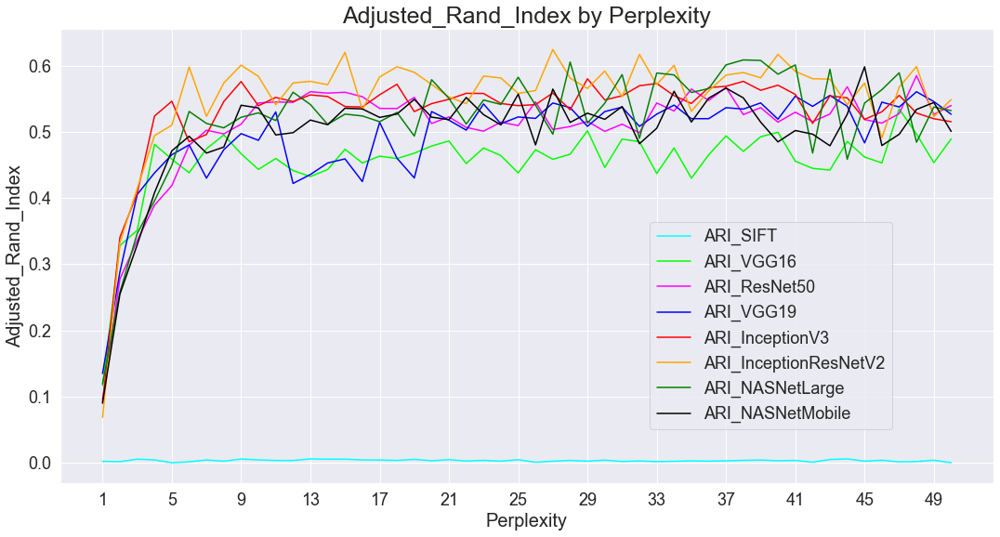

In [1301]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_SIFT[1:51]
y2 = ARI_VGG16
y3 = ARI_ResNet50
y4 = ARI_VGG19
y5 = ARI_InceptionV3
y6 = ARI_InceptionResNetV2
y7 = ARI_NASNetLarge
y8 = ARI_NASNetMobile

# Plot the different metrics
ax.plot(x, y1, color = 'cyan', label = 'ARI_SIFT')
ax.plot(x, y2, color = 'lime', label = 'ARI_VGG16')
ax.plot(x, y3, color = 'fuchsia', label = 'ARI_ResNet50')
ax.plot(x, y4, color = 'blue', label = 'ARI_VGG19')
ax.plot(x, y5, color = 'red', label = 'ARI_InceptionV3')
ax.plot(x, y6, color = 'orange', label = 'ARI_InceptionResNetV2')
ax.plot(x, y7, color = 'green', label = 'ARI_NASNetLarge')
ax.plot(x, y8, color = 'black', label = 'ARI_NASNetMobile')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 4.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 18, loc = 'lower right', bbox_to_anchor=(0.9, 0.1))

plt.show()

ARI :  0.5983 time :  11.0


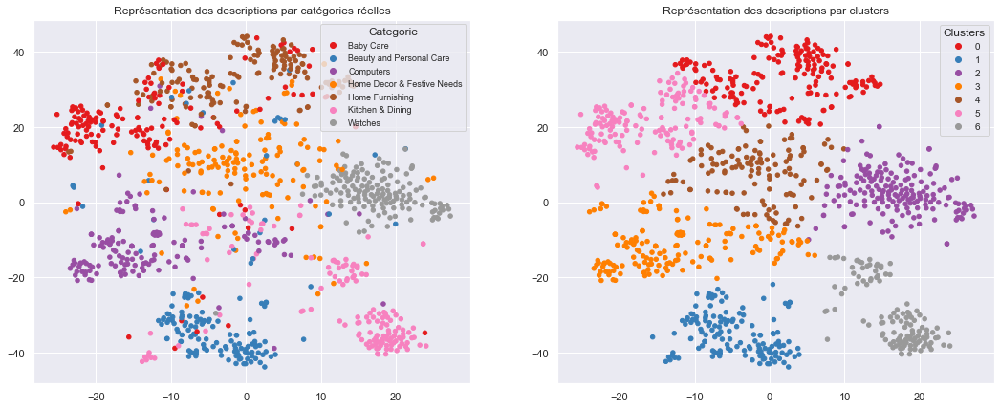

ARI :  0.5983


In [1302]:
# Execute clustering with optimal perplexity (45) for 'feat_pca_NASNetMobile' feature
ARI, X_tsne, labels_NASNetMobile = ARI_fct(feat_pca_NASNetMobile, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels_NASNetMobile, ARI)

[[107   6   3   5  25   1   3]
 [  7 119   7   4   7   2   4]
 [  4   2 134   5   0   1   4]
 [  8   3   7  98  15   6  13]
 [ 24   0   0   3 123   0   0]
 [  0  12  15   9   0 108   6]
 [  0   1   0   0   0   0 149]]

                            precision    recall  f1-score   support

                 Baby Care      0.713     0.713     0.713       150
  Beauty and Personal Care      0.832     0.793     0.812       150
                 Computers      0.807     0.893     0.848       150
Home Decor & Festive Needs      0.790     0.653     0.715       150
           Home Furnishing      0.724     0.820     0.769       150
          Kitchen & Dining      0.915     0.720     0.806       150
                   Watches      0.832     0.993     0.906       150

                  accuracy                          0.798      1050
                 macro avg      0.802     0.798     0.796      1050
              weighted avg      0.802     0.798     0.796      1050



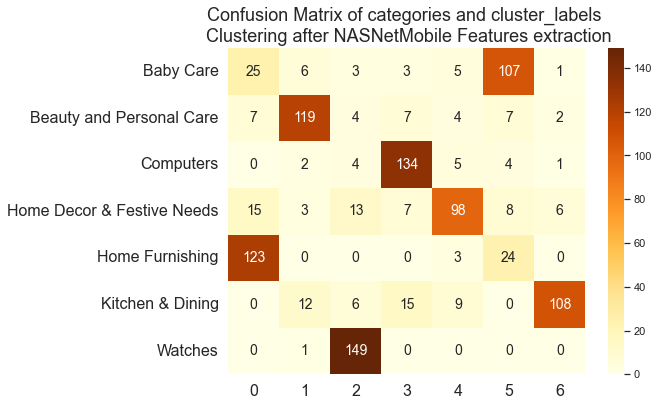

In [1303]:
# Display confusion matrix of NASNetMobile clustering
conf_mat_CNN(true_labels = true_labels, 
             predicted_labels = labels_NASNetMobile, 
             model_name = 'NASNetMobile')

# Calculate metrics and accuracy after NASNetMobile clustering
dict_classification_NASNetMobile, data_metrics_NASNetMobile = class_report(true_labels = true_labels,
                                                                           predicted_labels = labels_NASNetMobile)

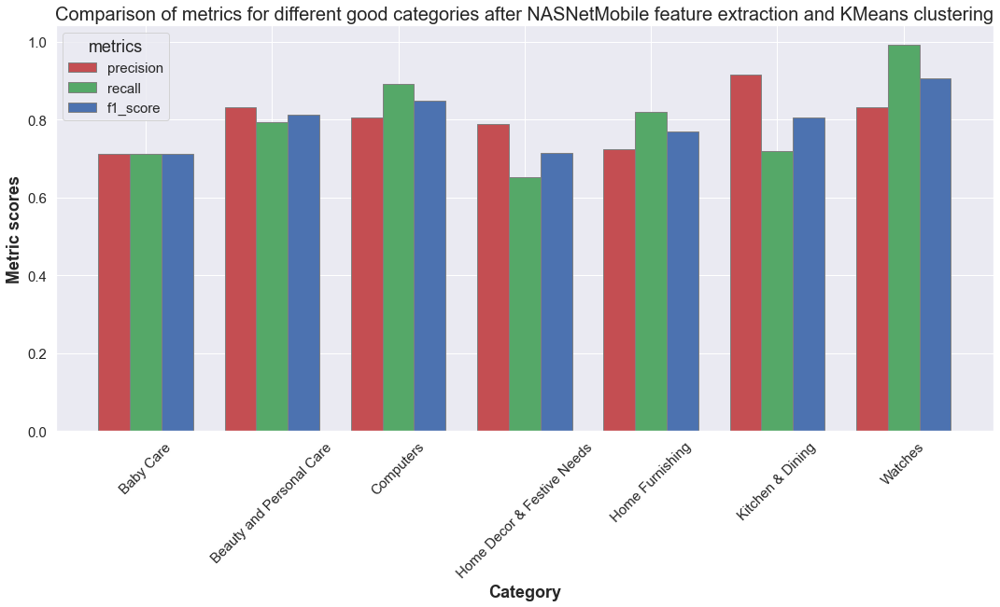

In [1304]:
# Display metrics as barplots
display_metrics_CNN(data_metrics_NASNetMobile, 'NASNetMobile')

# Image Classification

In [106]:
from sklearn.model_selection import train_test_split

# deep learning libraries
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image

In [107]:
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
import numpy as np
import argparse
import cv2

## Image classification - training on the whole dataset

In [108]:
# Create dataframe with 'image' and 'first_category' columns only
data_image_class = data[['image', 'first_category']]

# folder path
photos_path = "C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/Images"

In [109]:
# Data augmentation and pre-processing using tensorflow
gen = ImageDataGenerator(
                  rescale=1./255.,
                  horizontal_flip = True,
                  validation_split = 0.2 # training: 80% data, validation: 20% data
                 )
  
train_generator = gen.flow_from_dataframe(
    data_image_class, # dataframe
    directory = photos_path, # images data path / folder in which images are there
    x_col = 'image',
    y_col = 'first_category',
    subset = "training",
    color_mode = "rgb",
    target_size = (331,331), # image height , image width
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True,
    seed = 42,
)
  
validation_generator = gen.flow_from_dataframe(
    data_image_class, # dataframe
    directory = photos_path, # images data path / folder in which images are there
    x_col = 'image',
    y_col = 'first_category',
    subset = "validation",
    color_mode="rgb",
    target_size = (331,331), # image height , image width
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True,
    seed = 42,
)

Found 840 validated image filenames belonging to 7 classes.
Found 210 validated image filenames belonging to 7 classes.


In [1611]:
x,y = next(train_generator)
x.shape # input shape of one record is (331,331,3) , 32: is the batch size

(32, 331, 331, 3)

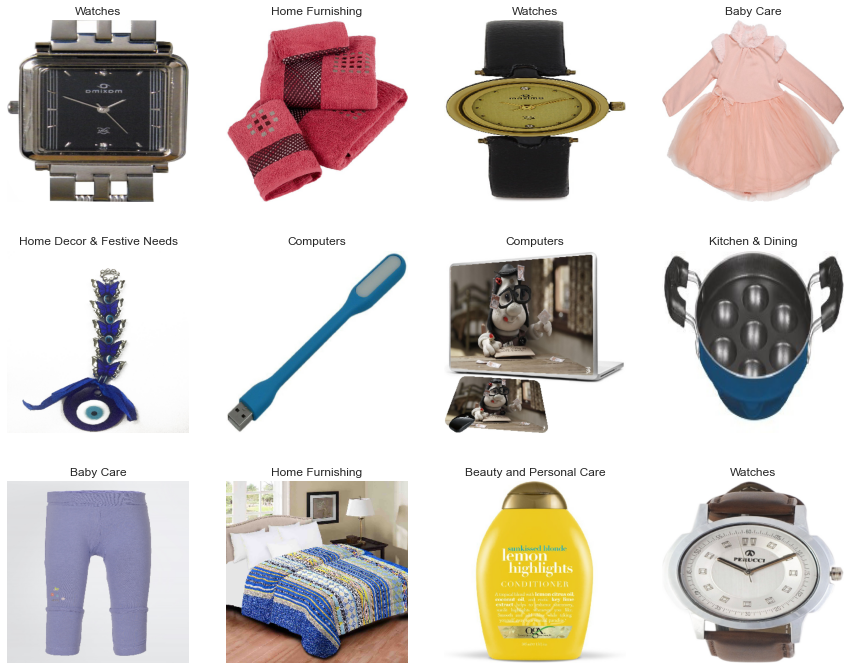

In [1612]:
# Display a few examples of photos and associated class name
a = train_generator.class_indices
class_names = list(a.keys()) # storing class names in a list
  
def plot_images(img,labels):
    plt.figure(figsize=[15,12])
    for i in range(12):
        plt.subplot(3,4,i+1)
        plt.imshow(img[i])
        plt.title(class_names[np.argmax(labels[i])])
        plt.axis('off')
          
plot_images(x,y)

### fine-tuning partiel of InceptionResNetV2

In [610]:
# load the InceptionResNetV2 architecture with imagenet weights as base
base_model = tf.keras.applications.InceptionResNetV2(
                     include_top=False,
                     weights='imagenet',
                     input_shape=(331,331,3)
                     )
  
base_model.trainable=False
# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.

# Adding layers. The last dense has 7 as dimension (7 categories)
model = tf.keras.Sequential([ 
        base_model,   
        tf.keras.layers.BatchNormalization(renorm=True),
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(7, activation='softmax')
    ])

In [611]:
model.compile(optimizer = 'Adam',
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])
# categorical cross entropy is taken since its used as a loss function for 
# multi-class classification problems where there are two or more output labels.
# using Adam optimizer for better performance
# other optimizers such as sgd can also be used depending upon the model

In [612]:
# early stopping call back
early = tf.keras.callbacks.EarlyStopping( patience=10,
                                          min_delta=0.001,
                                          restore_best_weights=True)

In [613]:
# Training the model
batch_size=32
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = validation_generator.n//validation_generator.batch_size
  
# fit model
history = model.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=validation_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=25,
                    callbacks=[early])

Epoch 1/25
24/26 [==========================>...] - ETA: 11s - loss: 1.2207 - accuracy: 0.5766

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


26/26 [==============================] - 193s 7s/step - loss: 1.1741 - accuracy: 0.5953 - val_loss: 0.5477 - val_accuracy: 0.8229
Epoch 2/25
26/26 [==============================] - 267s 10s/step - loss: 0.5329 - accuracy: 0.8365 - val_loss: 0.4726 - val_accuracy: 0.8594
Epoch 3/25
26/26 [==============================] - 194s 7s/step - loss: 0.3445 - accuracy: 0.8899 - val_loss: 0.4722 - val_accuracy: 0.8646
Epoch 4/25
26/26 [==============================] - 175s 7s/step - loss: 0.2565 - accuracy: 0.9196 - val_loss: 0.4217 - val_accuracy: 0.8906
Epoch 5/25
26/26 [==============================] - 257s 10s/step - loss: 0.2068 - accuracy: 0.9344 - val_loss: 0.4946 - val_accuracy: 0.8438
Epoch 6/25
26/26 [==============================] - 255s 10s/step - loss: 0.1582 - accuracy: 0.9579 - val_loss: 0.4784 - val_accuracy: 0.9010
Epoch 7/25
26/26 [==============================] - 256s 10s/step - loss: 0.1382 - accuracy: 0.9554 - val_loss: 0.4931 - val_accuracy: 0.9062
Epoch 8/25
26/26 [==

In [614]:
# Save the trained model as 'Model.InResNetV2_2'
model.save("Model.InResNetV2_2")

INFO:tensorflow:Assets written to: Model.InResNetV2_2\assets


INFO:tensorflow:Assets written to: Model.InResNetV2_2\assets


Text(0.5, 1.0, '\nTraining and Validation Accuracy. \nTrain Accuracy: 0.9839109182357788\nValidation Accuracy: 0.875')

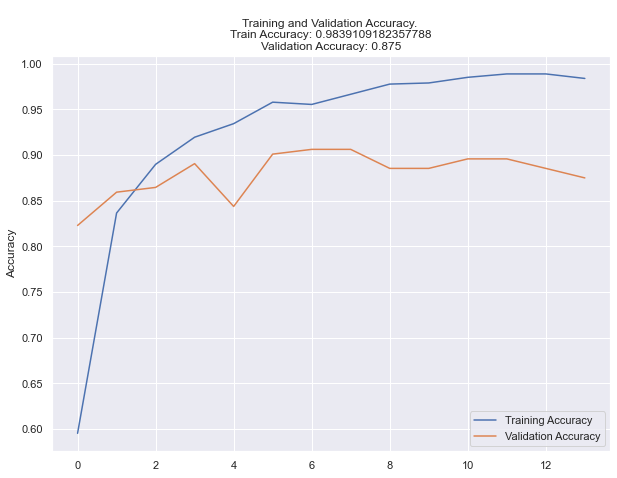

In [615]:
# store results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
  
# plot results
# accuracy
plt.figure(figsize=(10, 16))
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['font.size'] = 14
plt.rcParams['axes.grid'] = True
plt.rcParams['figure.facecolor'] = 'white'
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(acc[-1])}\nValidation Accuracy: {str(val_acc[-1])}')

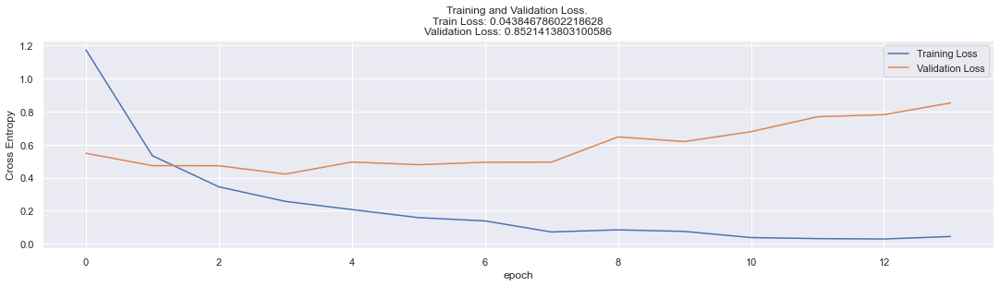

In [616]:
# loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.title(f'Training and Validation Loss. \nTrain Loss: {str(loss[-1])}\nValidation Loss: {str(val_loss[-1])}')
plt.xlabel('epoch')
plt.tight_layout(pad=3.0)
plt.show()

### fine-tuning partiel of NASNetMobile

In [1613]:
# Data augmentation and pre-processing using tensorflow
gen = ImageDataGenerator(
                  rescale=1./255.,
                  horizontal_flip = True,
                  validation_split = 0.2 # training: 80% data, validation: 20% data
                 )
  
train_generator = gen.flow_from_dataframe(
    data_image_class, # dataframe
    directory = photos_path, # images data path / folder in which images are there
    x_col = 'image',
    y_col = 'first_category',
    subset = "training",
    color_mode = "rgb",
    target_size = (224,224), # image height , image width
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True,
    seed = 73,
)
  
validation_generator = gen.flow_from_dataframe(
    data_image_class, # dataframe
    directory = photos_path, # images data path / folder in which images are there
    x_col = 'image',
    y_col = 'first_category',
    subset = "validation",
    color_mode="rgb",
    target_size = (224,224), # image height , image width
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True,
    seed = 73,
)

Found 840 validated image filenames belonging to 7 classes.
Found 210 validated image filenames belonging to 7 classes.


In [1614]:
x,y = next(train_generator)
x.shape # input shape of one record is (224,224,3),32: is the batch size

(32, 224, 224, 3)

In [1615]:
# load the NASNetMobile architecture with imagenet weights as base
base_model = tf.keras.applications.NASNetMobile(
                     include_top=False,
                     weights='imagenet',
                     input_shape=(224,224,3)
                     )
  
base_model.trainable=False
# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.

# Adding layers. The last dense has 7 as dimension (7 categories)
model = tf.keras.Sequential([ 
        base_model,   
        tf.keras.layers.BatchNormalization(renorm=True),
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(7, activation='softmax')
    ])

20004864/19993432 [==============================] - 0s 0us/step


In [1616]:
model.compile(optimizer = 'Adam',
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])
# categorical cross entropy is taken since its used as a loss function for 
# multi-class classification problems where there are two or more output labels.
# using Adam optimizer for better performance
# other optimizers such as sgd can also be used depending upon the model

# early stopping call back
early = tf.keras.callbacks.EarlyStopping(patience=10,
                                        min_delta=0.001,
                                        restore_best_weights=True)

# Training the model
batch_size=32
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = validation_generator.n//validation_generator.batch_size
  
# fit model
history = model.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=validation_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=25,
                    callbacks=[early])

Epoch 1/25
26/26 [==============================] - 58s 2s/step - loss: 1.1710 - accuracy: 0.6040 - val_loss: 0.6905 - val_accuracy: 0.7656
Epoch 2/25
26/26 [==============================] - 41s 2s/step - loss: 0.5416 - accuracy: 0.8205 - val_loss: 0.5382 - val_accuracy: 0.8281
Epoch 3/25
26/26 [==============================] - 42s 2s/step - loss: 0.3673 - accuracy: 0.8787 - val_loss: 0.4785 - val_accuracy: 0.8594
Epoch 4/25
26/26 [==============================] - 42s 2s/step - loss: 0.2505 - accuracy: 0.9245 - val_loss: 0.5398 - val_accuracy: 0.8229
Epoch 5/25
26/26 [==============================] - 41s 2s/step - loss: 0.1521 - accuracy: 0.9493 - val_loss: 0.5827 - val_accuracy: 0.8385
Epoch 6/25
26/26 [==============================] - 42s 2s/step - loss: 0.1004 - accuracy: 0.9728 - val_loss: 0.5945 - val_accuracy: 0.8177
Epoch 7/25
26/26 [==============================] - 39s 2s/step - loss: 0.0495 - accuracy: 0.9839 - val_loss: 0.5411 - val_accuracy: 0.8698
Epoch 8/25
26/26 [==

In [1617]:
# Save the trained model as 'Model.NASNetMobile'
model.save("Model.NASNetMobile")

INFO:tensorflow:Assets written to: Model.NASNetMobile\assets


INFO:tensorflow:Assets written to: Model.NASNetMobile\assets


Text(0.5, 1.0, '\nTraining and Validation Accuracy. \nTrain Accuracy: 0.9938119053840637\nValidation Accuracy: 0.8229166865348816')

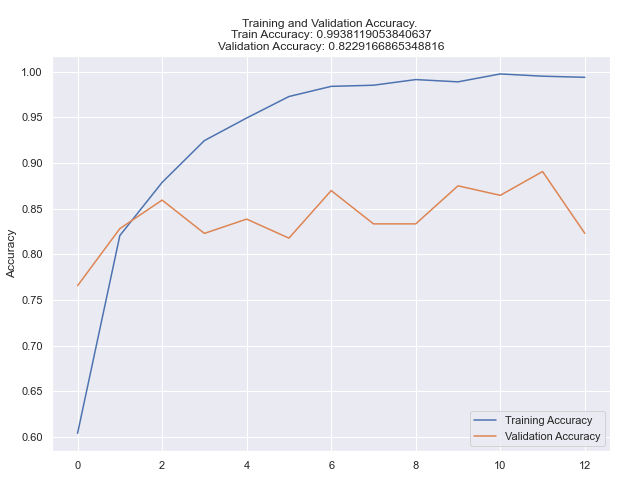

In [1618]:
# store results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
  
# plot results
# accuracy
plt.figure(figsize=(10, 16))
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['font.size'] = 14
plt.rcParams['axes.grid'] = True
plt.rcParams['figure.facecolor'] = 'white'
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(acc[-1])}\nValidation Accuracy: {str(val_acc[-1])}')

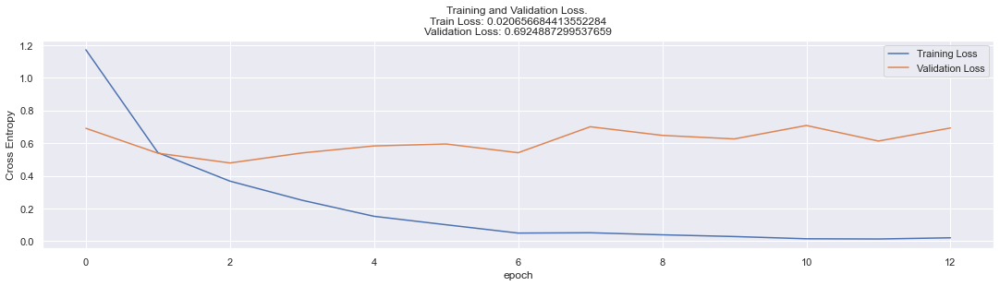

In [1619]:
# loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.title(f'Training and Validation Loss. \nTrain Loss: {str(loss[-1])}\nValidation Loss: {str(val_loss[-1])}')
plt.xlabel('epoch')
plt.tight_layout(pad=3.0)
plt.show()